<a href="https://colab.research.google.com/github/dolmani38/concept_drift/blob/main/Generative-CDTL_0903.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Concept drift tolerant machine learning method

In [1]:
import numpy as np
import pandas as pd
import torch
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [3]:
import random
import os
def seed_everything(seed: int = 46):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    #tf.random.set_seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)

# 실험을 위한 기본적인 function 들...

In [4]:
import sys, os
import math

from torch.autograd import Variable
from argparse import Namespace
#from FRTrain_arch import Generator, DiscriminatorF, DiscriminatorR, weights_init_normal, test_model
#from FRTrain_arch import weights_init_normal, test_model
import warnings
warnings.filterwarnings("ignore")

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

In [5]:
main_figsize=(15,3)

plt.rc('font', size=10)        # 기본 폰트 크기
plt.rc('axes', labelsize=10)   # x,y축 label 폰트 크기
plt.rc('xtick', labelsize=10)  # x축 눈금 폰트 크기
plt.rc('ytick', labelsize=10)  # y축 눈금 폰트 크기
plt.rc('legend', fontsize=10)  # 범례 폰트 크기
plt.rc('figure', titlesize=10) # figure title 폰트 크기


In [6]:
def weights_init_normal(m):
    """Initializes the weight and bias of the model.

    Args:
        m: A torch model to initialize.

    Returns:
        None.
    """

    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0.0)
    elif classname.find('Linear') != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.2)
        torch.nn.init.constant_(m.bias.data, 0)


In [7]:
# Define the Generator
# bucket에 대해 x를 전처리
class Generator(nn.Module):

    def __init__(self,input_dim):
        super(Generator, self).__init__()

        self.input_dim = input_dim
        self.fc1 = nn.ModuleList()
        #self.fc2 = nn.ModuleList()
        self.fc3 = nn.ModuleList()

        for i in range(self.input_dim):
            self.fc1.append(nn.Linear(2, self.input_dim*10))
            #self.fc2.append(nn.BatchNorm1d(num_features=50))
            self.fc3.append(nn.Linear(self.input_dim*10, 1))

        #self.fc = nn.Linear(input_dim, input_dim)

    def forward(self,x,b):
        pxy = []
        for i in range(self.input_dim):
            h0 = self.fc1[i](torch.cat((x[:,i].reshape(-1,1),b), 1))
            #h1 = F.relu(self.fc2[i](h0))
            #h2 = self.fc3[i](h1)
            h2 = self.fc3[i](F.relu(h0))
            pxy.append(h2)

        #return self.fc(torch.tensor(torch.cat(pxy, dim=1), requires_grad = True))
        return torch.cat(pxy, dim=1)


In [8]:
# Define the Discriminator
# 비즈니스에 해당하는 모델
class Discriminator(nn.Module):

    def __init__(self, input_dim=5):
        """Initializes Discriminator with torch components."""
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, input_dim*4),
            nn.ReLU(),
            nn.Linear(input_dim*4, input_dim),
            nn.ReLU(),
            nn.Linear(input_dim, 1),
            nn.Sigmoid()
        )

    def forward(self, input_data):
        """Defines a forward operation of the model.

        Args:
            input_data: The input data.

        Returns:
            The predicted label (y_hat) for the given input data.
        """

        output = self.model(input_data)
        return output


In [9]:
from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score
import scipy

def test_model(model_,model2_, train_tensors, test_tensors, avaible_range,columns):
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    XS_train = train_tensors.XS_train.to(device)
    y_train = train_tensors.y_train
    #s1_train = train_tensors.s1_train.to(device)

    XS_test = test_tensors.XS_test.to(device)
    y_test = test_tensors.y_test

    model_.eval()

    b_dim = XS_test.shape[1]-1

    #test_analysis = {}
    XS = XS_train[:,b_dim].cpu().data.numpy()
    '''
    for bk in np.unique(XS,axis = 0):
        test_analysis[f'Sum(MI{bk})']= []
        test_analysis[f'Std(MI{bk})']= []
        test_analysis[f'Ent(MI{bk})']= []

        test_analysis[f'Sum(DR{bk})']= []
        test_analysis[f'Std(DR{bk})']= []
        test_analysis[f'Ent(DR{bk})']= []

    test_analysis['TrainSum(MI)']= []
    test_analysis['TrainStd(MI)']= []
    test_analysis['TrainEnt(MI)']= []

    test_analysis['Test Sum(MI)']= []
    test_analysis['Test Std(MI)']= []
    test_analysis['Test Ent(MI)']= []

    test_analysis['Test Sum(DR)']= []
    test_analysis['Test Std(DR)']= []
    test_analysis['Test Ent(DR)']= []
    '''
    if model2_ == None:
        ax = XS_test[:,0:b_dim]
        ref_ax = XS_train[:,0:b_dim]
    else:
        model2_.eval()
        ax = model2_(XS_test[:,0:b_dim],XS_test[:,b_dim].reshape(-1,1)/avaible_range)
        ref_ax = model2_(XS_train[:,0:b_dim],XS_train[:,b_dim].reshape(-1,1)/avaible_range)

    y_hat = model_(ax)
    y_hat = (y_hat.cpu().data.numpy()> 0.5).astype(float)

    ty_ = y_test.data.numpy()
    f1 = f1_score(ty_,y_hat)
    '''
    #################### Test (f(x'),y) #########################
    ax_df = pd.DataFrame(ax.cpu().data.numpy(),columns=columns)
    mi_scores = make_mi_scores(ax_df, ty_, discrete_features="auto")
    #test_analysis['Test Sum(MI)'].append(np.sum(mi_scores))
    #test_analysis['Test Std(MI)'].append(np.std(mi_scores))
    #test_analysis['Test Ent(MI)'].append(scipy.stats.entropy(mi_scores))

    ks = __ks_drift(ax_df.values,XS_test[:,0:b_dim].cpu().data.numpy())
    #test_analysis['Test Sum(DR)'].append(np.sum(ks[:,0]))
    #test_analysis['Test Std(DR)'].append(np.std(ks[:,0]))
    #test_analysis['Test Ent(DR)'].append(scipy.stats.entropy(ks[:,0]))

    #################### Train (f(x'),y) #########################
    ax_df = pd.DataFrame(ref_ax.cpu().data.numpy(),columns=columns)
    mi_scores = make_mi_scores(ax_df, y_train.data.numpy(), discrete_features="auto")
    #test_analysis['TrainSum(MI)'].append(np.sum(mi_scores))
    #test_analysis['TrainStd(MI)'].append(np.std(mi_scores))
    #test_analysis['TrainEnt(MI)'].append(scipy.stats.entropy(mi_scores))

    #################### Train (f(x'_b),y_b) #########################
    '''
    '''
    for bk in np.unique(XS,axis = 0):
        inx = np.where(XS==bk)[0]
        #print(XS_train[:,b_dim].cpu().data.numpy())
        if model2_ == None:
            ax = XS_train[inx][:,0:b_dim]
        else:
            ax = model2_(XS_train[inx][:,0:b_dim],XS_train[inx][:,b_dim].reshape(-1,1)/avaible_range)


        ty_ = y_train[inx].data.numpy()

        ax_df = pd.DataFrame(ax.cpu().data.numpy(),columns=columns)
        mi_scores = make_mi_scores(ax_df, ty_, discrete_features="auto")
        #test_analysis[f'Sum(MI{bk})'].append(np.sum(mi_scores))
        #test_analysis[f'Std(MI{bk})'].append(np.std(mi_scores))
        #test_analysis[f'Ent(MI{bk})'].append(scipy.stats.entropy(mi_scores))

        ks = __ks_drift(XS_train[:,0:b_dim].cpu().data.numpy(),ax_df.values)
        #test_analysis[f'Sum(DR{bk})'].append(np.sum(ks[:,0]))
        #test_analysis[f'Std(DR{bk})'].append(np.std(ks[:,0]))
        #test_analysis[f'Ent(DR{bk})'].append(scipy.stats.entropy(ks[:,0]))
    '''
    print("Test f1 score: {}".format(f1))

    #test_analysis_df = pd.DataFrame(test_analysis)
    #print(test_analysis_df)

    return f1#,test_analysis_df

In [10]:

def test_all_data(discriminator,generator,X_train, X_live, Y_live, train_size, test_size, avaible_range, columns, ShowChart = False,bucket_size_array=[200]):

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    print('X_live.shape',X_live.shape)
    b_dim = X_live.shape[1]-1
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]
        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = xl.shape[0] #truncate_count + len(xl)
            break


    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = torch.tensor(np.asarray(X_live_set),dtype=torch.float32).to(device)
    Y_live_set = np.asarray(Y_live_set)

    f1s = []
    MISS = {}
    DRF = {}
    for col in columns:
        MISS[col] = []
        DRF[col] = []

    print('Search MI & Drift...for X_live_set',X_live_set.shape)
    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        if generator == None:
            xs = X_live_unit[:,0:b_dim]
        else:
            xs = generator(X_live_unit[:,0:b_dim],X_live_unit[:,b_dim].reshape(-1,1)/avaible_range)
        predicted_y = discriminator(xs)
        predicted_y = (predicted_y.cpu().data.numpy()> 0.5).astype(float)
        f1_ = f1_score(Y_live_unit,predicted_y)
        #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
        f1s.append(f1_)

        cpu_xs = xs.cpu().data.numpy()
        mi_scores = make_mi_scores(pd.DataFrame(cpu_xs,columns=columns), Y_live_unit, discrete_features="auto")
        ks = __ks_drift(X_train.values,cpu_xs)
        for ix,col in enumerate(columns):
            MISS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MISS)
    df_drf = pd.DataFrame(DRF)

    if ShowChart:
        plt.figure(figsize=main_figsize)
        plt.plot(f1s,linewidth=1)
        plt.ylabel('F1 Score')
        plt.xlabel(f'bucket ({test_size})')
        plt.show()

        df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

        df_drf.plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

    print(f'mean of drift:\n{df_drf.mean()}')
    print('Mean F1 for all data:',np.mean(f1s))

    return f1s, df_mis, df_drf

In [11]:
H=20

class Net(nn.Module):
    def __init__(self,input_dim):
        super(Net, self).__init__()
        self.input_dim = input_dim
        self.fc1 = nn.ModuleList()
        self.fc2 = nn.ModuleList()
        self.fc3 = nn.ModuleList()
        #self.fc4 = nn.ModuleList()

        for i in range(self.input_dim):
            self.fc1.append(nn.Linear(1, H))
            self.fc2.append(nn.Linear(1, H))
            self.fc3.append(nn.Linear(H, 1))

    def forward(self, x, y):
        h = []
        for i in range(self.input_dim):
            h0 = F.relu(self.fc1[i](x[:,i].reshape(-1,1))+self.fc2[i](y.reshape(-1,1)))
            h1 = self.fc3[i](h0)
            h.append(h1)

        mi = torch.cat(h, dim=1)
        return mi

class customLoss(nn.Module):
    def __init__(self, model):
        super(customLoss, self).__init__()
        self.model = model

    def forward(self, x,y):
        minibatch = int(x.shape[0] * 0.8)
        s = np.random.choice(x.shape[0],minibatch)
        #x_sample = Variable(torch.from_numpy(x[s,:]).type(torch.FloatTensor), requires_grad = True)
        #y_sample = Variable(torch.from_numpy(y[s]).type(torch.FloatTensor), requires_grad = True)
        #y_shuffle = Variable(torch.from_numpy(np.random.permutation(y[s])).type(torch.FloatTensor), requires_grad = True)
        x_sample = x[s,:] #Variable(x[s,:], requires_grad = True)
        y_sample = y[s] #Variable(, requires_grad = True)
        y_shuffle = y[torch.randperm(minibatch)] #Variable(, requires_grad = True)
        p_xy = self.model(x_sample, y_sample)
        p_x_y = self.model(x_sample, y_shuffle)
        ret = torch.mean(p_xy,0) - torch.log(torch.mean(torch.exp(p_x_y),0))
        loss = - ret

        return loss #, ret.sum().reshape(-1,)

In [12]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model(train_tensors, test_tensors, train_opt, lambda_f, avaible_range, alpha, columns,ShowChart = False, do_mine=True):
    #seed_everything()

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(device)

    lambda_f = torch.tensor([lambda_f],dtype=torch.float32).to(device)

    XS_train = train_tensors.XS_train.to(device)
    y_train = train_tensors.y_train.to(device)
    #s1_train = train_tensors.s1_train.to(device)

    XS_test = test_tensors.XS_test.to(device)
    y_test = test_tensors.y_test.to(device)
    #s1_test = test_tensors.s1_test.to(device)

    # Saves return values here
    #test_result = []

    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch

    b_dim = XS_train.shape[1]-1

    # The loss values of each component will be saved in the following lists.
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    a_losses = []
    m_losses =[]
    f_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss(reduce=False)  # mean square error

    # Initializes generator and discriminator
    discriminator = Discriminator(b_dim).to(device)
    discriminator.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(discriminator.parameters(), lr=train_opt.lr_g)

    train_len = XS_train.shape[0]


    adapter = Generator(b_dim).to(device)
    #adapter.apply(weights_init_normal)

    optimizer_A = torch.optim.Adam(adapter.parameters(), lr=0.001)

    mine = Net(b_dim).to(device)

    mine_loss = customLoss(mine).to(device)
    optimizer_M = torch.optim.Adam(mine_loss.parameters(), lr=0.001)
    #kld_loss = nn.KLDivLoss(reduction='batchmean')
    default_value = torch.tensor([0.5],dtype=torch.float32).to(device)
    for epoch in tqdm(range(n_epochs)):


        # -------------------------------
        #  b에 대한 x의 전처리
        # -------------------------------

        if lambda_f >= 0.0:
            xs = adapter(XS_train[:,0:b_dim],XS_train[:,b_dim].reshape(-1,1)/avaible_range) # z0, b

            #org = torch.histc(XS_train[:,0:b_dim], bins=100, min=0, max=1)
            #trg = torch.histc(xs, bins=100, min=0, max=1)

            ml = torch.mean(mse_loss(xs, XS_train[:,0:b_dim]),dim=0)

            ## distribution의 변차를 최소화 한다. kld_loss ??
            #kl = torch.mean(kld_loss(trg.log(), org),dim=0)
            #
            a_loss =  torch.sum(ml) + torch.std(ml)
        else:
            xs = XS_train[:,0:b_dim]
            a_loss = torch.tensor(0.0)

        # -------------------
        #  Forwards Generator
        # -------------------
        #xs = torch.cat((XS_train[:,0:4], a_z.reshape(-1,1)), 1)
        #print(xs.shape)
        gen_y = discriminator(xs).reshape(-1,1)
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1)) #+ torch.log(mine_loss.mean()+1)*0.001

        optimizer_A.zero_grad()
        #optimizer_M.zero_grad()
        optimizer_G.zero_grad()
        '''
        if lambda_f >= 0.0:
            # -------------------
            #  Forwards MINE
            # -------------------

            xs_test = adapter(XS_test[:,0:b_dim],XS_test[:,b_dim].reshape(-1,1)/avaible_range)
            #x_sample = Variable(torch.clone(xs_test), requires_grad = True)

            m_loss, lmd = mine_loss(xs_test,
                                    y_test, #generator(xs_test).reshape(-1,1),
                                    default_value)

            m_losses.append(-m_loss.cpu().data.numpy())
            f_losses.append(lmd.cpu().data.numpy())

            m_loss = m_loss.sum() * 0.01
            #m_loss.mean().backward()

            #lambda_f = lmd #.detach()
        else:
            m_loss = torch.tensor(0.0)
        '''

        lambda1 = 0.7

        if lambda_f >= 0.0:
            #loss =  lambda1*g_loss + (1-lambda1)*a_loss + torch.std(torch.tensor((g_loss,a_loss)))   #(1.0-lambda_f) * g_loss + lambda_f * a_loss + m_loss.mean()*0.01
            loss =  g_loss + a_loss + torch.std(torch.tensor((g_loss,a_loss)))
        else:
            loss = g_loss

        loss.backward()

        optimizer_G.step()
        #optimizer_M.step()
        optimizer_A.step()

        a_losses.append(a_loss.cpu().data.numpy())
        g_losses.append(g_loss.cpu().data.numpy())

        '''
        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [a loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, a_losses[-1], g_losses[-1])
                )
        '''
        if lambda_f < 0.0:
            adapter = None

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    f1 = test_model(discriminator,adapter, train_tensors, test_tensors, avaible_range,columns)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    df_loss = pd.DataFrame({'Generator loss':a_losses,'Predictor loss':g_losses})
    if ShowChart:
        df_loss.plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel=f'bucket ({XS_train.shape[0]})',fontsize=15)
        plt.legend(loc=1)
        plt.show()
    '''
    if lambda_f >= 0.0:
        plt.figure(figsize=main_figsize)
        mi_df = pd.DataFrame(m_losses,columns=columns)
        mi_df.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='epoch',fontsize=10)
        plt.legend(bbox_to_anchor=(1.0, 1.0))
        plt.show()

        plt.figure(figsize=main_figsize)
        #plt.plot(a_losses,linewidth=1,label='Adapter loss')
        #plt.plot(g_losses,linewidth=1,label='classifier loss')
        plt.plot(f_losses,linewidth=1,label='lambda')
        plt.ylabel('lambda')
        plt.xlabel('epoch')
        plt.legend(loc=1,ncol=1)
        plt.show()
    '''
    return f1,discriminator,adapter,df_loss

In [13]:
plt.style.use('bmh')

def __ks_2samp2(sample1, sample2):
    # Gets all observations
    sample1 = np.sort(sample1)
    sample2 = np.sort(sample2)
    n1 = sample1.shape[0]
    n2 = sample2.shape[0]
    data_all = np.concatenate([sample1, sample2])
    cdf1 = np.searchsorted(sample1, data_all, side='right') / n1
    cdf2 = np.searchsorted(sample2, data_all, side='right') / n2
    # Evaluates the KS statistic
    cddiffs = cdf1 - cdf2
    minS = -np.min(cddiffs)
    maxS = np.max(cddiffs)
    ks_stat =  max(minS, maxS)

    #if ks_stat == minS:
    #    ks_stat = -ks_stat

    # Calculates the P-Value based on the two-sided test
    # The P-Value comes from the KS Distribution Survival Function (SF = 1-CDF)
    m, n = float(n1), float(n2)
    en = m * n / (m + n)
    p_value = 0.0 #stats.kstwobign.sf(math.sqrt(en) * abs(ks_stat))
    #p_value = stats.kstwobign.sf(en * abs(ks_stat))
    return ks_stat,p_value

def __ks_drift(ref_x,inf_x):
    x_drift = np.zeros((ref_x.shape[1],2))
    for i in range(ref_x.shape[1]):
        #s, p = ks_2samp(ref_x[:,i],inf_x[:,i],mode='asymp')
        s, p = __ks_2samp2(ref_x[:,i],inf_x[:,i])
        x_drift[i,0] = s
        x_drift[i,1] = p
    return x_drift

In [14]:
from sklearn.feature_selection import mutual_info_regression, mutual_info_classif

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_classif(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

In [15]:
from tqdm import tqdm
from sklearn.preprocessing import MinMaxScaler, StandardScaler

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

def check_mi_drift(X:pd.DataFrame,Y:np.array,train_size:int,test_size:int):

    mi_scores = make_mi_scores(X, Y, discrete_features="auto")
    #print(mi_scores)
    print(f'MI Analysis MI Max {np.max(mi_scores):.5f}, Min {np.min(mi_scores):.5f}, Mean {np.mean(mi_scores):.5f}, Std {np.std(mi_scores):.5f}')

    columns = X.columns
    scaler_c1 = MinMaxScaler()
    # trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
    X = pd.DataFrame(np.concatenate((scaler_c1.fit_transform(X[0:train_size]), scaler_c1.transform(X[train_size:])),axis=0), columns=columns)

    X_train = X[:train_size]
    Y_train = Y[:train_size]

    X_test = X[test_size:train_size+test_size]
    Y_test = Y[test_size:train_size+test_size]

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    print('Dataset structure X_train,',X_train.shape,'X_test,',X_test.shape,'X_live',X_live.shape)
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]

        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            #print(xl.shape)
            truncate_count = xl.shape[0] #truncate_count + len(xl)
            break

    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = np.asarray(X_live_set)
    Y_live_set = np.asarray(Y_live_set)

    MIS = {}
    DRF = {}
    for col in columns:
        MIS[col] = []
        DRF[col] = []

    print('Search MI & Drift...for X_live_set',X_live_set.shape)
    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        X_live_unit = pd.DataFrame(X_live_unit,columns = columns)
        mi_scores = make_mi_scores(X_live_unit, Y_live_unit, discrete_features="auto")
        ks = __ks_drift(X_train.values,X_live_unit.values)
        for ix,col in enumerate(columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)

    for c_name in df_mis.columns:
        fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
        df_mis[c_name].plot(ax=ax[0],linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',legend=None)
        ax[0].set_title(f'Mutual Information of {c_name}',fontdict={'fontsize':10})

        df_drf[c_name].plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})')
        ax[1].set_title(f'Drift (KS-test) of {c_name}',fontdict={'fontsize':10})
        ax[1].legend(bbox_to_anchor=(1.0, 1.0))
        plt.show()

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    df_mis.plot(ax=ax[0],linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',legend=None)
    ax[0].set_title(f'Mutual Information',fontdict={'fontsize':10})

    df_drf.plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})')
    ax[1].set_title(f'Drift (KS-test)',fontdict={'fontsize':10})
    ax[1].legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    return X,Y

In [16]:
import copy
import torch.optim as optim

def train_classificaion_model(X,Y,train_size, test_size):
    seed_everything()

    mi_scores = make_mi_scores(X[test_size:test_size+train_size], Y[test_size:test_size+train_size], discrete_features="auto")
    #print(mi_scores)
    print(f'MI Analysis MI Max {np.max(mi_scores):.5f}, Min {np.min(mi_scores):.5f}, Mean {np.mean(mi_scores):.5f}, Std {np.std(mi_scores):.5f}')

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(device)
    # Convert to 2D PyTorch tensors
    X_train = torch.tensor(X[:train_size].values, dtype=torch.float32).to(device)
    y_train = torch.tensor(Y[:train_size], dtype=torch.float32).reshape(-1, 1).to(device)

    X_test = torch.tensor(X[test_size:test_size+train_size].values, dtype=torch.float32).to(device)
    y_test = torch.tensor(Y[test_size:test_size+train_size], dtype=torch.float32).reshape(-1, 1).to(device)

    in_dim = X_train.shape[1]
    # Define the model
    model = nn.Sequential(
        nn.Linear(in_dim, in_dim*4),
        nn.ReLU(),
        nn.Linear(in_dim*4, in_dim),
        nn.ReLU(),
        nn.Linear(in_dim, 1),
        nn.Sigmoid()
    ).to(device)

    # loss function and optimizer
    loss_fn = nn.BCELoss()  # mean square error
    optimizer = optim.Adam(model.parameters(), lr=0.0001)

    n_epochs = 1000   # number of epochs to run
    batch_size = 100  # size of each batch
    batch_start = torch.arange(0, len(X_train), batch_size)

    # Hold the best model
    best_mse = np.inf   # init to infinity
    best_weights = None
    history = []

    for epoch in tqdm(range(n_epochs)):
        model.train()
        with tqdm(batch_start, unit="batch", mininterval=0, disable=True) as bar:
            bar.set_description(f"Epoch {epoch}")
            for start in bar:
                # take a batch
                X_batch = X_train[start:start+batch_size]
                y_batch = y_train[start:start+batch_size]
                # forward pass
                y_pred = model(X_batch)
                loss = loss_fn(y_pred, y_batch)
                # backward pass
                optimizer.zero_grad()
                loss.backward()
                # update weights
                optimizer.step()
                # print progress
                bar.set_postfix(mse=float(loss))
        # evaluate accuracy at end of each epoch
        model.eval()
        y_pred = model(X_test)
        mse = loss_fn(y_pred, y_test)
        mse = float(mse)
        history.append(mse)
        if mse < best_mse:
            best_mse = mse
            best_weights = copy.deepcopy(model.state_dict())

    # restore model and return best accuracy
    model.load_state_dict(best_weights)
    print("MSE: %.2f" % best_mse)
    print("RMSE: %.2f" % np.sqrt(best_mse))
    plt.plot(history)
    plt.show()

    from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score
    predicted_y = model(X_test)
    f1_ = f1_score(y_test.cpu().data.numpy(),(predicted_y.cpu().data.numpy()> 0.5).astype(float))
    print(f'F1 Score:{f1_:.5f}')

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    print('Dataset structure X_train,',X_train.shape,'X_test,',X_test.shape,'X_live',X_live.shape)
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]
        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = truncate_count + len(xl)

    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = torch.tensor(np.asarray(X_live_set), dtype=torch.float32).to(device)
    Y_live_set = np.asarray(Y_live_set)

    f1s = []

    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        predicted_y = model(X_live_unit)
        predicted_y = (predicted_y.cpu().data.numpy()> 0.5).astype(float)
        f1_ = f1_score(Y_live_unit,predicted_y)
        f1s.append(f1_)

    plt.figure(figsize=main_figsize)
    plt.plot(f1s,linewidth=1)
    plt.ylabel('F1 score')
    plt.xlabel(f'bucket ({test_size})')
    #plt.title('Changes of F1 score according to bucket')
    plt.show()

    result_table3 = {}
    #result_table3['lambda']=[]
    result_table3['test_f1']=[]
    result_table3['init_f1']=[]
    result_table3['mean_f1']=[]
    result_table3['last_f1']=[]
    result_table3['SUM(MI)']=[]

    #result_table3['lambda'].append('Case #1 Feature 5')
    result_table3['test_f1'].append(f1_)
    result_table3['init_f1'].append(f1s[0])
    result_table3['mean_f1'].append(np.mean(f1s))
    result_table3['last_f1'].append(f1s[-1])
    result_table3['SUM(MI)'].append(np.sum(mi_scores))

    result = pd.DataFrame(result_table3)
    print(result)
    return model, result

In [17]:
# importing the modules
from IPython.display import display

def drift_tolerant(X, Y,train_size, test_size,avaible_range = 400,lambda_f2 = 1.0,trial_count=20):

    seed_everything()

    print('trial_count:',trial_count)
    columns = X.columns[:-1]
    X_train = X[:train_size]
    Y_train = Y[:train_size]

    X_test = X[test_size:train_size+test_size]
    Y_test = Y[test_size:train_size+test_size]

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    train_tensors = Namespace(XS_train = torch.tensor(X_train.values, dtype=torch.float32),
                            y_train = torch.tensor(Y_train, dtype=torch.float32))
    test_tensors = Namespace(XS_test = torch.tensor(X_test.values, dtype=torch.float32),
                            y_test = torch.tensor(Y_test, dtype=torch.float32))

    train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)

    lambda_f_set = np.asarray([[-0.1,0.0] for v in range(trial_count)]).reshape(-1,) # np.concatenate([[-0.1 for v in range(trial_count)],[0.0 for v in range(trial_count)]])
    lambda_a2 = 0.0

    print('lambda_f2',lambda_f2)
    result_table0 = {} # Original
    result_table1 = {} # Drift tolerant
    # Original
    infos2 = {}
    result_table2 = {}
    result_table2['Trial']=[]
    result_table2['test_f1']=[]
    result_table2['init_f1']=[]
    result_table2['mean_f1']=[]
    result_table2['last_f1']=[]
    # Drift tolerant
    infos3 = {}
    result_table3 = {}
    result_table3['Trial']=[]
    result_table3['test_f1']=[]
    result_table3['init_f1']=[]
    result_table3['mean_f1']=[]
    result_table3['last_f1']=[]


    for idx,lambda_f in enumerate(lambda_f_set):
        if lambda_f < 0.0:

            idx = len(result_table2['test_f1'])
            print(f'######################### Trial {idx} for Normal model ###########################')
        else:
            idx1 = len(result_table3['test_f1']) #idx-int(len(lambda_f_set)/2)
            print(f'######################### Trial {idx1} for Drift tolerant model ###########################')

        f1,last_discriminator, last_adapter, df_loss = train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, avaible_range = avaible_range, alpha= lambda_f2,columns = columns)# 0.00057)
        tad,df_mis,df_drf = test_all_data(last_discriminator,last_adapter,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
        if lambda_f < 0.0:
            result_table0[f'T{idx}'] = tad
            result_table2['Trial'].append(idx)

            infos2[f'T{idx}'] = (df_loss,df_mis,df_drf)
            result_table2['test_f1'].append(f1)
            result_table2['init_f1'].append(tad[0])
            result_table2['mean_f1'].append(np.mean(tad))
            result_table2['last_f1'].append(tad[-1])
            '''
            for clm in test_analysis.columns:
                if clm not in result_table2:
                    result_table2[clm] = []
                result_table2[clm].append(test_analysis[clm].values[0])
            '''
        else:
            #idx1 = idx-int(len(lambda_f_set)/2)
            result_table1[f'T{idx1}'] = tad
            result_table3['Trial'].append(idx1)

            infos3[f'T{idx1}'] = (df_loss,df_mis,df_drf)
            result_table3['test_f1'].append(f1)
            result_table3['init_f1'].append(tad[0])
            result_table3['mean_f1'].append(np.mean(tad))
            result_table3['last_f1'].append(tad[-1])
            '''
            for clm in test_analysis.columns:
                if clm not in result_table3:
                    result_table3[clm] = []
                result_table3[clm].append(test_analysis[clm].values[0])
            '''

            print('Normal model mean        :',np.mean(result_table2['mean_f1']))
            print('Drift tolerant model mean:',np.mean(result_table3['mean_f1']))


    Orginal_df = pd.DataFrame(result_table0)
    Driftto_df = pd.DataFrame(result_table1)

    original_statistics_df = pd.DataFrame(result_table2)
    drift_statistics_df = pd.DataFrame(result_table3)

    original_statistics_df.loc[len(original_statistics_df)] = original_statistics_df.mean()
    original_statistics_df.loc[len(original_statistics_df)] = original_statistics_df[0:len(original_statistics_df)-1].sem()
    original_statistics_df.at[len(original_statistics_df)-2,'Trial'] = 'mean'
    original_statistics_df.at[len(original_statistics_df)-1,'Trial'] = 'sem'

    drift_statistics_df.loc[len(drift_statistics_df)] = drift_statistics_df.mean()
    drift_statistics_df.loc[len(drift_statistics_df)] = drift_statistics_df[0:len(drift_statistics_df)-1].sem()
    drift_statistics_df.at[len(drift_statistics_df)-2,'Trial'] = 'mean'
    drift_statistics_df.at[len(drift_statistics_df)-1,'Trial'] = 'sem'

    fig, ax = plt.subplots(figsize=main_figsize)

    Orginal_df.T.plot.box(ax = ax, showfliers=False,ylabel='F1 Score',fontsize=10,color='blue')
    ax.set_xticks([])
    Orginal_med_df = pd.concat([pd.DataFrame({'med':None},index=[0]), pd.DataFrame({'med':Orginal_df.T.median().values})],axis=0).reset_index(drop=True)
    Orginal_med_df.plot(ax = ax,linestyle='--',linewidth=1,ylabel='F1 Score',fontsize=10,color='blue')

    flierprops = dict(marker='.', markerfacecolor='green', markeredgecolor='none')
    Driftto_df.T.plot.box(ax=ax, flierprops=flierprops,ylabel='F1 Score',fontsize=10,color='green')
    Driftto_med_df = pd.concat([pd.DataFrame({'med':None},index=[0]), pd.DataFrame({'med':Driftto_df.T.median().values})],axis=0).reset_index(drop=True)
    Driftto_med_df.plot(ax = ax,linestyle='--',linewidth=1,ylabel='F1 Score',fontsize=10,color='green')

    ax.legend(['Normal model','Drift tolerant model'],ncol=2,bbox_to_anchor=(1.0, 1.0))
    leg = ax.get_legend()
    leg.legendHandles[0].set_color('blue')
    leg.legendHandles[1].set_color('green')

    ax.set_title('Comparison of F1 score between normal model and drift tolerant model',fontdict={'fontsize':10})
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize)

    Orginal_df.T.plot.box(ax = ax, showfliers=False,ylabel='F1 Score',fontsize=10,color='blue')
    ax.set_xticks([])
    Orginal_med_df = pd.concat([pd.DataFrame({'med':None},index=[0]), pd.DataFrame({'med':Orginal_df.T.median().values})],axis=0).reset_index(drop=True)
    Orginal_med_df.plot(ax = ax,linestyle='--',linewidth=1,ylabel='F1 Score',fontsize=10,color='blue')

    #flierprops = dict(marker='.', markerfacecolor='green', markeredgecolor='none')
    Driftto_df.T.plot.box(ax=ax, showfliers=False,ylabel='F1 Score',fontsize=10,color='green')
    Driftto_med_df = pd.concat([pd.DataFrame({'med':None},index=[0]), pd.DataFrame({'med':Driftto_df.T.median().values})],axis=0).reset_index(drop=True)
    Driftto_med_df.plot(ax = ax,linestyle='--',linewidth=1,ylabel='F1 Score',fontsize=10,color='green')

    ax.legend(['Normal model','Drift tolerant model'],ncol=2,bbox_to_anchor=(1.0, 1.0))
    leg = ax.get_legend()
    leg.legendHandles[0].set_color('blue')
    leg.legendHandles[1].set_color('green')

    ax.set_title('Comparison of F1 score between normal model and drift tolerant model without outlier',fontdict={'fontsize':10})
    plt.show()

    max_mean_trial = int(drift_statistics_df[drift_statistics_df['mean_f1']==np.max(drift_statistics_df['mean_f1'])]['Trial'].values[0])
    print('max_mean_trial=',max_mean_trial)

    fig, ax = plt.subplots(figsize=main_figsize)
    Driftto_df[[f'T{max_mean_trial}']].plot(ax=ax,linewidth=1,ylabel='F1 Score',xlabel='bucket',color='green',label=f'Drift tolerant model (T{max_mean_trial})')
    Orginal_df.T.median().plot(ax=ax,linewidth=1,ylabel='F1 Score',xlabel='bucket',color='blue',label='Normal model')
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    ax.set_title('Max F1 score of drift tolerant model with normal model median',fontdict={'fontsize':10})
    plt.show()


    og_loss,og_mis,og_drf = infos2['T0']
    df_loss,df_mis,df_drf = infos3[f'T{max_mean_trial}']

    ax = df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket')
    ax.set_title(f'Training loss at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize, nrows=1, ncols=2)
    og_mis.astype(np.float32).plot(ax = ax[0],linewidth=1,ylabel='MI',xlabel='bucket',legend=None)
    ax[0].set_title(f'MI of original feature',fontdict={'fontsize':10})
    df_mis.astype(np.float32).plot(ax = ax[1],linewidth=1,ylabel='MI',xlabel='bucket')
    ax[1].set_title(f'MI of generated feature at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    og_drf.astype(np.float32).plot(ax=ax[0],linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',legend=None)
    ax[0].set_title(f'Drift of original feature',fontdict={'fontsize':10})
    df_drf.astype(np.float32).plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket')
    ax[1].set_title(f'Drift of generated feature at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    display(original_statistics_df)

    display(drift_statistics_df)

    return Orginal_df, Driftto_df, infos2, infos3, original_statistics_df,drift_statistics_df

## SEA

In [18]:

class Ensemble_SEA():

    def __init__(self, size,retrain_interval=5):
        self.length = size
        self.retrain_interval = retrain_interval
        self.models = []
        self.current_retrain_count = 0

    def train_new_model(self,input_dim,epoch,data,target):
        if self.current_retrain_count % self.retrain_interval > 0:
            return None

        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        bce_loss = nn.BCELoss()
        discriminator = Discriminator(input_dim).to(device)
        discriminator.apply(weights_init_normal)
        optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.001)
        for itr in range(epoch):
            predicted_y = discriminator(data).reshape(-1,1)
            #print('predicted_y',predicted_y.shape)
            #print('target',target.shape)

            loss = bce_loss(predicted_y, target.reshape(-1,1))
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
        return discriminator

    def add_model(self,model,data,target):
        self.current_retrain_count = self.current_retrain_count + 1

        if model == None:
            return

        if len(self.models) >= self.length:
            # Full of ensemble
            target = target.cpu().data.numpy()
            predicted_y = (model(data).cpu().data.numpy()> 0.5).astype(float)
            cur_f1 = f1_score(target,predicted_y)
            hist_f1 = [f1_score(target,(m(data).cpu().data.numpy()> 0.5).astype(float)) for m in self.models]
            min_f1 = np.min(hist_f1)
            #print(f'min_f1:{min_f1:.4f} cur_f1:{cur_f1:.4f}')
            if min_f1 < cur_f1:
                # Ensemble 에 있는 모델보다 성능이 좋으므로 않좋은 것은 삭제하고 새것을 넣는다.
                self.models.pop(hist_f1.index(min_f1))
                self.models.append(model)
        else:
            self.models.append(model)

    def predict(self,data):
        # weight 를 적용하지 않고 mean을 반환
        return np.mean(np.asarray([m(data).cpu().data.numpy() for m in self.models]),axis=0)


## DTEL

In [70]:

class Ensemble_DTEL():

    def __init__(self, size,retrain_interval=5):
        self.length = size
        self.retrain_interval = retrain_interval
        self.transfered_model = None
        self.current_model = None
        self.current_retrain_count = 0
        self.epoch = 400
        self.data = None
        self.target = None

    def train_new_model(self,input_dim,epoch,data,target):
        self.data = data
        self.target = target
        if self.current_retrain_count % self.retrain_interval > 0:
            return None

        self.epoch = epoch
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        bce_loss = nn.BCELoss()
        discriminator = Discriminator(input_dim).to(device)
        discriminator.apply(weights_init_normal)
        optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.001)
        for itr in range(epoch):
            predicted_y = discriminator(data).reshape(-1,1)
            #print('predicted_y',predicted_y.shape)
            #print('target',target.shape)

            loss = bce_loss(predicted_y, target.reshape(-1,1))
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
        return discriminator

    def add_model(self,model,data,target):
        self.current_retrain_count = self.current_retrain_count + 1

        if model == None:
            return

        if self.transfered_model == None:
            self.transfered_model = model
        else:
            self.current_model = model

            device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
            bce_loss = nn.BCELoss()
            optimizer = torch.optim.Adam(self.transfered_model.parameters(), lr=0.001)
            for itr in range(self.epoch):
                predicted_y = self.transfered_model(self.data).reshape(-1,1)
                loss = bce_loss(predicted_y, self.target.reshape(-1,1))
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()


    def predict(self,data):
        # weight 를 적용하지 않고 mean을 반환
        if self.current_model == None:
            return self.transfered_model(data).cpu().data.numpy()

        return np.mean(np.asarray([self.transfered_model(data).cpu().data.numpy(), self.current_model(data).cpu().data.numpy()]),axis=0)


In [62]:

def compare_algorithm(discriminator,ensemble,X_train, X_live, Y_live, train_size, test_size, avaible_range, columns, ShowChart = False,bucket_size_array=[200]):

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    print('X_live.shape',X_live.shape)
    b_dim = X_live.shape[1]-1
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    '''
    for i in range(int(X_live[(train_size-test_size):].shape[0]/test_size)):
        xl = X_live[train_size+i*test_size - test_size:train_size+i*test_size]
        yl = Y_live[train_size+i*test_size - test_size:train_size+i*test_size]
        if len(xl) ==  test_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = xl.shape[0] #truncate_count + len(xl)
            break
    '''
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]
        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = xl.shape[0] #truncate_count + len(xl)
            break

    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = torch.tensor(np.asarray(X_live_set),dtype=torch.float32).to(device)
    Y_live_set = np.asarray(Y_live_set)

    f1s = []
    MISS = {}
    DRF = {}
    for col in columns:
        MISS[col] = []
        DRF[col] = []

    print('Search MI & Drift...for X_live_set',X_live_set.shape)
    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        X_live_unit = X_live_unit[:,0:b_dim]
        predicted_y = (ensemble.predict(X_live_unit) > 0.5).astype(float)
        #predicted_y = (predicted_y.cpu().data.numpy()

        f1_ = f1_score(Y_live_unit,predicted_y)
        #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
        f1s.append(f1_)

        cpu_xs = X_live_unit.cpu().data.numpy()
        mi_scores = make_mi_scores(pd.DataFrame(cpu_xs,columns=columns), Y_live_unit, discrete_features="auto")
        ks = __ks_drift(X_train.values,cpu_xs)
        for ix,col in enumerate(columns):
            MISS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

        # 여기서 새로운 liveset으로 새로운 모델 하나를 학습한다.
        Y_live_unit = torch.tensor(np.asarray(Y_live_unit),dtype=torch.float32).to(device)
        new_model = ensemble.train_new_model(b_dim,400,X_live_unit[-test_size:],Y_live_unit[-test_size:])
        ensemble.add_model(new_model,X_live_unit[-test_size:],Y_live_unit[-test_size:])

    df_mis = pd.DataFrame(MISS)
    df_drf = pd.DataFrame(DRF)

    if ShowChart:
        plt.figure(figsize=main_figsize)
        plt.plot(f1s,linewidth=1)
        plt.ylabel('F1 Score')
        plt.xlabel(f'bucket ({test_size})')
        plt.show()

        df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

        df_drf.plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

    print(f'mean of drift:\n{df_drf.mean()}')
    print('Mean F1 for all data:',np.mean(f1s))

    return f1s, df_mis, df_drf

In [123]:
# importing the modules
from IPython.display import display


def draw_chart(axis,legends,title, df,color,showfliers=True):
    if legends == None:
        legends = []

    legends.append((title,color))

    axis.set_xticks([])
    flierprops = dict(marker='.', markerfacecolor=color, markeredgecolor='none')
    if showfliers:
        df.T.plot.box(ax=axis, flierprops=flierprops,ylabel='F1 Score',fontsize=10,color=color)
    else:
        df.T.plot.box(ax=axis, showfliers=False,ylabel='F1 Score',fontsize=10,color=color)
    med_df = pd.concat([pd.DataFrame({'med':None},index=[0]), pd.DataFrame({'med':df.T.median().values})],axis=0).reset_index(drop=True)
    med_df.plot(ax = axis,linestyle='--',linewidth=1,ylabel='F1 Score',fontsize=10,color=color)
    return legends

def set_legend(axis,legends,title):
    axis.set_title(title,fontdict={'fontsize':10})
    axis.legend([v for v,c in legends],ncol=len(legends),bbox_to_anchor=(1.0, 1.0))
    leg = axis.get_legend()
    for i,(v,c) in enumerate(legends):
        leg.legendHandles[i].set_color(c)

def prepare_result_data():
    result_data = {} # Original
    train_data = {}
    result_table = {}
    result_table['Trial']=[]
    result_table['test_f1']=[]
    result_table['init_f1']=[]
    result_table['mean_f1']=[]
    result_table['last_f1']=[]
    return result_data,train_data,result_table

def set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,result_data,train_data,result_table):
    result_data[f'T{idx}'] = tad
    result_table['Trial'].append(idx)
    train_data[f'T{idx}'] = (df_loss,df_mis,df_drf)
    result_table['test_f1'].append(tad[0])
    result_table['init_f1'].append(tad[1])
    result_table['mean_f1'].append(np.mean(tad))
    result_table['last_f1'].append(tad[-1])

def set_mean_sem(df):
    df.loc[len(df)] = df.mean()
    df.loc[len(df)] = df[0:len(df)-1].sem()
    df.at[len(df)-2,'Trial'] = 'mean'
    df.at[len(df)-1,'Trial'] = 'sem'

def drift_tolerant2(X, Y,train_size, test_size,avaible_range = 400,lambda_f2 = 1.0,trial_count=20):

    seed_everything()

    print('trial_count:',trial_count)
    columns = X.columns[:-1]
    X_train = X[:train_size]
    Y_train = Y[:train_size]

    X_test = X[test_size:train_size+test_size]
    Y_test = Y[test_size:train_size+test_size]

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    train_tensors = Namespace(XS_train = torch.tensor(X_train.values, dtype=torch.float32),
                            y_train = torch.tensor(Y_train, dtype=torch.float32))
    test_tensors = Namespace(XS_test = torch.tensor(X_test.values, dtype=torch.float32),
                            y_test = torch.tensor(Y_test, dtype=torch.float32))

    train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)

    lambda_f_set = np.asarray([[-0.1,0.0] for v in range(trial_count)]).reshape(-1,) # np.concatenate([[-0.1 for v in range(trial_count)],[0.0 for v in range(trial_count)]])
    lambda_a2 = 0.0

    print('lambda_f2',lambda_f2)
    # Normal model
    nor_result_data,nor_train_data,nor_result_table = prepare_result_data()
    #G-CDTL
    gcd_result_data,gcd_train_data,gcd_result_table = prepare_result_data()
    #SEA
    sea_result_data,sea_train_data,sea_result_table = prepare_result_data()
    #DTEL
    dte_result_data,dte_train_data,dte_result_table = prepare_result_data()

    org_discriminators = []

    for idx,lambda_f in enumerate(lambda_f_set):
        if lambda_f < 0.0:
            idx = len(nor_result_table['test_f1'])
            print(f'######################### Trial {idx} for Normal model ###########################')
        else:
            idx1 = len(gcd_result_table['test_f1']) #idx-int(len(lambda_f_set)/2)
            print(f'######################### Trial {idx1} for Drift tolerant model ###########################')

        f1,last_discriminator, last_adapter, df_loss = train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, avaible_range = avaible_range, alpha= lambda_f2,columns = columns)# 0.00057)
        tad,df_mis,df_drf = test_all_data(last_discriminator,last_adapter,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)

        if lambda_f < 0.0:
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,nor_result_data,nor_train_data,nor_result_table)
            org_discriminators.append(last_discriminator)
        else:
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,gcd_result_data,gcd_train_data,gcd_result_table)

            print('Normal model mean        :',np.mean(nor_result_table['mean_f1']))
            print('Drift tolerant model mean:',np.mean(gcd_result_table['mean_f1']))

    for idx,lambda_f in enumerate(lambda_f_set):
        if lambda_f < 0.0:
            idx = len(sea_result_table['test_f1'])
            print(f'######################### Trial {idx} for Normal model ###########################')
            retrain_interval = int(len(tad)/2) + 1
            # 중간에 1회 retrain 하도록 함.
            print('retrain_interval:',retrain_interval)
            ensemble_sea = Ensemble_SEA(3,retrain_interval)
            ensemble_sea.add_model(org_discriminators[idx],None,None)

            ensemble_dte = Ensemble_DTEL(3,retrain_interval)
            ensemble_dte.add_model(org_discriminators[idx],None,None)

        else:

            # f1 은 normal model과 같다.

            idx1 = len(sea_result_table['test_f1']) #idx-int(len(lambda_f_set)/2)
            print(f'######################### Trial {idx1} for SEA ###########################')

            tad,df_mis,df_drf = compare_algorithm(last_discriminator,ensemble_sea,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,sea_result_data,sea_train_data,sea_result_table)
            print('SEA mean:',np.mean(sea_result_table['mean_f1']))

            print(f'######################### Trial {idx1} for DTEL ###########################')

            tad,df_mis,df_drf = compare_algorithm(last_discriminator,ensemble_dte,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,dte_result_data,dte_train_data,dte_result_table)
            print('DTEL mean:',np.mean(dte_result_table['mean_f1']))


    Orginal_df = pd.DataFrame(nor_result_data)
    Driftto_df = pd.DataFrame(gcd_result_data)
    SEA_df = pd.DataFrame(sea_result_data)
    DTEL_df = pd.DataFrame(dte_result_data)

    original_statistics_df = pd.DataFrame(nor_result_table)
    drift_statistics_df = pd.DataFrame(gcd_result_table)
    sea_statistics_df = pd.DataFrame(sea_result_table)
    dte_statistics_df = pd.DataFrame(dte_result_table)

    set_mean_sem(original_statistics_df)
    set_mean_sem(drift_statistics_df)
    set_mean_sem(sea_statistics_df)
    set_mean_sem(dte_statistics_df)

    fig, ax = plt.subplots(figsize=main_figsize)
    lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=True)
    lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=True)
    lg = draw_chart(ax,lg,'SEA',SEA_df,'orange',showfliers=True)
    lg = draw_chart(ax,lg,'DTEL',DTEL_df,'purple',showfliers=True)
    set_legend(ax,lg,'F1 score trend by algorithm to be compared')
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize)
    lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=False)
    lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=False)
    lg = draw_chart(ax,lg,'SEA',SEA_df,'orange',showfliers=False)
    lg = draw_chart(ax,lg,'DTEL',DTEL_df,'purple',showfliers=False)
    set_legend(ax,lg,'F1 score trend without outlier by algorithm to be compared')
    plt.show()

    max_mean_trial = int(drift_statistics_df[drift_statistics_df['mean_f1']==np.max(drift_statistics_df['mean_f1'])]['Trial'].values[0])
    print('max_mean_trial=',max_mean_trial)

    fig, ax = plt.subplots(figsize=main_figsize)
    Driftto_df[[f'T{max_mean_trial}']].plot(ax=ax,linewidth=1,ylabel='F1 Score',xlabel='bucket',color='green',label=f'Drift tolerant model (T{max_mean_trial})')
    Orginal_df.T.median().plot(ax=ax,linewidth=1,ylabel='F1 Score',xlabel='bucket',color='blue',label='Normal model')
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    ax.set_title('Max F1 score of drift tolerant model with normal model median',fontdict={'fontsize':10})
    plt.show()


    og_loss,og_mis,og_drf = nor_train_data['T0']
    df_loss,df_mis,df_drf = gcd_train_data[f'T{max_mean_trial}']

    ax = df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket')
    ax.set_title(f'Training loss at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize, nrows=1, ncols=2)
    og_mis.astype(np.float32).plot(ax = ax[0],linewidth=1,ylabel='MI',xlabel='bucket',legend=None)
    ax[0].set_title(f'MI of original feature',fontdict={'fontsize':10})
    df_mis.astype(np.float32).plot(ax = ax[1],linewidth=1,ylabel='MI',xlabel='bucket')
    ax[1].set_title(f'MI of generated feature at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    og_drf.astype(np.float32).plot(ax=ax[0],linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',legend=None)
    ax[0].set_title(f'Drift of original feature',fontdict={'fontsize':10})
    df_drf.astype(np.float32).plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket')
    ax[1].set_title(f'Drift of generated feature at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    display(original_statistics_df)
    display(drift_statistics_df)
    display(sea_statistics_df)
    display(dte_statistics_df)

    return Orginal_df, Driftto_df, nor_train_data, gcd_train_data, original_statistics_df,drift_statistics_df

# 이론

## A Streaming Ensemble Algorithm (SEA)
+ https://citeseerx.ist.psu.edu/document?repid=rep1&type=pdf&doi=3d9f3f1f85c1f854060285fd95fd476dfed2c808

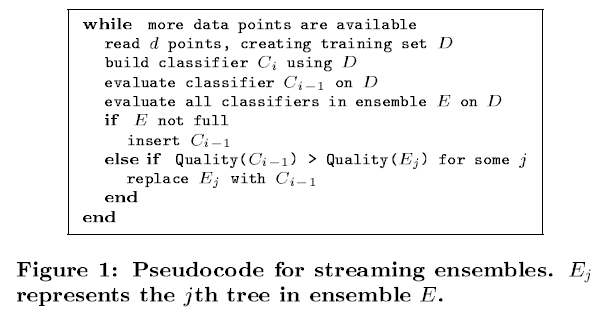

## Concept Drift Adaptation by Exploiting HistoricalKnowledge (DTEL)

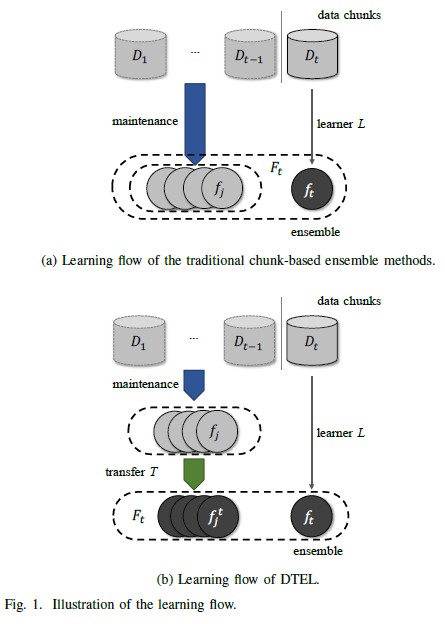

## Generative-CDTL

+ 사실 입력 $x_i$ 에서 어떤 feature가 시간에 따라 importance가 변하는지 알기 어렵다. trainset의 경우, bucket size가 크지 않을 수 있으며, 또한 I(z,b)가 분명하게 나타나지 않을 수도 있기 때문이다.
+ 따라서 아래와 같은 구조를 제안한다.
+ 실험3~4는 sensitive featrue z에 대해, G(z,b)으로 전처리 하였으나, 이번 구조는 모든 feature에 대하여 $G(x_i,b)$으로 전처리한다.
+ $I(x_i,b) > 0$ 인 feature는 G에 의해 전처리 될 것이고,$I(x_j,b) = 0$ 인 feature는 G에 의해 by-pass 되도록 학습될 것이다.

<pre>
x0 ------>|                     |- x'0 --> |                        |
x1 ------>|  Generator G(xi,b)  |- x'1 --> |                        |
x2 ------>|  (Adaptive model)   |- x'2 --> | Discriminator (D(x,g)) | -> y^
x3 ------>|                     |- x'3 --> | predictive model       |
z0 ------>|                     |- z'0 --> |                        |
                     ^
                     |
                     b
</pre>

$$
b = \{1,2,3,...N\} \in B
$$
$$
N << M
$$
$$
b_{norm} = b/M
\tag{17}
$$
$$
L_D = H(y,\hat{y}) = H(y,D(G(x_i,b_{norm})))=\mathbb{E}_{y}[-log(D(G(x_i,b_{norm})))]
\tag{21}
$$

$$
L_G = \sum_{i}MSE(G(x_i,b_{norm}),x_i)
\tag{22}
$$

$$
\min_{G(.)} L_D + L_G
\tag{23}
$$

$$
\min_{G(.)} L_D + L_G+ std(L_1,L_2)
\tag{24}
$$

# 실험
+ synthetic data를 만든다.
+ 해당 data는 data drift가 시간에 따라 변화 된다.
+ 이때, 성능의 감소를 정량적으로 측정하고
+ Bucket을 고려한 몇개의 모델을 적용한다.

## synthetic data의 생성 (Case #1 MI의 감소, Drift의 증가 )

+ $P_t(y,X) \ne P_{t+w}(y,X) $ 이고 $P_t(y|X) \ne P_{t+w}(y|X) $
+ Real concept drift
+ 즉, P(y|X)와 P(X)의 변화가 연관되어 나타남.
+ 이때 대상 feature z에 대해서 MI 감소, ks-test 통계량 증가



+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature는 가변 data drift

### Dataset 준비

In [132]:
data_size = 40000
cor = [1.5, 1.2, 0.9 , 0.7, 0.5]

In [133]:
seed_everything()
#y= np.random.normal(1,2,data_size)
y= (np.random.normal(0.5,0.5,data_size) > 0.5).astype(int)
x = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x[:,ix] = y + np.random.normal(1,cor_,data_size)
    #sns.scatterplot(x=x[:,ix],y=y)

In [134]:
seed_everything(100)

for i in range(400):
    s = i*100
    #x[s:s+100,3] = y[s:s+100] + np.random.normal(1,5-(i/100),100)
    x[s:s+100,4] = y[s:s+100] + np.random.normal(1,0.5+(i/100),100)
    #x[s:s+100,5] = i
#sns.scatterplot(x=x[0:200,4],y=y[0:200])
#sns.scatterplot(x=x[39800:40000,4],y=y[39800:40000])

### 실험

MI Analysis MI Max 0.20278, Min 0.02707, Mean 0.09885, Std 0.06305
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:05<00:00,  5.77it/s]


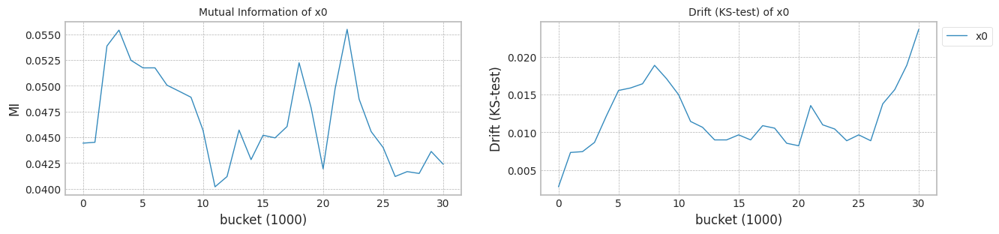

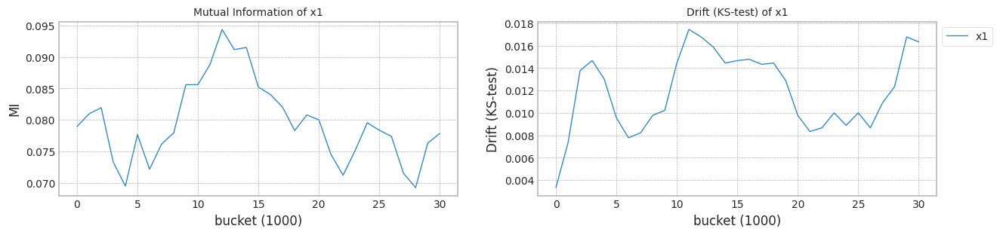

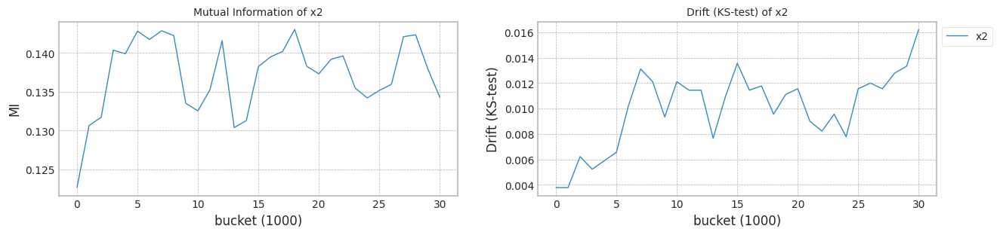

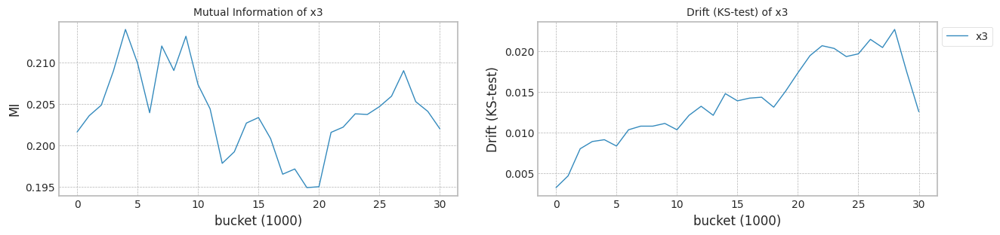

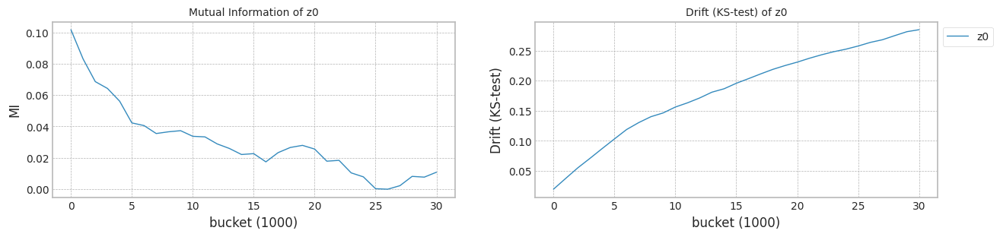

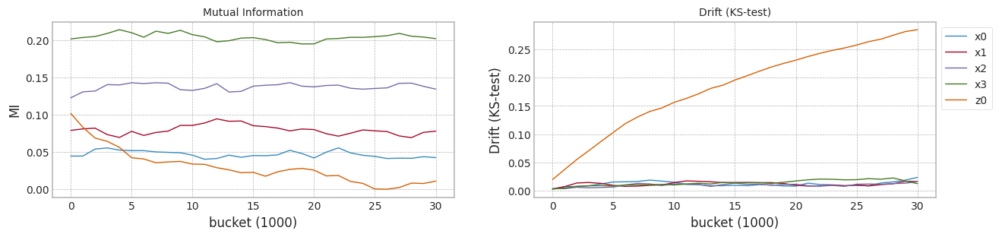

In [135]:
columns=['x0','x1','x2','x3','z0']
X = pd.DataFrame(x,columns=columns)
Y = y

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X, Y,train_size, test_size)
#model,df = train_classificaion_model(X1,Y1,train_size, test_size)

cuda:0


100%|██████████| 300/300 [00:02<00:00, 117.61it/s]


<Axes: >

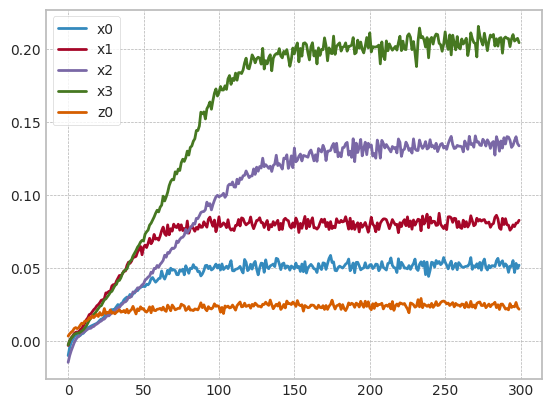

In [136]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
mine = Net(X1.shape[1]).to(device)
loss_mse = customLoss(mine).to(device)
optimizer = torch.optim.Adam(loss_mse.parameters(), lr=0.01)
plot_loss = []

x = torch.tensor(X1.values,dtype=torch.float32).to(device)
y = torch.tensor(Y1,dtype=torch.float32).to(device)

for epoch in tqdm(range(300)):
    mine.zero_grad()
    mine_loss = loss_mse(x,y)
    mine_loss.sum().backward()
    optimizer.step()
    plot_loss.append(-mine_loss.cpu().data.numpy())

plot_loss = np.asarray(plot_loss)
df_loss = pd.DataFrame(plot_loss,columns=X1.columns)

df_loss.plot()

In [137]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.520974,0.392205,0.600995,0.478669,0.421766,0
1,0.447230,0.556479,0.629077,0.735705,0.529014,0
2,0.489501,0.704159,0.760582,0.582973,0.570549,0
3,0.581446,0.301839,0.443337,0.515173,0.396001,0
4,0.571642,0.639275,0.524701,0.583380,0.561748,0
...,...,...,...,...,...,...
39995,0.346158,0.267147,0.513105,0.599663,0.185740,39
39996,0.426322,0.302644,0.484909,0.587518,0.721101,39
39997,0.374186,0.587769,0.624447,0.598315,0.489479,39
39998,0.470439,0.265430,0.218971,0.645349,1.258888,39


trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 590.32it/s]


Test f1 score: 0.8755589486312575
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8033370678547825
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.04it/s]


Test f1 score: 0.8651845361953784
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.224505
x1    0.126283
x2    0.120541
x3    0.157613
z0    0.229226
dtype: float64
Mean F1 for all data: 0.7996795072242426
Normal model mean        : 0.8033370678547825
Drift tolerant model mean: 0.7996795072242426
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 607.44it/s]


Test f1 score: 0.8723111158207056
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8072407025064846
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.84it/s]


Test f1 score: 0.8745054945054945
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.559186
x1    0.098283
x2    0.079871
x3    0.115634
z0    0.484685
dtype: float64
Mean F1 for all data: 0.7546087658981385
Normal model mean        : 0.8052888851806336
Drift tolerant model mean: 0.7771441365611906
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 599.12it/s]


Test f1 score: 0.8475139432775602
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7778229870309791
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 233.02it/s]


Test f1 score: 0.8449779186955044
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.309903
x1    0.120860
x2    0.179910
x3    0.102269
z0    0.376387
dtype: float64
Mean F1 for all data: 0.684649514924042
Normal model mean        : 0.7961335857974153
Drift tolerant model mean: 0.7463125960154744
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 600.32it/s]


Test f1 score: 0.8752730449978157
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8000096553180603
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.35it/s]


Test f1 score: 0.8725187472430525
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.62it/s]


mean of drift:
x0    0.491996
x1    0.084022
x2    0.088276
x3    0.134677
z0    0.477039
dtype: float64
Mean F1 for all data: 0.7533254161733612
Normal model mean        : 0.7971026031775766
Drift tolerant model mean: 0.7480658010549461
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 638.64it/s]


Test f1 score: 0.8476145264657013
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.64it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7770980935504559
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 224.63it/s]


Test f1 score: 0.8707512924870752
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.053860
x1    0.387860
x2    0.079749
x3    0.137004
z0    0.483724
dtype: float64
Mean F1 for all data: 0.6731509166290423
Normal model mean        : 0.7931017012521525
Drift tolerant model mean: 0.7330828241697653
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 646.26it/s]


Test f1 score: 0.8754838709677418
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.62it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8055640889104349
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.96it/s]


Test f1 score: 0.8635715069695972
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.240631
x1    0.123412
x2    0.123720
x3    0.193186
z0    0.206455
dtype: float64
Mean F1 for all data: 0.8117568815455029
Normal model mean        : 0.7951787658618662
Drift tolerant model mean: 0.7461951670657215
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 626.63it/s]


Test f1 score: 0.8752569512063183
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.806027667907769
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 233.28it/s]


Test f1 score: 0.8697288323187603
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.486050
x1    0.108774
x2    0.109477
x3    0.124394
z0    0.205846
dtype: float64
Mean F1 for all data: 0.8107208176530905
Normal model mean        : 0.796728609011281
Drift tolerant model mean: 0.7554131171496314
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 590.68it/s]


Test f1 score: 0.8752730449978157
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.64it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8051524268543416
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 234.71it/s]


Test f1 score: 0.8674087953267937
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.449014
x1    0.103215
x2    0.093649
x3    0.144007
z0    0.174746
dtype: float64
Mean F1 for all data: 0.8348078052317294
Normal model mean        : 0.7977815862416635
Drift tolerant model mean: 0.7653374531598937
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.81it/s]


Test f1 score: 0.8719925007811686
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8022942457428519
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.75it/s]


Test f1 score: 0.8628313462206275
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.64it/s]


mean of drift:
x0    0.041305
x1    0.048233
x2    0.104290
x3    0.080000
z0    0.177018
dtype: float64
Mean F1 for all data: 0.8116839314303025
Normal model mean        : 0.7982829928529066
Drift tolerant model mean: 0.7704870618566058
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 625.05it/s]


Test f1 score: 0.8583801498127341
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.62it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7794169260817695
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 234.05it/s]


Test f1 score: 0.8467424573677307
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.299806
x1    0.186308
x2    0.109495
x3    0.147520
z0    0.366964
dtype: float64
Mean F1 for all data: 0.7916930194303817
Normal model mean        : 0.796396386175793
Drift tolerant model mean: 0.7726076576139833
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 635.43it/s]


Test f1 score: 0.8752299534682393
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.65it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8051736019558221
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 233.88it/s]


Test f1 score: 0.8713592233009708
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.477373
x1    0.078036
x2    0.090846
x3    0.139918
z0    0.121706
dtype: float64
Mean F1 for all data: 0.8251284364344388
Normal model mean        : 0.7971943148830684
Drift tolerant model mean: 0.7773822738703884
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 640.72it/s]


Test f1 score: 0.8755560377563197
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.66it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.805071680829475
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 233.44it/s]


Test f1 score: 0.8784985182746131
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.095455
x1    0.082462
x2    0.094104
x3    0.135609
z0    0.277330
dtype: float64
Mean F1 for all data: 0.8353727030323886
Normal model mean        : 0.797850762045269
Drift tolerant model mean: 0.7822148096338885
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.31it/s]


Test f1 score: 0.8745213871567662
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.66it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8009996246313937
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 233.86it/s]


Test f1 score: 0.8647162340519138
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.62it/s]


mean of drift:
x0    0.088000
x1    0.544057
x2    0.113201
x3    0.158642
z0    0.223459
dtype: float64
Mean F1 for all data: 0.8063551048095542
Normal model mean        : 0.7980929822442016
Drift tolerant model mean: 0.784071755416632
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 634.19it/s]


Test f1 score: 0.8757306776358519
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8076893824412662
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 233.53it/s]


Test f1 score: 0.8749450549450549
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.091703
x1    0.027857
x2    0.051674
x3    0.091964
z0    0.342953
dtype: float64
Mean F1 for all data: 0.8298091182748722
Normal model mean        : 0.7987784394011347
Drift tolerant model mean: 0.7873387099065062
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 644.46it/s]


Test f1 score: 0.8755820249052517
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.65it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8044609416285161
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 235.28it/s]


Test f1 score: 0.8789169123266732
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.090756
x1    0.103057
x2    0.113860
x3    0.157072
z0    0.196849
dtype: float64
Mean F1 for all data: 0.8225807005221877
Normal model mean        : 0.7991572728829601
Drift tolerant model mean: 0.7896881759475517
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 633.98it/s]


Test f1 score: 0.8565048771888589
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7792643075553328
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 234.43it/s]


Test f1 score: 0.8787878787878788
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.63it/s]


mean of drift:
x0    0.091244
x1    0.098530
x2    0.114767
x3    0.172527
z0    0.297082
dtype: float64
Mean F1 for all data: 0.8061163834318681
Normal model mean        : 0.7979139625499835
Drift tolerant model mean: 0.7907149389153214
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 632.19it/s]


Test f1 score: 0.8758996728462376
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8031918778919792
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 234.26it/s]


Test f1 score: 0.8644962604487462
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.187928
x1    0.143215
x2    0.180444
x3    0.176129
z0    0.189251
dtype: float64
Mean F1 for all data: 0.8059898196477204
Normal model mean        : 0.7982244281583362
Drift tolerant model mean: 0.7916134613113449
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 626.65it/s]


Test f1 score: 0.8757253914376437
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7974214734341102
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 233.97it/s]


Test f1 score: 0.8673345810855445
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.072634
x1    0.456118
x2    0.080122
x3    0.140409
z0    0.425258
dtype: float64
Mean F1 for all data: 0.7369640016267023
Normal model mean        : 0.7981798195625458
Drift tolerant model mean: 0.7885773802177537
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 634.85it/s]


Test f1 score: 0.8756022777047744
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.64it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7984343242825936
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 233.63it/s]


Test f1 score: 0.8680654729210151
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.167423
x1    0.124649
x2    0.102652
x3    0.146477
z0    0.480685
dtype: float64
Mean F1 for all data: 0.6853756502110337
Normal model mean        : 0.7981932145478116
Drift tolerant model mean: 0.7831457102174
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 628.22it/s]


Test f1 score: 0.8659097882786131
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8011113899314002
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 234.71it/s]


Test f1 score: 0.8671574552247006
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.461634
x1    0.087133
x2    0.092315
x3    0.122889
z0    0.240276
dtype: float64
Mean F1 for all data: 0.7975630560378252
Normal model mean        : 0.798339123316991
Drift tolerant model mean: 0.7838665775084213


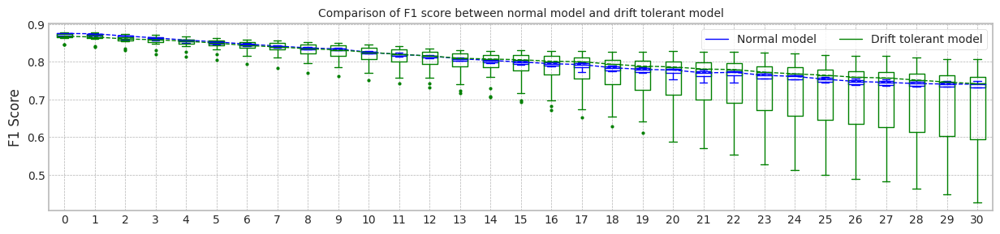

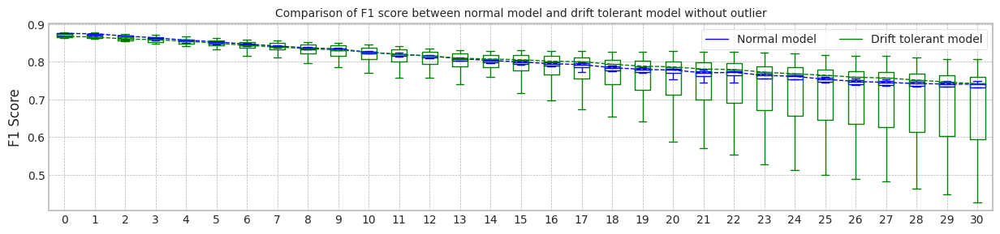

max_mean_trial= 11


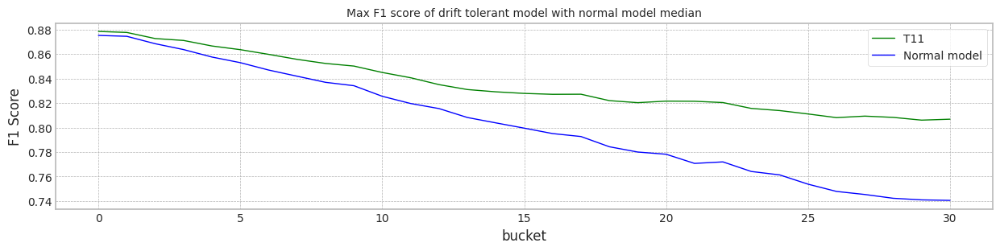

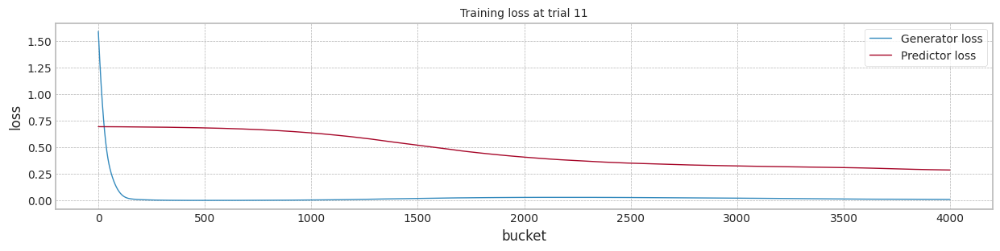

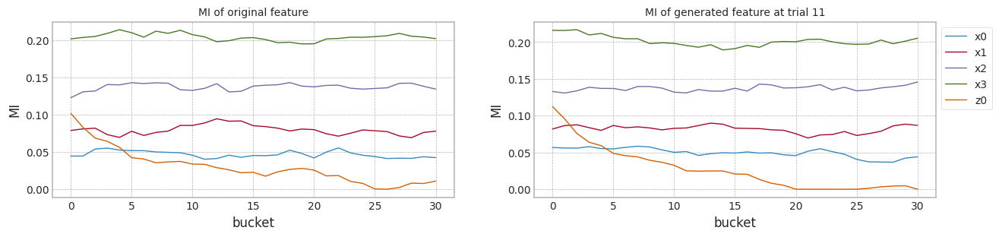

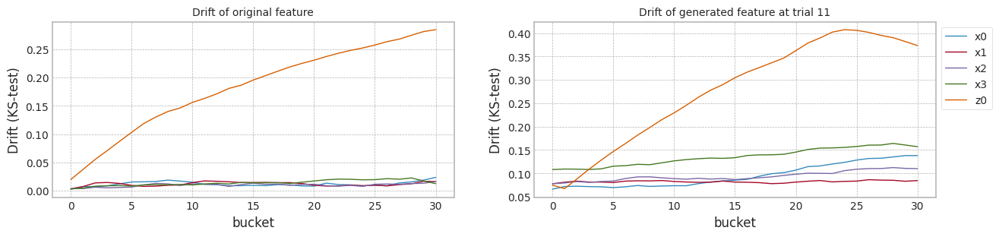

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.875559,0.875559,0.803337,0.741126
1,1.0,0.872311,0.872311,0.807241,0.747940
2,2.0,0.847514,0.847514,0.777823,0.710698
3,3.0,0.875273,0.875273,0.800010,0.736226
4,4.0,0.847615,0.847615,0.777098,0.711339
5,5.0,0.875484,0.875484,0.805564,0.744530
6,6.0,0.875257,0.875257,0.806028,0.745182
7,7.0,0.875273,0.875273,0.805152,0.742492
8,8.0,0.871993,0.871993,0.802294,0.739221
9,9.0,0.858380,0.858380,0.779417,0.708907


,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.865185,0.865185,0.799680,0.733487
1,1.0,0.874505,0.874505,0.754609,0.601512
2,2.0,0.844978,0.844978,0.684650,0.503667
3,3.0,0.872519,0.872519,0.753325,0.559914
4,4.0,0.870751,0.870751,0.673151,0.437542
5,5.0,0.863572,0.863572,0.811757,0.757189
6,6.0,0.869729,0.869729,0.810721,0.739632
7,7.0,0.867409,0.867409,0.834808,0.807627
8,8.0,0.862831,0.862831,0.811684,0.743583
9,9.0,0.846742,0.846742,0.791693,0.744668


In [138]:
_,_,_,_,_,_ = drift_tolerant(X1, Y1,train_size, test_size,avaible_range = 100,trial_count=20) #np.max(X1['b']+1))

trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 627.36it/s]


Test f1 score: 0.8755589486312575
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8033370678547825
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.42it/s]


Test f1 score: 0.8651845361953784
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.224505
x1    0.126283
x2    0.120541
x3    0.157613
z0    0.229226
dtype: float64
Mean F1 for all data: 0.7996795072242426
Normal model mean        : 0.8033370678547825
Drift tolerant model mean: 0.7996795072242426
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.87it/s]


Test f1 score: 0.8723111158207056
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8072407025064846
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.92it/s]


Test f1 score: 0.8745054945054945
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.559186
x1    0.098283
x2    0.079871
x3    0.115634
z0    0.484685
dtype: float64
Mean F1 for all data: 0.7546087658981385
Normal model mean        : 0.8052888851806336
Drift tolerant model mean: 0.7771441365611906
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 620.03it/s]


Test f1 score: 0.8475139432775602
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7778229870309791
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.96it/s]


Test f1 score: 0.8449779186955044
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.309903
x1    0.120860
x2    0.179910
x3    0.102269
z0    0.376387
dtype: float64
Mean F1 for all data: 0.684649514924042
Normal model mean        : 0.7961335857974153
Drift tolerant model mean: 0.7463125960154744
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 623.36it/s]


Test f1 score: 0.8752730449978157
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8000096553180603
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.87it/s]


Test f1 score: 0.8725187472430525
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.491996
x1    0.084022
x2    0.088276
x3    0.134677
z0    0.477039
dtype: float64
Mean F1 for all data: 0.7533254161733612
Normal model mean        : 0.7971026031775766
Drift tolerant model mean: 0.7480658010549461
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 604.84it/s]


Test f1 score: 0.8476145264657013
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7770980935504559
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.34it/s]


Test f1 score: 0.8707512924870752
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.053860
x1    0.387860
x2    0.079749
x3    0.137004
z0    0.483724
dtype: float64
Mean F1 for all data: 0.6731509166290423
Normal model mean        : 0.7931017012521525
Drift tolerant model mean: 0.7330828241697653
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 645.08it/s]


Test f1 score: 0.8754838709677418
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8055640889104349
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.69it/s]


Test f1 score: 0.8635715069695972
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.240631
x1    0.123412
x2    0.123720
x3    0.193186
z0    0.206455
dtype: float64
Mean F1 for all data: 0.8117568815455029
Normal model mean        : 0.7951787658618662
Drift tolerant model mean: 0.7461951670657215
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 638.16it/s]


Test f1 score: 0.8752569512063183
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.806027667907769
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.28it/s]


Test f1 score: 0.8697288323187603
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.486050
x1    0.108774
x2    0.109477
x3    0.124394
z0    0.205846
dtype: float64
Mean F1 for all data: 0.8107208176530905
Normal model mean        : 0.796728609011281
Drift tolerant model mean: 0.7554131171496314
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 628.74it/s]


Test f1 score: 0.8752730449978157
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8051524268543416
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.44it/s]


Test f1 score: 0.8674087953267937
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.449014
x1    0.103215
x2    0.093649
x3    0.144007
z0    0.174746
dtype: float64
Mean F1 for all data: 0.8348078052317294
Normal model mean        : 0.7977815862416635
Drift tolerant model mean: 0.7653374531598937
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 633.75it/s]


Test f1 score: 0.8719925007811686
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8022942457428519
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.88it/s]


Test f1 score: 0.8628313462206275
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.041305
x1    0.048233
x2    0.104290
x3    0.080000
z0    0.177018
dtype: float64
Mean F1 for all data: 0.8116839314303025
Normal model mean        : 0.7982829928529066
Drift tolerant model mean: 0.7704870618566058
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 631.59it/s]


Test f1 score: 0.8583801498127341
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7794169260817695
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.92it/s]


Test f1 score: 0.8467424573677307
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.299806
x1    0.186308
x2    0.109495
x3    0.147520
z0    0.366964
dtype: float64
Mean F1 for all data: 0.7916930194303817
Normal model mean        : 0.796396386175793
Drift tolerant model mean: 0.7726076576139833
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 628.68it/s]


Test f1 score: 0.8752299534682393
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8051736019558221
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.07it/s]


Test f1 score: 0.8713592233009708
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.477373
x1    0.078036
x2    0.090846
x3    0.139918
z0    0.121706
dtype: float64
Mean F1 for all data: 0.8251284364344388
Normal model mean        : 0.7971943148830684
Drift tolerant model mean: 0.7773822738703884
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 634.63it/s]


Test f1 score: 0.8755560377563197
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.805071680829475
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.94it/s]


Test f1 score: 0.8784985182746131
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.095455
x1    0.082462
x2    0.094104
x3    0.135609
z0    0.277330
dtype: float64
Mean F1 for all data: 0.8353727030323886
Normal model mean        : 0.797850762045269
Drift tolerant model mean: 0.7822148096338885
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.74it/s]


Test f1 score: 0.8745213871567662
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8009996246313937
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 233.12it/s]


Test f1 score: 0.8647162340519138
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.088000
x1    0.544057
x2    0.113201
x3    0.158642
z0    0.223459
dtype: float64
Mean F1 for all data: 0.8063551048095542
Normal model mean        : 0.7980929822442016
Drift tolerant model mean: 0.784071755416632
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 628.24it/s]


Test f1 score: 0.8757306776358519
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8076893824412662
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.26it/s]


Test f1 score: 0.8749450549450549
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.091703
x1    0.027857
x2    0.051674
x3    0.091964
z0    0.342953
dtype: float64
Mean F1 for all data: 0.8298091182748722
Normal model mean        : 0.7987784394011347
Drift tolerant model mean: 0.7873387099065062
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 628.27it/s]


Test f1 score: 0.8755820249052517
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8044609416285161
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 233.85it/s]


Test f1 score: 0.8789169123266732
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.090756
x1    0.103057
x2    0.113860
x3    0.157072
z0    0.196849
dtype: float64
Mean F1 for all data: 0.8225807005221877
Normal model mean        : 0.7991572728829601
Drift tolerant model mean: 0.7896881759475517
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 623.05it/s]


Test f1 score: 0.8565048771888589
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7792643075553328
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.97it/s]


Test f1 score: 0.8787878787878788
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.091244
x1    0.098530
x2    0.114767
x3    0.172527
z0    0.297082
dtype: float64
Mean F1 for all data: 0.8061163834318681
Normal model mean        : 0.7979139625499835
Drift tolerant model mean: 0.7907149389153214
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 625.12it/s]


Test f1 score: 0.8758996728462376
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.63it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8031918778919792
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 233.44it/s]


Test f1 score: 0.8644962604487462
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.187928
x1    0.143215
x2    0.180444
x3    0.176129
z0    0.189251
dtype: float64
Mean F1 for all data: 0.8059898196477204
Normal model mean        : 0.7982244281583362
Drift tolerant model mean: 0.7916134613113449
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 629.20it/s]


Test f1 score: 0.8757253914376437
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.62it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7974214734341102
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.77it/s]


Test f1 score: 0.8673345810855445
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.072634
x1    0.456118
x2    0.080122
x3    0.140409
z0    0.425258
dtype: float64
Mean F1 for all data: 0.7369640016267023
Normal model mean        : 0.7981798195625458
Drift tolerant model mean: 0.7885773802177537
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 632.63it/s]


Test f1 score: 0.8756022777047744
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7984343242825936
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.89it/s]


Test f1 score: 0.8680654729210151
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.167423
x1    0.124649
x2    0.102652
x3    0.146477
z0    0.480685
dtype: float64
Mean F1 for all data: 0.6853756502110337
Normal model mean        : 0.7981932145478116
Drift tolerant model mean: 0.7831457102174
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 628.95it/s]


Test f1 score: 0.8659097882786131
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8011113899314002
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 233.73it/s]


Test f1 score: 0.8671574552247006
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.461634
x1    0.087133
x2    0.092315
x3    0.122889
z0    0.240276
dtype: float64
Mean F1 for all data: 0.7975630560378252
Normal model mean        : 0.798339123316991
Drift tolerant model mean: 0.7838665775084213
######################### Trial 0 for Normal model ###########################
retrain_interval: 16
######################### Trial 0 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.12it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8297308604556956
SEA mean: 0.8297308604556956
######################### Trial 0 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.73it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8469410731536742
DTEL mean: 0.8469410731536742
######################### Trial 1 for Normal model ###########################
retrain_interval: 16
######################### Trial 1 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.11it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8346272240199045
SEA mean: 0.8321790422378
######################### Trial 1 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.76it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8478326362604942
DTEL mean: 0.8473868547070842
######################### Trial 2 for Normal model ###########################
retrain_interval: 16
######################### Trial 2 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.13it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8159076769114384
SEA mean: 0.8267552537956795
######################### Trial 2 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.78it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8340962836898338
DTEL mean: 0.8429566643680007
######################### Trial 3 for Normal model ###########################
retrain_interval: 16
######################### Trial 3 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.13it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8195202515565548
SEA mean: 0.8249465032358984
######################### Trial 3 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.74it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8460692928261941
DTEL mean: 0.8437348214825491
######################### Trial 4 for Normal model ###########################
retrain_interval: 16
######################### Trial 4 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.14it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8235263058990374
SEA mean: 0.8246624637685261
######################### Trial 4 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.77it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8338164945241352
DTEL mean: 0.8417511560908663
######################### Trial 5 for Normal model ###########################
retrain_interval: 16
######################### Trial 5 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.14it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8345027615367581
SEA mean: 0.8263025133965648
######################### Trial 5 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.77it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8473761195398445
DTEL mean: 0.8426886499990293
######################### Trial 6 for Normal model ###########################
retrain_interval: 16
######################### Trial 6 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.08it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.833035059309575
SEA mean: 0.8272643056698519
######################### Trial 6 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.77it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8475184335304503
DTEL mean: 0.8433786190749466
######################### Trial 7 for Normal model ###########################
retrain_interval: 16
######################### Trial 7 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.12it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8327761946805775
SEA mean: 0.8279532917961927
######################### Trial 7 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.71it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8473379888478901
DTEL mean: 0.8438735402965646
######################### Trial 8 for Normal model ###########################
retrain_interval: 16
######################### Trial 8 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.11it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8355867085471117
SEA mean: 0.8288014492129615
######################### Trial 8 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.78it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8463184932562399
DTEL mean: 0.8441452017365285
######################### Trial 9 for Normal model ###########################
retrain_interval: 16
######################### Trial 9 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.15it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8209805095542915
SEA mean: 0.8280193552470945
######################### Trial 9 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.76it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8366330597249623
DTEL mean: 0.8433939875353719
######################### Trial 10 for Normal model ###########################
retrain_interval: 16
######################### Trial 10 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.13it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8347120118935332
SEA mean: 0.8286277785785888
######################### Trial 10 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.79it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8479310108415608
DTEL mean: 0.843806444199571
######################### Trial 11 for Normal model ###########################
retrain_interval: 16
######################### Trial 11 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.11it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8324725239961535
SEA mean: 0.8289481740300526
######################### Trial 11 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.77it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8470539638296495
DTEL mean: 0.8440770708354108
######################### Trial 12 for Normal model ###########################
retrain_interval: 16
######################### Trial 12 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.14it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8298058510214884
SEA mean: 0.82901414918324
######################### Trial 12 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.76it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8459161241367962
DTEL mean: 0.8442185364739789
######################### Trial 13 for Normal model ###########################
retrain_interval: 16
######################### Trial 13 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.15it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8333169267912869
SEA mean: 0.8293214904409576
######################### Trial 13 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.67it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8482864230064798
DTEL mean: 0.8445090997977289
######################### Trial 14 for Normal model ###########################
retrain_interval: 16
######################### Trial 14 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.12it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.832474376211436
SEA mean: 0.8295316828256563
######################### Trial 14 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.76it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.845059590084229
DTEL mean: 0.8445457991501624
######################### Trial 15 for Normal model ###########################
retrain_interval: 16
######################### Trial 15 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.16it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8176309941294518
SEA mean: 0.8287878897821435
######################### Trial 15 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.75it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8355312731281732
DTEL mean: 0.8439823912737879
######################### Trial 16 for Normal model ###########################
retrain_interval: 16
######################### Trial 16 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.14it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.824877344536498
SEA mean: 0.8285578577088701
######################### Trial 16 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.74it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8471207241977519
DTEL mean: 0.8441669990928446
######################### Trial 17 for Normal model ###########################
retrain_interval: 16
######################### Trial 17 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.11it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8197718109416926
SEA mean: 0.8280697439995826
######################### Trial 17 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.77it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8453652545032965
DTEL mean: 0.8442335688378697
######################### Trial 18 for Normal model ###########################
retrain_interval: 16
######################### Trial 18 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.08it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8279709414366407
SEA mean: 0.8280645438646909
######################### Trial 18 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.77it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8436653110936246
DTEL mean: 0.844203660535541
######################### Trial 19 for Normal model ###########################
retrain_interval: 16
######################### Trial 19 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.11it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8351880985448022
SEA mean: 0.8284207215986964
######################### Trial 19 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.72it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8447292626035218
DTEL mean: 0.8442299406389401


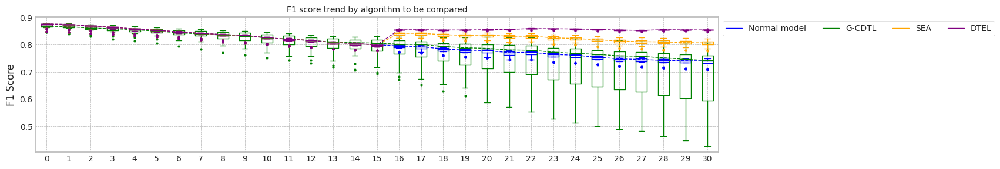

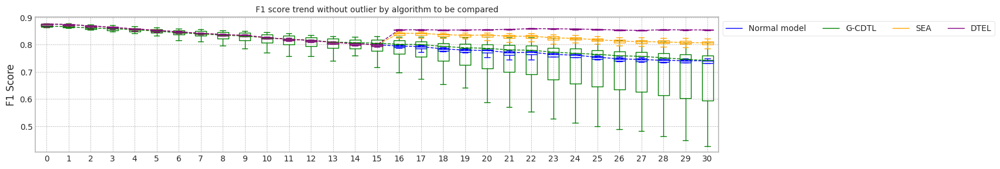

max_mean_trial= 23


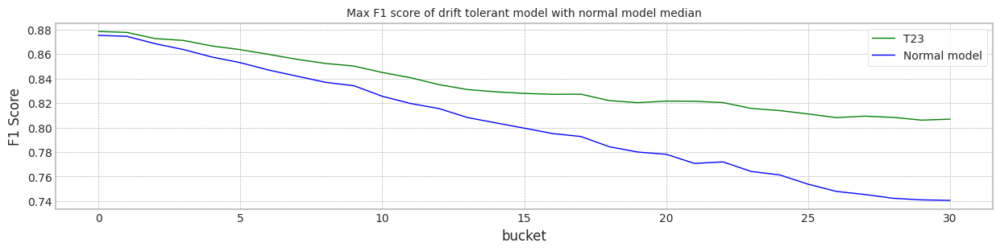

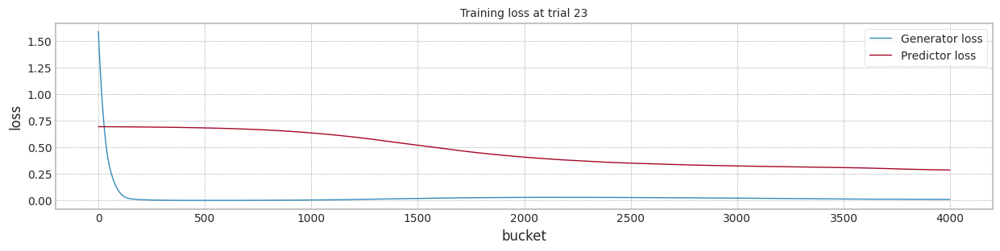

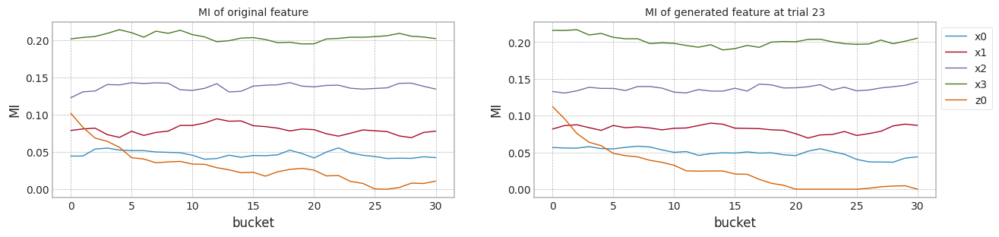

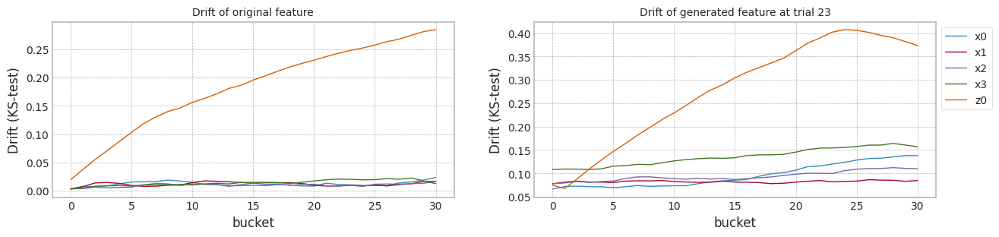

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.875559,0.874822,0.803337,0.741126
1,1.0,0.872311,0.872160,0.807241,0.747940
2,2.0,0.847514,0.846227,0.777823,0.710698
3,3.0,0.875273,0.874356,0.800010,0.736226
4,4.0,0.847615,0.846090,0.777098,0.711339
5,5.0,0.875484,0.874852,0.805564,0.744530
6,6.0,0.875257,0.874742,0.806028,0.745182
7,7.0,0.875273,0.874808,0.805152,0.742492
8,8.0,0.871993,0.871902,0.802294,0.739221
9,9.0,0.858380,0.857512,0.779417,0.708907


,Trial,test_f1,init_f1,mean_f1,last_f1
0,1.0,0.865185,0.862418,0.799680,0.733487
1,3.0,0.874505,0.872888,0.754609,0.601512
2,5.0,0.844978,0.839804,0.684650,0.503667
3,7.0,0.872519,0.871193,0.753325,0.559914
4,9.0,0.870751,0.866267,0.673151,0.437542
5,11.0,0.863572,0.861200,0.811757,0.757189
6,13.0,0.869729,0.868512,0.810721,0.739632
7,15.0,0.867409,0.866196,0.834808,0.807627
8,17.0,0.862831,0.864658,0.811684,0.743583
9,19.0,0.846742,0.842625,0.791693,0.744668


,Trial,test_f1,init_f1,mean_f1,last_f1
0,1.0,0.875559,0.874822,0.829731,0.800433
1,3.0,0.872311,0.872160,0.834627,0.810435
2,5.0,0.847514,0.846227,0.815908,0.802286
3,7.0,0.875273,0.874356,0.819520,0.776991
4,9.0,0.847615,0.846090,0.823526,0.823240
5,11.0,0.875484,0.874852,0.834503,0.812588
6,13.0,0.875257,0.874742,0.833035,0.806987
7,15.0,0.875273,0.874808,0.832776,0.806683
8,17.0,0.871993,0.871902,0.835587,0.818833
9,19.0,0.858380,0.857512,0.820981,0.811906


,Trial,test_f1,init_f1,mean_f1,last_f1
0,1.0,0.875559,0.874822,0.846941,0.853940
1,3.0,0.872311,0.872160,0.847833,0.854292
2,5.0,0.847514,0.846227,0.834096,0.853762
3,7.0,0.875273,0.874356,0.846069,0.853222
4,9.0,0.847615,0.846090,0.833816,0.853987
5,11.0,0.875484,0.874852,0.847376,0.854802
6,13.0,0.875257,0.874742,0.847518,0.853509
7,15.0,0.875273,0.874808,0.847338,0.854344
8,17.0,0.871993,0.871902,0.846318,0.854036
9,19.0,0.858380,0.857512,0.836633,0.855009


In [139]:
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 100,trial_count=20) #np.max(X1['b']+1))

## synthetic data의 생성 (Case #2 MI의 증감(상대적), Drift의 고정)

+ $P_t(y|X) \ne P_{t+w}(y|X)$ and $P_t(X) = P_{t+w}(X)$
+ Actual Drift
+ 즉, P(X)의 변화없이, Concept (본 Dataset에서 MI의 변화)만 변경


+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature에 대해 y의 비중이 시간에 따라 감소하도록 생성

### Dataset 준비

In [140]:
data_size = 40000
cor = np.asarray([1.5, 1.2, 0.9 , 0.7, 2.5])

In [141]:
seed_everything()

x1 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x1[:,ix] = np.random.normal(1,cor_,data_size)

In [142]:
x1.shape

(40000, 5)

In [143]:
import matplotlib.pyplot as plt

seed_everything()

y1_array = []
cor_const = cor[4]
for ii in range(x1.shape[0]):
    cor[4] = cor[4] - cor_const / x1.shape[0]
    e = np.random.normal(0.0, 2.0)
    y1_array.append(np.sum(cor * x1[ii])+e)

In [144]:
m = 5 #np.mean(y1_array[0:2000])
print(m)
y1 = [1 if y_ > m else 0 for y_ in y1_array]
print(sum(y1))

5
21325


### 실험

MI Analysis MI Max 0.22746, Min 0.00677, Mean 0.06988, Std 0.08433
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:05<00:00,  5.66it/s]


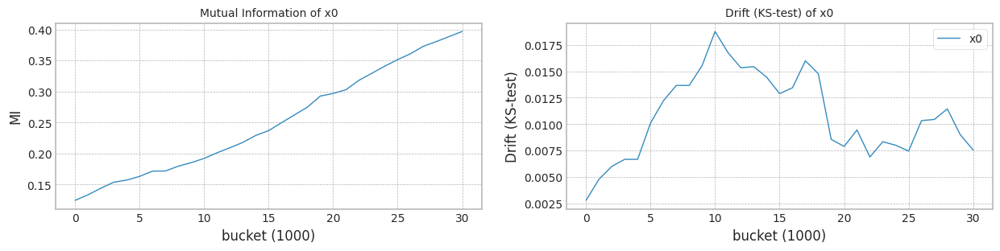

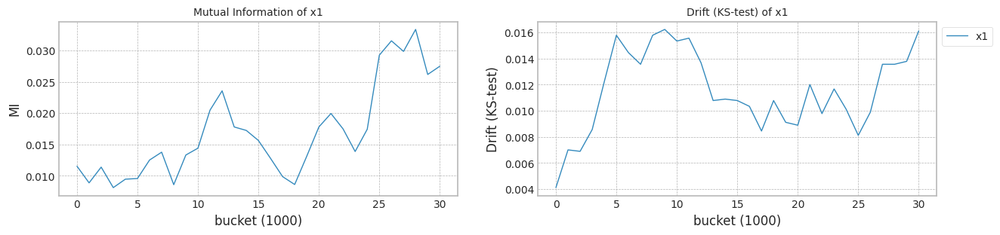

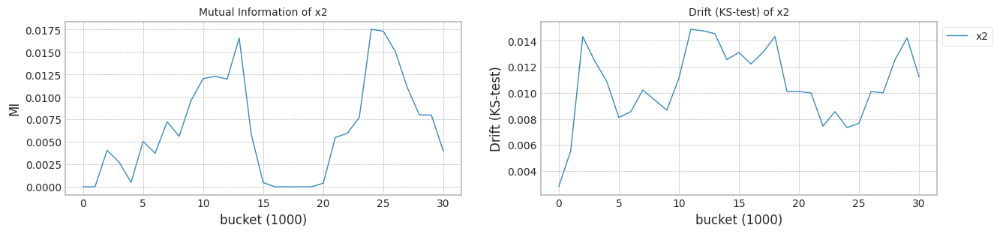

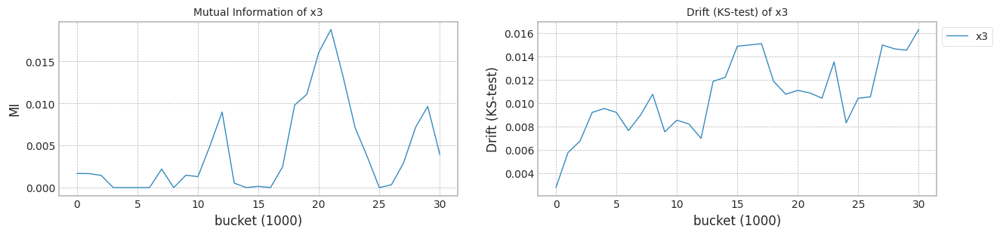

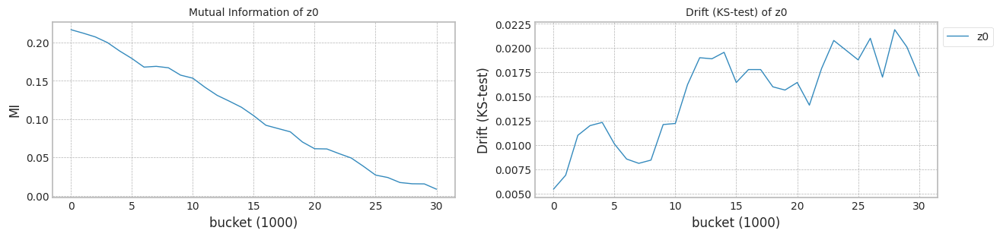

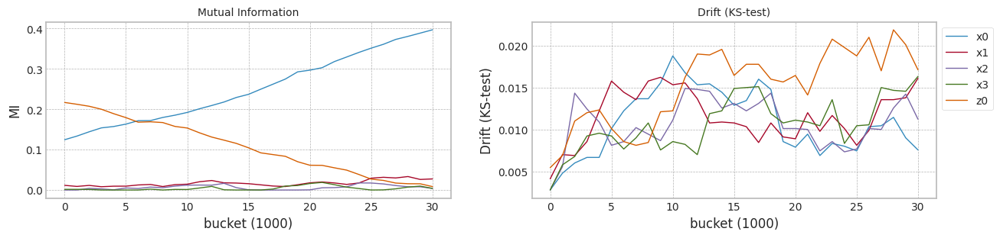

In [145]:
columns=['x0','x1','x2','x3','z0']
X1 = pd.DataFrame(x1,columns=columns)

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X1, y1,train_size, test_size)
#model,df = train_classificaion_model(X1,Y1,train_size, test_size)

In [146]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.525799,0.497734,0.329063,0.549493,0.366139,0
1,0.610533,0.420412,0.508390,0.580336,0.662926,0
2,0.556874,0.464734,0.669603,0.724770,0.486574,0
3,0.344341,0.646524,0.340976,0.528780,0.611850,0
4,0.503142,0.550860,0.598773,0.465698,0.487044,0
...,...,...,...,...,...,...
39995,0.333622,0.399822,0.303105,0.605408,0.709407,39
39996,0.358451,0.483875,0.341855,0.574439,0.695384,39
39997,0.559469,0.343824,0.542547,0.575250,0.504288,39
39998,0.433692,0.530132,0.301231,0.282353,0.762158,39


trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 631.10it/s]


Test f1 score: 0.9365773646801531
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8642847292771869
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.03it/s]


Test f1 score: 0.9597076461769115
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.201523
x1    0.091384
x2    0.044720
x3    0.340190
z0    0.251749
dtype: float64
Mean F1 for all data: 0.9235793336762752
Normal model mean        : 0.8642847292771869
Drift tolerant model mean: 0.9235793336762752
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 634.15it/s]


Test f1 score: 0.9028411083830234
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8469316917106153
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.52it/s]


Test f1 score: 0.9665664913598797
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.189247
x1    0.103878
x2    0.045423
x3    0.361172
z0    0.185975
dtype: float64
Mean F1 for all data: 0.913763422892422
Normal model mean        : 0.8556082104939011
Drift tolerant model mean: 0.9186713782843485
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 630.19it/s]


Test f1 score: 0.9419166590681134
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8657830548042339
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.55it/s]


Test f1 score: 0.9168938705442795
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.216731
x1    0.070642
x2    0.012308
x3    0.098158
z0    0.154735
dtype: float64
Mean F1 for all data: 0.8471539117505729
Normal model mean        : 0.8589998252640121
Drift tolerant model mean: 0.8948322227730899
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 643.44it/s]


Test f1 score: 0.927823791753891
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8530985460199252
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 233.13it/s]


Test f1 score: 0.9644870349492672
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.282498
x1    0.087609
x2    0.040749
x3    0.349642
z0    0.169140
dtype: float64
Mean F1 for all data: 0.8877871294582194
Normal model mean        : 0.8575245054529903
Drift tolerant model mean: 0.8930709494443723
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.00it/s]


Test f1 score: 0.9435491297541211
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8638492163836325
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.54it/s]


Test f1 score: 0.9572745043284
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.170136
x1    0.086882
x2    0.043935
x3    0.499918
z0    0.205194
dtype: float64
Mean F1 for all data: 0.8946157228426808
Normal model mean        : 0.8587894476391188
Drift tolerant model mean: 0.893379904124034
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 624.60it/s]


Test f1 score: 0.9323719996349367
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8538638027201683
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.73it/s]


Test f1 score: 0.9379463871626008
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.210179
x1    0.087763
x2    0.054444
x3    0.171728
z0    0.277498
dtype: float64
Mean F1 for all data: 0.9016291193314662
Normal model mean        : 0.8579685068192937
Drift tolerant model mean: 0.8947547733252726
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 638.48it/s]


Test f1 score: 0.9441299981741829
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8768117398301123
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 233.97it/s]


Test f1 score: 0.94174129812575
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.203419
x1    0.490638
x2    0.029717
x3    0.227254
z0    0.270405
dtype: float64
Mean F1 for all data: 0.8766578771242723
Normal model mean        : 0.8606603972494106
Drift tolerant model mean: 0.8921695024394155
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.66it/s]


Test f1 score: 0.9463826661770106
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8735046023959795
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.80it/s]


Test f1 score: 0.9377067254685777
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.239158
x1    0.104136
x2    0.246419
x3    0.096520
z0    0.222616
dtype: float64
Mean F1 for all data: 0.8801087405846524
Normal model mean        : 0.8622659228927317
Drift tolerant model mean: 0.8906619072075701
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 640.49it/s]


Test f1 score: 0.9076790336496979
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8489149571671706
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.89it/s]


Test f1 score: 0.7377279102384292
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.013025
x1    0.011627
x2    0.034351
x3    0.009674
z0    0.030477
dtype: float64
Mean F1 for all data: 0.6942212592162726
Normal model mean        : 0.8607824822565582
Drift tolerant model mean: 0.8688351685418704
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 642.34it/s]


Test f1 score: 0.9111170544708924
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8550521107104606
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.73it/s]


Test f1 score: 0.9551849436317897
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.221358
x1    0.096427
x2    0.041480
x3    0.278434
z0    0.302136
dtype: float64
Mean F1 for all data: 0.8821623311000811
Normal model mean        : 0.8602094451019484
Drift tolerant model mean: 0.8701678847976915
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 638.04it/s]


Test f1 score: 0.9177255113994772
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8495588586168183
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 234.46it/s]


Test f1 score: 0.9708042945940855
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.180832
x1    0.074151
x2    0.045530
x3    0.422337
z0    0.236427
dtype: float64
Mean F1 for all data: 0.9297402114247736
Normal model mean        : 0.8592412099669366
Drift tolerant model mean: 0.875583550854699
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.34it/s]


Test f1 score: 0.9509253291593777
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8709828417498167
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 234.24it/s]


Test f1 score: 0.9642890794308866
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.235086
x1    0.070401
x2    0.049387
x3    0.571728
z0    0.169305
dtype: float64
Mean F1 for all data: 0.8799156572453161
Normal model mean        : 0.8602196792821766
Drift tolerant model mean: 0.8759445597205837
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 631.74it/s]


Test f1 score: 0.9354986696027159
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8640108549268376
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 233.69it/s]


Test f1 score: 0.9531906941978884
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.220222
x1    0.103961
x2    0.496000
x3    0.067871
z0    0.266344
dtype: float64
Mean F1 for all data: 0.9125782032291564
Normal model mean        : 0.8605113081779197
Drift tolerant model mean: 0.8787625322981663
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 635.39it/s]


Test f1 score: 0.9323280951948406
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8620007927678985
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.96it/s]


Test f1 score: 0.9630534925260882
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.219355
x1    0.093204
x2    0.050785
x3    0.359341
z0    0.165369
dtype: float64
Mean F1 for all data: 0.9367425433815952
Normal model mean        : 0.8606176999343467
Drift tolerant model mean: 0.8829039616612683
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 627.97it/s]


Test f1 score: 0.9535182803600956
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8780393121411657
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.34it/s]


Test f1 score: 0.9633096218644703
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.223344
x1    0.085935
x2    0.045867
x3    0.411814
z0    0.217749
dtype: float64
Mean F1 for all data: 0.9236830032438504
Normal model mean        : 0.8617791407481347
Drift tolerant model mean: 0.8856225644334403
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 630.71it/s]


Test f1 score: 0.9458344789661809
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8630626816944518
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.32it/s]


Test f1 score: 0.9417386509832751
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.281699
x1    0.081692
x2    0.017237
x3    0.202226
z0    0.182183
dtype: float64
Mean F1 for all data: 0.9101602930458167
Normal model mean        : 0.8618593620572795
Drift tolerant model mean: 0.887156172471714
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.22it/s]


Test f1 score: 0.9391224862888483
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8693336434690625
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.69it/s]


Test f1 score: 0.9437500000000001
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.201369
x1    0.075104
x2    0.025728
x3    0.169315
z0    0.267151
dtype: float64
Mean F1 for all data: 0.913532328814711
Normal model mean        : 0.8622990256697374
Drift tolerant model mean: 0.8887077110801256
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.35it/s]


Test f1 score: 0.9419010847582276
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8670944782800035
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.16it/s]


Test f1 score: 0.948811188811189
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.320452
x1    0.106369
x2    0.120387
x3    0.067720
z0    0.179072
dtype: float64
Mean F1 for all data: 0.8584677737239065
Normal model mean        : 0.8625654397036411
Drift tolerant model mean: 0.8870277145603356
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 642.09it/s]


Test f1 score: 0.953120665742025
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8750144620145134
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.65it/s]


Test f1 score: 0.9583449818283477
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.170283
x1    0.083233
x2    0.049283
x3    0.305534
z0    0.244211
dtype: float64
Mean F1 for all data: 0.8905807300058248
Normal model mean        : 0.8632206514042132
Drift tolerant model mean: 0.8872147153732562
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 633.36it/s]


Test f1 score: 0.8895653644512092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8350965307775108
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.93it/s]


Test f1 score: 0.9580995136550692
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.13it/s]


mean of drift:
x0    0.246029
x1    0.107459
x2    0.057068
x3    0.280125
z0    0.186538
dtype: float64
Mean F1 for all data: 0.9255741375713322
Normal model mean        : 0.861814445372878
Drift tolerant model mean: 0.8891326864831599


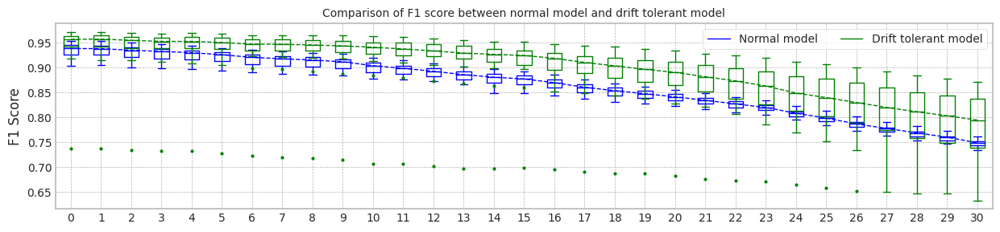

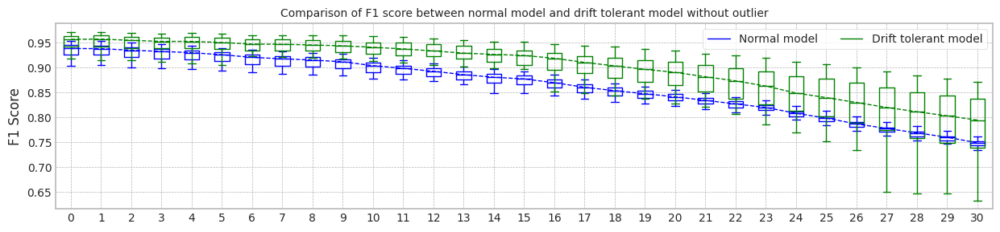

max_mean_trial= 13


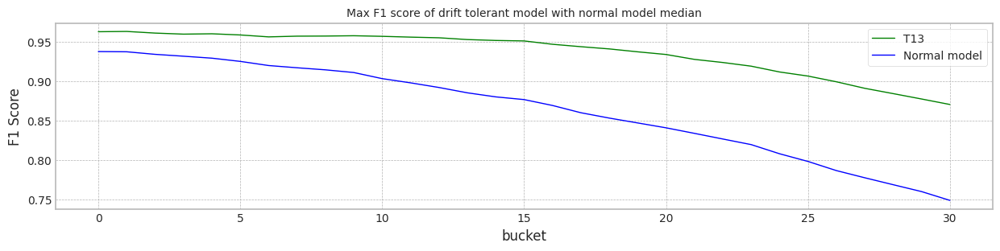

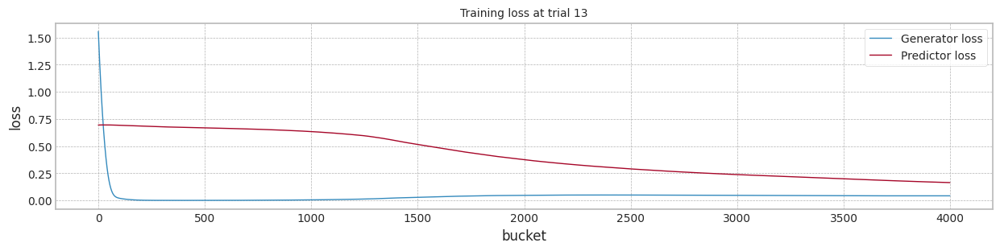

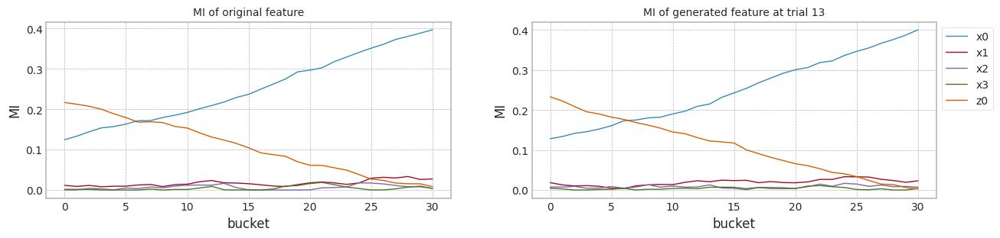

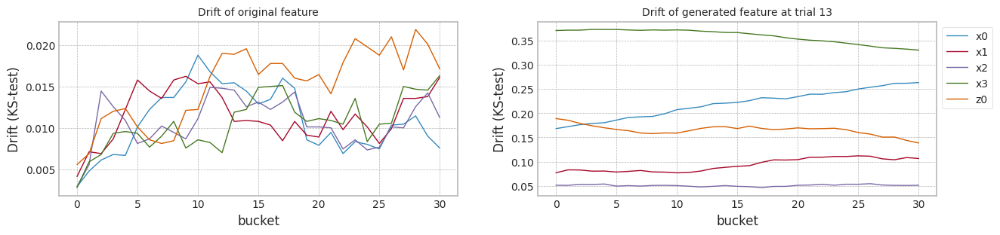

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.936577,0.936577,0.864285,0.749950
1,1.0,0.902841,0.902841,0.846932,0.746269
2,2.0,0.941917,0.941917,0.865783,0.748061
3,3.0,0.927824,0.927824,0.853099,0.738090
4,4.0,0.943549,0.943549,0.863849,0.742024
5,5.0,0.932372,0.932372,0.853864,0.734994
6,6.0,0.944130,0.944130,0.876812,0.761108
7,7.0,0.946383,0.946383,0.873505,0.755226
8,8.0,0.907679,0.907679,0.848915,0.751044
9,9.0,0.911117,0.911117,0.855052,0.751720


,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.959708,0.959708,0.923579,0.847164
1,1.0,0.966566,0.966566,0.913763,0.810238
2,2.0,0.916894,0.916894,0.847154,0.732635
3,3.0,0.964487,0.964487,0.887787,0.704134
4,4.0,0.957275,0.957275,0.894616,0.743243
5,5.0,0.937946,0.937946,0.901629,0.827210
6,6.0,0.941741,0.941741,0.876658,0.756636
7,7.0,0.937707,0.937707,0.880109,0.778588
8,8.0,0.737728,0.737728,0.694221,0.645394
9,9.0,0.955185,0.955185,0.882162,0.740560


In [147]:
_,_,_,_,_,_ = drift_tolerant(X1, Y1,train_size, test_size,avaible_range = 100,trial_count=20)

trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 618.68it/s]


Test f1 score: 0.9365773646801531
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8642847292771869
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 223.99it/s]


Test f1 score: 0.9597076461769115
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.201523
x1    0.091384
x2    0.044720
x3    0.340190
z0    0.251749
dtype: float64
Mean F1 for all data: 0.9235793336762752
Normal model mean        : 0.8642847292771869
Drift tolerant model mean: 0.9235793336762752
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 639.22it/s]


Test f1 score: 0.9028411083830234
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8469316917106153
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.85it/s]


Test f1 score: 0.9665664913598797
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.189247
x1    0.103878
x2    0.045423
x3    0.361172
z0    0.185975
dtype: float64
Mean F1 for all data: 0.913763422892422
Normal model mean        : 0.8556082104939011
Drift tolerant model mean: 0.9186713782843485
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 626.42it/s]


Test f1 score: 0.9419166590681134
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8657830548042339
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.90it/s]


Test f1 score: 0.9168938705442795
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.216731
x1    0.070642
x2    0.012308
x3    0.098158
z0    0.154735
dtype: float64
Mean F1 for all data: 0.8471539117505729
Normal model mean        : 0.8589998252640121
Drift tolerant model mean: 0.8948322227730899
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 626.24it/s]


Test f1 score: 0.927823791753891
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8530985460199252
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.32it/s]


Test f1 score: 0.9644870349492672
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.282498
x1    0.087609
x2    0.040749
x3    0.349642
z0    0.169140
dtype: float64
Mean F1 for all data: 0.8877871294582194
Normal model mean        : 0.8575245054529903
Drift tolerant model mean: 0.8930709494443723
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 623.99it/s]


Test f1 score: 0.9435491297541211
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8638492163836325
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.09it/s]


Test f1 score: 0.9572745043284
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.170136
x1    0.086882
x2    0.043935
x3    0.499918
z0    0.205194
dtype: float64
Mean F1 for all data: 0.8946157228426808
Normal model mean        : 0.8587894476391188
Drift tolerant model mean: 0.893379904124034
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 632.73it/s]


Test f1 score: 0.9323719996349367
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8538638027201683
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.78it/s]


Test f1 score: 0.9379463871626008
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.210179
x1    0.087763
x2    0.054444
x3    0.171728
z0    0.277498
dtype: float64
Mean F1 for all data: 0.9016291193314662
Normal model mean        : 0.8579685068192937
Drift tolerant model mean: 0.8947547733252726
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 629.69it/s]


Test f1 score: 0.9441299981741829
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8768117398301123
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.93it/s]


Test f1 score: 0.94174129812575
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.203419
x1    0.490638
x2    0.029717
x3    0.227254
z0    0.270405
dtype: float64
Mean F1 for all data: 0.8766578771242723
Normal model mean        : 0.8606603972494106
Drift tolerant model mean: 0.8921695024394155
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 628.56it/s]


Test f1 score: 0.9463826661770106
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8735046023959795
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 226.55it/s]


Test f1 score: 0.9377067254685777
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.239158
x1    0.104136
x2    0.246419
x3    0.096520
z0    0.222616
dtype: float64
Mean F1 for all data: 0.8801087405846524
Normal model mean        : 0.8622659228927317
Drift tolerant model mean: 0.8906619072075701
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 631.01it/s]


Test f1 score: 0.9076790336496979
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8489149571671706
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.35it/s]


Test f1 score: 0.7377279102384292
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.013025
x1    0.011627
x2    0.034351
x3    0.009674
z0    0.030477
dtype: float64
Mean F1 for all data: 0.6942212592162726
Normal model mean        : 0.8607824822565582
Drift tolerant model mean: 0.8688351685418704
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 624.12it/s]


Test f1 score: 0.9111170544708924
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8550521107104606
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.52it/s]


Test f1 score: 0.9551849436317897
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.221358
x1    0.096427
x2    0.041480
x3    0.278434
z0    0.302136
dtype: float64
Mean F1 for all data: 0.8821623311000811
Normal model mean        : 0.8602094451019484
Drift tolerant model mean: 0.8701678847976915
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 631.91it/s]


Test f1 score: 0.9177255113994772
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8495588586168183
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.27it/s]


Test f1 score: 0.9708042945940855
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.180832
x1    0.074151
x2    0.045530
x3    0.422337
z0    0.236427
dtype: float64
Mean F1 for all data: 0.9297402114247736
Normal model mean        : 0.8592412099669366
Drift tolerant model mean: 0.875583550854699
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 620.92it/s]


Test f1 score: 0.9509253291593777
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8709828417498167
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.05it/s]


Test f1 score: 0.9642890794308866
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.235086
x1    0.070401
x2    0.049387
x3    0.571728
z0    0.169305
dtype: float64
Mean F1 for all data: 0.8799156572453161
Normal model mean        : 0.8602196792821766
Drift tolerant model mean: 0.8759445597205837
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 597.83it/s]


Test f1 score: 0.9354986696027159
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8640108549268376
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.93it/s]


Test f1 score: 0.9531906941978884
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.220222
x1    0.103961
x2    0.496000
x3    0.067871
z0    0.266344
dtype: float64
Mean F1 for all data: 0.9125782032291564
Normal model mean        : 0.8605113081779197
Drift tolerant model mean: 0.8787625322981663
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 634.08it/s]


Test f1 score: 0.9323280951948406
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8620007927678985
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.44it/s]


Test f1 score: 0.9630534925260882
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.219355
x1    0.093204
x2    0.050785
x3    0.359341
z0    0.165369
dtype: float64
Mean F1 for all data: 0.9367425433815952
Normal model mean        : 0.8606176999343467
Drift tolerant model mean: 0.8829039616612683
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.78it/s]


Test f1 score: 0.9535182803600956
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8780393121411657
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.05it/s]


Test f1 score: 0.9633096218644703
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.223344
x1    0.085935
x2    0.045867
x3    0.411814
z0    0.217749
dtype: float64
Mean F1 for all data: 0.9236830032438504
Normal model mean        : 0.8617791407481347
Drift tolerant model mean: 0.8856225644334403
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 629.58it/s]


Test f1 score: 0.9458344789661809
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8630626816944518
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.77it/s]


Test f1 score: 0.9417386509832751
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.281699
x1    0.081692
x2    0.017237
x3    0.202226
z0    0.182183
dtype: float64
Mean F1 for all data: 0.9101602930458167
Normal model mean        : 0.8618593620572795
Drift tolerant model mean: 0.887156172471714
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 630.37it/s]


Test f1 score: 0.9391224862888483
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8693336434690625
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.42it/s]


Test f1 score: 0.9437500000000001
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.201369
x1    0.075104
x2    0.025728
x3    0.169315
z0    0.267151
dtype: float64
Mean F1 for all data: 0.913532328814711
Normal model mean        : 0.8622990256697374
Drift tolerant model mean: 0.8887077110801256
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 622.84it/s]


Test f1 score: 0.9419010847582276
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8670944782800035
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.45it/s]


Test f1 score: 0.948811188811189
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.320452
x1    0.106369
x2    0.120387
x3    0.067720
z0    0.179072
dtype: float64
Mean F1 for all data: 0.8584677737239065
Normal model mean        : 0.8625654397036411
Drift tolerant model mean: 0.8870277145603356
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 622.56it/s]


Test f1 score: 0.953120665742025
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8750144620145134
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.02it/s]


Test f1 score: 0.9583449818283477
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.170283
x1    0.083233
x2    0.049283
x3    0.305534
z0    0.244211
dtype: float64
Mean F1 for all data: 0.8905807300058248
Normal model mean        : 0.8632206514042132
Drift tolerant model mean: 0.8872147153732562
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 619.50it/s]


Test f1 score: 0.8895653644512092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8350965307775108
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.41it/s]


Test f1 score: 0.9580995136550692
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.246029
x1    0.107459
x2    0.057068
x3    0.280125
z0    0.186538
dtype: float64
Mean F1 for all data: 0.9255741375713322
Normal model mean        : 0.861814445372878
Drift tolerant model mean: 0.8891326864831599
######################### Trial 0 for Normal model ###########################
retrain_interval: 16
######################### Trial 0 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.03it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.878261233840539
SEA mean: 0.878261233840539
######################### Trial 0 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.66it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9217891850547147
DTEL mean: 0.9217891850547147
######################### Trial 1 for Normal model ###########################
retrain_interval: 16
######################### Trial 1 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.96it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8653115552314158
SEA mean: 0.8717863945359774
######################### Trial 1 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.68it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9035637520517128
DTEL mean: 0.9126764685532138
######################### Trial 2 for Normal model ###########################
retrain_interval: 16
######################### Trial 2 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.04it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8916092490744982
SEA mean: 0.8783940127154843
######################### Trial 2 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.67it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9198200650455031
DTEL mean: 0.9150576673839769
######################### Trial 3 for Normal model ###########################
retrain_interval: 16
######################### Trial 3 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.05it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8625446670973889
SEA mean: 0.8744316763109605
######################### Trial 3 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.65it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9160523781557777
DTEL mean: 0.915306345076927
######################### Trial 4 for Normal model ###########################
retrain_interval: 16
######################### Trial 4 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.07it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8906389313474249
SEA mean: 0.8776731273182534
######################### Trial 4 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.76it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9230285848991983
DTEL mean: 0.9168507930413812
######################### Trial 5 for Normal model ###########################
retrain_interval: 16
######################### Trial 5 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.12it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8888696379872749
SEA mean: 0.8795392124297571
######################### Trial 5 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.75it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9151314915162482
DTEL mean: 0.9165642427871923
######################### Trial 6 for Normal model ###########################
retrain_interval: 16
######################### Trial 6 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.08it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8974406661680506
SEA mean: 0.882096562963799
######################### Trial 6 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.74it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9275515512354802
DTEL mean: 0.9181338582798048
######################### Trial 7 for Normal model ###########################
retrain_interval: 16
######################### Trial 7 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.14it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8879494354291996
SEA mean: 0.882828172021974
######################### Trial 7 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.71it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9272555862126265
DTEL mean: 0.9192740742714076
######################### Trial 8 for Normal model ###########################
retrain_interval: 16
######################### Trial 8 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.07it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8715365171318257
SEA mean: 0.8815735437008464
######################### Trial 8 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.65it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9053927705955884
DTEL mean: 0.9177317071963166
######################### Trial 9 for Normal model ###########################
retrain_interval: 16
######################### Trial 9 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.09it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8680697181563591
SEA mean: 0.8802231611463978
######################### Trial 9 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.69it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9060757141524057
DTEL mean: 0.9165661078919255
######################### Trial 10 for Normal model ###########################
retrain_interval: 16
######################### Trial 10 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.13it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8834127527891936
SEA mean: 0.8805131240230156
######################### Trial 10 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.72it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9075080155237389
DTEL mean: 0.9157426449493631
######################### Trial 11 for Normal model ###########################
retrain_interval: 16
######################### Trial 11 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.11it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8867304437466693
SEA mean: 0.8810312339999867
######################### Trial 11 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.78it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9278849290792052
DTEL mean: 0.9167545019601833
######################### Trial 12 for Normal model ###########################
retrain_interval: 16
######################### Trial 12 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.12it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.889401535293392
SEA mean: 0.8816751033302487
######################### Trial 12 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.75it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9224915833831951
DTEL mean: 0.9171958159157996
######################### Trial 13 for Normal model ###########################
retrain_interval: 16
######################### Trial 13 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.11it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.890196891859645
SEA mean: 0.8822838025109199
######################### Trial 13 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.73it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9183273564957545
DTEL mean: 0.9172766402429392
######################### Trial 14 for Normal model ###########################
retrain_interval: 16
######################### Trial 14 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.05it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8992338377855988
SEA mean: 0.8834138048625652
######################### Trial 14 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.75it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9307591903618048
DTEL mean: 0.9181754769175303
######################### Trial 15 for Normal model ###########################
retrain_interval: 16
######################### Trial 15 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.08it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8882980940934054
SEA mean: 0.8837190729394926
######################### Trial 15 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.72it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9230885408854247
DTEL mean: 0.9184825434155237
######################### Trial 16 for Normal model ###########################
retrain_interval: 16
######################### Trial 16 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.05it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8888831194915755
SEA mean: 0.8840228403837328
######################### Trial 16 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.73it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9243245018526686
DTEL mean: 0.9188261880294734
######################### Trial 17 for Normal model ###########################
retrain_interval: 16
######################### Trial 17 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.09it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8825820482031889
SEA mean: 0.8839427963737025
######################### Trial 17 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.73it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9246015424205534
DTEL mean: 0.9191470410511999
######################### Trial 18 for Normal model ###########################
retrain_interval: 16
######################### Trial 18 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.06it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8960655055196677
SEA mean: 0.8845808336971744
######################### Trial 18 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.71it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9292162896497514
DTEL mean: 0.9196770015037553
######################### Trial 19 for Normal model ###########################
retrain_interval: 16
######################### Trial 19 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.10it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8697666604935703
SEA mean: 0.8838401250369943
######################### Trial 19 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.76it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8922949675157814
DTEL mean: 0.9183078998043566


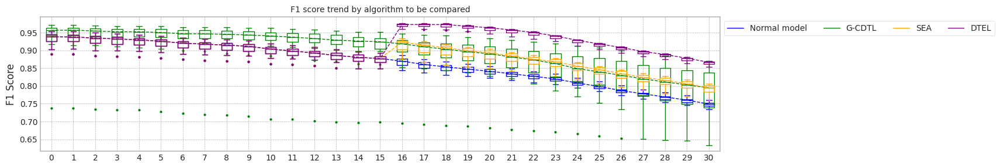

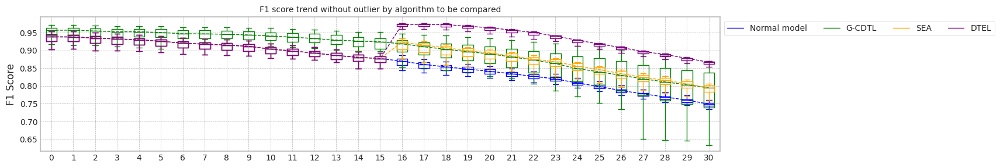

max_mean_trial= 27


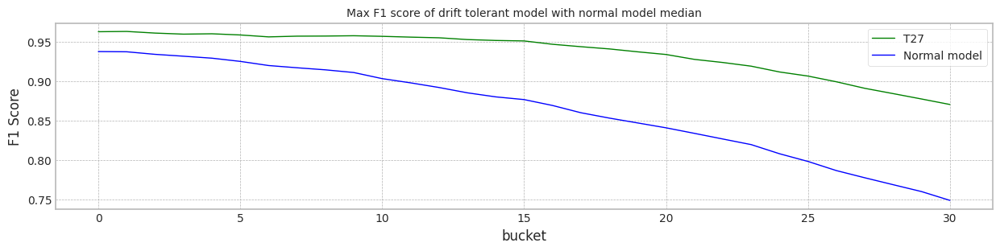

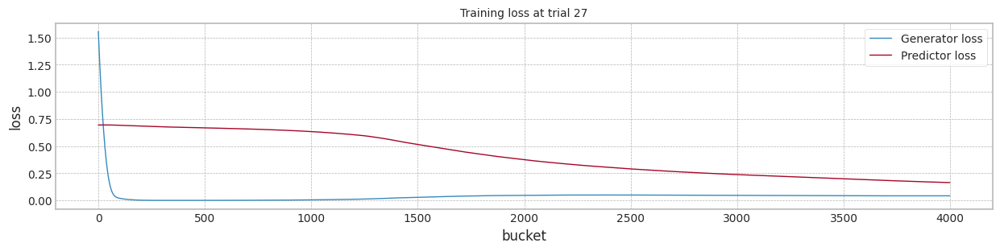

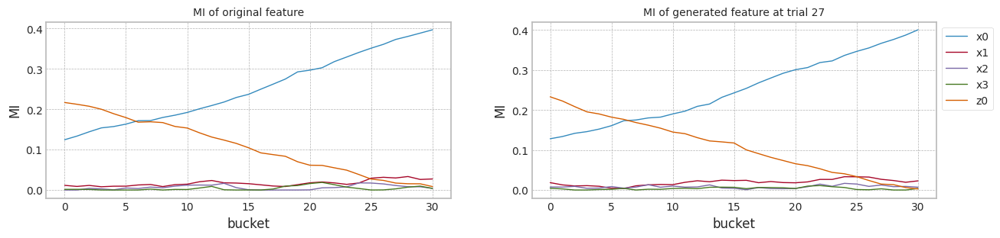

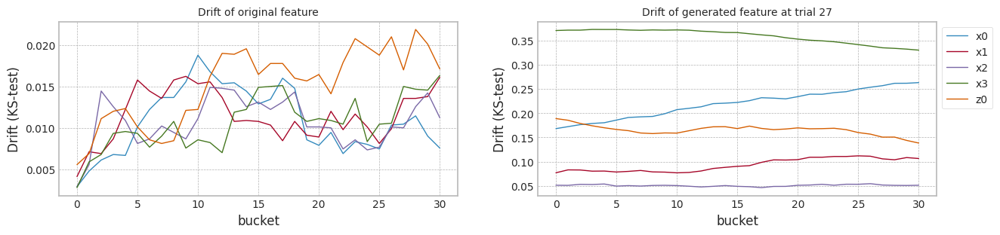

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.936577,0.936170,0.864285,0.749950
1,1.0,0.902841,0.904237,0.846932,0.746269
2,2.0,0.941917,0.940673,0.865783,0.748061
3,3.0,0.927824,0.927312,0.853099,0.738090
4,4.0,0.943549,0.942723,0.863849,0.742024
5,5.0,0.932372,0.931742,0.853864,0.734994
6,6.0,0.944130,0.944025,0.876812,0.761108
7,7.0,0.946383,0.946510,0.873505,0.755226
8,8.0,0.907679,0.907227,0.848915,0.751044
9,9.0,0.911117,0.912312,0.855052,0.751720


,Trial,test_f1,init_f1,mean_f1,last_f1
0,1.0,0.959708,0.960757,0.923579,0.847164
1,3.0,0.966566,0.966955,0.913763,0.810238
2,5.0,0.916894,0.914170,0.847154,0.732635
3,7.0,0.964487,0.964836,0.887787,0.704134
4,9.0,0.957275,0.957613,0.894616,0.743243
5,11.0,0.937946,0.938091,0.901629,0.827210
6,13.0,0.941741,0.941372,0.876658,0.756636
7,15.0,0.937707,0.937322,0.880109,0.778588
8,17.0,0.737728,0.738259,0.694221,0.645394
9,19.0,0.955185,0.955800,0.882162,0.740560


,Trial,test_f1,init_f1,mean_f1,last_f1
0,1.0,0.936577,0.936170,0.878261,0.781284
1,3.0,0.902841,0.904237,0.865312,0.782148
2,5.0,0.941917,0.940673,0.891609,0.800827
3,7.0,0.927824,0.927312,0.862545,0.759168
4,9.0,0.943549,0.942723,0.890639,0.798921
5,11.0,0.932372,0.931742,0.888870,0.804588
6,13.0,0.944130,0.944025,0.897441,0.803429
7,15.0,0.946383,0.946510,0.887949,0.781311
8,17.0,0.907679,0.907227,0.871537,0.793362
9,19.0,0.911117,0.912312,0.868070,0.782811


,Trial,test_f1,init_f1,mean_f1,last_f1
0,1.0,0.936577,0.936170,0.921789,0.867058
1,3.0,0.902841,0.904237,0.903564,0.858126
2,5.0,0.941917,0.940673,0.919820,0.858589
3,7.0,0.927824,0.927312,0.916052,0.868056
4,9.0,0.943549,0.942723,0.923029,0.866109
5,11.0,0.932372,0.931742,0.915131,0.862540
6,13.0,0.944130,0.944025,0.927552,0.867802
7,15.0,0.946383,0.946510,0.927256,0.866652
8,17.0,0.907679,0.907227,0.905393,0.863457
9,19.0,0.911117,0.912312,0.906076,0.854398


In [148]:
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 100,trial_count=20) #np.max(X1['b']+1))


## synthetic data의 생성 (Case #3 MI의 증감(상대적), Drift의 증가)

+ $P_t(y,X) \ne P_{t+w}(y,X) $ 이고 $P_t(y|X) \ne P_{t+w}(y|X) $
+ Real concept drift
+ 즉, P(y|X)와 P(X)의 변화가 연관되어 나타남.
+ 이때 대상 feature $z_0$에 대해서 MI 증가, ks-test 통계량 증가
+ 이에따라 $X_0$의 MI 감소

+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature는 가변 data drift, MI는 고정

### Dataset 준비

In [149]:
import matplotlib.pyplot as plt

cor = np.asarray([2.5, 1.2, 0.9 , 0.7, 1.5])

seed_everything()

x1 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x1[:,ix] = np.random.normal(1,cor_,data_size)

seed_everything()

y1_array = []
cor_const = cor[0]
for ii in range(x1.shape[0]):
    cor[0] = cor[0] - cor_const / x1.shape[0]
    e = np.random.normal(0.0, 2.0)
    e1 = np.random.normal(0.0,  4*ii/40000)
    x1[ii,4] = x1[ii,4] + e1
    y1_array.append(np.sum(cor * x1[ii])+e)

In [150]:
m = np.mean(y1_array)
print(m)
y1 = [1 if y_ > m else 0 for y_ in y1_array]
sum(y1)

5.568336092094251


19898

### 실험

MI Analysis MI Max 0.18765, Min 0.00339, Mean 0.06075, Std 0.07062
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:05<00:00,  5.68it/s]


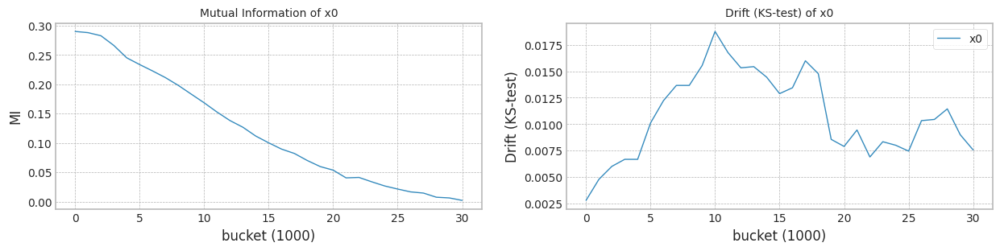

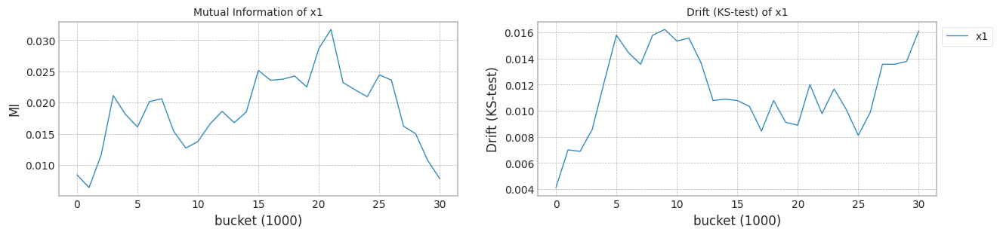

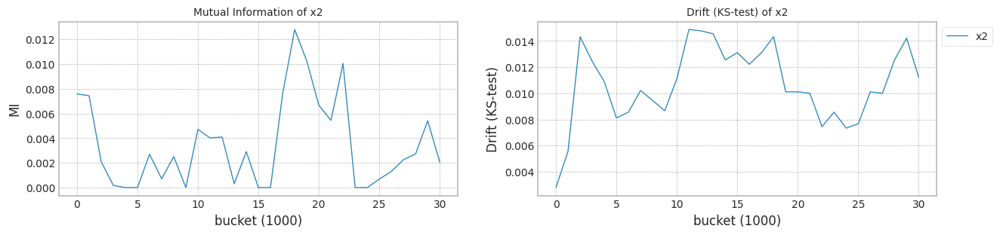

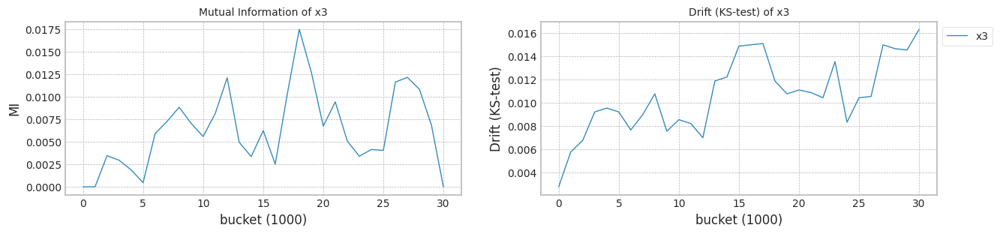

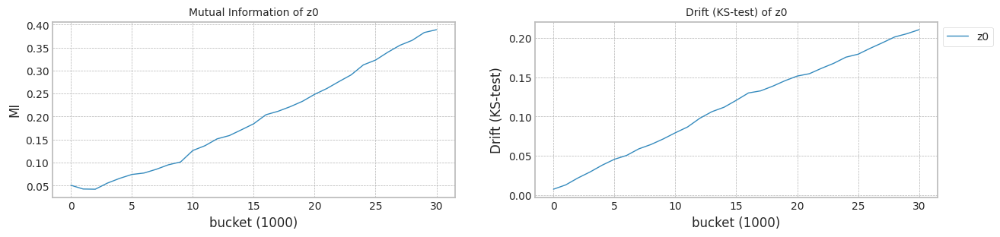

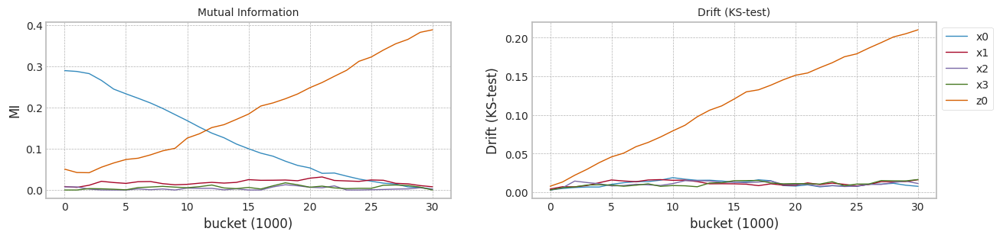

In [151]:
columns=['x0','x1','x2','x3','z0']
X1 = pd.DataFrame(x1,columns=columns)

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X1, y1,train_size, test_size)

In [152]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.525799,0.497734,0.329063,0.549493,0.348766,0
1,0.610533,0.420412,0.508390,0.580336,0.603602,0
2,0.556874,0.464734,0.669603,0.724770,0.452177,0
3,0.344341,0.646524,0.340976,0.528780,0.559737,0
4,0.503142,0.550860,0.598773,0.465698,0.452611,0
...,...,...,...,...,...,...
39995,0.333622,0.399822,0.303105,0.605408,0.612303,39
39996,0.358451,0.483875,0.341855,0.574439,0.395651,39
39997,0.559469,0.343824,0.542547,0.575250,0.268402,39
39998,0.433692,0.530132,0.301231,0.282353,0.347175,39


trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 633.88it/s]


Test f1 score: 0.9054407913878383
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8453543721755923
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.29it/s]


Test f1 score: 0.8964628950757952
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.293462
x1    0.085853
x2    0.038688
x3    0.250975
z0    0.226828
dtype: float64
Mean F1 for all data: 0.8540076992476534
Normal model mean        : 0.8453543721755923
Drift tolerant model mean: 0.8540076992476534
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.03it/s]


Test f1 score: 0.9015375799828096
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8464379189907001
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.12it/s]


Test f1 score: 0.9016018306636157
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.298416
x1    0.250760
x2    0.042333
x3    0.469047
z0    0.213294
dtype: float64
Mean F1 for all data: 0.8363688353726981
Normal model mean        : 0.8458961455831462
Drift tolerant model mean: 0.8451882673101758
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 626.99it/s]


Test f1 score: 0.8790923824959481
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8329214581993726
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.50it/s]


Test f1 score: 0.8804823495088984
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.286885
x1    0.089892
x2    0.092341
x3    0.088172
z0    0.232692
dtype: float64
Mean F1 for all data: 0.8105259219467809
Normal model mean        : 0.8415712497885549
Drift tolerant model mean: 0.8336341521890441
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.46it/s]


Test f1 score: 0.9065858901700216
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8402398396461872
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.77it/s]


Test f1 score: 0.9062716049382716
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.334513
x1    0.091043
x2    0.042638
x3    0.018459
z0    0.222638
dtype: float64
Mean F1 for all data: 0.8319215971828265
Normal model mean        : 0.841238397252963
Drift tolerant model mean: 0.8332060134374898
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 627.86it/s]


Test f1 score: 0.874513516356369
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.833877151092165
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.04it/s]


Test f1 score: 0.9008866995073891
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.308599
x1    0.103355
x2    0.045828
x3    0.039674
z0    0.231165
dtype: float64
Mean F1 for all data: 0.8434085863427638
Normal model mean        : 0.8397661480208034
Drift tolerant model mean: 0.8352465280185445
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 631.03it/s]


Test f1 score: 0.8991177598772535
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8501821105869609
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.14it/s]


Test f1 score: 0.8951573133445113
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.268989
x1    0.087341
x2    0.037961
x3    0.120290
z0    0.338072
dtype: float64
Mean F1 for all data: 0.82000818021724
Normal model mean        : 0.8415021417818297
Drift tolerant model mean: 0.8327068033849937
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 641.96it/s]


Test f1 score: 0.9084148727984345
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8446283923086593
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 234.09it/s]


Test f1 score: 0.8967633376224883
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.231154
x1    0.092903
x2    0.061409
x3    0.121057
z0    0.228409
dtype: float64
Mean F1 for all data: 0.8482699351332197
Normal model mean        : 0.8419487489999483
Drift tolerant model mean: 0.8349301079204546
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 642.40it/s]


Test f1 score: 0.9016629818321638
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8436741098491424
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 233.84it/s]


Test f1 score: 0.8991745283018867
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.238079
x1    0.126681
x2    0.042384
x3    0.049168
z0    0.227950
dtype: float64
Mean F1 for all data: 0.8525584754842773
Normal model mean        : 0.8421644191060975
Drift tolerant model mean: 0.8371336538659324
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 640.32it/s]


Test f1 score: 0.8778094898323224
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8196373067452564
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 233.73it/s]


Test f1 score: 0.8655550865344027
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.170090
x1    0.050964
x2    0.037050
x3    0.106014
z0    0.218351
dtype: float64
Mean F1 for all data: 0.80056355942222
Normal model mean        : 0.8396614066215595
Drift tolerant model mean: 0.8330703100388532
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 642.35it/s]


Test f1 score: 0.8848133848133848
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8418763722653503
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.58it/s]


Test f1 score: 0.8976440308849732
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.278609
x1    0.092452
x2    0.041351
x3    0.093172
z0    0.428168
dtype: float64
Mean F1 for all data: 0.7552730995553693
Normal model mean        : 0.8398829031859387
Drift tolerant model mean: 0.8252905889905049
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 638.94it/s]


Test f1 score: 0.8964992389649925
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8372726779199555
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.18it/s]


Test f1 score: 0.8971275221150978
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.298699
x1    0.105588
x2    0.051032
x3    0.209953
z0    0.363470
dtype: float64
Mean F1 for all data: 0.7671890274045243
Normal model mean        : 0.8396456099799402
Drift tolerant model mean: 0.820008628846325
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 632.02it/s]


Test f1 score: 0.904684043474079
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8491028761323587
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.16it/s]


Test f1 score: 0.9049082796232027
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.264337
x1    0.089065
x2    0.049136
x3    0.035487
z0    0.289129
dtype: float64
Mean F1 for all data: 0.8292212854036568
Normal model mean        : 0.8404337154926417
Drift tolerant model mean: 0.8207763502261026
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.03it/s]


Test f1 score: 0.9009640666082385
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8318077886587496
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 233.74it/s]


Test f1 score: 0.8956255554458378
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.308054
x1    0.154638
x2    0.053140
x3    0.170312
z0    0.298516
dtype: float64
Mean F1 for all data: 0.7960058616552171
Normal model mean        : 0.8397701826592654
Drift tolerant model mean: 0.8188709280283422
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 631.54it/s]


Test f1 score: 0.9074399531341535
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8440742078707373
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 233.16it/s]


Test f1 score: 0.9019452163556967
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.298154
x1    0.153523
x2    0.047276
x3    0.066014
z0    0.232348
dtype: float64
Mean F1 for all data: 0.8307129154551185
Normal model mean        : 0.8400776130315134
Drift tolerant model mean: 0.8197167842731119
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 641.39it/s]


Test f1 score: 0.908574784651527
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8519466783311462
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.63it/s]


Test f1 score: 0.8969889064976229
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.307297
x1    0.092229
x2    0.050219
x3    0.214039
z0    0.242767
dtype: float64
Mean F1 for all data: 0.828250961440992
Normal model mean        : 0.8408688840514889
Drift tolerant model mean: 0.8202857294176372
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 638.96it/s]


Test f1 score: 0.8847305389221557
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8346146363782149
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 234.02it/s]


Test f1 score: 0.8905336969224777
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.298907
x1    0.087265
x2    0.024717
x3    0.100097
z0    0.228986
dtype: float64
Mean F1 for all data: 0.8387043516323456
Normal model mean        : 0.8404779935719093
Drift tolerant model mean: 0.8214368933060565
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 635.10it/s]


Test f1 score: 0.9065629557608167
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8438015055358291
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 234.40it/s]


Test f1 score: 0.9013254786450662
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.353000
x1    0.089090
x2    0.045595
x3    0.050337
z0    0.228534
dtype: float64
Mean F1 for all data: 0.8326930548379631
Normal model mean        : 0.8406734942756693
Drift tolerant model mean: 0.8220990204549922
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 635.42it/s]


Test f1 score: 0.9037730330505995
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.62it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8348815004210832
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 233.46it/s]


Test f1 score: 0.9026984439629703
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.339975
x1    0.096068
x2    0.045233
x3    0.025789
z0    0.222505
dtype: float64
Mean F1 for all data: 0.8260263759674747
Normal model mean        : 0.8403517168393034
Drift tolerant model mean: 0.8223172068723523
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 635.12it/s]


Test f1 score: 0.9064945226917058
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8414137885572965
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.60it/s]


Test f1 score: 0.8989141164856861
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.373964
x1    0.087337
x2    0.047599
x3    0.063326
z0    0.279280
dtype: float64
Mean F1 for all data: 0.7730423944633934
Normal model mean        : 0.8404076153507768
Drift tolerant model mean: 0.8197237956929334
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 635.55it/s]


Test f1 score: 0.8789854425292489
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8228052891027811
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 233.62it/s]


Test f1 score: 0.9002361275088547
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.62it/s]


mean of drift:
x0    0.347172
x1    0.098068
x2    0.051642
x3    0.045459
z0    0.237333
dtype: float64
Mean F1 for all data: 0.8183447420788899
Normal model mean        : 0.839527499038377
Drift tolerant model mean: 0.8196548430122312


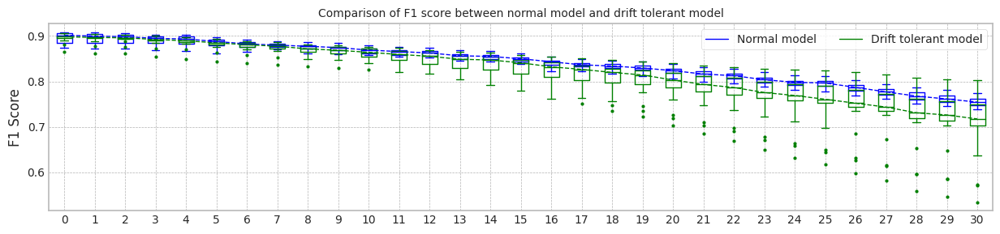

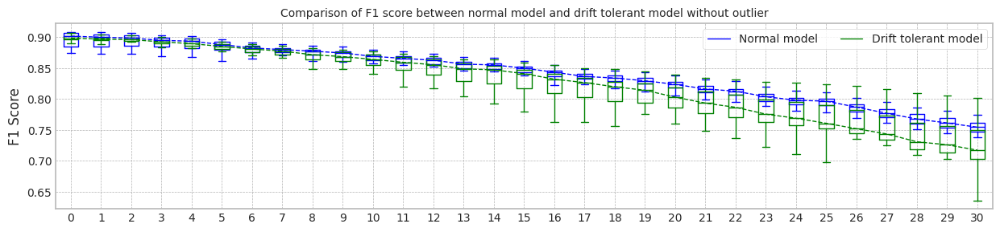

max_mean_trial= 0


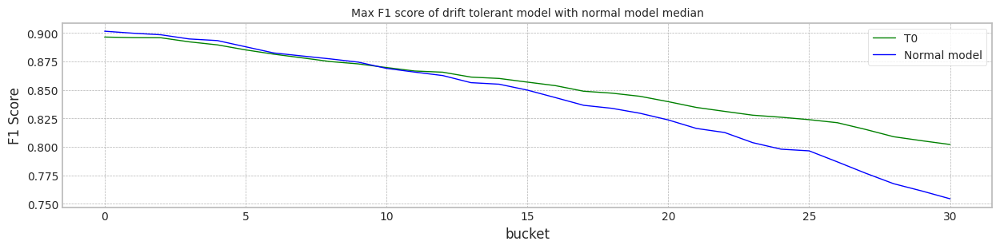

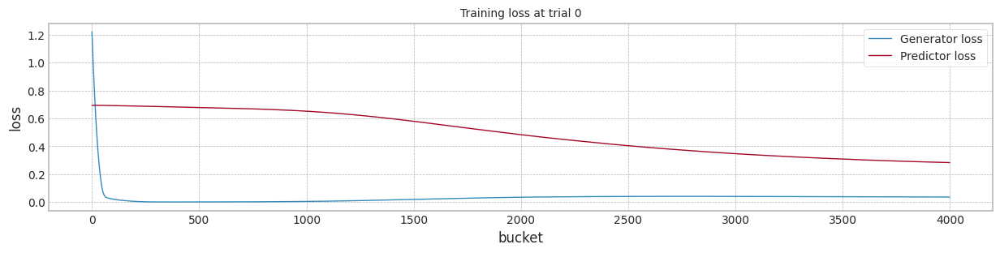

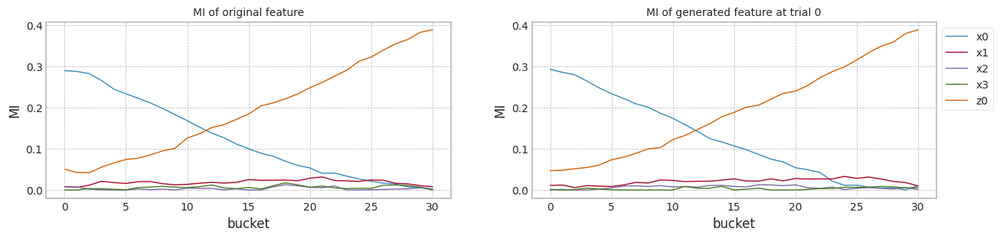

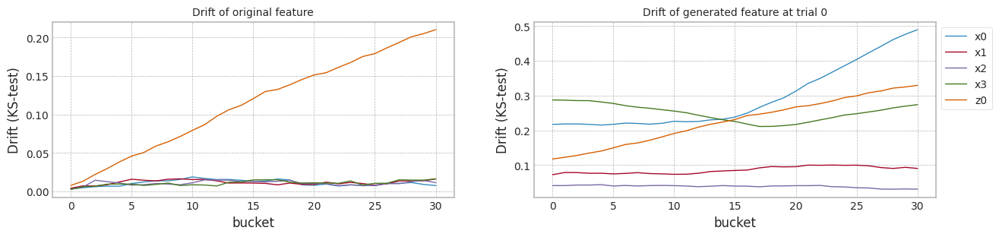

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.905441,0.905441,0.845354,0.761285
1,1.0,0.901538,0.901538,0.846438,0.765446
2,2.0,0.879092,0.879092,0.832921,0.747382
3,3.0,0.906586,0.906586,0.840240,0.748063
4,4.0,0.874514,0.874514,0.833877,0.763835
5,5.0,0.899118,0.899118,0.850182,0.774343
6,6.0,0.908415,0.908415,0.844628,0.753299
7,7.0,0.901663,0.901663,0.843674,0.761518
8,8.0,0.877809,0.877809,0.819637,0.742664
9,9.0,0.884813,0.884813,0.841876,0.755380


,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.896463,0.896463,0.854008,0.802141
1,1.0,0.901602,0.901602,0.836369,0.754377
2,2.0,0.880482,0.880482,0.810526,0.710979
3,3.0,0.906272,0.906272,0.831922,0.707283
4,4.0,0.900887,0.900887,0.843409,0.747795
5,5.0,0.895157,0.895157,0.820008,0.717619
6,6.0,0.896763,0.896763,0.848270,0.785497
7,7.0,0.899175,0.899175,0.852558,0.785137
8,8.0,0.865555,0.865555,0.800564,0.730587
9,9.0,0.897644,0.897644,0.755273,0.534348


In [153]:
_,_,_,_,_,_ = drift_tolerant(X1, Y1,train_size, test_size,avaible_range = 100,trial_count=20)

trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 620.22it/s]


Test f1 score: 0.9054407913878383
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8453543721755923
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.08it/s]


Test f1 score: 0.8964628950757952
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.293462
x1    0.085853
x2    0.038688
x3    0.250975
z0    0.226828
dtype: float64
Mean F1 for all data: 0.8540076992476534
Normal model mean        : 0.8453543721755923
Drift tolerant model mean: 0.8540076992476534
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 632.66it/s]


Test f1 score: 0.9015375799828096
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8464379189907001
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.79it/s]


Test f1 score: 0.9016018306636157
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.298416
x1    0.250760
x2    0.042333
x3    0.469047
z0    0.213294
dtype: float64
Mean F1 for all data: 0.8363688353726981
Normal model mean        : 0.8458961455831462
Drift tolerant model mean: 0.8451882673101758
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 633.58it/s]


Test f1 score: 0.8790923824959481
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.63it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8329214581993726
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.28it/s]


Test f1 score: 0.8804823495088984
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.286885
x1    0.089892
x2    0.092341
x3    0.088172
z0    0.232692
dtype: float64
Mean F1 for all data: 0.8105259219467809
Normal model mean        : 0.8415712497885549
Drift tolerant model mean: 0.8336341521890441
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 627.15it/s]


Test f1 score: 0.9065858901700216
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8402398396461872
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.93it/s]


Test f1 score: 0.9062716049382716
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.334513
x1    0.091043
x2    0.042638
x3    0.018459
z0    0.222638
dtype: float64
Mean F1 for all data: 0.8319215971828265
Normal model mean        : 0.841238397252963
Drift tolerant model mean: 0.8332060134374898
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 635.11it/s]


Test f1 score: 0.874513516356369
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.833877151092165
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.62it/s]


Test f1 score: 0.9008866995073891
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.308599
x1    0.103355
x2    0.045828
x3    0.039674
z0    0.231165
dtype: float64
Mean F1 for all data: 0.8434085863427638
Normal model mean        : 0.8397661480208034
Drift tolerant model mean: 0.8352465280185445
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 635.97it/s]


Test f1 score: 0.8991177598772535
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8501821105869609
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.52it/s]


Test f1 score: 0.8951573133445113
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.268989
x1    0.087341
x2    0.037961
x3    0.120290
z0    0.338072
dtype: float64
Mean F1 for all data: 0.82000818021724
Normal model mean        : 0.8415021417818297
Drift tolerant model mean: 0.8327068033849937
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.33it/s]


Test f1 score: 0.9084148727984345
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8446283923086593
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.79it/s]


Test f1 score: 0.8967633376224883
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.231154
x1    0.092903
x2    0.061409
x3    0.121057
z0    0.228409
dtype: float64
Mean F1 for all data: 0.8482699351332197
Normal model mean        : 0.8419487489999483
Drift tolerant model mean: 0.8349301079204546
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.71it/s]


Test f1 score: 0.9016629818321638
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8436741098491424
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.62it/s]


Test f1 score: 0.8991745283018867
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.238079
x1    0.126681
x2    0.042384
x3    0.049168
z0    0.227950
dtype: float64
Mean F1 for all data: 0.8525584754842773
Normal model mean        : 0.8421644191060975
Drift tolerant model mean: 0.8371336538659324
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 620.65it/s]


Test f1 score: 0.8778094898323224
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8196373067452564
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.97it/s]


Test f1 score: 0.8655550865344027
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.170090
x1    0.050964
x2    0.037050
x3    0.106014
z0    0.218351
dtype: float64
Mean F1 for all data: 0.80056355942222
Normal model mean        : 0.8396614066215595
Drift tolerant model mean: 0.8330703100388532
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 635.14it/s]


Test f1 score: 0.8848133848133848
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8418763722653503
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.20it/s]


Test f1 score: 0.8976440308849732
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.278609
x1    0.092452
x2    0.041351
x3    0.093172
z0    0.428168
dtype: float64
Mean F1 for all data: 0.7552730995553693
Normal model mean        : 0.8398829031859387
Drift tolerant model mean: 0.8252905889905049
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 631.71it/s]


Test f1 score: 0.8964992389649925
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8372726779199555
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.49it/s]


Test f1 score: 0.8971275221150978
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.298699
x1    0.105588
x2    0.051032
x3    0.209953
z0    0.363470
dtype: float64
Mean F1 for all data: 0.7671890274045243
Normal model mean        : 0.8396456099799402
Drift tolerant model mean: 0.820008628846325
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 633.49it/s]


Test f1 score: 0.904684043474079
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8491028761323587
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 233.00it/s]


Test f1 score: 0.9049082796232027
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.264337
x1    0.089065
x2    0.049136
x3    0.035487
z0    0.289129
dtype: float64
Mean F1 for all data: 0.8292212854036568
Normal model mean        : 0.8404337154926417
Drift tolerant model mean: 0.8207763502261026
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 629.52it/s]


Test f1 score: 0.9009640666082385
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8318077886587496
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.36it/s]


Test f1 score: 0.8956255554458378
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.308054
x1    0.154638
x2    0.053140
x3    0.170312
z0    0.298516
dtype: float64
Mean F1 for all data: 0.7960058616552171
Normal model mean        : 0.8397701826592654
Drift tolerant model mean: 0.8188709280283422
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.10it/s]


Test f1 score: 0.9074399531341535
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8440742078707373
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 234.39it/s]


Test f1 score: 0.9019452163556967
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.298154
x1    0.153523
x2    0.047276
x3    0.066014
z0    0.232348
dtype: float64
Mean F1 for all data: 0.8307129154551185
Normal model mean        : 0.8400776130315134
Drift tolerant model mean: 0.8197167842731119
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 626.46it/s]


Test f1 score: 0.908574784651527
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8519466783311462
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.27it/s]


Test f1 score: 0.8969889064976229
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.307297
x1    0.092229
x2    0.050219
x3    0.214039
z0    0.242767
dtype: float64
Mean F1 for all data: 0.828250961440992
Normal model mean        : 0.8408688840514889
Drift tolerant model mean: 0.8202857294176372
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 633.69it/s]


Test f1 score: 0.8847305389221557
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.37it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8346146363782149
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.25it/s]


Test f1 score: 0.8905336969224777
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.298907
x1    0.087265
x2    0.024717
x3    0.100097
z0    0.228986
dtype: float64
Mean F1 for all data: 0.8387043516323456
Normal model mean        : 0.8404779935719093
Drift tolerant model mean: 0.8214368933060565
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 590.32it/s]


Test f1 score: 0.9065629557608167
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8438015055358291
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.47it/s]


Test f1 score: 0.9013254786450662
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.353000
x1    0.089090
x2    0.045595
x3    0.050337
z0    0.228534
dtype: float64
Mean F1 for all data: 0.8326930548379631
Normal model mean        : 0.8406734942756693
Drift tolerant model mean: 0.8220990204549922
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 610.87it/s]


Test f1 score: 0.9037730330505995
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8348815004210832
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.77it/s]


Test f1 score: 0.9026984439629703
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.339975
x1    0.096068
x2    0.045233
x3    0.025789
z0    0.222505
dtype: float64
Mean F1 for all data: 0.8260263759674747
Normal model mean        : 0.8403517168393034
Drift tolerant model mean: 0.8223172068723523
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 618.71it/s]


Test f1 score: 0.9064945226917058
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8414137885572965
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.45it/s]


Test f1 score: 0.8989141164856861
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.373964
x1    0.087337
x2    0.047599
x3    0.063326
z0    0.279280
dtype: float64
Mean F1 for all data: 0.7730423944633934
Normal model mean        : 0.8404076153507768
Drift tolerant model mean: 0.8197237956929334
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 620.92it/s]


Test f1 score: 0.8789854425292489
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8228052891027811
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.99it/s]


Test f1 score: 0.9002361275088547
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.347172
x1    0.098068
x2    0.051642
x3    0.045459
z0    0.237333
dtype: float64
Mean F1 for all data: 0.8183447420788899
Normal model mean        : 0.839527499038377
Drift tolerant model mean: 0.8196548430122312
######################### Trial 0 for Normal model ###########################
retrain_interval: 16
######################### Trial 0 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.11it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8596710553779855
SEA mean: 0.8596710553779855
######################### Trial 0 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.80it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8733680513148688
DTEL mean: 0.8733680513148688
######################### Trial 1 for Normal model ###########################
retrain_interval: 16
######################### Trial 1 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.11it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8638503111599042
SEA mean: 0.8617606832689448
######################### Trial 1 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.79it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8720883589295202
DTEL mean: 0.8727282051221945
######################### Trial 2 for Normal model ###########################
retrain_interval: 16
######################### Trial 2 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.07it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8587293060530703
SEA mean: 0.8607502241969867
######################### Trial 2 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.74it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8669960598144522
DTEL mean: 0.8708174900196136
######################### Trial 3 for Normal model ###########################
retrain_interval: 16
######################### Trial 3 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.12it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8547871547435398
SEA mean: 0.8592594568336249
######################### Trial 3 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.71it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8725297108840228
DTEL mean: 0.871245545235716
######################### Trial 4 for Normal model ###########################
retrain_interval: 16
######################### Trial 4 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.06it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8552823070808143
SEA mean: 0.8584640268830628
######################### Trial 4 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.67it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8620391868730357
DTEL mean: 0.8694042735631798
######################### Trial 5 for Normal model ###########################
retrain_interval: 16
######################### Trial 5 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.10it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8680592864592629
SEA mean: 0.8600632368124295
######################### Trial 5 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.70it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8733163257551599
DTEL mean: 0.8700562822618432
######################### Trial 6 for Normal model ###########################
retrain_interval: 16
######################### Trial 6 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.15it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8627505350276671
SEA mean: 0.8604471365574634
######################### Trial 6 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.74it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8739335691238737
DTEL mean: 0.8706101803849904
######################### Trial 7 for Normal model ###########################
retrain_interval: 16
######################### Trial 7 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.01it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8631803258392042
SEA mean: 0.860788785217681
######################### Trial 7 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.66it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.871406988230169
DTEL mean: 0.8707097813656377
######################### Trial 8 for Normal model ###########################
retrain_interval: 16
######################### Trial 8 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.03it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8478392901355912
SEA mean: 0.8593499524307822
######################### Trial 8 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.68it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8576379002942413
DTEL mean: 0.8692573501354826
######################### Trial 9 for Normal model ###########################
retrain_interval: 16
######################### Trial 9 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.05it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8638451654208814
SEA mean: 0.859799473729792
######################### Trial 9 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.69it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8714724578851075
DTEL mean: 0.8694788609104451
######################### Trial 10 for Normal model ###########################
retrain_interval: 16
######################### Trial 10 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.07it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8600406786068572
SEA mean: 0.8598214014458889
######################### Trial 10 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.61it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8680805411068291
DTEL mean: 0.8693517409282983
######################### Trial 11 for Normal model ###########################
retrain_interval: 16
######################### Trial 11 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.02it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8605441423721291
SEA mean: 0.8598816298564089
######################### Trial 11 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.66it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8738473271169986
DTEL mean: 0.8697263731106899
######################### Trial 12 for Normal model ###########################
retrain_interval: 16
######################### Trial 12 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.03it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.856225697220572
SEA mean: 0.8596004042690368
######################### Trial 12 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.69it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8690058699926991
DTEL mean: 0.8696709497939215
######################### Trial 13 for Normal model ###########################
retrain_interval: 16
######################### Trial 13 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.03it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8648225837268877
SEA mean: 0.8599734170874547
######################### Trial 13 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.77it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.874812933586624
DTEL mean: 0.870038234350543
######################### Trial 14 for Normal model ###########################
retrain_interval: 16
######################### Trial 14 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.04it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8684897626637385
SEA mean: 0.860541173459207
######################### Trial 14 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.73it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8759578049892578
DTEL mean: 0.870432872393124
######################### Trial 15 for Normal model ###########################
retrain_interval: 16
######################### Trial 15 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.10it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8602607606243993
SEA mean: 0.8605236476570315
######################### Trial 15 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.69it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8687648808443221
DTEL mean: 0.8703286229213238
######################### Trial 16 for Normal model ###########################
retrain_interval: 16
######################### Trial 16 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.96it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8643826786035421
SEA mean: 0.8607506494774144
######################### Trial 16 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.66it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8733781029964903
DTEL mean: 0.870508004102216
######################### Trial 17 for Normal model ###########################
retrain_interval: 16
######################### Trial 17 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.00it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8529559162770025
SEA mean: 0.8603176087440583
######################### Trial 17 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.68it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8702698685740319
DTEL mean: 0.8704947743506503
######################### Trial 18 for Normal model ###########################
retrain_interval: 16
######################### Trial 18 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.01it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8628996809107189
SEA mean: 0.8604535072791456
######################### Trial 18 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.60it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8731309873792363
DTEL mean: 0.8706335224047863
######################### Trial 19 for Normal model ###########################
retrain_interval: 16
######################### Trial 19 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.97it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8519657780324424
SEA mean: 0.8600291208168105
######################### Trial 19 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.72it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.858855468665938
DTEL mean: 0.8700446197178439


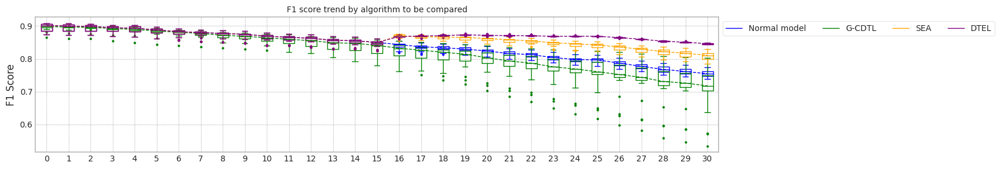

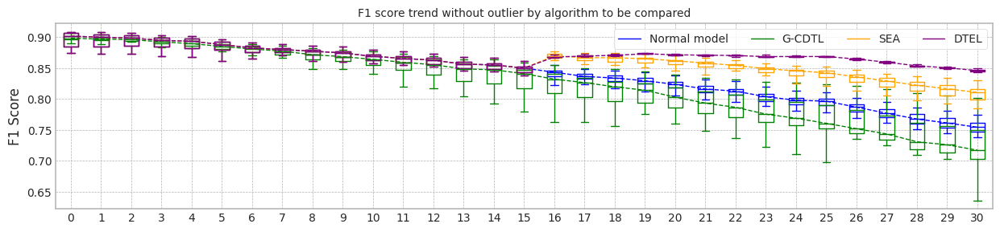

max_mean_trial= 1


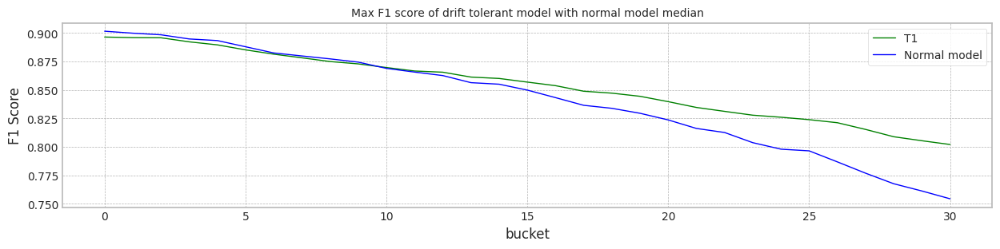

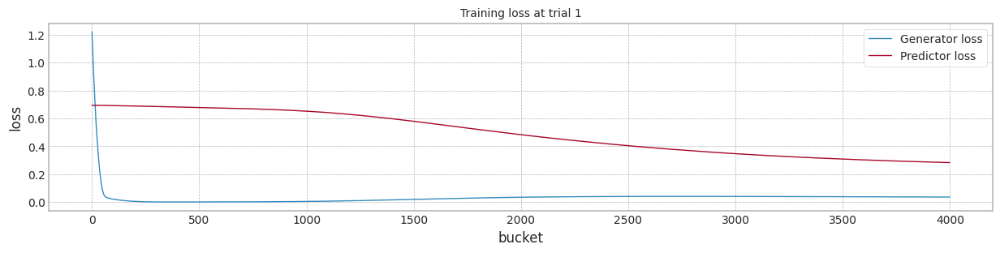

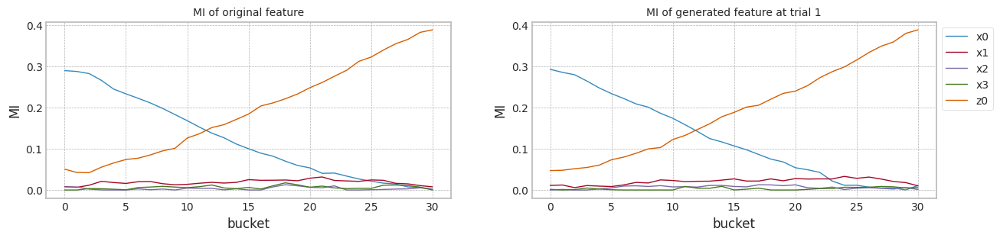

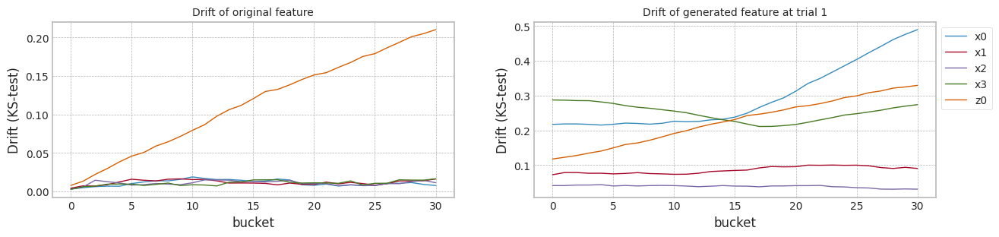

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.905441,0.904290,0.845354,0.761285
1,1.0,0.901538,0.899809,0.846438,0.765446
2,2.0,0.879092,0.878539,0.832921,0.747382
3,3.0,0.906586,0.905000,0.840240,0.748063
4,4.0,0.874514,0.873106,0.833877,0.763835
5,5.0,0.899118,0.897908,0.850182,0.774343
6,6.0,0.908415,0.906795,0.844628,0.753299
7,7.0,0.901663,0.899884,0.843674,0.761518
8,8.0,0.877809,0.876698,0.819637,0.742664
9,9.0,0.884813,0.885387,0.841876,0.755380


,Trial,test_f1,init_f1,mean_f1,last_f1
0,1.0,0.896463,0.895941,0.854008,0.802141
1,3.0,0.901602,0.900170,0.836369,0.754377
2,5.0,0.880482,0.878363,0.810526,0.710979
3,7.0,0.906272,0.904493,0.831922,0.707283
4,9.0,0.900887,0.899525,0.843409,0.747795
5,11.0,0.895157,0.893431,0.820008,0.717619
6,13.0,0.896763,0.895914,0.848270,0.785497
7,15.0,0.899175,0.897600,0.852558,0.785137
8,17.0,0.865555,0.862109,0.800564,0.730587
9,19.0,0.897644,0.896545,0.755273,0.534348


,Trial,test_f1,init_f1,mean_f1,last_f1
0,1.0,0.905441,0.904290,0.859671,0.797728
1,3.0,0.901538,0.899809,0.863850,0.814935
2,5.0,0.879092,0.878539,0.858729,0.821060
3,7.0,0.906586,0.905000,0.854787,0.785207
4,9.0,0.874514,0.873106,0.855282,0.830257
5,11.0,0.899118,0.897908,0.868059,0.820603
6,13.0,0.908415,0.906795,0.862751,0.798710
7,15.0,0.901663,0.899884,0.863180,0.814045
8,17.0,0.877809,0.876698,0.847839,0.811721
9,19.0,0.884813,0.885387,0.863845,0.823515


,Trial,test_f1,init_f1,mean_f1,last_f1
0,1.0,0.905441,0.904290,0.873368,0.846936
1,3.0,0.901538,0.899809,0.872088,0.847252
2,5.0,0.879092,0.878539,0.866996,0.849072
3,7.0,0.906586,0.905000,0.872530,0.845603
4,9.0,0.874514,0.873106,0.862039,0.849791
5,11.0,0.899118,0.897908,0.873316,0.844370
6,13.0,0.908415,0.906795,0.873934,0.844148
7,15.0,0.901663,0.899884,0.871407,0.846480
8,17.0,0.877809,0.876698,0.857638,0.844365
9,19.0,0.884813,0.885387,0.871472,0.845888


In [154]:
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 100,trial_count=20) #np.max(X1['b']+1))


## synthetic data의 생성 (Case #4 MI의 고정, Drift의 증가)

+ $P_t(y|X) = P_{t+w}(y|X)$ and $P_t(X) \ne P_{t+w}(X)$
+ Virtual Drift
+ 즉, Concept (본 Dataset에서 MI의 변화)의 변화는 없고, P(X)만 변함.

### Dataset 준비

In [155]:
seed_everything()

data_size = 40000
cor = np.asarray([1.5, 1.2, 0.9 , 0.7, 0.5])

y3= (np.random.normal(0.5,0.5,data_size) > 0.5).astype(int)
x3 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    '''
    x3[:,ix] = y3 + np.random.normal(1,cor_,data_size)
    '''
    # z0
    if ix == 4:
        for ii in range(len(y3)):
            x3[ii,ix] = y3[ii] + np.random.normal(0.0 + 4*ii/data_size,cor_)
    else:
        x3[:,ix] = y3 + np.random.normal(1,cor_,data_size)


### 실험

MI Analysis MI Max 0.20278, Min 0.05089, Mean 0.11172, Std 0.05282
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:05<00:00,  5.70it/s]


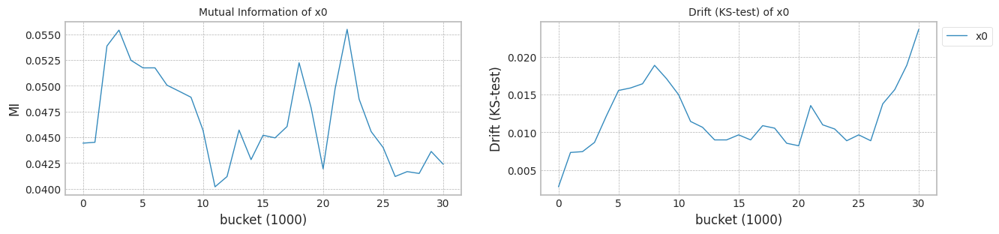

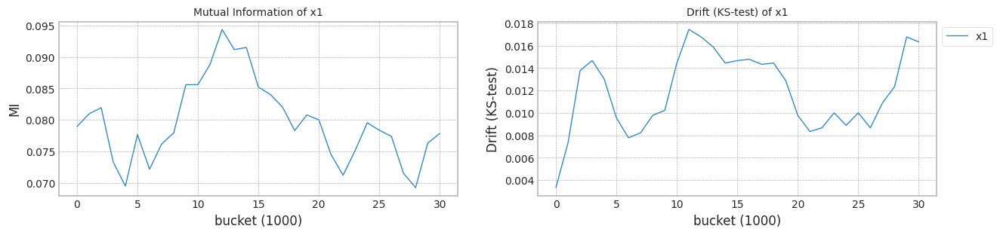

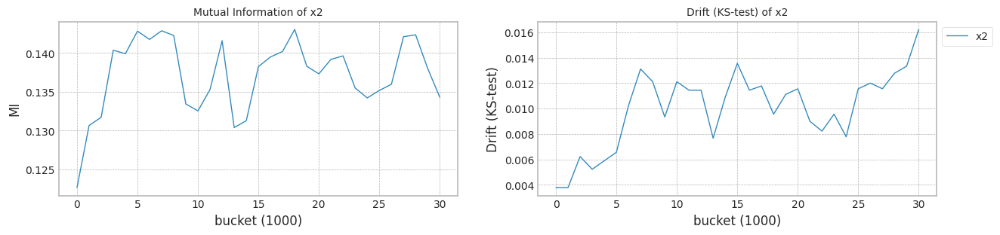

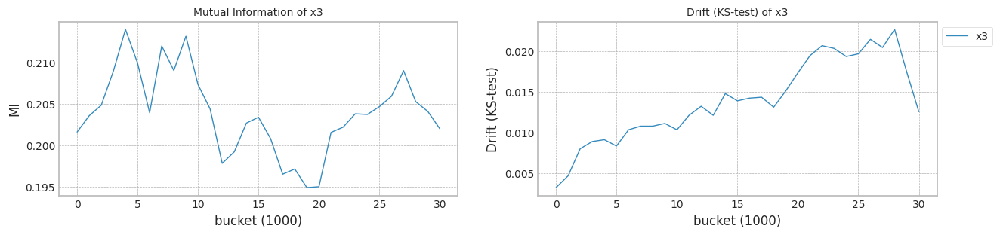

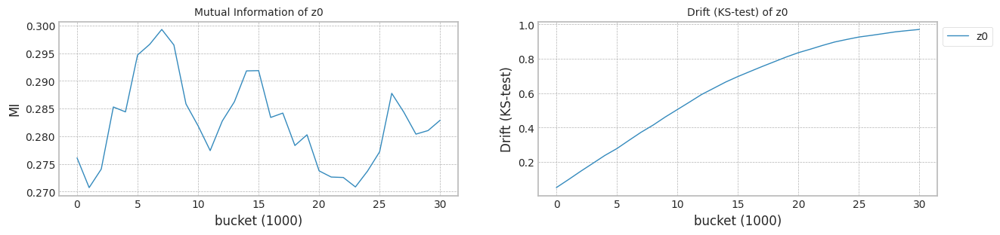

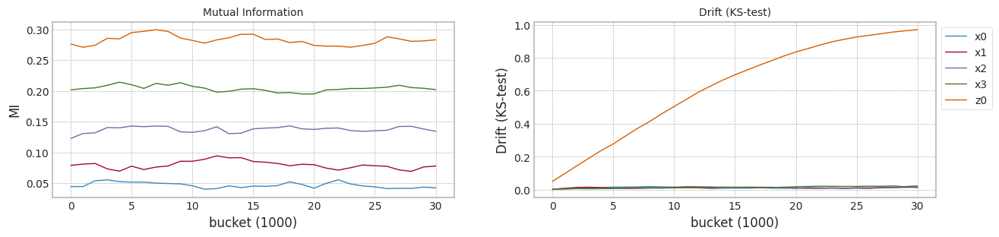

In [156]:
columns=['x0','x1','x2','x3','z0']
X3 = pd.DataFrame(x3,columns=columns)

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X3, y3,train_size, test_size)

In [157]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.520974,0.392205,0.600995,0.478669,0.477486,0
1,0.447230,0.556479,0.629077,0.735705,0.578715,0
2,0.489501,0.704159,0.760582,0.582973,0.354045,0
3,0.581446,0.301839,0.443337,0.515173,0.360338,0
4,0.571642,0.639275,0.524701,0.583380,0.597569,0
...,...,...,...,...,...,...
39995,0.346158,0.267147,0.513105,0.599663,0.989291,39
39996,0.426322,0.302644,0.484909,0.587518,1.004704,39
39997,0.374186,0.587769,0.624447,0.598315,1.321791,39
39998,0.470439,0.265430,0.218971,0.645349,1.148847,39


trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 619.10it/s]


Test f1 score: 0.9094218415417559
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7553238378309143
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 223.34it/s]


Test f1 score: 0.9031410747510124
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.210219
x1    0.216201
x2    0.294090
x3    0.330681
z0    0.362778
dtype: float64
Mean F1 for all data: 0.9025050712583889
Normal model mean        : 0.7553238378309143
Drift tolerant model mean: 0.9025050712583889
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 634.57it/s]


Test f1 score: 0.90515595162317
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7508008567109958
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.89it/s]


Test f1 score: 0.9167398945518452
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.614348
x1    0.152953
x2    0.232717
x3    0.274774
z0    0.426287
dtype: float64
Mean F1 for all data: 0.9175540719785952
Normal model mean        : 0.753062347270955
Drift tolerant model mean: 0.9100295716184921
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 625.66it/s]


Test f1 score: 0.906555090655509
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7526071182357702
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.99it/s]


Test f1 score: 0.9044795783926218
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.598860
x1    0.358760
x2    0.278738
x3    0.328470
z0    0.424563
dtype: float64
Mean F1 for all data: 0.9042082016077531
Normal model mean        : 0.7529106042592267
Drift tolerant model mean: 0.9080891149482456
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 630.85it/s]


Test f1 score: 0.9104397376626169
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7589364860685089
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.50it/s]


Test f1 score: 0.9155438711797568
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.173996
x1    0.258376
x2    0.281405
x3    0.285330
z0    0.363939
dtype: float64
Mean F1 for all data: 0.9125983887433349
Normal model mean        : 0.7544170747115473
Drift tolerant model mean: 0.909216433397018
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 624.42it/s]


Test f1 score: 0.8969378427787934
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.776954185369737
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.50it/s]


Test f1 score: 0.9142669440490528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.157921
x1    0.584154
x2    0.386806
x3    0.276419
z0    0.360211
dtype: float64
Mean F1 for all data: 0.9063129917264587
Normal model mean        : 0.7589244968431853
Drift tolerant model mean: 0.9086357450629061
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 628.76it/s]


Test f1 score: 0.9087221095334685
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7582724746435356
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.31it/s]


Test f1 score: 0.9014146287970172
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.435853
x1    0.353158
x2    0.317004
x3    0.367674
z0    0.348229
dtype: float64
Mean F1 for all data: 0.9001665445899703
Normal model mean        : 0.7588158264765771
Drift tolerant model mean: 0.9072242116507501
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 638.16it/s]


Test f1 score: 0.9086821539449739
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.65it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7639151864308817
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 234.13it/s]


Test f1 score: 0.893339436942092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.500047
x1    0.047885
x2    0.237272
x3    0.257025
z0    0.431039
dtype: float64
Mean F1 for all data: 0.8993303651030174
Normal model mean        : 0.7595443064700491
Drift tolerant model mean: 0.9060965192867882
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 627.08it/s]


Test f1 score: 0.9094428909442891
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.62it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7582699403194904
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.26it/s]


Test f1 score: 0.9156071898290223
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.134183
x1    0.254961
x2    0.251158
x3    0.316219
z0    0.422258
dtype: float64
Mean F1 for all data: 0.9061695869937073
Normal model mean        : 0.7593850107012292
Drift tolerant model mean: 0.9061056527501532
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 641.21it/s]


Test f1 score: 0.8985805389837481
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.744104542245207
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.92it/s]


Test f1 score: 0.902461257976299
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.449423
x1    0.153441
x2    0.217932
x3    0.232738
z0    0.452814
dtype: float64
Mean F1 for all data: 0.9054019237262277
Normal model mean        : 0.7576871808727823
Drift tolerant model mean: 0.9060274606363836
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 628.51it/s]


Test f1 score: 0.9086821539449739
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7583665120718357
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.51it/s]


Test f1 score: 0.9047619047619048
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.511111
x1    0.397520
x2    0.256799
x3    0.279323
z0    0.264168
dtype: float64
Mean F1 for all data: 0.8882596394599483
Normal model mean        : 0.7577551139926877
Drift tolerant model mean: 0.9042506785187401
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 640.26it/s]


Test f1 score: 0.8768238213399503
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7264290998211512
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.52it/s]


Test f1 score: 0.9171343677781446
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.548441
x1    0.189480
x2    0.210452
x3    0.258254
z0    0.256029
dtype: float64
Mean F1 for all data: 0.9018959403617134
Normal model mean        : 0.754907294522548
Drift tolerant model mean: 0.9040366114135558
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 623.15it/s]


Test f1 score: 0.9108635097493036
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.758603213456056
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.91it/s]


Test f1 score: 0.9176755447941888
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.561086
x1    0.166452
x2    0.209677
x3    0.264086
z0    0.373570
dtype: float64
Mean F1 for all data: 0.9160047419461853
Normal model mean        : 0.755215287767007
Drift tolerant model mean: 0.9050339556246083
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 605.71it/s]


Test f1 score: 0.909656652360515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.762513261248363
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.31it/s]


Test f1 score: 0.911642183731638
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.183957
x1    0.316297
x2    0.253642
x3    0.281348
z0    0.339305
dtype: float64
Mean F1 for all data: 0.904751274183744
Normal model mean        : 0.755776670342496
Drift tolerant model mean: 0.9050122108983879
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 629.43it/s]


Test f1 score: 0.9107468123861566
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.63it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7580003032058601
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.84it/s]


Test f1 score: 0.9159350307287094
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.371366
x1    0.265366
x2    0.248495
x3    0.273004
z0    0.405756
dtype: float64
Mean F1 for all data: 0.9127092630801035
Normal model mean        : 0.7559355012613077
Drift tolerant model mean: 0.905562000339939
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 629.35it/s]


Test f1 score: 0.909323661190527
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7551800935386952
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.75it/s]


Test f1 score: 0.9211273760104871
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.133817
x1    0.215470
x2    0.253068
x3    0.286376
z0    0.393254
dtype: float64
Mean F1 for all data: 0.9146306679880369
Normal model mean        : 0.7558851407464667
Drift tolerant model mean: 0.9061665781831455
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 626.93it/s]


Test f1 score: 0.9072032537728781
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7528459177233999
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.70it/s]


Test f1 score: 0.9155497439250301
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.061685
x1    0.230523
x2    0.259498
x3    0.327183
z0    0.345269
dtype: float64
Mean F1 for all data: 0.9114085299501816
Normal model mean        : 0.7556951893075252
Drift tolerant model mean: 0.9064942001685854
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 625.37it/s]


Test f1 score: 0.9107468123861566
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7596577976959235
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.96it/s]


Test f1 score: 0.9033461327482172
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.220014
x1    0.472115
x2    0.353978
x3    0.305011
z0    0.403452
dtype: float64
Mean F1 for all data: 0.9033404948756796
Normal model mean        : 0.7559282839186076
Drift tolerant model mean: 0.9063086880925322
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 634.75it/s]


Test f1 score: 0.9109294320137694
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7613935565222583
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.92it/s]


Test f1 score: 0.9123536491957545
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.312376
x1    0.554731
x2    0.244082
x3    0.283796
z0    0.379462
dtype: float64
Mean F1 for all data: 0.9140350196166723
Normal model mean        : 0.7562319101743659
Drift tolerant model mean: 0.906737928732762
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 616.22it/s]


Test f1 score: 0.9098527989685183
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7574562781822918
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.71it/s]


Test f1 score: 0.9161913119789381
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.381297
x1    0.211484
x2    0.250143
x3    0.282068
z0    0.304695
dtype: float64
Mean F1 for all data: 0.9154728859227648
Normal model mean        : 0.7562963505958356
Drift tolerant model mean: 0.9071976633217096
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 631.07it/s]


Test f1 score: 0.8889561881687867
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7376675332078008
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.20it/s]


Test f1 score: 0.9158079368559526
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.424520
x1    0.208484
x2    0.248538
x3    0.268190
z0    0.354634
dtype: float64
Mean F1 for all data: 0.9150439254117486
Normal model mean        : 0.7553649097264339
Drift tolerant model mean: 0.9075899764262114


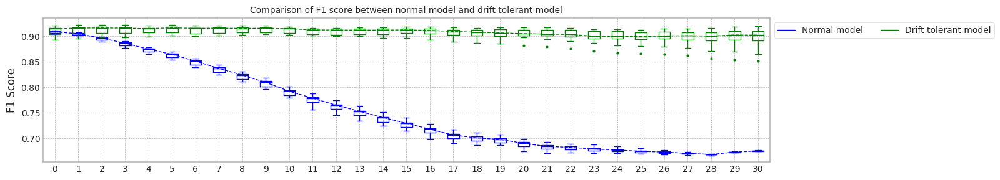

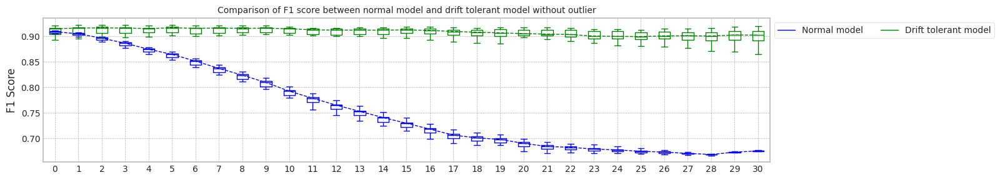

max_mean_trial= 1


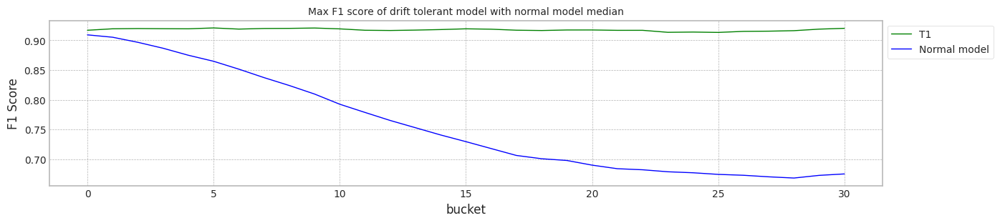

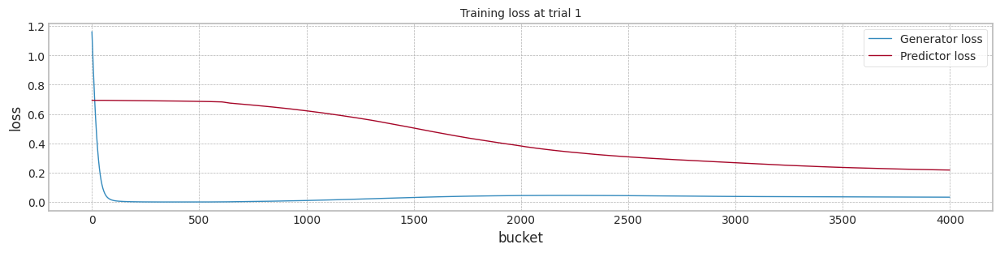

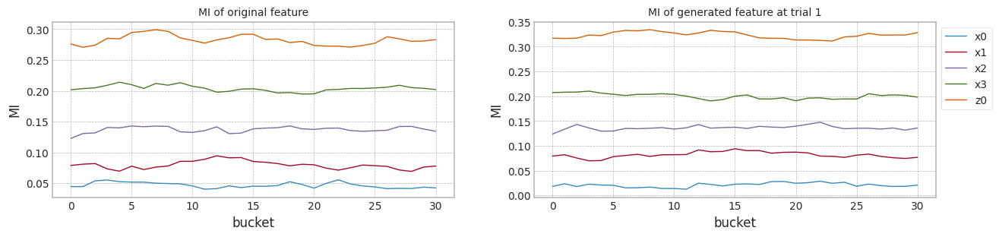

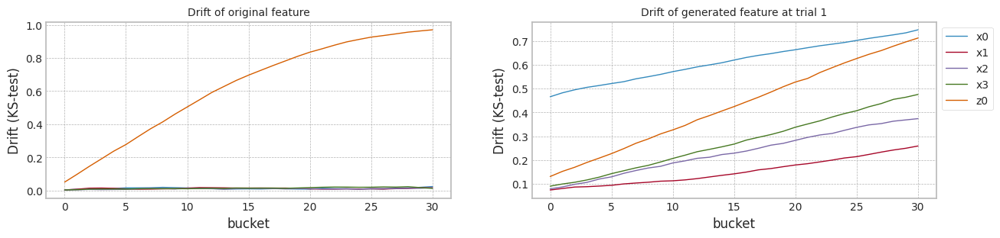

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.909422,0.909422,0.755324,0.675173
1,1.0,0.905156,0.905156,0.750801,0.675074
2,2.0,0.906555,0.906555,0.752607,0.675024
3,3.0,0.910440,0.910440,0.758936,0.675472
4,4.0,0.896938,0.896938,0.776954,0.677071
5,5.0,0.908722,0.908722,0.758272,0.676421
6,6.0,0.908682,0.908682,0.763915,0.676871
7,7.0,0.909443,0.909443,0.758270,0.675472
8,8.0,0.898581,0.898581,0.744105,0.675124
9,9.0,0.908682,0.908682,0.758367,0.675771


,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.903141,0.903141,0.902505,0.900063
1,1.0,0.916740,0.916740,0.917554,0.919991
2,2.0,0.904480,0.904480,0.904208,0.903946
3,3.0,0.915544,0.915544,0.912598,0.910518
4,4.0,0.914267,0.914267,0.906313,0.878031
5,5.0,0.901415,0.901415,0.900167,0.895234
6,6.0,0.893339,0.893339,0.899330,0.900055
7,7.0,0.915607,0.915607,0.906170,0.877477
8,8.0,0.902461,0.902461,0.905402,0.890043
9,9.0,0.904762,0.904762,0.888260,0.851560


In [158]:
_,_,_,_,_,_ = drift_tolerant(X1, Y1,train_size, test_size,avaible_range = 100,trial_count=20)

trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 618.52it/s]


Test f1 score: 0.9094218415417559
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7553238378309143
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 226.68it/s]


Test f1 score: 0.9031410747510124
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.210219
x1    0.216201
x2    0.294090
x3    0.330681
z0    0.362778
dtype: float64
Mean F1 for all data: 0.9025050712583889
Normal model mean        : 0.7553238378309143
Drift tolerant model mean: 0.9025050712583889
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 626.28it/s]


Test f1 score: 0.90515595162317
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7508008567109958
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 226.56it/s]


Test f1 score: 0.9167398945518452
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.614348
x1    0.152953
x2    0.232717
x3    0.274774
z0    0.426287
dtype: float64
Mean F1 for all data: 0.9175540719785952
Normal model mean        : 0.753062347270955
Drift tolerant model mean: 0.9100295716184921
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 630.54it/s]


Test f1 score: 0.906555090655509
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7526071182357702
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.10it/s]


Test f1 score: 0.9044795783926218
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.598860
x1    0.358760
x2    0.278738
x3    0.328470
z0    0.424563
dtype: float64
Mean F1 for all data: 0.9042082016077531
Normal model mean        : 0.7529106042592267
Drift tolerant model mean: 0.9080891149482456
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 629.68it/s]


Test f1 score: 0.9104397376626169
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7589364860685089
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.22it/s]


Test f1 score: 0.9155438711797568
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.173996
x1    0.258376
x2    0.281405
x3    0.285330
z0    0.363939
dtype: float64
Mean F1 for all data: 0.9125983887433349
Normal model mean        : 0.7544170747115473
Drift tolerant model mean: 0.909216433397018
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 623.71it/s]


Test f1 score: 0.8969378427787934
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.776954185369737
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 226.12it/s]


Test f1 score: 0.9142669440490528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.63it/s]


mean of drift:
x0    0.157921
x1    0.584154
x2    0.386806
x3    0.276419
z0    0.360211
dtype: float64
Mean F1 for all data: 0.9063129917264587
Normal model mean        : 0.7589244968431853
Drift tolerant model mean: 0.9086357450629061
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 628.63it/s]


Test f1 score: 0.9087221095334685
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7582724746435356
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.85it/s]


Test f1 score: 0.9014146287970172
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.435853
x1    0.353158
x2    0.317004
x3    0.367674
z0    0.348229
dtype: float64
Mean F1 for all data: 0.9001665445899703
Normal model mean        : 0.7588158264765771
Drift tolerant model mean: 0.9072242116507501
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 621.85it/s]


Test f1 score: 0.9086821539449739
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7639151864308817
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.22it/s]


Test f1 score: 0.893339436942092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.500047
x1    0.047885
x2    0.237272
x3    0.257025
z0    0.431039
dtype: float64
Mean F1 for all data: 0.8993303651030174
Normal model mean        : 0.7595443064700491
Drift tolerant model mean: 0.9060965192867882
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 634.63it/s]


Test f1 score: 0.9094428909442891
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.64it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7582699403194904
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.84it/s]


Test f1 score: 0.9156071898290223
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.134183
x1    0.254961
x2    0.251158
x3    0.316219
z0    0.422258
dtype: float64
Mean F1 for all data: 0.9061695869937073
Normal model mean        : 0.7593850107012292
Drift tolerant model mean: 0.9061056527501532
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 631.12it/s]


Test f1 score: 0.8985805389837481
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.744104542245207
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.69it/s]


Test f1 score: 0.902461257976299
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.449423
x1    0.153441
x2    0.217932
x3    0.232738
z0    0.452814
dtype: float64
Mean F1 for all data: 0.9054019237262277
Normal model mean        : 0.7576871808727823
Drift tolerant model mean: 0.9060274606363836
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 604.37it/s]


Test f1 score: 0.9086821539449739
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7583665120718357
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 217.28it/s]


Test f1 score: 0.9047619047619048
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.17it/s]


mean of drift:
x0    0.511111
x1    0.397520
x2    0.256799
x3    0.279323
z0    0.264168
dtype: float64
Mean F1 for all data: 0.8882596394599483
Normal model mean        : 0.7577551139926877
Drift tolerant model mean: 0.9042506785187401
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 598.97it/s]


Test f1 score: 0.8768238213399503
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7264290998211512
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.28it/s]


Test f1 score: 0.9171343677781446
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.548441
x1    0.189480
x2    0.210452
x3    0.258254
z0    0.256029
dtype: float64
Mean F1 for all data: 0.9018959403617134
Normal model mean        : 0.754907294522548
Drift tolerant model mean: 0.9040366114135558
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 619.97it/s]


Test f1 score: 0.9108635097493036
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.758603213456056
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.13it/s]


Test f1 score: 0.9176755447941888
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.561086
x1    0.166452
x2    0.209677
x3    0.264086
z0    0.373570
dtype: float64
Mean F1 for all data: 0.9160047419461853
Normal model mean        : 0.755215287767007
Drift tolerant model mean: 0.9050339556246083
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 621.43it/s]


Test f1 score: 0.909656652360515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.762513261248363
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 225.48it/s]


Test f1 score: 0.911642183731638
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.183957
x1    0.316297
x2    0.253642
x3    0.281348
z0    0.339305
dtype: float64
Mean F1 for all data: 0.904751274183744
Normal model mean        : 0.755776670342496
Drift tolerant model mean: 0.9050122108983879
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 609.24it/s]


Test f1 score: 0.9107468123861566
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7580003032058601
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 225.52it/s]


Test f1 score: 0.9159350307287094
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.371366
x1    0.265366
x2    0.248495
x3    0.273004
z0    0.405756
dtype: float64
Mean F1 for all data: 0.9127092630801035
Normal model mean        : 0.7559355012613077
Drift tolerant model mean: 0.905562000339939
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 608.00it/s]


Test f1 score: 0.909323661190527
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7551800935386952
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.82it/s]


Test f1 score: 0.9211273760104871
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.133817
x1    0.215470
x2    0.253068
x3    0.286376
z0    0.393254
dtype: float64
Mean F1 for all data: 0.9146306679880369
Normal model mean        : 0.7558851407464667
Drift tolerant model mean: 0.9061665781831455
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 639.70it/s]


Test f1 score: 0.9072032537728781
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7528459177233999
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.27it/s]


Test f1 score: 0.9155497439250301
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.061685
x1    0.230523
x2    0.259498
x3    0.327183
z0    0.345269
dtype: float64
Mean F1 for all data: 0.9114085299501816
Normal model mean        : 0.7556951893075252
Drift tolerant model mean: 0.9064942001685854
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 638.65it/s]


Test f1 score: 0.9107468123861566
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7596577976959235
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.91it/s]


Test f1 score: 0.9033461327482172
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.220014
x1    0.472115
x2    0.353978
x3    0.305011
z0    0.403452
dtype: float64
Mean F1 for all data: 0.9033404948756796
Normal model mean        : 0.7559282839186076
Drift tolerant model mean: 0.9063086880925322
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 627.14it/s]


Test f1 score: 0.9109294320137694
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7613935565222583
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.29it/s]


Test f1 score: 0.9123536491957545
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.312376
x1    0.554731
x2    0.244082
x3    0.283796
z0    0.379462
dtype: float64
Mean F1 for all data: 0.9140350196166723
Normal model mean        : 0.7562319101743659
Drift tolerant model mean: 0.906737928732762
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 631.27it/s]


Test f1 score: 0.9098527989685183
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7574562781822918
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.83it/s]


Test f1 score: 0.9161913119789381
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.381297
x1    0.211484
x2    0.250143
x3    0.282068
z0    0.304695
dtype: float64
Mean F1 for all data: 0.9154728859227648
Normal model mean        : 0.7562963505958356
Drift tolerant model mean: 0.9071976633217096
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 628.54it/s]


Test f1 score: 0.8889561881687867
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7376675332078008
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.15it/s]


Test f1 score: 0.9158079368559526
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.424520
x1    0.208484
x2    0.248538
x3    0.268190
z0    0.354634
dtype: float64
Mean F1 for all data: 0.9150439254117486
Normal model mean        : 0.7553649097264339
Drift tolerant model mean: 0.9075899764262114
######################### Trial 0 for Normal model ###########################
retrain_interval: 16
######################### Trial 0 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.05it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7886160652785527
SEA mean: 0.7886160652785527
######################### Trial 0 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.67it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8473140089375863
DTEL mean: 0.8473140089375863
######################### Trial 1 for Normal model ###########################
retrain_interval: 16
######################### Trial 1 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.01it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.779214079954634
SEA mean: 0.7839150726165933
######################### Trial 1 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.66it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8434175610621945
DTEL mean: 0.8453657849998903
######################### Trial 2 for Normal model ###########################
retrain_interval: 16
######################### Trial 2 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.93it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7785732482052288
SEA mean: 0.7821344644794719
######################### Trial 2 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.71it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8384089208273466
DTEL mean: 0.8430468302757091
######################### Trial 3 for Normal model ###########################
retrain_interval: 16
######################### Trial 3 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.10it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7679048235323275
SEA mean: 0.7785770542426858
######################### Trial 3 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.74it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8509975177044394
DTEL mean: 0.8450345021328917
######################### Trial 4 for Normal model ###########################
retrain_interval: 16
######################### Trial 4 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.04it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8474511781508005
SEA mean: 0.7923518790243087
######################### Trial 4 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.74it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8664818342051291
DTEL mean: 0.849323968547339
######################### Trial 5 for Normal model ###########################
retrain_interval: 16
######################### Trial 5 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.99it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8045535777833231
SEA mean: 0.7943854954841444
######################### Trial 5 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.67it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8427484762941024
DTEL mean: 0.8482280531717996
######################### Trial 6 for Normal model ###########################
retrain_interval: 16
######################### Trial 6 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.03it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8059153799880749
SEA mean: 0.7960326218418486
######################### Trial 6 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.71it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.853841223772078
DTEL mean: 0.8490299346861251
######################### Trial 7 for Normal model ###########################
retrain_interval: 16
######################### Trial 7 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.07it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7897328695235971
SEA mean: 0.7952451528020673
######################### Trial 7 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.70it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8501413057664321
DTEL mean: 0.8491688560711635
######################### Trial 8 for Normal model ###########################
retrain_interval: 16
######################### Trial 8 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.04it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7749042773171355
SEA mean: 0.7929850555259638
######################### Trial 8 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.62it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8353820658453193
DTEL mean: 0.8476369904905142
######################### Trial 9 for Normal model ###########################
retrain_interval: 16
######################### Trial 9 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.00it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7946624982040215
SEA mean: 0.7931527997937696
######################### Trial 9 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.62it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8437920764446385
DTEL mean: 0.8472524990859267
######################### Trial 10 for Normal model ###########################
retrain_interval: 16
######################### Trial 10 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.07it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7746181509274276
SEA mean: 0.7914678317150112
######################### Trial 10 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.66it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8134061612737609
DTEL mean: 0.8441755592848207
######################### Trial 11 for Normal model ###########################
retrain_interval: 16
######################### Trial 11 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.96it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7667301226967392
SEA mean: 0.7894063559634885
######################### Trial 11 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8501137099710019
DTEL mean: 0.8446704051753358
######################### Trial 12 for Normal model ###########################
retrain_interval: 16
######################### Trial 12 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.91it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7994981191739866
SEA mean: 0.7901826454412191
######################### Trial 12 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.72it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8524741351202431
DTEL mean: 0.8452706920941748
######################### Trial 13 for Normal model ###########################
retrain_interval: 16
######################### Trial 13 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.11it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7855138480016269
SEA mean: 0.7898491599098196
######################### Trial 13 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8492282736749216
DTEL mean: 0.8455533764927995
######################### Trial 14 for Normal model ###########################
retrain_interval: 16
######################### Trial 14 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.11it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7895842476656367
SEA mean: 0.7898314990935408
######################### Trial 14 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.73it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8513553663222375
DTEL mean: 0.8459401758147621
######################### Trial 15 for Normal model ###########################
retrain_interval: 16
######################### Trial 15 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.07it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7606352694976257
SEA mean: 0.7880067347437961
######################### Trial 15 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.70it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.844688161922733
DTEL mean: 0.8458619249465102
######################### Trial 16 for Normal model ###########################
retrain_interval: 16
######################### Trial 16 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.07it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.78502486423061
SEA mean: 0.7878313305959617
######################### Trial 16 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.70it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8523948314201868
DTEL mean: 0.8462462135626089
######################### Trial 17 for Normal model ###########################
retrain_interval: 16
######################### Trial 17 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.00it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7695505215842977
SEA mean: 0.7868157300953137
######################### Trial 17 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8521046171548463
DTEL mean: 0.8465716804288443
######################### Trial 18 for Normal model ###########################
retrain_interval: 16
######################### Trial 18 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.86it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7870998168204161
SEA mean: 0.7868306820282138
######################### Trial 18 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8486019161694051
DTEL mean: 0.8466785349415055
######################### Trial 19 for Normal model ###########################
retrain_interval: 16
######################### Trial 19 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.90it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7845489904564162
SEA mean: 0.786716597449624
######################### Trial 19 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.71it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8278196458426132
DTEL mean: 0.8457355904865608


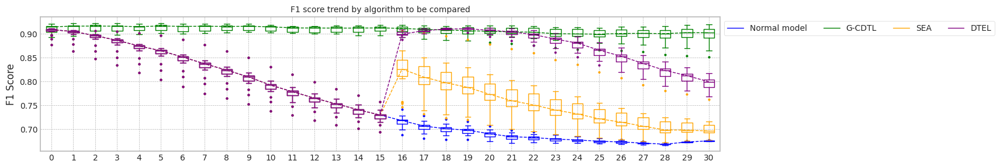

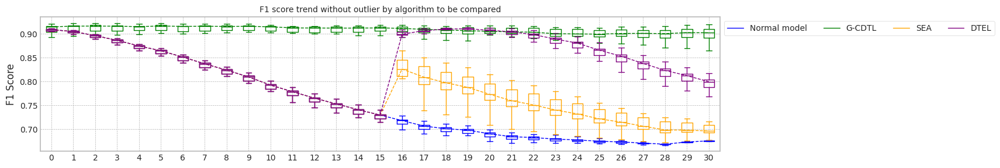

max_mean_trial= 3


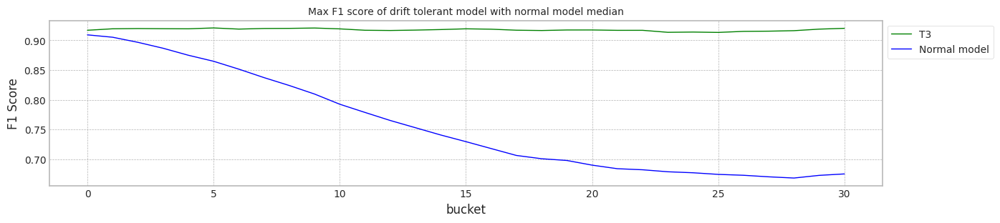

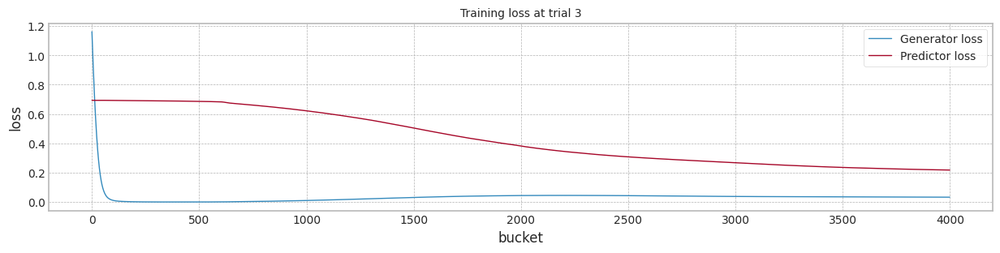

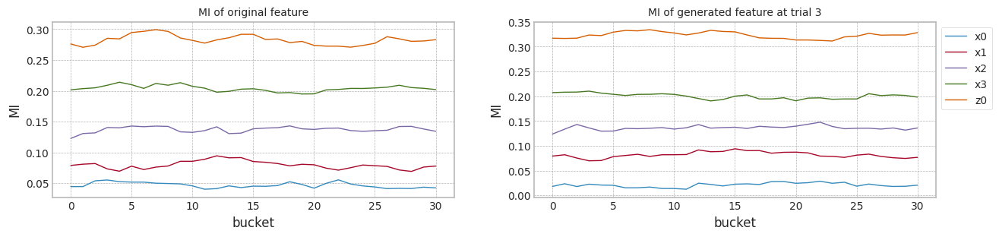

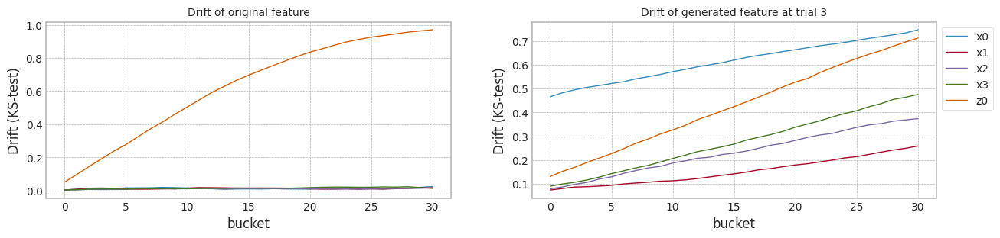

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.909422,0.905148,0.755324,0.675173
1,1.0,0.905156,0.899155,0.750801,0.675074
2,2.0,0.906555,0.902539,0.752607,0.675024
3,3.0,0.910440,0.906822,0.758936,0.675472
4,4.0,0.896938,0.905711,0.776954,0.677071
5,5.0,0.908722,0.904202,0.758272,0.676421
6,6.0,0.908682,0.904872,0.763915,0.676871
7,7.0,0.909443,0.905880,0.758270,0.675472
8,8.0,0.898581,0.889002,0.744105,0.675124
9,9.0,0.908682,0.904897,0.758367,0.675771


,Trial,test_f1,init_f1,mean_f1,last_f1
0,1.0,0.903141,0.904898,0.902505,0.900063
1,3.0,0.916740,0.919211,0.917554,0.919991
2,5.0,0.904480,0.906267,0.904208,0.903946
3,7.0,0.915544,0.917042,0.912598,0.910518
4,9.0,0.914267,0.915732,0.906313,0.878031
5,11.0,0.901415,0.902380,0.900167,0.895234
6,13.0,0.893339,0.895454,0.899330,0.900055
7,15.0,0.915607,0.917748,0.906170,0.877477
8,17.0,0.902461,0.905523,0.905402,0.890043
9,19.0,0.904762,0.905781,0.888260,0.851560


,Trial,test_f1,init_f1,mean_f1,last_f1
0,1.0,0.909422,0.905148,0.788616,0.696386
1,3.0,0.905156,0.899155,0.779214,0.694484
2,5.0,0.906555,0.902539,0.778573,0.692540
3,7.0,0.910440,0.906822,0.767905,0.679534
4,9.0,0.896938,0.905711,0.847451,0.762850
5,11.0,0.908722,0.904202,0.804554,0.716119
6,13.0,0.908682,0.904872,0.805915,0.711775
7,15.0,0.909443,0.905880,0.789733,0.698246
8,17.0,0.898581,0.889002,0.774904,0.695751
9,19.0,0.908682,0.904897,0.794662,0.704922


,Trial,test_f1,init_f1,mean_f1,last_f1
0,1.0,0.909422,0.905148,0.847314,0.796996
1,3.0,0.905156,0.899155,0.843418,0.799930
2,5.0,0.906555,0.902539,0.838409,0.774079
3,7.0,0.910440,0.906822,0.850998,0.803026
4,9.0,0.896938,0.905711,0.866482,0.813091
5,11.0,0.908722,0.904202,0.842748,0.778497
6,13.0,0.908682,0.904872,0.853841,0.809630
7,15.0,0.909443,0.905880,0.850141,0.800070
8,17.0,0.898581,0.889002,0.835382,0.790307
9,19.0,0.908682,0.904897,0.843792,0.778895


In [159]:
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 100,trial_count=20) #np.max(X1['b']+1))


## synthetic data의 생성 (Case #5 - Case #1,2,3,4의 상황이 각 feature에 혼재되어 있는 경우)

+ $P_t(y,X) \ne P_{t+w}(y,X) $ 이고 $P_t(y|X) \ne P_{t+w}(y|X) $
+ 전체적으로는 Real concept drift
+ 즉, P(y|X)와 P(X)의 변화가 연관되어 나타남.
+ $x_0$ : No drift
+ $x_1$ : $P_t(y|X) = P_{t+w}(y|X)$ 이면서 $P_t(X) \ne P_{t+w}(X)$ 인 Virtual Drift
+ $x_2$ : $P_t(y|X) \ne P_{t+w}(y|X)$ 이면서 $P_t(X) \ne P_{t+w}(X)$ 인 Real Concept Drift, MI 감소, Drift 증가
+ $x_3$ : $P_t(y|X) \ne P_{t+w}(y|X)$ 이면서 $P_t(X) \ne P_{t+w}(X)$ 인 Real Concept Drift, MI 증가, Drift 증가
+ $z_0$ : $P_t(y|X) \ne P_{t+w}(y|X)$ 이면서 $P_t(X) = P_{t+w}(X)$ 인 Actual Drift, MI 감소, Drift 고정


### Dataset 준비

In [160]:
seed_everything()

data_size = 40000
cor = np.asarray([1.5, 1.2, 0.5 , 0.7, 2.5])

x4 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x4[:,ix] = np.random.normal(1,cor_,data_size)

y4_array = []
cor_const = cor[4]
cor_const2 = 3/x4.shape[0]
for ii in range(x4.shape[0]):
    # Case #2, MI의 증감(상대적), Drift의 고정 - z0
    cor[4] = cor[4] - cor_const / x4.shape[0]
    e = np.random.normal(0.0, 2.0)
    # Case #3 MI의 증감(상대적), Drift의 증가 - x3
    e1 = np.random.normal(0.0, 3*cor_const2 * ii)
    x4[ii,3] = x4[ii,3] + e1
    y4_array.append(np.sum(cor * x4[ii])+e)

y4 = [1 if y_ > 5 else 0 for y_ in y4_array]

for i in range(len(y4)):
    #Case #1 MI의 감소, Drift의 증가 - x2
    x4[i,2] = y4[i] + np.random.normal(1,0.5+(i/data_size))
    #Case #4 MI의 고정, Drift의 증가 - x1
    x4[i,1] = y4[i] + np.random.normal(0.0 + 4*(i/data_size),cor[1])


### 실험

MI Analysis MI Max 0.14553, Min 0.02498, Mean 0.08409, Std 0.04454
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:05<00:00,  5.68it/s]


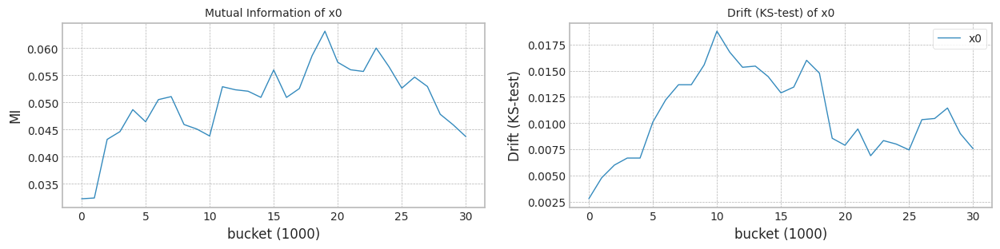

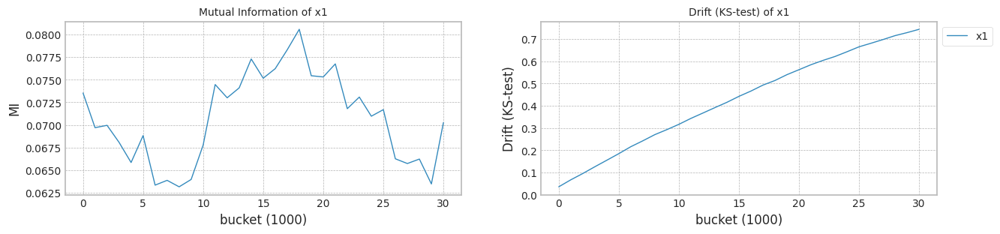

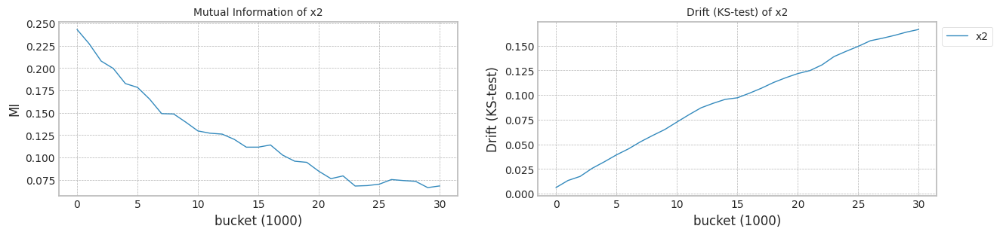

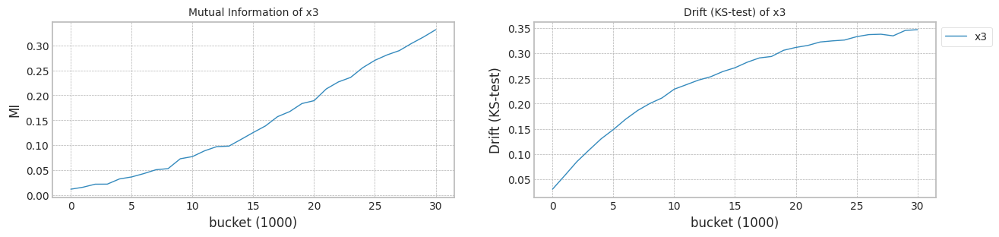

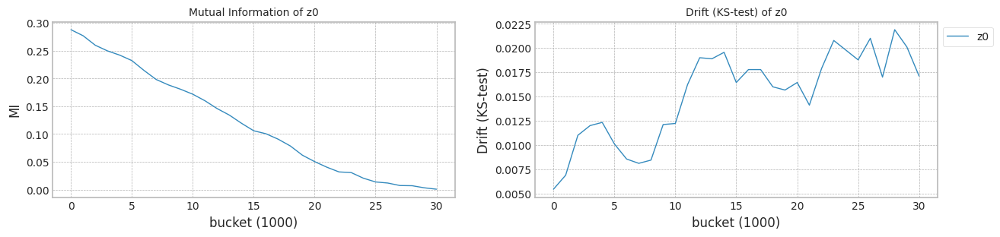

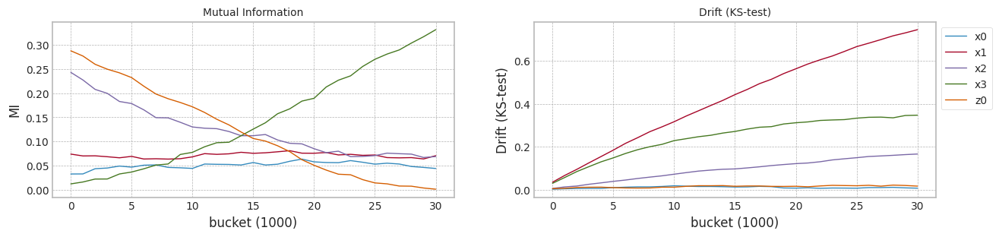

In [161]:
columns=['x0','x1','x2','x3','z0']
X4 = pd.DataFrame(x4,columns=columns)

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X4, y4,train_size, test_size)

In [162]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]


trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 614.38it/s]


Test f1 score: 0.9100519112789052
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6955085967796114
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 221.21it/s]


Test f1 score: 0.93364064150581
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.155523
x1    0.339376
x2    0.225824
x3    0.502452
z0    0.247706
dtype: float64
Mean F1 for all data: 0.7986908046228991
Normal model mean        : 0.6955085967796114
Drift tolerant model mean: 0.7986908046228991
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 607.91it/s]


Test f1 score: 0.890528233151184
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6682002717662293
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 223.41it/s]


Test f1 score: 0.9324870167339873
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.674405
x1    0.321333
x2    0.265075
x3    0.316362
z0    0.206566
dtype: float64
Mean F1 for all data: 0.5549101269531826
Normal model mean        : 0.6818544342729204
Drift tolerant model mean: 0.6768004657880409
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 613.37it/s]


Test f1 score: 0.9223457846212337
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7571085867082309
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 219.16it/s]


Test f1 score: 0.9276841598459316
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.37it/s]


mean of drift:
x0    0.129061
x1    0.347602
x2    0.256330
x3    0.291986
z0    0.193939
dtype: float64
Mean F1 for all data: 0.7719705532524858
Normal model mean        : 0.7069391517513571
Drift tolerant model mean: 0.7085238282761891
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 623.01it/s]


Test f1 score: 0.9120754716981133
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7030030621508987
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.34it/s]


Test f1 score: 0.9328078438911852
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.247323
x1    0.323978
x2    0.087211
x3    0.471341
z0    0.239853
dtype: float64
Mean F1 for all data: 0.8020084227007592
Normal model mean        : 0.7059551293512425
Drift tolerant model mean: 0.7318949768823316
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 629.92it/s]


Test f1 score: 0.7279151943462897
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6746771622573732
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.61it/s]


Test f1 score: 0.9332822819948311
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.37it/s]


mean of drift:
x0    0.139441
x1    0.342667
x2    0.240556
x3    0.440065
z0    0.228613
dtype: float64
Mean F1 for all data: 0.7769146147981365
Normal model mean        : 0.6996995359324687
Drift tolerant model mean: 0.7408989044654926
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 616.27it/s]


Test f1 score: 0.9050028105677348
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6871906296972251
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.48it/s]


Test f1 score: 0.9329110279297438
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.147287
x1    0.334237
x2    0.225262
x3    0.404789
z0    0.242674
dtype: float64
Mean F1 for all data: 0.8149838805411125
Normal model mean        : 0.6976147182265947
Drift tolerant model mean: 0.7532464004780959
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 631.79it/s]


Test f1 score: 0.9113544884395769
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7149435355770569
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.16it/s]


Test f1 score: 0.9239821581095188
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.130219
x1    0.313459
x2    0.235961
x3    0.376305
z0    0.225495
dtype: float64
Mean F1 for all data: 0.7803834586476127
Normal model mean        : 0.700090263562375
Drift tolerant model mean: 0.7571231230737412
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 621.15it/s]


Test f1 score: 0.9164451196353969
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7207069920867206
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.15it/s]


Test f1 score: 0.9302370213990979
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.158201
x1    0.326032
x2    0.124100
x3    0.296864
z0    0.135935
dtype: float64
Mean F1 for all data: 0.7919517662400062
Normal model mean        : 0.7026673546279182
Drift tolerant model mean: 0.7614767034695243
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 632.72it/s]


Test f1 score: 0.9144981412639406
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7911208930504862
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.56it/s]


Test f1 score: 0.7279151943462897
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.013047
x1    0.427168
x2    0.115348
x3    0.246161
z0    0.030548
dtype: float64
Mean F1 for all data: 0.6746771622573732
Normal model mean        : 0.7124955255637591
Drift tolerant model mean: 0.7518323100015075
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 609.08it/s]


Test f1 score: 0.9110293423907916
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7177913797671416
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.04it/s]


Test f1 score: 0.9103435771915511
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.145326
x1    0.319903
x2    0.188401
x3    0.186685
z0    0.204054
dtype: float64
Mean F1 for all data: 0.764615182400093
Normal model mean        : 0.7130251109840973
Drift tolerant model mean: 0.7531105972413661
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.09it/s]


Test f1 score: 0.9005509384629751
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6740218573751043
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.76it/s]


Test f1 score: 0.9274247813130827
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.109326
x1    0.319416
x2    0.117158
x3    0.453111
z0    0.190918
dtype: float64
Mean F1 for all data: 0.8071346481220995
Normal model mean        : 0.709479360656007
Drift tolerant model mean: 0.75802187459416
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 627.65it/s]


Test f1 score: 0.9149016641452345
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.720746257415359
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.60it/s]


Test f1 score: 0.9352058111380146
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.339857
x1    0.362921
x2    0.251283
x3    0.235197
z0    0.249925
dtype: float64
Mean F1 for all data: 0.7855724699969939
Normal model mean        : 0.7104182687192863
Drift tolerant model mean: 0.7603177575443962
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 609.67it/s]


Test f1 score: 0.904480135249366
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6842170378511823
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 226.66it/s]


Test f1 score: 0.9335640803768868
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.158068
x1    0.333530
x2    0.232735
x3    0.582573
z0    0.200588
dtype: float64
Mean F1 for all data: 0.794978965824065
Normal model mean        : 0.7084027894217398
Drift tolerant model mean: 0.7629840043351399
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 621.52it/s]


Test f1 score: 0.9163120567375885
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7209043347463797
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.02it/s]


Test f1 score: 0.9343756031654121
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.185233
x1    0.319616
x2    0.230111
x3    0.481763
z0    0.243491
dtype: float64
Mean F1 for all data: 0.7868230247681492
Normal model mean        : 0.7092957569449283
Drift tolerant model mean: 0.7646867915089263
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 625.47it/s]


Test f1 score: 0.9193075394948443
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7400348300209143
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.21it/s]


Test f1 score: 0.9311362986951138
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.146434
x1    0.322125
x2    0.129602
x3    0.681384
z0    0.180452
dtype: float64
Mean F1 for all data: 0.8141008079510871
Normal model mean        : 0.7113450284833274
Drift tolerant model mean: 0.767981059271737
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 631.55it/s]


Test f1 score: 0.9205052711558552
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7471325775712562
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.63it/s]


Test f1 score: 0.9303439685733449
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.184326
x1    0.299921
x2    0.138201
x3    0.369982
z0    0.252186
dtype: float64
Mean F1 for all data: 0.8022033684318154
Normal model mean        : 0.7135817503013231
Drift tolerant model mean: 0.7701199535942419
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 625.78it/s]


Test f1 score: 0.9134452196869697
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7089794902135577
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.10it/s]


Test f1 score: 0.9263562169947192
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.113254
x1    0.355821
x2    0.119036
x3    0.266151
z0    0.241541
dtype: float64
Mean F1 for all data: 0.788307076958078
Normal model mean        : 0.7133110291196898
Drift tolerant model mean: 0.7711897843803499
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 628.26it/s]


Test f1 score: 0.9202127659574468
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7432115635967838
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.36it/s]


Test f1 score: 0.9182752328819743
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.236695
x1    0.573208
x2    0.213907
x3    0.172634
z0    0.164857
dtype: float64
Mean F1 for all data: 0.7374126258563457
Normal model mean        : 0.7149721699239728
Drift tolerant model mean: 0.7693132755734609
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 601.81it/s]


Test f1 score: 0.9145242386870316
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7141648011639884
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 220.69it/s]


Test f1 score: 0.9349648328355333
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.189806
x1    0.336168
x2    0.304986
x3    0.437262
z0    0.242814
dtype: float64
Mean F1 for all data: 0.7739949318416217
Normal model mean        : 0.7149296768313421
Drift tolerant model mean: 0.769559678534943
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 599.96it/s]


Test f1 score: 0.8933309747036972
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7280618106588514
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 224.62it/s]


Test f1 score: 0.930795847750865
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.237287
x1    0.322480
x2    0.112416
x3    0.355308
z0    0.245387
dtype: float64
Mean F1 for all data: 0.7925501407633662
Normal model mean        : 0.7155862835227176
Drift tolerant model mean: 0.7707092016463641


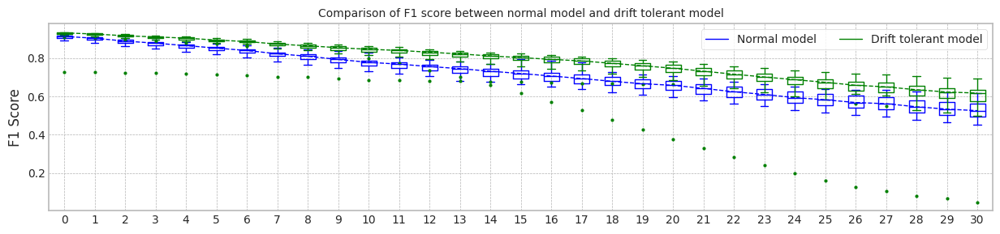

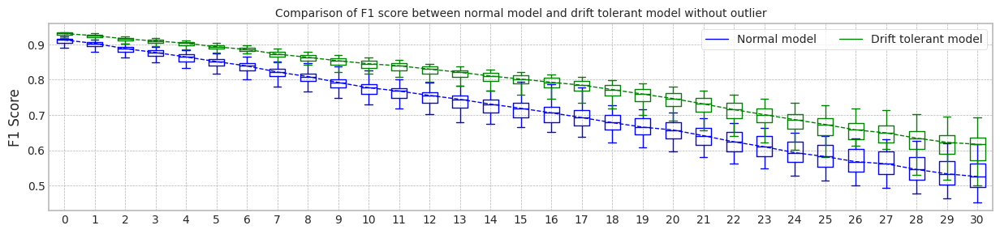

max_mean_trial= 5


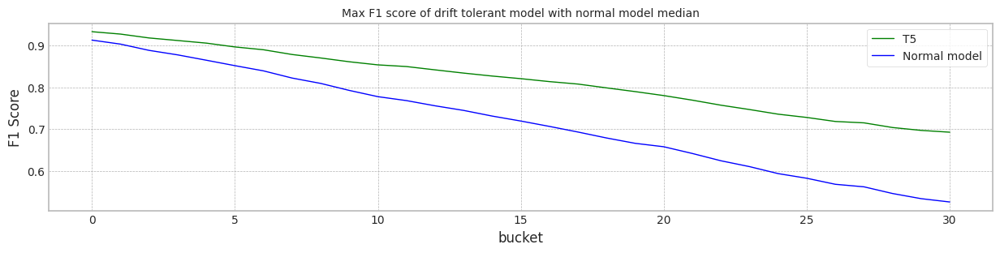

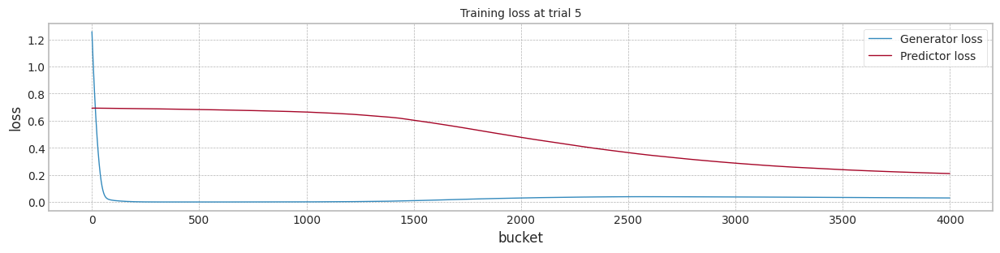

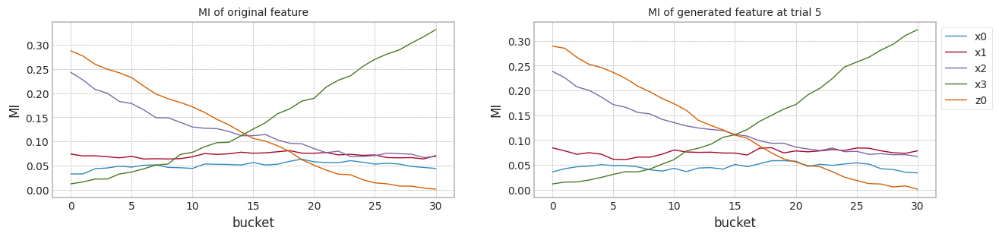

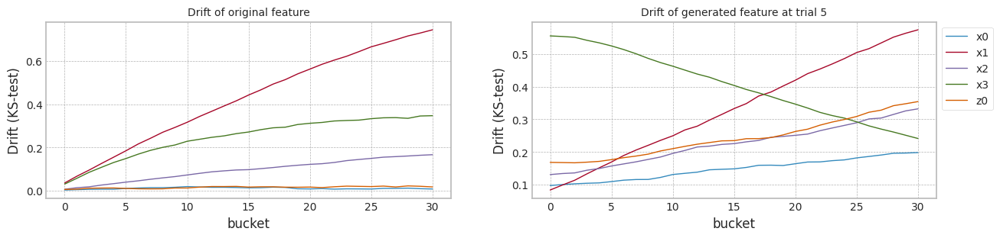

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.910052,0.910052,0.695509,0.485772
1,1.0,0.890528,0.890528,0.668200,0.466044
2,2.0,0.922346,0.922346,0.757109,0.587566
3,3.0,0.912075,0.912075,0.703003,0.498388
4,4.0,0.727915,0.727915,0.674677,0.617405
5,5.0,0.905003,0.905003,0.687191,0.480477
6,6.0,0.911354,0.911354,0.714944,0.522195
7,7.0,0.916445,0.916445,0.720707,0.525841
8,8.0,0.914498,0.914498,0.791121,0.670349
9,9.0,0.911029,0.911029,0.717791,0.527960


,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.933641,0.933641,0.798691,0.633409
1,1.0,0.932487,0.932487,0.554910,0.047584
2,2.0,0.927684,0.927684,0.771971,0.590484
3,3.0,0.932808,0.932808,0.802008,0.632384
4,4.0,0.933282,0.933282,0.776915,0.565273
5,5.0,0.932911,0.932911,0.814984,0.692241
6,6.0,0.923982,0.923982,0.780383,0.616407
7,7.0,0.930237,0.930237,0.791952,0.641673
8,8.0,0.727915,0.727915,0.674677,0.617405
9,9.0,0.910344,0.910344,0.764615,0.589489


In [163]:
_,_,_,_,_,_ = drift_tolerant(X1, Y1,train_size, test_size,avaible_range = 100,trial_count=20)

trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 598.37it/s]


Test f1 score: 0.9100519112789052
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6955085967796114
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 218.72it/s]


Test f1 score: 0.93364064150581
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.155523
x1    0.339376
x2    0.225824
x3    0.502452
z0    0.247706
dtype: float64
Mean F1 for all data: 0.7986908046228991
Normal model mean        : 0.6955085967796114
Drift tolerant model mean: 0.7986908046228991
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 600.84it/s]


Test f1 score: 0.890528233151184
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6682002717662293
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 216.42it/s]


Test f1 score: 0.9324870167339873
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.10it/s]


mean of drift:
x0    0.674405
x1    0.321333
x2    0.265075
x3    0.316362
z0    0.206566
dtype: float64
Mean F1 for all data: 0.5549101269531826
Normal model mean        : 0.6818544342729204
Drift tolerant model mean: 0.6768004657880409
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 605.01it/s]


Test f1 score: 0.9223457846212337
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7571085867082309
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 220.97it/s]


Test f1 score: 0.9276841598459316
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.129061
x1    0.347602
x2    0.256330
x3    0.291986
z0    0.193939
dtype: float64
Mean F1 for all data: 0.7719705532524858
Normal model mean        : 0.7069391517513571
Drift tolerant model mean: 0.7085238282761891
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 609.37it/s]


Test f1 score: 0.9120754716981133
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7030030621508987
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 222.86it/s]


Test f1 score: 0.9328078438911852
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.247323
x1    0.323978
x2    0.087211
x3    0.471341
z0    0.239853
dtype: float64
Mean F1 for all data: 0.8020084227007592
Normal model mean        : 0.7059551293512425
Drift tolerant model mean: 0.7318949768823316
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 613.19it/s]


Test f1 score: 0.7279151943462897
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6746771622573732
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 225.70it/s]


Test f1 score: 0.9332822819948311
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.139441
x1    0.342667
x2    0.240556
x3    0.440065
z0    0.228613
dtype: float64
Mean F1 for all data: 0.7769146147981365
Normal model mean        : 0.6996995359324687
Drift tolerant model mean: 0.7408989044654926
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 622.25it/s]


Test f1 score: 0.9050028105677348
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6871906296972251
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 224.61it/s]


Test f1 score: 0.9329110279297438
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.147287
x1    0.334237
x2    0.225262
x3    0.404789
z0    0.242674
dtype: float64
Mean F1 for all data: 0.8149838805411125
Normal model mean        : 0.6976147182265947
Drift tolerant model mean: 0.7532464004780959
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 616.57it/s]


Test f1 score: 0.9113544884395769
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7149435355770569
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.00it/s]


Test f1 score: 0.9239821581095188
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.37it/s]


mean of drift:
x0    0.130219
x1    0.313459
x2    0.235961
x3    0.376305
z0    0.225495
dtype: float64
Mean F1 for all data: 0.7803834586476127
Normal model mean        : 0.700090263562375
Drift tolerant model mean: 0.7571231230737412
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 611.02it/s]


Test f1 score: 0.9164451196353969
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7207069920867206
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 222.66it/s]


Test f1 score: 0.9302370213990979
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.158201
x1    0.326032
x2    0.124100
x3    0.296864
z0    0.135935
dtype: float64
Mean F1 for all data: 0.7919517662400062
Normal model mean        : 0.7026673546279182
Drift tolerant model mean: 0.7614767034695243
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 617.81it/s]


Test f1 score: 0.9144981412639406
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.16it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7911208930504862
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 225.62it/s]


Test f1 score: 0.7279151943462897
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.013047
x1    0.427168
x2    0.115348
x3    0.246161
z0    0.030548
dtype: float64
Mean F1 for all data: 0.6746771622573732
Normal model mean        : 0.7124955255637591
Drift tolerant model mean: 0.7518323100015075
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 611.00it/s]


Test f1 score: 0.9110293423907916
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7177913797671416
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.81it/s]


Test f1 score: 0.9103435771915511
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.145326
x1    0.319903
x2    0.188401
x3    0.186685
z0    0.204054
dtype: float64
Mean F1 for all data: 0.764615182400093
Normal model mean        : 0.7130251109840973
Drift tolerant model mean: 0.7531105972413661
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 624.66it/s]


Test f1 score: 0.9005509384629751
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6740218573751043
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 226.45it/s]


Test f1 score: 0.9274247813130827
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.109326
x1    0.319416
x2    0.117158
x3    0.453111
z0    0.190918
dtype: float64
Mean F1 for all data: 0.8071346481220995
Normal model mean        : 0.709479360656007
Drift tolerant model mean: 0.75802187459416
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 625.94it/s]


Test f1 score: 0.9149016641452345
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.720746257415359
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.40it/s]


Test f1 score: 0.9352058111380146
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.339857
x1    0.362921
x2    0.251283
x3    0.235197
z0    0.249925
dtype: float64
Mean F1 for all data: 0.7855724699969939
Normal model mean        : 0.7104182687192863
Drift tolerant model mean: 0.7603177575443962
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 619.11it/s]


Test f1 score: 0.904480135249366
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6842170378511823
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 225.46it/s]


Test f1 score: 0.9335640803768868
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.158068
x1    0.333530
x2    0.232735
x3    0.582573
z0    0.200588
dtype: float64
Mean F1 for all data: 0.794978965824065
Normal model mean        : 0.7084027894217398
Drift tolerant model mean: 0.7629840043351399
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 623.47it/s]


Test f1 score: 0.9163120567375885
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.37it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7209043347463797
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 223.84it/s]


Test f1 score: 0.9343756031654121
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.19it/s]


mean of drift:
x0    0.185233
x1    0.319616
x2    0.230111
x3    0.481763
z0    0.243491
dtype: float64
Mean F1 for all data: 0.7868230247681492
Normal model mean        : 0.7092957569449283
Drift tolerant model mean: 0.7646867915089263
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 612.98it/s]


Test f1 score: 0.9193075394948443
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7400348300209143
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 222.75it/s]


Test f1 score: 0.9311362986951138
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.146434
x1    0.322125
x2    0.129602
x3    0.681384
z0    0.180452
dtype: float64
Mean F1 for all data: 0.8141008079510871
Normal model mean        : 0.7113450284833274
Drift tolerant model mean: 0.767981059271737
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 634.22it/s]


Test f1 score: 0.9205052711558552
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7471325775712562
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 226.16it/s]


Test f1 score: 0.9303439685733449
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.184326
x1    0.299921
x2    0.138201
x3    0.369982
z0    0.252186
dtype: float64
Mean F1 for all data: 0.8022033684318154
Normal model mean        : 0.7135817503013231
Drift tolerant model mean: 0.7701199535942419
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 620.75it/s]


Test f1 score: 0.9134452196869697
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.88it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7089794902135577
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 219.62it/s]


Test f1 score: 0.9263562169947192
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.113254
x1    0.355821
x2    0.119036
x3    0.266151
z0    0.241541
dtype: float64
Mean F1 for all data: 0.788307076958078
Normal model mean        : 0.7133110291196898
Drift tolerant model mean: 0.7711897843803499
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 619.59it/s]


Test f1 score: 0.9202127659574468
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7432115635967838
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 222.13it/s]


Test f1 score: 0.9182752328819743
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.236695
x1    0.573208
x2    0.213907
x3    0.172634
z0    0.164857
dtype: float64
Mean F1 for all data: 0.7374126258563457
Normal model mean        : 0.7149721699239728
Drift tolerant model mean: 0.7693132755734609
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 604.50it/s]


Test f1 score: 0.9145242386870316
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7141648011639884
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 222.99it/s]


Test f1 score: 0.9349648328355333
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.189806
x1    0.336168
x2    0.304986
x3    0.437262
z0    0.242814
dtype: float64
Mean F1 for all data: 0.7739949318416217
Normal model mean        : 0.7149296768313421
Drift tolerant model mean: 0.769559678534943
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 629.65it/s]


Test f1 score: 0.8933309747036972
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7280618106588514
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 224.20it/s]


Test f1 score: 0.930795847750865
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.237287
x1    0.322480
x2    0.112416
x3    0.355308
z0    0.245387
dtype: float64
Mean F1 for all data: 0.7925501407633662
Normal model mean        : 0.7155862835227176
Drift tolerant model mean: 0.7707092016463641
######################### Trial 0 for Normal model ###########################
retrain_interval: 16
######################### Trial 0 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.07it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7786170491973876
SEA mean: 0.7786170491973876
######################### Trial 0 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.59it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.842780392915538
DTEL mean: 0.842780392915538
######################### Trial 1 for Normal model ###########################
retrain_interval: 16
######################### Trial 1 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.01it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7795970652171842
SEA mean: 0.7791070572072859
######################### Trial 1 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.55it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8258349002459471
DTEL mean: 0.8343076465807425
######################### Trial 2 for Normal model ###########################
retrain_interval: 16
######################### Trial 2 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.02it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8190217287421349
SEA mean: 0.7924119477189023
######################### Trial 2 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.59it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8630905327131101
DTEL mean: 0.8439019419581983
######################### Trial 3 for Normal model ###########################
retrain_interval: 16
######################### Trial 3 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.05it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.75445356189502
SEA mean: 0.7829223512629317
######################### Trial 3 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.56it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8460791337873153
DTEL mean: 0.8444462399154775
######################### Trial 4 for Normal model ###########################
retrain_interval: 16
######################### Trial 4 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.05it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7882932863385113
SEA mean: 0.7839965382780477
######################### Trial 4 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.66it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7900835849334583
DTEL mean: 0.8335737089190737
######################### Trial 5 for Normal model ###########################
retrain_interval: 16
######################### Trial 5 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.94it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7862387280478773
SEA mean: 0.7843702365730193
######################### Trial 5 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.62it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.837838074789809
DTEL mean: 0.8342844365641962
######################### Trial 6 for Normal model ###########################
retrain_interval: 16
######################### Trial 6 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.95it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7930726077454778
SEA mean: 0.785613432454799
######################### Trial 6 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.63it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8483239218984832
DTEL mean: 0.8362900773262372
######################### Trial 7 for Normal model ###########################
retrain_interval: 16
######################### Trial 7 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.95it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8037172907632142
SEA mean: 0.787876414743351
######################### Trial 7 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.63it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8515841828601631
DTEL mean: 0.838201840517978
######################### Trial 8 for Normal model ###########################
retrain_interval: 16
######################### Trial 8 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.01it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8391702595148183
SEA mean: 0.7935757308290695
######################### Trial 8 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.61it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8673622088235752
DTEL mean: 0.8414418814408221
######################### Trial 9 for Normal model ###########################
retrain_interval: 16
######################### Trial 9 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.99it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8128164735056463
SEA mean: 0.7954998050967272
######################### Trial 9 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.67it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8479793952047506
DTEL mean: 0.8420956328172149
######################### Trial 10 for Normal model ###########################
retrain_interval: 16
######################### Trial 10 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.01it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7767556915940174
SEA mean: 0.7937957947782991
######################### Trial 10 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.58it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8326132856092189
DTEL mean: 0.8412336012528516
######################### Trial 11 for Normal model ###########################
retrain_interval: 16
######################### Trial 11 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.03it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7910936544538795
SEA mean: 0.7935706164179308
######################### Trial 11 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.66it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8501764820630343
DTEL mean: 0.8419788413203668
######################### Trial 12 for Normal model ###########################
retrain_interval: 16
######################### Trial 12 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.93it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7843981775473132
SEA mean: 0.7928650441971141
######################### Trial 12 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.63it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.838415677677786
DTEL mean: 0.841704751809399
######################### Trial 13 for Normal model ###########################
retrain_interval: 16
######################### Trial 13 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.98it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7952327250582556
SEA mean: 0.7930341642586242
######################### Trial 13 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.63it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8511061883626889
DTEL mean: 0.8423762829917768
######################### Trial 14 for Normal model ###########################
retrain_interval: 16
######################### Trial 14 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.07it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8093031465884154
SEA mean: 0.7941187630806102
######################### Trial 14 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.62it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8575310474976957
DTEL mean: 0.8433866006255049
######################### Trial 15 for Normal model ###########################
retrain_interval: 16
######################### Trial 15 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.03it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8063833521350511
SEA mean: 0.7948852998965128
######################### Trial 15 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.59it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8603359155344124
DTEL mean: 0.8444459328073116
######################### Trial 16 for Normal model ###########################
retrain_interval: 16
######################### Trial 16 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.03it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7872785534961354
SEA mean: 0.7944378442259024
######################### Trial 16 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.65it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8475424603399945
DTEL mean: 0.8446280814857047
######################### Trial 17 for Normal model ###########################
retrain_interval: 16
######################### Trial 17 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.07it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7818650301361063
SEA mean: 0.793739354554247
######################### Trial 17 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.60it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8597885069942681
DTEL mean: 0.8454703273472917
######################### Trial 18 for Normal model ###########################
retrain_interval: 16
######################### Trial 18 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.01it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.805415902647945
SEA mean: 0.7943539097170733
######################### Trial 18 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.69it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8487956391933822
DTEL mean: 0.8456453437602438
######################### Trial 19 for Normal model ###########################
retrain_interval: 16
######################### Trial 19 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.00it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8158871075394102
SEA mean: 0.7954305696081901
######################### Trial 19 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.68it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8447995279979573
DTEL mean: 0.8456030529721295


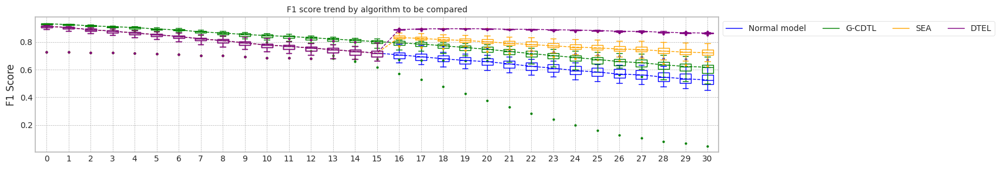

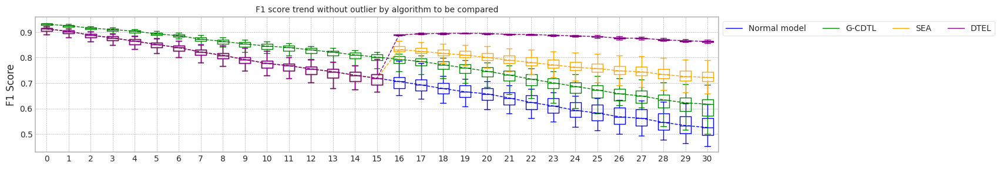

max_mean_trial= 11


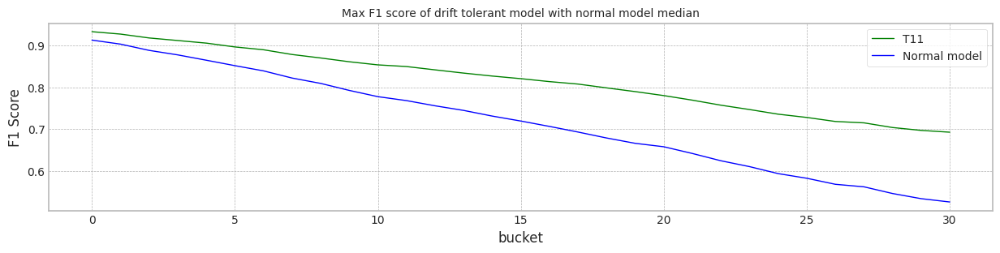

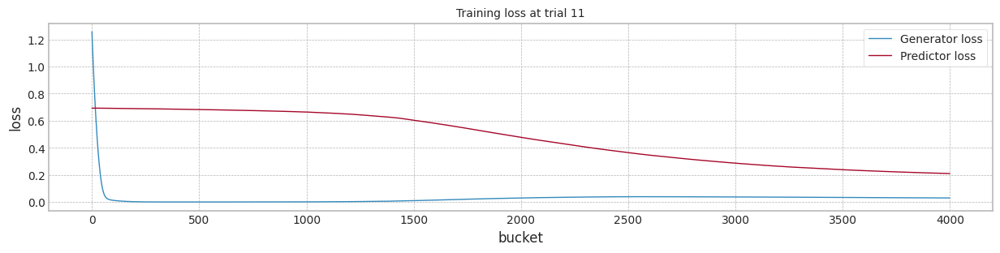

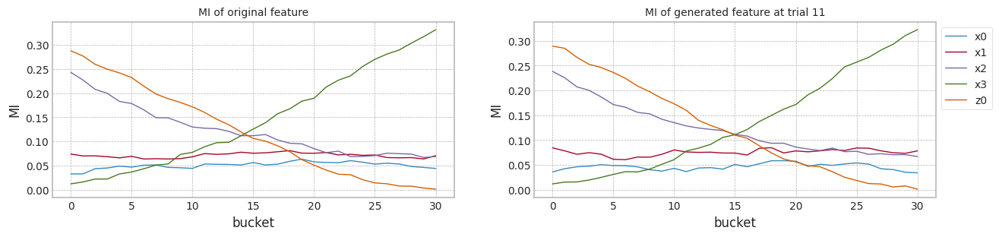

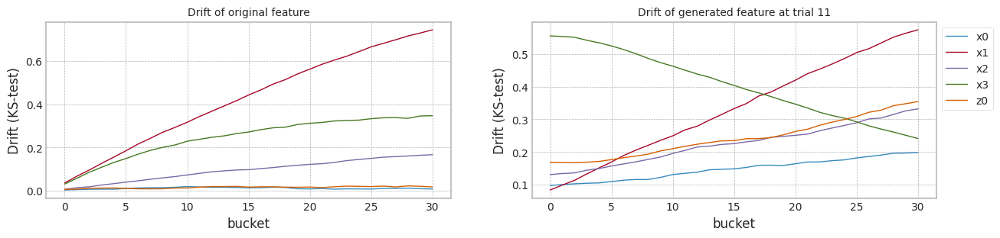

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.910052,0.900847,0.695509,0.485772
1,1.0,0.890528,0.880341,0.668200,0.466044
2,2.0,0.922346,0.914464,0.757109,0.587566
3,3.0,0.912075,0.902558,0.703003,0.498388
4,4.0,0.727915,0.726475,0.674677,0.617405
5,5.0,0.905003,0.895155,0.687191,0.480477
6,6.0,0.911354,0.901829,0.714944,0.522195
7,7.0,0.916445,0.907043,0.720707,0.525841
8,8.0,0.914498,0.908943,0.791121,0.670349
9,9.0,0.911029,0.902212,0.717791,0.527960


,Trial,test_f1,init_f1,mean_f1,last_f1
0,1.0,0.933641,0.928194,0.798691,0.633409
1,3.0,0.932487,0.926961,0.554910,0.047584
2,5.0,0.927684,0.920558,0.771971,0.590484
3,7.0,0.932808,0.927698,0.802008,0.632384
4,9.0,0.933282,0.927792,0.776915,0.565273
5,11.0,0.932911,0.927185,0.814984,0.692241
6,13.0,0.923982,0.917616,0.780383,0.616407
7,15.0,0.930237,0.924420,0.791952,0.641673
8,17.0,0.727915,0.726475,0.674677,0.617405
9,19.0,0.910344,0.905380,0.764615,0.589489


,Trial,test_f1,init_f1,mean_f1,last_f1
0,1.0,0.910052,0.900847,0.778617,0.690028
1,3.0,0.890528,0.880341,0.779597,0.739080
2,5.0,0.922346,0.914464,0.819022,0.749621
3,7.0,0.912075,0.902558,0.754454,0.627081
4,9.0,0.727915,0.726475,0.788293,0.856725
5,11.0,0.905003,0.895155,0.786239,0.724597
6,13.0,0.911354,0.901829,0.793073,0.714450
7,15.0,0.916445,0.907043,0.803717,0.736356
8,17.0,0.914498,0.908943,0.839170,0.788533
9,19.0,0.911029,0.902212,0.812816,0.762145


,Trial,test_f1,init_f1,mean_f1,last_f1
0,1.0,0.910052,0.900847,0.842780,0.861634
1,3.0,0.890528,0.880341,0.825835,0.859604
2,5.0,0.922346,0.914464,0.863091,0.868357
3,7.0,0.912075,0.902558,0.846079,0.866171
4,9.0,0.727915,0.726475,0.790084,0.873016
5,11.0,0.905003,0.895155,0.837838,0.863082
6,13.0,0.911354,0.901829,0.848324,0.864564
7,15.0,0.916445,0.907043,0.851584,0.864275
8,17.0,0.914498,0.908943,0.867362,0.860032
9,19.0,0.911029,0.902212,0.847979,0.857046


In [164]:
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 100,trial_count=20) #np.max(X1['b'])+1)

## real-world data 의 실험

### Loan data 실험

#### Dataset 준비

##### Data load

In [165]:

if True:
    from google.colab import drive
    drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [166]:

df_accepted = pd.read_csv("/content/drive/MyDrive/Drift/accepted_2007_to_2018Q4.csv")

print(df_accepted.shape)

(2260701, 151)


##### Data 정제

In [167]:
# for the sake of simplicity, let's consider only Fully Paid and Charged Off values:
df_accepted = df_accepted[df_accepted.loan_status.isin(['Fully Paid', 'Charged Off'])]
print(df_accepted.shape)

cols_to_drop = df_accepted.isnull().sum().sort_values(ascending=False).head(50).index
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# maybe we can go further, and eliminate columns up to title:
cols_to_drop = df_accepted.isnull().sum().sort_values(ascending=False).head(45).index
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# Remaining columns have missing data points, but they account for less than 0.2% of the total data. Let's remove the rows that are missing those values in those columns with dropna():
df_accepted = df_accepted.dropna()
print(df_accepted.shape)

# These are constant columns. We can drop it either.
cols_to_drop = ['out_prncp', 'out_prncp_inv', 'policy_code']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# It seems we have many "duplicated" information. Let's drop some columns, based on visual inspection at corr_pairs dataframe:
cols_to_drop = ['fico_range_low', 'funded_amnt_inv', 'funded_amnt', 'total_pymnt_inv', 'total_pymnt', 'installment', 'collection_recovery_fee', 'total_rec_prncp', 'last_fico_range_low']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

values = df_accepted.loan_status.unique()
encode = [1,0]
d = dict(zip(values, encode))
df_accepted['loan_paid'] = df_accepted['loan_status'].map(d)
df_accepted = df_accepted.drop(columns=['loan_status'])

df_accepted

(1345310, 151)
(1345310, 101)
(1345310, 56)
(1341026, 56)
(1341026, 53)
(1341026, 44)


,id,loan_amnt,term,int_rate,grade,sub_grade,home_ownership,annual_inc,verification_status,issue_d,...,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens,hardship_flag,disbursement_method,debt_settlement_flag,loan_paid
0,68407277,3600.0,36 months,13.99,C,C4,MORTGAGE,55000.0,Not Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
1,68355089,24700.0,36 months,11.99,C,C1,MORTGAGE,65000.0,Not Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2,68341763,20000.0,60 months,10.78,B,B4,MORTGAGE,63000.0,Not Verified,Dec-2015,...,Joint App,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
4,68476807,10400.0,60 months,22.45,F,F1,MORTGAGE,104433.0,Source Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
5,68426831,11950.0,36 months,13.44,C,C3,RENT,34000.0,Source Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2260688,89905081,18000.0,60 months,9.49,B,B2,OWN,130000.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2260690,88948836,29400.0,60 months,13.99,C,C3,MORTGAGE,180792.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2260691,89996426,32000.0,60 months,14.49,C,C4,MORTGAGE,157000.0,Source Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,0
2260692,90006534,16000.0,60 months,12.79,C,C1,RENT,150000.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,3.0,0.0,N,Cash,N,1


In [168]:
# droping constant columns
print(df_accepted.pymnt_plan.value_counts())
print(df_accepted.hardship_flag.value_counts())
cols_to_drop = ['id', 'pymnt_plan', 'hardship_flag']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)
cat_cols = df_accepted.select_dtypes(include=['object']).columns
print(cat_cols)

print(df_accepted.term.value_counts())

# convert term into either a 36 or 60 integer numeric data type

l1 = df_accepted.term.unique()
l2 = [36, 60]
d = dict(zip(l1, l2))

df_accepted['term'] = df_accepted['term'].map(d)

# as grade is part of sub_grade, so let's just drop the grade feature.

df_accepted = df_accepted.drop(columns='grade')

df_accepted = pd.get_dummies(df_accepted, columns = ['sub_grade'], prefix='', prefix_sep='', drop_first=True)

cat_cols = df_accepted.select_dtypes(include=['object']).columns
print(cat_cols)

# for these columns, let's just create dummy variables, concatenate them with the original dataframe and drop original columns.

df_accepted = pd.get_dummies(df_accepted, columns = ['verification_status'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['application_type'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['initial_list_status'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['purpose'], prefix='', prefix_sep='', drop_first=True)
print(df_accepted.shape)

df_accepted['home_ownership'] = df_accepted.home_ownership.replace('NONE', 'ANY')
df_accepted = pd.get_dummies(df_accepted, columns = ['home_ownership'], prefix='', prefix_sep='', drop_first=True)
df_accepted = df_accepted.drop(columns=[ 'url', 'last_pymnt_d', 'last_credit_pull_d'])
df_accepted = df_accepted.drop(columns=['zip_code', 'addr_state'])
df_accepted = pd.get_dummies(df_accepted, columns = ['disbursement_method'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['debt_settlement_flag'], prefix='', prefix_sep='', drop_first=True)
df_accepted = df_accepted.drop(columns=['earliest_cr_line'])
print(df_accepted.shape)


df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jan','01')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Feb','02')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Mar','03')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Apr','04')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('May','05')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jun','06')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jul','07')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Aug','08')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Sep','09')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Oct','10')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Dec','11')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Nov','12')

def reorder_issue_d(dt):
    a = dt.split('-')
    return a[1]+a[0]

reorder_issue_d('01-2009')

df_accepted['issue_d'] = df_accepted['issue_d'].apply(reorder_issue_d)
df_accepted = df_accepted.sort_values(by='issue_d')
df_accepted.reset_index(drop=True, inplace=True)

df_accepted.info()

n    1341026
Name: pymnt_plan, dtype: int64
N    1341026
Name: hardship_flag, dtype: int64
(1341026, 41)
Index(['term', 'grade', 'sub_grade', 'home_ownership', 'verification_status',
       'issue_d', 'url', 'purpose', 'zip_code', 'addr_state',
       'earliest_cr_line', 'initial_list_status', 'last_pymnt_d',
       'last_credit_pull_d', 'application_type', 'disbursement_method',
       'debt_settlement_flag'],
      dtype='object')
 36 months    1017398
 60 months     323628
Name: term, dtype: int64
Index(['home_ownership', 'verification_status', 'issue_d', 'url', 'purpose',
       'zip_code', 'addr_state', 'earliest_cr_line', 'initial_list_status',
       'last_pymnt_d', 'last_credit_pull_d', 'application_type',
       'disbursement_method', 'debt_settlement_flag'],
      dtype='object')
(1341026, 86)
(1341026, 83)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1341026 entries, 0 to 1341025
Data columns (total 83 columns):
 #   Column                      Non-Null Count    Dtype  

##### Dataset 만들기

In [169]:
X = {}
Y = {}

df = df_accepted[df_accepted['issue_d'].str.startswith('2007') + df_accepted['issue_d'].str.startswith('2008') + df_accepted['issue_d'].str.startswith('2009')].copy()
df = df.drop(columns=['issue_d'])


X[2009] = df.loc[:, df.columns != 'loan_paid'].values
Y[2009] = df.loan_paid.values


for year in range(2010,2019):
    print(year)
    df = df_accepted[df_accepted['issue_d'].str.startswith(str(year))].copy()
    df = df.drop(columns=['issue_d'])
    X[year] = df.loc[:, df.columns != 'loan_paid'].values
    Y[year] = df.loan_paid.values

2010
2011
2012
2013
2014
2015
2016
2017
2018


In [170]:

X[2010].shape

(11497, 81)

In [171]:
COLUMNS = df.loc[:, df.columns != 'loan_paid'].columns
COLUMNS

Index(['loan_amnt', 'term', 'int_rate', 'annual_inc', 'dti', 'delinq_2yrs',
       'fico_range_high', 'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'total_rec_int', 'total_rec_late_fee',
       'recoveries', 'last_pymnt_amnt', 'last_fico_range_high',
       'collections_12_mths_ex_med', 'acc_now_delinq',
       'chargeoff_within_12_mths', 'delinq_amnt', 'pub_rec_bankruptcies',
       'tax_liens', 'A2', 'A3', 'A4', 'A5', 'B1', 'B2', 'B3', 'B4', 'B5', 'C1',
       'C2', 'C3', 'C4', 'C5', 'D1', 'D2', 'D3', 'D4', 'D5', 'E1', 'E2', 'E3',
       'E4', 'E5', 'F1', 'F2', 'F3', 'F4', 'F5', 'G1', 'G2', 'G3', 'G4', 'G5',
       'Source Verified', 'Verified', 'Joint App', 'w', 'credit_card',
       'debt_consolidation', 'educational', 'home_improvement', 'house',
       'major_purchase', 'medical', 'moving', 'other', 'renewable_energy',
       'small_business', 'vacation', 'wedding', 'MORTGAGE', 'OTHER', 'OWN',
       'RENT', 'DirectPay', 'Y'],
      dtype

In [172]:
seed_everything(12)

X_df = pd.DataFrame(X[2010],columns=COLUMNS)
mi_scores = make_mi_scores(X_df, Y[2010], discrete_features="auto")
print(mi_scores)

recoveries                  0.375327
last_fico_range_high        0.090427
last_pymnt_amnt             0.085496
total_rec_late_fee          0.038954
int_rate                    0.016850
                              ...   
F2                          0.000000
chargeoff_within_12_mths    0.000000
G1                          0.000000
G3                          0.000000
D3                          0.000000
Name: MI Scores, Length: 81, dtype: float64


In [173]:
# MI Top 5, columns
top_columns = list(mi_scores[0:5].index)
top_columns

['recoveries',
 'last_fico_range_high',
 'last_pymnt_amnt',
 'total_rec_late_fee',
 'int_rate']

#### 실험

In [174]:
# 1/10 로 사이즈 줄이기...
seed_everything()

X2 = np.concatenate((X[2010],X[2011],X[2012],X[2013],X[2014],X[2015],X[2016],X[2017]))
Y2 = np.concatenate((Y[2010],Y[2011],Y[2012],Y[2013],Y[2014],Y[2015],Y[2016],Y[2017]))
s = np.sort(np.random.choice(X2.shape[0],int(X2.shape[0]/10),replace= False))
#print(s.shape)
X3 = pd.DataFrame(X2[s],columns=COLUMNS)
Y3 = Y2[s]



##### weight 초기화

In [175]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model(train_tensors, test_tensors, train_opt, lambda_f, avaible_range, alpha, columns,ShowChart = False, do_mine=True):
    #seed_everything()

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(device)

    lambda_f = torch.tensor([lambda_f],dtype=torch.float32).to(device)

    XS_train = train_tensors.XS_train.to(device)
    y_train = train_tensors.y_train.to(device)
    #s1_train = train_tensors.s1_train.to(device)

    XS_test = test_tensors.XS_test.to(device)
    y_test = test_tensors.y_test.to(device)
    #s1_test = test_tensors.s1_test.to(device)

    # Saves return values here
    #test_result = []

    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch

    b_dim = XS_train.shape[1]-1

    # The loss values of each component will be saved in the following lists.
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    a_losses = []
    m_losses =[]
    f_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss(reduce=False)  # mean square error

    # Initializes generator and discriminator
    discriminator = Discriminator(b_dim).to(device)
    discriminator.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(discriminator.parameters(), lr=train_opt.lr_g)

    train_len = XS_train.shape[0]


    adapter = Generator(b_dim).to(device)
    adapter.apply(weights_init_normal)

    optimizer_A = torch.optim.Adam(adapter.parameters(), lr=0.001)

    mine = Net(b_dim).to(device)

    mine_loss = customLoss(mine).to(device)
    optimizer_M = torch.optim.Adam(mine_loss.parameters(), lr=0.001)
    #kld_loss = nn.KLDivLoss(reduction='batchmean')
    default_value = torch.tensor([0.5],dtype=torch.float32).to(device)
    for epoch in tqdm(range(n_epochs)):


        # -------------------------------
        #  b에 대한 x의 전처리
        # -------------------------------

        if lambda_f >= 0.0:
            xs = adapter(XS_train[:,0:b_dim],XS_train[:,b_dim].reshape(-1,1)/avaible_range) # z0, b

            #org = torch.histc(XS_train[:,0:b_dim], bins=100, min=0, max=1)
            #trg = torch.histc(xs, bins=100, min=0, max=1)

            ml = torch.mean(mse_loss(xs, XS_train[:,0:b_dim]),dim=0)

            ## distribution의 변차를 최소화 한다. kld_loss ??
            #kl = torch.mean(kld_loss(trg.log(), org),dim=0)
            #
            a_loss =  torch.sum(ml) + torch.std(ml)
        else:
            xs = XS_train[:,0:b_dim]
            a_loss = torch.tensor(0.0)

        # -------------------
        #  Forwards Generator
        # -------------------
        #xs = torch.cat((XS_train[:,0:4], a_z.reshape(-1,1)), 1)
        #print(xs.shape)
        gen_y = discriminator(xs).reshape(-1,1)
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1)) #+ torch.log(mine_loss.mean()+1)*0.001

        optimizer_A.zero_grad()
        #optimizer_M.zero_grad()
        optimizer_G.zero_grad()
        '''
        if lambda_f >= 0.0:
            # -------------------
            #  Forwards MINE
            # -------------------

            xs_test = adapter(XS_test[:,0:b_dim],XS_test[:,b_dim].reshape(-1,1)/avaible_range)
            #x_sample = Variable(torch.clone(xs_test), requires_grad = True)

            m_loss, lmd = mine_loss(xs_test,
                                    y_test, #generator(xs_test).reshape(-1,1),
                                    default_value)

            m_losses.append(-m_loss.cpu().data.numpy())
            f_losses.append(lmd.cpu().data.numpy())

            m_loss = m_loss.sum() * 0.01
            #m_loss.mean().backward()

            #lambda_f = lmd #.detach()
        else:
            m_loss = torch.tensor(0.0)
        '''

        lambda1 = 0.7

        if lambda_f >= 0.0:
            #loss =  lambda1*g_loss + (1-lambda1)*a_loss + torch.std(torch.tensor((g_loss,a_loss)))   #(1.0-lambda_f) * g_loss + lambda_f * a_loss + m_loss.mean()*0.01
            loss =  g_loss + a_loss + torch.std(torch.tensor((g_loss,a_loss)))
        else:
            loss = g_loss

        loss.backward()

        optimizer_G.step()
        #optimizer_M.step()
        optimizer_A.step()

        a_losses.append(a_loss.cpu().data.numpy())
        g_losses.append(g_loss.cpu().data.numpy())

        '''
        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [a loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, a_losses[-1], g_losses[-1])
                )
        '''
        if lambda_f < 0.0:
            adapter = None

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    f1 = test_model(discriminator,adapter, train_tensors, test_tensors, avaible_range,columns)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    df_loss = pd.DataFrame({'Generator loss':a_losses,'Predictor loss':g_losses})
    if ShowChart:
        df_loss.plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel=f'bucket ({XS_train.shape[0]})',fontsize=15)
        plt.legend(loc=1)
        plt.show()
    '''
    if lambda_f >= 0.0:
        plt.figure(figsize=main_figsize)
        mi_df = pd.DataFrame(m_losses,columns=columns)
        mi_df.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='epoch',fontsize=10)
        plt.legend(bbox_to_anchor=(1.0, 1.0))
        plt.show()

        plt.figure(figsize=main_figsize)
        #plt.plot(a_losses,linewidth=1,label='Adapter loss')
        #plt.plot(g_losses,linewidth=1,label='classifier loss')
        plt.plot(f_losses,linewidth=1,label='lambda')
        plt.ylabel('lambda')
        plt.xlabel('epoch')
        plt.legend(loc=1,ncol=1)
        plt.show()
    '''
    return f1,discriminator,adapter,df_loss

#### do

columns: ['recoveries', 'last_fico_range_high', 'last_pymnt_amnt', 'total_rec_late_fee', 'int_rate']
MI Analysis MI Max 0.28468, Min 0.02064, Mean 0.17477, Std 0.11951
Dataset structure X_train, (20000, 5) X_test, (20000, 5) X_live (123968, 5)
Truncate 19968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set (26, 20000, 5)


100%|██████████| 26/26 [00:10<00:00,  2.50it/s]


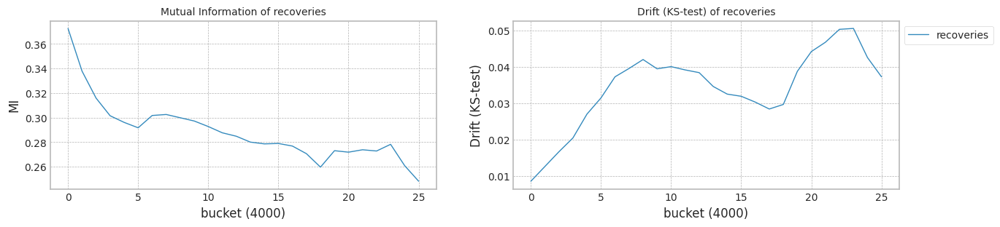

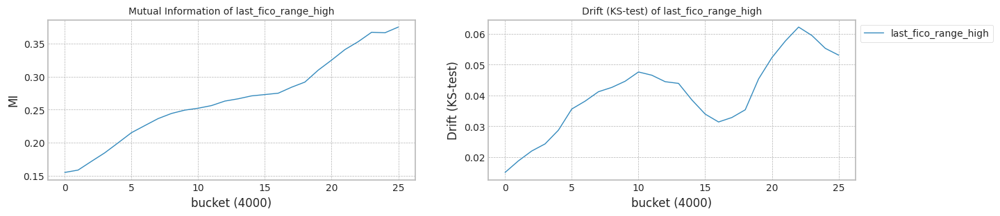

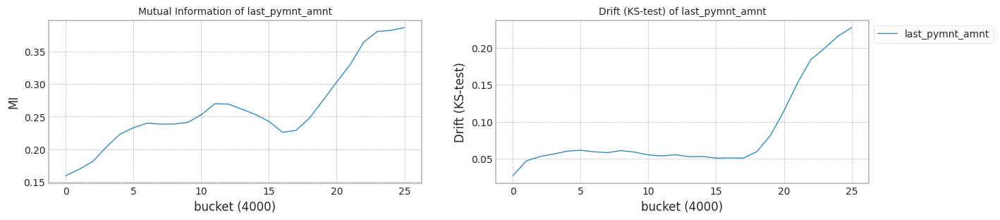

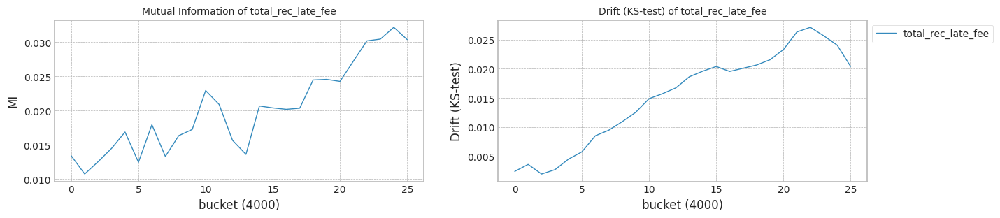

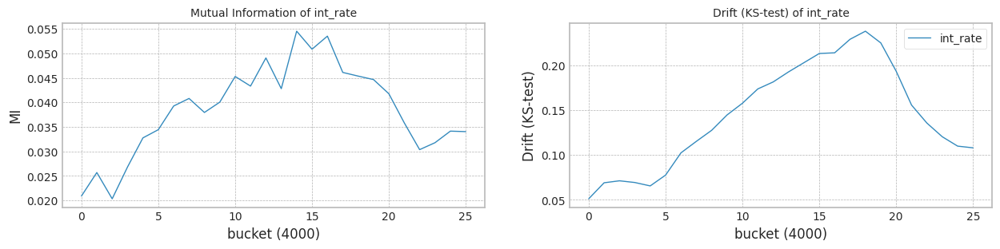

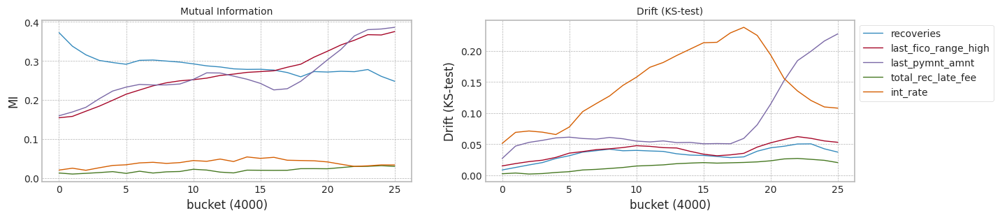

trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 620.91it/s]


Test f1 score: 0.9315357887421821
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.42it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9116853036009894
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 225.17it/s]


Test f1 score: 0.9662837449741527
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.51it/s]


mean of drift:
recoveries              0.855962
last_fico_range_high    0.155696
last_pymnt_amnt         0.489004
total_rec_late_fee      0.945958
int_rate                0.154527
dtype: float64
Mean F1 for all data: 0.902024141621385
Normal model mean        : 0.9116853036009894
Drift tolerant model mean: 0.902024141621385
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 610.52it/s]


Test f1 score: 0.9149358956909927
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.45it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8892937557842946
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 225.24it/s]


Test f1 score: 0.9736659335571246
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.47it/s]


mean of drift:
recoveries              0.826762
last_fico_range_high    0.123967
last_pymnt_amnt         0.487994
total_rec_late_fee      0.965750
int_rate                0.153752
dtype: float64
Mean F1 for all data: 0.9635289067321797
Normal model mean        : 0.9004895296926421
Drift tolerant model mean: 0.9327765241767824
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 616.94it/s]


Test f1 score: 0.9483997387328544
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.44it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9375235777252146
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 225.57it/s]


Test f1 score: 0.9735547711359296
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.49it/s]


mean of drift:
recoveries              0.860837
last_fico_range_high    0.256190
last_pymnt_amnt         0.090777
total_rec_late_fee      0.909363
int_rate                0.149956
dtype: float64
Mean F1 for all data: 0.9615167279616478
Normal model mean        : 0.9128342123701662
Drift tolerant model mean: 0.9423565921050708
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 625.33it/s]


Test f1 score: 0.9299447881696862
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.45it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9093841469423276
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.42it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.45it/s]


mean of drift:
recoveries              0.863567
last_fico_range_high    0.215604
last_pymnt_amnt         0.496985
total_rec_late_fee      0.919577
int_rate                0.135250
dtype: float64
Mean F1 for all data: 0.8867926868605498
Normal model mean        : 0.9119716960132065
Drift tolerant model mean: 0.9284656157939406
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 629.83it/s]


Test f1 score: 0.9438628260992586
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.41it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9316019571171616
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 222.86it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.49it/s]


mean of drift:
recoveries              0.876556
last_fico_range_high    0.111090
last_pymnt_amnt         0.492600
total_rec_late_fee      0.941187
int_rate                0.160262
dtype: float64
Mean F1 for all data: 0.8867926868605498
Normal model mean        : 0.9158977482339974
Drift tolerant model mean: 0.9201310300072624
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 628.11it/s]


Test f1 score: 0.9339622641509433
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.39it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9151424942160997
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.59it/s]


Test f1 score: 0.972700983227299
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.50it/s]


mean of drift:
recoveries              0.792519
last_fico_range_high    0.179965
last_pymnt_amnt         0.485652
total_rec_late_fee      0.945869
int_rate                0.154469
dtype: float64
Mean F1 for all data: 0.912301631282869
Normal model mean        : 0.9157718725643478
Drift tolerant model mean: 0.9188261302198635
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 626.81it/s]


Test f1 score: 0.9137813985064493
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8867861910860791
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.08it/s]


Test f1 score: 0.9724712278063733
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.50it/s]


mean of drift:
recoveries              0.888377
last_fico_range_high    0.172960
last_pymnt_amnt         0.482706
total_rec_late_fee      0.943046
int_rate                0.150979
dtype: float64
Mean F1 for all data: 0.9529094351232033
Normal model mean        : 0.9116310609245951
Drift tolerant model mean: 0.9236951737774834
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 626.48it/s]


Test f1 score: 0.9304714833120453
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.45it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9096420996103313
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.02it/s]


Test f1 score: 0.9735082081125683
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.49it/s]


mean of drift:
recoveries              0.860169
last_fico_range_high    0.106212
last_pymnt_amnt         0.489862
total_rec_late_fee      0.945606
int_rate                0.138977
dtype: float64
Mean F1 for all data: 0.9228050348757324
Normal model mean        : 0.9113824407603123
Drift tolerant model mean: 0.9235839064147646
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 631.47it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.45it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8867926868605498
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.23it/s]


Test f1 score: 0.9735015042814164
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.50it/s]


mean of drift:
recoveries              0.835929
last_fico_range_high    0.060967
last_pymnt_amnt         0.262706
total_rec_late_fee      0.965738
int_rate                0.153129
dtype: float64
Mean F1 for all data: 0.9426373103028765
Normal model mean        : 0.9086502458825608
Drift tolerant model mean: 0.9257009512912214
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 624.86it/s]


Test f1 score: 0.9341360760375729
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.44it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9162468130034456
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.92it/s]


Test f1 score: 0.9729291994447017
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.49it/s]


mean of drift:
recoveries              0.825979
last_fico_range_high    0.119350
last_pymnt_amnt         0.493856
total_rec_late_fee      0.965750
int_rate                0.166417
dtype: float64
Mean F1 for all data: 0.9629609251174585
Normal model mean        : 0.9094099025946493
Drift tolerant model mean: 0.9294269486738452
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 630.60it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.45it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8867926868605498
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.46it/s]


Test f1 score: 0.9735973597359735
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.49it/s]


mean of drift:
recoveries              0.859887
last_fico_range_high    0.119237
last_pymnt_amnt         0.489481
total_rec_late_fee      0.945669
int_rate                0.157865
dtype: float64
Mean F1 for all data: 0.9216000323873119
Normal model mean        : 0.9073537920733675
Drift tolerant model mean: 0.928715410829615
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 638.55it/s]


Test f1 score: 0.9385191652350241
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.44it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9233479736340093
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.02it/s]


Test f1 score: 0.9738274464389113
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.40it/s]


mean of drift:
recoveries              0.859842
last_fico_range_high    0.201092
last_pymnt_amnt         0.478188
total_rec_late_fee      0.915900
int_rate                0.161769
dtype: float64
Mean F1 for all data: 0.9331567170454564
Normal model mean        : 0.9086866405367543
Drift tolerant model mean: 0.929085519680935
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 627.24it/s]


Test f1 score: 0.9386105263157895
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.39it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9236263800175257
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.50it/s]


Test f1 score: 0.9729635948298296
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.49it/s]


mean of drift:
recoveries              0.860535
last_fico_range_high    0.118358
last_pymnt_amnt         0.486925
total_rec_late_fee      0.946492
int_rate                0.170454
dtype: float64
Mean F1 for all data: 0.9261698817330769
Normal model mean        : 0.9098358512660444
Drift tolerant model mean: 0.9288612398387921
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 631.74it/s]


Test f1 score: 0.9179459164162797
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.45it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8935746324871745
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.56it/s]


Test f1 score: 0.9731042859621726
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.51it/s]


mean of drift:
recoveries              0.860213
last_fico_range_high    0.159577
last_pymnt_amnt         0.488327
total_rec_late_fee      0.938521
int_rate                0.152717
dtype: float64
Mean F1 for all data: 0.9580441268973967
Normal model mean        : 0.9086743356389823
Drift tolerant model mean: 0.9309457317715496
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 630.97it/s]


Test f1 score: 0.9171261669487363
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.45it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8928071580545702
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.85it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.50it/s]


mean of drift:
recoveries              0.860775
last_fico_range_high    0.151817
last_pymnt_amnt         0.507894
total_rec_late_fee      0.945890
int_rate                0.142008
dtype: float64
Mean F1 for all data: 0.8867926868605498
Normal model mean        : 0.9076165238000214
Drift tolerant model mean: 0.9280021954441496
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.53it/s]


Test f1 score: 0.9412096592191379
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.44it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9274718720234378
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.91it/s]


Test f1 score: 0.9728807678963802
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.50it/s]


mean of drift:
recoveries              0.844644
last_fico_range_high    0.144329
last_pymnt_amnt         0.485313
total_rec_late_fee      0.983058
int_rate                0.156413
dtype: float64
Mean F1 for all data: 0.9254850978602699
Normal model mean        : 0.9088574830639851
Drift tolerant model mean: 0.927844876845157
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 630.66it/s]


Test f1 score: 0.9374297910581891
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.44it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9220949808842456
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.12it/s]


Test f1 score: 0.9730151843817787
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.52it/s]


mean of drift:
recoveries              0.880825
last_fico_range_high    0.123523
last_pymnt_amnt         0.483246
total_rec_late_fee      0.945640
int_rate                0.152900
dtype: float64
Mean F1 for all data: 0.9236892492544809
Normal model mean        : 0.9096361594063533
Drift tolerant model mean: 0.9276004281633526
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 635.14it/s]


Test f1 score: 0.9355397774920334
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.47it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9176229150724697
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.72it/s]


Test f1 score: 0.9657864523536165
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.52it/s]


mean of drift:
recoveries              0.879033
last_fico_range_high    0.105958
last_pymnt_amnt         0.486654
total_rec_late_fee      0.946502
int_rate                0.147902
dtype: float64
Mean F1 for all data: 0.9020175475223926
Normal model mean        : 0.910079868054471
Drift tolerant model mean: 0.9261791570166326
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 633.55it/s]


Test f1 score: 0.922117866754545
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.43it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8991483356899502
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.14it/s]


Test f1 score: 0.9724261518006821
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.860750
last_fico_range_high    0.159419
last_pymnt_amnt         0.493319
total_rec_late_fee      0.935063
int_rate                0.161031
dtype: float64
Mean F1 for all data: 0.9573827315206922
Normal model mean        : 0.9095045242458121
Drift tolerant model mean: 0.927821450411583
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 614.07it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.45it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8867926868605498
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.42it/s]


Test f1 score: 0.9729026287631222
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.890906
last_fico_range_high    0.157992
last_pymnt_amnt         0.495235
total_rec_late_fee      0.965750
int_rate                0.154210
dtype: float64
Mean F1 for all data: 0.9689929410762491
Normal model mean        : 0.9083689323765489
Drift tolerant model mean: 0.9298800249448164


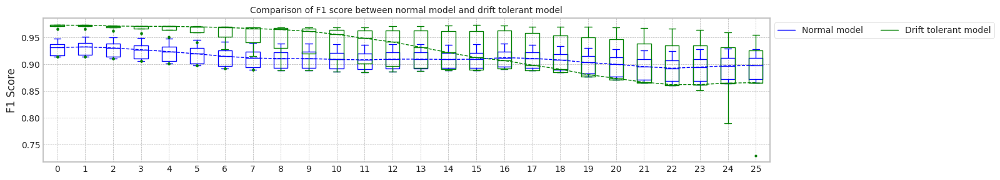

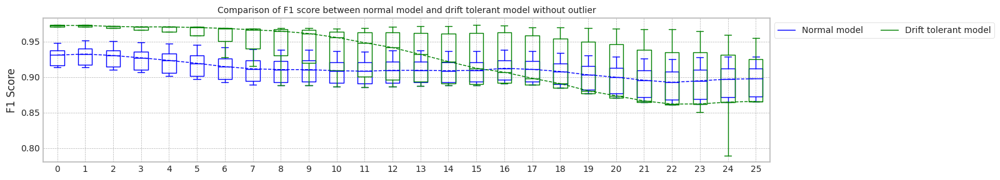

max_mean_trial= 19


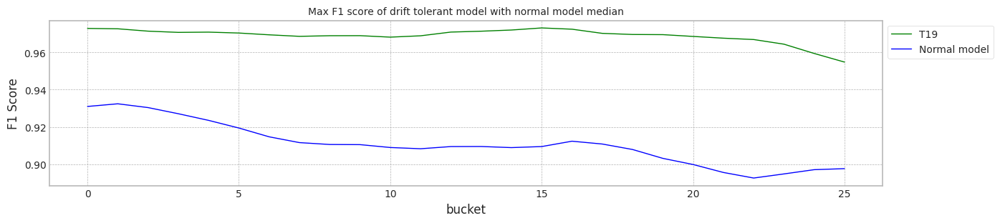

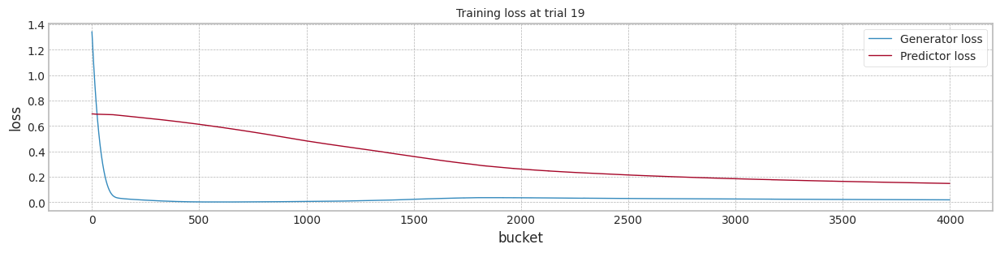

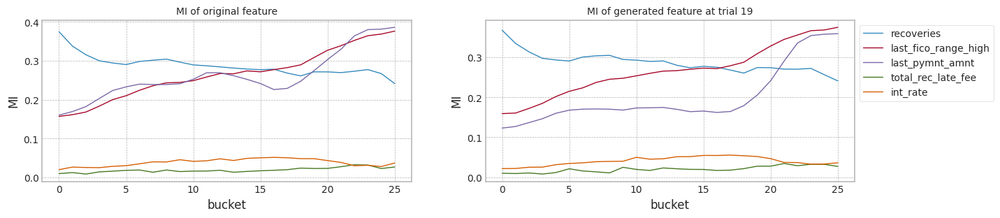

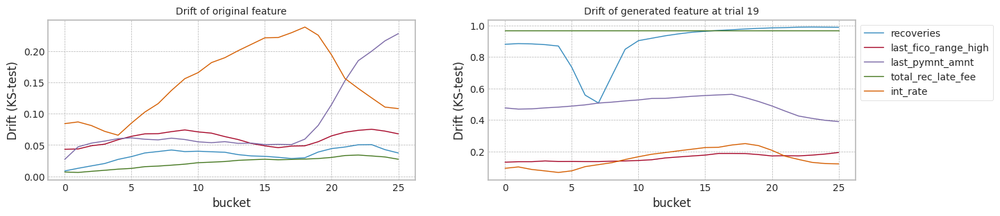

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.931536,0.931536,0.911685,0.899187
1,1.0,0.914936,0.914936,0.889294,0.869137
2,2.0,0.948400,0.948400,0.937524,0.928591
3,3.0,0.929945,0.929945,0.909384,0.895627
4,4.0,0.943863,0.943863,0.931602,0.923030
5,5.0,0.933962,0.933962,0.915142,0.902838
6,6.0,0.913781,0.913781,0.886786,0.865555
7,7.0,0.930471,0.930471,0.909642,0.896045
8,8.0,0.913811,0.913811,0.886793,0.865538
9,9.0,0.934136,0.934136,0.916247,0.904848


,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.966284,0.966284,0.902024,0.865538
1,1.0,0.973666,0.973666,0.963529,0.953313
2,2.0,0.973555,0.973555,0.961517,0.942605
3,3.0,0.913811,0.913811,0.886793,0.865538
4,4.0,0.913811,0.913811,0.886793,0.865538
5,5.0,0.972701,0.972701,0.912302,0.865538
6,6.0,0.972471,0.972471,0.952909,0.913721
7,7.0,0.973508,0.973508,0.922805,0.865628
8,8.0,0.973502,0.973502,0.942637,0.729618
9,9.0,0.972929,0.972929,0.962961,0.951385


In [176]:
seed_everything()

#s = np.sort(np.random.choice(len(COLUMNS),2,replace= False))
top_columns = list(mi_scores[0:5].index)
top_columns
print('columns:',top_columns)
#print(s.shape)
X4 = X3[top_columns]

train_size = 10000*2
test_size = 2000*2

X1,Y1 = check_mi_drift(X4, Y3, train_size, test_size)

bucket_size = 500*2
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
_,_,_,_,_,_ = drift_tolerant(X1, Y1,train_size, test_size,avaible_range = 600,trial_count=20)

columns: ['recoveries', 'last_fico_range_high', 'last_pymnt_amnt', 'total_rec_late_fee', 'int_rate']
MI Analysis MI Max 0.28468, Min 0.02064, Mean 0.17477, Std 0.11951
Dataset structure X_train, (20000, 5) X_test, (20000, 5) X_live (123968, 5)
Truncate 19968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set (26, 20000, 5)


100%|██████████| 26/26 [00:10<00:00,  2.48it/s]


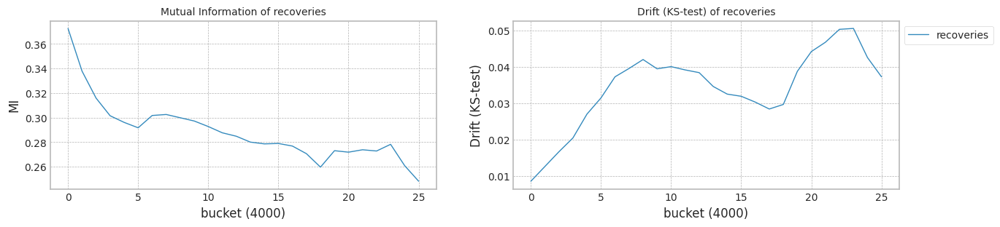

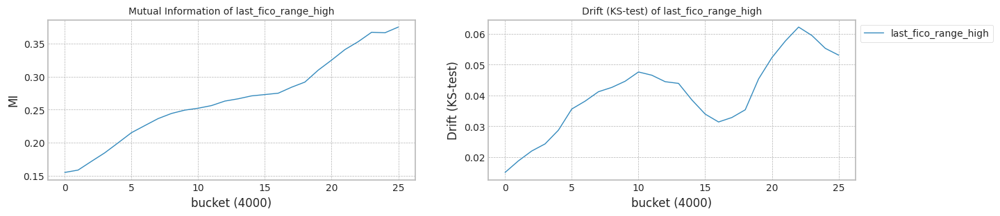

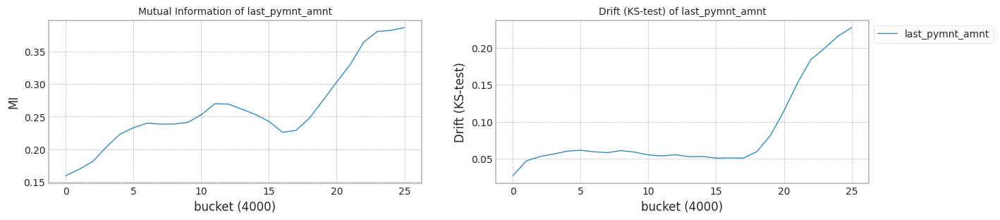

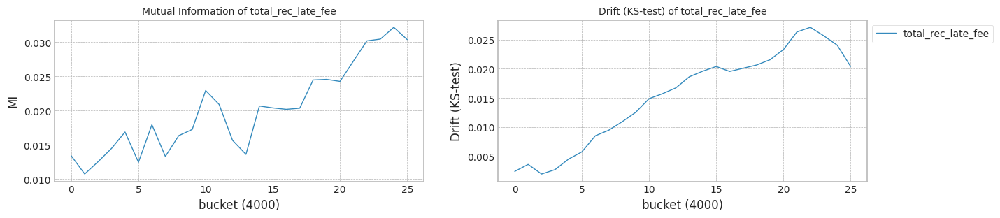

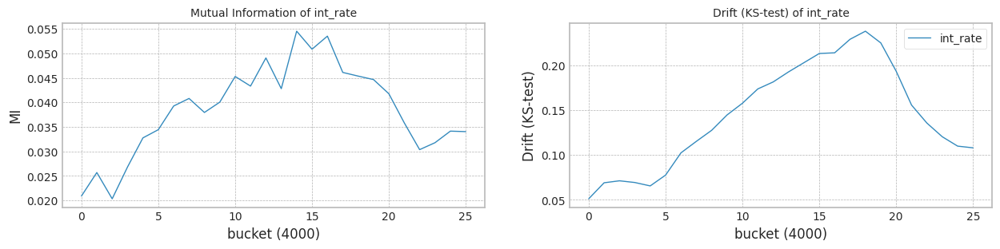

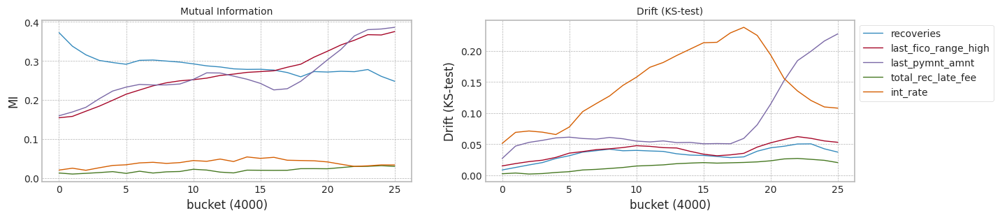

trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 614.02it/s]


Test f1 score: 0.9315357887421821
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.42it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9116853036009894
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 222.73it/s]


Test f1 score: 0.9662837449741527
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.47it/s]


mean of drift:
recoveries              0.855962
last_fico_range_high    0.155696
last_pymnt_amnt         0.489004
total_rec_late_fee      0.945958
int_rate                0.154527
dtype: float64
Mean F1 for all data: 0.902024141621385
Normal model mean        : 0.9116853036009894
Drift tolerant model mean: 0.902024141621385
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 617.07it/s]


Test f1 score: 0.9149358956909927
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.41it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8892937557842946
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 220.56it/s]


Test f1 score: 0.9736659335571246
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.826762
last_fico_range_high    0.123967
last_pymnt_amnt         0.487994
total_rec_late_fee      0.965750
int_rate                0.153752
dtype: float64
Mean F1 for all data: 0.9635289067321797
Normal model mean        : 0.9004895296926421
Drift tolerant model mean: 0.9327765241767824
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 607.87it/s]


Test f1 score: 0.9483997387328544
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.39it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9375235777252146
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 221.55it/s]


Test f1 score: 0.9735547711359296
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.49it/s]


mean of drift:
recoveries              0.860837
last_fico_range_high    0.256190
last_pymnt_amnt         0.090777
total_rec_late_fee      0.909363
int_rate                0.149956
dtype: float64
Mean F1 for all data: 0.9615167279616478
Normal model mean        : 0.9128342123701662
Drift tolerant model mean: 0.9423565921050708
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 622.95it/s]


Test f1 score: 0.9299447881696862
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.44it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9093841469423276
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.44it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.47it/s]


mean of drift:
recoveries              0.863567
last_fico_range_high    0.215604
last_pymnt_amnt         0.496985
total_rec_late_fee      0.919577
int_rate                0.135250
dtype: float64
Mean F1 for all data: 0.8867926868605498
Normal model mean        : 0.9119716960132065
Drift tolerant model mean: 0.9284656157939406
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 594.64it/s]


Test f1 score: 0.9438628260992586
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.42it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9316019571171616
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.54it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.45it/s]


mean of drift:
recoveries              0.876556
last_fico_range_high    0.111090
last_pymnt_amnt         0.492600
total_rec_late_fee      0.941187
int_rate                0.160262
dtype: float64
Mean F1 for all data: 0.8867926868605498
Normal model mean        : 0.9158977482339974
Drift tolerant model mean: 0.9201310300072624
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 639.59it/s]


Test f1 score: 0.9339622641509433
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.44it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9151424942160997
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.05it/s]


Test f1 score: 0.972700983227299
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.50it/s]


mean of drift:
recoveries              0.792519
last_fico_range_high    0.179965
last_pymnt_amnt         0.485652
total_rec_late_fee      0.945869
int_rate                0.154469
dtype: float64
Mean F1 for all data: 0.912301631282869
Normal model mean        : 0.9157718725643478
Drift tolerant model mean: 0.9188261302198635
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 627.40it/s]


Test f1 score: 0.9137813985064493
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.43it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8867861910860791
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.78it/s]


Test f1 score: 0.9724712278063733
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.50it/s]


mean of drift:
recoveries              0.888377
last_fico_range_high    0.172960
last_pymnt_amnt         0.482706
total_rec_late_fee      0.943046
int_rate                0.150979
dtype: float64
Mean F1 for all data: 0.9529094351232033
Normal model mean        : 0.9116310609245951
Drift tolerant model mean: 0.9236951737774834
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 624.79it/s]


Test f1 score: 0.9304714833120453
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.43it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9096420996103313
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.44it/s]


Test f1 score: 0.9735082081125683
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.50it/s]


mean of drift:
recoveries              0.860169
last_fico_range_high    0.106212
last_pymnt_amnt         0.489862
total_rec_late_fee      0.945606
int_rate                0.138977
dtype: float64
Mean F1 for all data: 0.9228050348757324
Normal model mean        : 0.9113824407603123
Drift tolerant model mean: 0.9235839064147646
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 629.05it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.42it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8867926868605498
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.60it/s]


Test f1 score: 0.9735015042814164
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.49it/s]


mean of drift:
recoveries              0.835929
last_fico_range_high    0.060967
last_pymnt_amnt         0.262706
total_rec_late_fee      0.965738
int_rate                0.153129
dtype: float64
Mean F1 for all data: 0.9426373103028765
Normal model mean        : 0.9086502458825608
Drift tolerant model mean: 0.9257009512912214
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 619.67it/s]


Test f1 score: 0.9341360760375729
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.44it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9162468130034456
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.16it/s]


Test f1 score: 0.9729291994447017
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.48it/s]


mean of drift:
recoveries              0.825979
last_fico_range_high    0.119350
last_pymnt_amnt         0.493856
total_rec_late_fee      0.965750
int_rate                0.166417
dtype: float64
Mean F1 for all data: 0.9629609251174585
Normal model mean        : 0.9094099025946493
Drift tolerant model mean: 0.9294269486738452
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 633.50it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.42it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8867926868605498
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.98it/s]


Test f1 score: 0.9735973597359735
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.49it/s]


mean of drift:
recoveries              0.859887
last_fico_range_high    0.119237
last_pymnt_amnt         0.489481
total_rec_late_fee      0.945669
int_rate                0.157865
dtype: float64
Mean F1 for all data: 0.9216000323873119
Normal model mean        : 0.9073537920733675
Drift tolerant model mean: 0.928715410829615
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 627.63it/s]


Test f1 score: 0.9385191652350241
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.38it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9233479736340093
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.29it/s]


Test f1 score: 0.9738274464389113
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.49it/s]


mean of drift:
recoveries              0.859842
last_fico_range_high    0.201092
last_pymnt_amnt         0.478188
total_rec_late_fee      0.915900
int_rate                0.161769
dtype: float64
Mean F1 for all data: 0.9331567170454564
Normal model mean        : 0.9086866405367543
Drift tolerant model mean: 0.929085519680935
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 631.09it/s]


Test f1 score: 0.9386105263157895
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.44it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9236263800175257
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.93it/s]


Test f1 score: 0.9729635948298296
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.52it/s]


mean of drift:
recoveries              0.860535
last_fico_range_high    0.118358
last_pymnt_amnt         0.486925
total_rec_late_fee      0.946492
int_rate                0.170454
dtype: float64
Mean F1 for all data: 0.9261698817330769
Normal model mean        : 0.9098358512660444
Drift tolerant model mean: 0.9288612398387921
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 628.07it/s]


Test f1 score: 0.9179459164162797
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8935746324871745
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.41it/s]


Test f1 score: 0.9731042859621726
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.50it/s]


mean of drift:
recoveries              0.860213
last_fico_range_high    0.159577
last_pymnt_amnt         0.488327
total_rec_late_fee      0.938521
int_rate                0.152717
dtype: float64
Mean F1 for all data: 0.9580441268973967
Normal model mean        : 0.9086743356389823
Drift tolerant model mean: 0.9309457317715496
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.00it/s]


Test f1 score: 0.9171261669487363
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8928071580545702
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.69it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.51it/s]


mean of drift:
recoveries              0.860775
last_fico_range_high    0.151817
last_pymnt_amnt         0.507894
total_rec_late_fee      0.945890
int_rate                0.142008
dtype: float64
Mean F1 for all data: 0.8867926868605498
Normal model mean        : 0.9076165238000214
Drift tolerant model mean: 0.9280021954441496
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 638.19it/s]


Test f1 score: 0.9412096592191379
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.44it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9274718720234378
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.69it/s]


Test f1 score: 0.9728807678963802
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.49it/s]


mean of drift:
recoveries              0.844644
last_fico_range_high    0.144329
last_pymnt_amnt         0.485313
total_rec_late_fee      0.983058
int_rate                0.156413
dtype: float64
Mean F1 for all data: 0.9254850978602699
Normal model mean        : 0.9088574830639851
Drift tolerant model mean: 0.927844876845157
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 638.24it/s]


Test f1 score: 0.9374297910581891
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9220949808842456
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.10it/s]


Test f1 score: 0.9730151843817787
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.40it/s]


mean of drift:
recoveries              0.880825
last_fico_range_high    0.123523
last_pymnt_amnt         0.483246
total_rec_late_fee      0.945640
int_rate                0.152900
dtype: float64
Mean F1 for all data: 0.9236892492544809
Normal model mean        : 0.9096361594063533
Drift tolerant model mean: 0.9276004281633526
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 611.81it/s]


Test f1 score: 0.9355397774920334
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.36it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9176229150724697
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 225.62it/s]


Test f1 score: 0.9657864523536165
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.48it/s]


mean of drift:
recoveries              0.879033
last_fico_range_high    0.105958
last_pymnt_amnt         0.486654
total_rec_late_fee      0.946502
int_rate                0.147902
dtype: float64
Mean F1 for all data: 0.9020175475223926
Normal model mean        : 0.910079868054471
Drift tolerant model mean: 0.9261791570166326
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 634.48it/s]


Test f1 score: 0.922117866754545
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.45it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8991483356899502
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.65it/s]


Test f1 score: 0.9724261518006821
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.49it/s]


mean of drift:
recoveries              0.860750
last_fico_range_high    0.159419
last_pymnt_amnt         0.493319
total_rec_late_fee      0.935063
int_rate                0.161031
dtype: float64
Mean F1 for all data: 0.9573827315206922
Normal model mean        : 0.9095045242458121
Drift tolerant model mean: 0.927821450411583
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 634.41it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.42it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8867926868605498
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.76it/s]


Test f1 score: 0.9729026287631222
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.39it/s]


mean of drift:
recoveries              0.890906
last_fico_range_high    0.157992
last_pymnt_amnt         0.495235
total_rec_late_fee      0.965750
int_rate                0.154210
dtype: float64
Mean F1 for all data: 0.9689929410762491
Normal model mean        : 0.9083689323765489
Drift tolerant model mean: 0.9298800249448164
######################### Trial 0 for Normal model ###########################
retrain_interval: 14
######################### Trial 0 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.31it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9225996154241245
SEA mean: 0.9225996154241245
######################### Trial 0 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.23it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9368156328439188
DTEL mean: 0.9368156328439188
######################### Trial 1 for Normal model ###########################
retrain_interval: 14
######################### Trial 1 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.30it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8949866594436267
SEA mean: 0.9087931374338756
######################### Trial 1 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.22it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.922553699527793
DTEL mean: 0.9296846661858559
######################### Trial 2 for Normal model ###########################
retrain_interval: 14
######################### Trial 2 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.31it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9275522331189383
SEA mean: 0.9150461693288965
######################### Trial 2 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.22it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9523748912513322
DTEL mean: 0.9372480745410147
######################### Trial 3 for Normal model ###########################
retrain_interval: 14
######################### Trial 3 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.33it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9081364908506018
SEA mean: 0.9133187497093228
######################### Trial 3 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.21it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9379620124822717
DTEL mean: 0.937426559026329
######################### Trial 4 for Normal model ###########################
retrain_interval: 14
######################### Trial 4 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.34it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9305737259735634
SEA mean: 0.9167697449621709
######################### Trial 4 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.23it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9503276957043837
DTEL mean: 0.94000678636194
######################### Trial 5 for Normal model ###########################
retrain_interval: 14
######################### Trial 5 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.32it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9256492244574078
SEA mean: 0.9182496582113772
######################### Trial 5 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.24it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.940250747172841
DTEL mean: 0.9400474464970902
######################### Trial 6 for Normal model ###########################
retrain_interval: 14
######################### Trial 6 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.35it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9026210018116274
SEA mean: 0.9160169930114128
######################### Trial 6 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.23it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9221138557377865
DTEL mean: 0.9374855049600468
######################### Trial 7 for Normal model ###########################
retrain_interval: 14
######################### Trial 7 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.31it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9163176126697565
SEA mean: 0.9160545704687058
######################### Trial 7 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.22it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.938104909684057
DTEL mean: 0.937562930550548
######################### Trial 8 for Normal model ###########################
retrain_interval: 14
######################### Trial 8 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.34it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9056475787796587
SEA mean: 0.9148982380588117
######################### Trial 8 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.25it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9294707578429162
DTEL mean: 0.9366638002497
######################### Trial 9 for Normal model ###########################
retrain_interval: 14
######################### Trial 9 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.29it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9269985922985959
SEA mean: 0.91610827348279
######################### Trial 9 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.23it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9397258701351633
DTEL mean: 0.9369700072382463
######################### Trial 10 for Normal model ###########################
retrain_interval: 14
######################### Trial 10 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.32it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9032959012381832
SEA mean: 0.9149435123696439
######################### Trial 10 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.25it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.908836779360223
DTEL mean: 0.9344124410675169
######################### Trial 11 for Normal model ###########################
retrain_interval: 14
######################### Trial 11 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.34it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.921152851002079
SEA mean: 0.9154609572556801
######################### Trial 11 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.23it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9447151838407255
DTEL mean: 0.9352710029652843
######################### Trial 12 for Normal model ###########################
retrain_interval: 14
######################### Trial 12 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.33it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9266025475731973
SEA mean: 0.9163180026647199
######################### Trial 12 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.23it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9456039556491365
DTEL mean: 0.9360658454794268
######################### Trial 13 for Normal model ###########################
retrain_interval: 14
######################### Trial 13 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.31it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9076229267247489
SEA mean: 0.9156969258118648
######################### Trial 13 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.22it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9251168437100521
DTEL mean: 0.9352837739244715
######################### Trial 14 for Normal model ###########################
retrain_interval: 14
######################### Trial 14 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.32it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9030682904284453
SEA mean: 0.9148550167863034
######################### Trial 14 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.24it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9290750192807947
DTEL mean: 0.9348698569482264
######################### Trial 15 for Normal model ###########################
retrain_interval: 14
######################### Trial 15 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.33it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9322865118838464
SEA mean: 0.9159444852299
######################### Trial 15 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.23it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9485188509918115
DTEL mean: 0.9357229190759504
######################### Trial 16 for Normal model ###########################
retrain_interval: 14
######################### Trial 16 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.33it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.927006775812701
SEA mean: 0.9165952082053589
######################### Trial 16 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.25it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9444181847010389
DTEL mean: 0.9362344052891909
######################### Trial 17 for Normal model ###########################
retrain_interval: 14
######################### Trial 17 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.34it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9130722231136228
SEA mean: 0.9163994868113736
######################### Trial 17 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.22it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9402438355083743
DTEL mean: 0.936457151412479
######################### Trial 18 for Normal model ###########################
retrain_interval: 14
######################### Trial 18 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.33it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9067111388814977
SEA mean: 0.9158895737624327
######################### Trial 18 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.22it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9291863934374511
DTEL mean: 0.9360744799401091
######################### Trial 19 for Normal model ###########################
retrain_interval: 14
######################### Trial 19 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.35it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9063386641270312
SEA mean: 0.9154120282806627
######################### Trial 19 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.25it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9216604695836111
DTEL mean: 0.9353537794222841


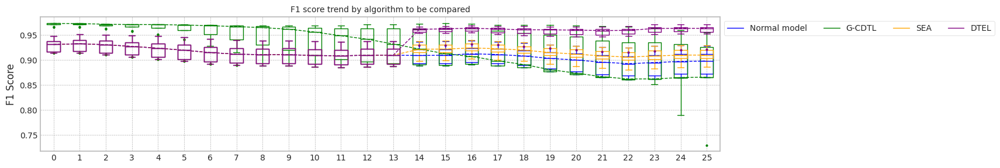

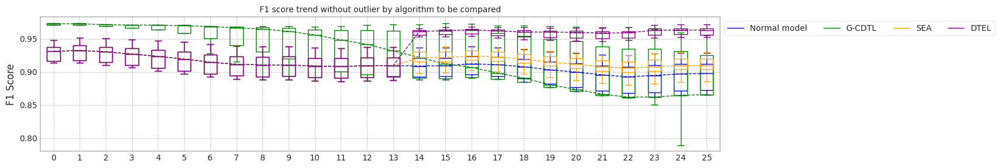

max_mean_trial= 39


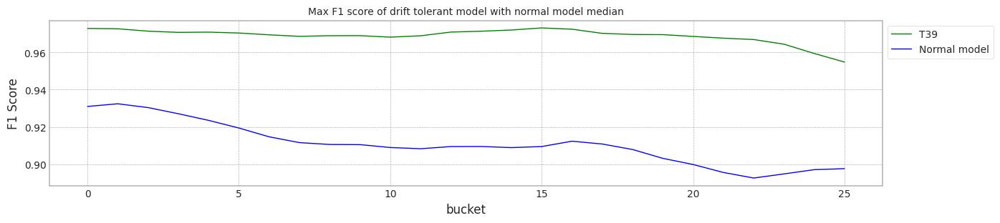

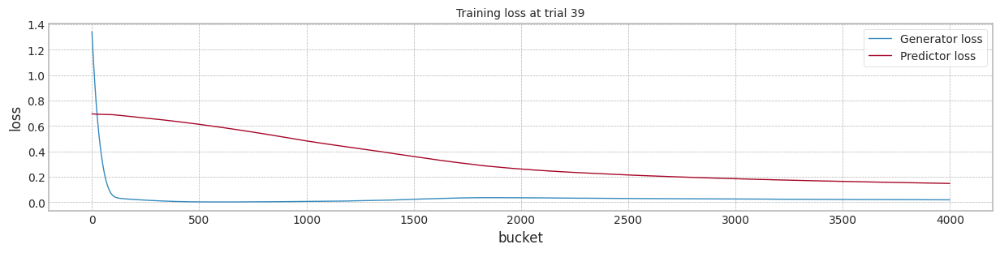

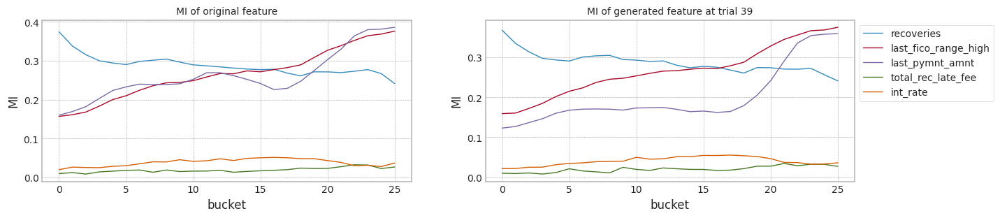

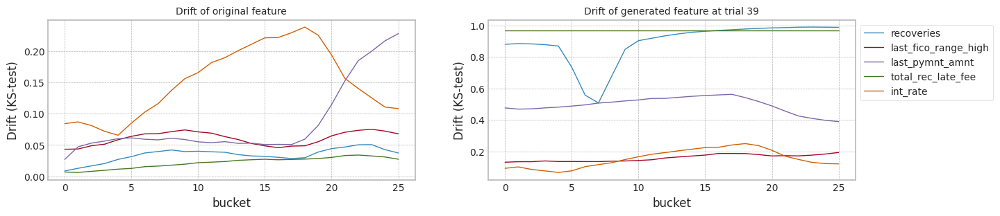

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.931536,0.932966,0.911685,0.899187
1,1.0,0.914936,0.915483,0.889294,0.869137
2,2.0,0.948400,0.951299,0.937524,0.928591
3,3.0,0.929945,0.931279,0.909384,0.895627
4,4.0,0.943863,0.946336,0.931602,0.923030
5,5.0,0.933962,0.935815,0.915142,0.902838
6,6.0,0.913781,0.914224,0.886786,0.865555
7,7.0,0.930471,0.931903,0.909642,0.896045
8,8.0,0.913811,0.914253,0.886793,0.865538
9,9.0,0.934136,0.936079,0.916247,0.904848


,Trial,test_f1,init_f1,mean_f1,last_f1
0,1.0,0.966284,0.965952,0.902024,0.865538
1,3.0,0.973666,0.973126,0.963529,0.953313
2,5.0,0.973555,0.973099,0.961517,0.942605
3,7.0,0.913811,0.914253,0.886793,0.865538
4,9.0,0.913811,0.914253,0.886793,0.865538
5,11.0,0.972701,0.972450,0.912302,0.865538
6,13.0,0.972471,0.972300,0.952909,0.913721
7,15.0,0.973508,0.973114,0.922805,0.865628
8,17.0,0.973502,0.973131,0.942637,0.729618
9,19.0,0.972929,0.972756,0.962961,0.951385


,Trial,test_f1,init_f1,mean_f1,last_f1
0,1.0,0.931536,0.932966,0.922600,0.924143
1,3.0,0.914936,0.915483,0.894987,0.885767
2,5.0,0.948400,0.951299,0.927552,0.905697
3,7.0,0.929945,0.931279,0.908136,0.892749
4,9.0,0.943863,0.946336,0.930574,0.919493
5,11.0,0.933962,0.935815,0.925649,0.926579
6,13.0,0.913781,0.914224,0.902621,0.905022
7,15.0,0.930471,0.931903,0.916318,0.910167
8,17.0,0.913811,0.914253,0.905648,0.912132
9,19.0,0.934136,0.936079,0.926999,0.929436


,Trial,test_f1,init_f1,mean_f1,last_f1
0,1.0,0.931536,0.932966,0.936816,0.959885
1,3.0,0.914936,0.915483,0.922554,0.952809
2,5.0,0.948400,0.951299,0.952375,0.964396
3,7.0,0.929945,0.931279,0.937962,0.965244
4,9.0,0.943863,0.946336,0.950328,0.969028
5,11.0,0.933962,0.935815,0.940251,0.962951
6,13.0,0.913781,0.914224,0.922114,0.954124
7,15.0,0.930471,0.931903,0.938105,0.965413
8,17.0,0.913811,0.914253,0.929471,0.971352
9,19.0,0.934136,0.936079,0.939726,0.961221


In [177]:
seed_everything()

#s = np.sort(np.random.choice(len(COLUMNS),2,replace= False))
top_columns = list(mi_scores[0:5].index)
top_columns
print('columns:',top_columns)
#print(s.shape)
X4 = X3[top_columns]

train_size = 10000*2
test_size = 2000*2

X1,Y1 = check_mi_drift(X4, Y3, train_size, test_size)

bucket_size = 500*2
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 600,trial_count=20)

### #2 날짜 단위로 bucket 만들기

#### data 정제

In [178]:
X = {}
Y = {}

df = df_accepted[df_accepted['issue_d'].str.startswith('2007') + df_accepted['issue_d'].str.startswith('2008') + df_accepted['issue_d'].str.startswith('2009')].copy()
#df = df.drop(columns=['issue_d'])


X[2009] = df.loc[:, df.columns != 'loan_paid'].values
Y[2009] = df.loan_paid.values


for year in range(2010,2019):
    print(year)
    df = df_accepted[df_accepted['issue_d'].str.startswith(str(year))].copy()
    #df = df.drop(columns=['issue_d'])
    X[year] = df.loc[:, df.columns != 'loan_paid'].values
    Y[year] = df.loan_paid.values


2010
2011
2012
2013
2014
2015
2016
2017
2018


In [179]:
COLUMNS = df.loc[:, df.columns != 'loan_paid'].columns
COLUMNS

Index(['loan_amnt', 'term', 'int_rate', 'annual_inc', 'issue_d', 'dti',
       'delinq_2yrs', 'fico_range_high', 'inq_last_6mths', 'open_acc',
       'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'last_pymnt_amnt',
       'last_fico_range_high', 'collections_12_mths_ex_med', 'acc_now_delinq',
       'chargeoff_within_12_mths', 'delinq_amnt', 'pub_rec_bankruptcies',
       'tax_liens', 'A2', 'A3', 'A4', 'A5', 'B1', 'B2', 'B3', 'B4', 'B5', 'C1',
       'C2', 'C3', 'C4', 'C5', 'D1', 'D2', 'D3', 'D4', 'D5', 'E1', 'E2', 'E3',
       'E4', 'E5', 'F1', 'F2', 'F3', 'F4', 'F5', 'G1', 'G2', 'G3', 'G4', 'G5',
       'Source Verified', 'Verified', 'Joint App', 'w', 'credit_card',
       'debt_consolidation', 'educational', 'home_improvement', 'house',
       'major_purchase', 'medical', 'moving', 'other', 'renewable_energy',
       'small_business', 'vacation', 'wedding', 'MORTGAGE', 'OTHER', 'OWN',
       'RENT', 'DirectPay', 'Y'],


In [180]:
X2 = np.concatenate((X[2010],X[2011],X[2012],X[2013],X[2014],X[2015],X[2016],X[2017]))
Y2 = np.concatenate((Y[2010],Y[2011],Y[2012],Y[2013],Y[2014],Y[2015],Y[2016],Y[2017]))
X2 = pd.DataFrame(X2,columns = list(COLUMNS))#[top_columns+['issue_d']]

In [181]:
X2

,loan_amnt,term,int_rate,annual_inc,issue_d,dti,delinq_2yrs,fico_range_high,inq_last_6mths,open_acc,...,renewable_energy,small_business,vacation,wedding,MORTGAGE,OTHER,OWN,RENT,DirectPay,Y
0,12000.0,36,13.57,42000.0,201001,21.77,0.0,684.0,2.0,10.0,...,0,0,0,0,0,0,0,1,0,0
1,7500.0,36,12.18,26000.0,201001,0.0,0.0,764.0,3.0,5.0,...,0,0,0,0,0,0,0,1,0,0
2,10000.0,36,14.61,62400.0,201001,8.46,0.0,714.0,1.0,7.0,...,0,0,0,0,1,0,0,0,0,0
3,15000.0,36,16.0,96000.0,201001,11.13,2.0,664.0,2.0,13.0,...,0,0,0,0,0,0,0,1,0,0
4,20000.0,36,11.83,105000.0,201001,13.87,0.0,759.0,0.0,9.0,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1279675,4800.0,36,9.93,90000.0,201712,20.81,0.0,704.0,0.0,11.0,...,0,0,0,0,0,0,0,1,0,0
1279676,15000.0,36,9.93,150000.0,201712,10.16,0.0,739.0,0.0,6.0,...,0,0,0,0,1,0,0,0,0,0
1279677,9600.0,36,7.97,40500.0,201712,13.75,0.0,709.0,1.0,21.0,...,0,0,0,0,0,0,0,1,0,0
1279678,32000.0,36,5.32,45000.0,201712,28.96,0.0,779.0,0.0,17.0,...,0,0,0,0,1,0,0,0,0,0


In [182]:
from datetime import date
from datetime import datetime

def date_bucket_num(d,start_day='20100101'):
    date1 = datetime.strptime(start_day, '%Y%m%d')
    date2 = datetime.strptime(str(d)+'01', '%Y%m%d')
    delta = date2 - date1
    return int(delta.days/30)

In [183]:
X2['b'] = [date_bucket_num(d) for d in X2['issue_d']]

In [184]:
b_cnt = X2.groupby(['b'])['b'].count()

In [185]:
# 1/10 로 사이즈 줄이기...
seed_everything()
s = np.sort(np.random.choice(X2.shape[0],int(X2.shape[0]/10),replace= False))
#print(s.shape)
X3 = X2.iloc[s,:]
Y3 = Y2[s]

In [186]:
b_cnt2 = X3.groupby(['b'])['b'].count()

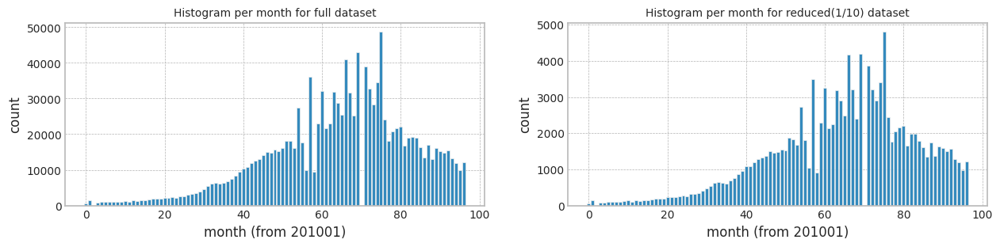

In [187]:
fig, ax = plt.subplots(figsize=main_figsize, nrows=1, ncols=2)
ax[0].bar(b_cnt.index,b_cnt.values)
ax[0].set_ylabel('count')
ax[0].set_xlabel('month (from 201001)')
ax[0].set_title(f'Histogram per month for full dataset',fontdict={'fontsize':10})

ax[1].bar(b_cnt2.index,b_cnt2.values)
ax[1].set_ylabel('count')
ax[1].set_xlabel('month (from 201001)')
ax[1].set_title(f'Histogram per month for reduced(1/10) dataset',fontdict={'fontsize':10})

plt.show()

In [188]:
X3.drop(columns=['issue_d'],inplace=True)

In [189]:
X3

,loan_amnt,term,int_rate,annual_inc,dti,delinq_2yrs,fico_range_high,inq_last_6mths,open_acc,pub_rec,...,small_business,vacation,wedding,MORTGAGE,OTHER,OWN,RENT,DirectPay,Y,b
8,9000.0,36,8.94,44000.0,8.97,0.0,749.0,1.0,14.0,0.0,...,0,0,0,0,0,0,1,0,0,0
19,21125.0,36,13.92,87000.0,18.33,0.0,704.0,1.0,9.0,0.0,...,0,0,0,1,0,0,0,0,0,0
41,24250.0,36,12.53,287000.0,13.89,0.0,729.0,2.0,15.0,0.0,...,0,0,0,0,0,0,1,0,0,0
43,5000.0,36,13.92,38000.0,5.68,0.0,689.0,1.0,5.0,0.0,...,0,0,0,0,0,0,1,0,0,0
52,13000.0,36,8.59,100000.0,18.35,0.0,784.0,2.0,18.0,0.0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1279596,8000.0,36,7.35,27000.0,22.36,0.0,719.0,0.0,14.0,0.0,...,0,0,0,0,0,0,1,0,0,96
1279609,29375.0,60,30.75,90000.0,44.94,0.0,689.0,1.0,20.0,0.0,...,0,0,0,0,0,0,1,0,0,96
1279627,2500.0,36,10.42,48000.0,25.23,0.0,794.0,1.0,9.0,0.0,...,0,0,0,0,0,0,1,0,0,96
1279639,18500.0,36,13.59,45000.0,35.71,1.0,709.0,0.0,14.0,0.0,...,0,0,0,1,0,0,0,0,0,96


#### Drift tolerant 학습

In [190]:
from more_itertools import locate
def find_indices(list_to_check, item_to_find):
    indices = locate(list_to_check, lambda x: x == item_to_find)
    return list(indices)

In [191]:
from tqdm import tqdm
from sklearn.preprocessing import MinMaxScaler, StandardScaler

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

def check_mi_drift(X:pd.DataFrame,Y:np.array,train_size:int,test_size:int):

    columns = X.columns
    is_Has_bucket = False
    # 'b' 즉, bucket count 가 있으며, 'b'를 제외 시킨다.
    if 'b' in columns:
        print('Dataset has buckets!')
        columns = columns[0:-1]
        buckets = list(X['b'])
        X = X[columns]
        is_Has_bucket = True

    mi_scores = make_mi_scores(X, Y, discrete_features="auto")
    #print(mi_scores)
    print(f'MI Analysis MI Max {np.max(mi_scores):.5f}, Min {np.min(mi_scores):.5f}, Mean {np.mean(mi_scores):.5f}, Std {np.std(mi_scores):.5f}')

    scaler_c1 = MinMaxScaler()
    # trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
    X = pd.DataFrame(np.concatenate((scaler_c1.fit_transform(X[0:train_size]), scaler_c1.transform(X[train_size:])),axis=0), columns=columns)

    X_train = X[:train_size]
    Y_train = Y[:train_size]

    X_test = X[test_size:train_size+test_size]
    Y_test = Y[test_size:train_size+test_size]

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    print('Dataset structure X_train,',X_train.shape,'X_test,',X_test.shape,'X_live',X_live.shape)
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    if is_Has_bucket:
        b_min = min(buckets[-X_live.shape[0]:])
        b_max = max(buckets[-X_live.shape[0]:])
        print(f'bucket range in live set {b_min}~{b_max}')
        for i in range(b_min,b_max+1):
            s = find_indices(buckets,i)
            if len(s) > 0:
                xl = X.iloc[s]
                yl = Y[s]
                X_live_set.append(xl)
                Y_live_set.append(yl)
    else:
        for i in range(int(X_live.shape[0]/test_size)):
            xl = X_live[i*test_size:i*test_size+train_size]
            yl = Y_live[i*test_size:i*test_size+train_size]

            if len(xl) ==  train_size:
                X_live_set.append(xl)
                Y_live_set.append(yl)
            else:
                #print(xl.shape)
                truncate_count = xl.shape[0] #truncate_count + len(xl)
                break

    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = np.asarray(X_live_set)
    Y_live_set = np.asarray(Y_live_set)

    MIS = {}
    DRF = {}
    for col in columns:
        MIS[col] = []
        DRF[col] = []

    print('Search MI & Drift...for X_live_set',X_live_set.shape)
    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        X_live_unit = pd.DataFrame(X_live_unit,columns = columns)
        mi_scores = make_mi_scores(X_live_unit, Y_live_unit, discrete_features="auto")
        ks = __ks_drift(X_train.values,X_live_unit.values)
        for ix,col in enumerate(columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)

    for c_name in df_mis.columns:
        fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
        df_mis[c_name].plot(ax=ax[0],linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',legend=None)
        ax[0].set_title(f'Mutual Information of {c_name}',fontdict={'fontsize':10})

        df_drf[c_name].plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})')
        ax[1].set_title(f'Drift (KS-test) of {c_name}',fontdict={'fontsize':10})
        ax[1].legend(bbox_to_anchor=(1.0, 1.0))
        plt.show()

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    df_mis.plot(ax=ax[0],linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',legend=None)
    ax[0].set_title(f'Mutual Information',fontdict={'fontsize':10})

    df_drf.plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})')
    ax[1].set_title(f'Drift (KS-test)',fontdict={'fontsize':10})
    ax[1].legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    if is_Has_bucket:
        X['b'] = buckets
    return X,Y

train_size 19361
Dataset has buckets!
MI Analysis MI Max 0.28519, Min 0.01947, Mean 0.17442, Std 0.12009
Dataset structure X_train, (19361, 5) X_test, (19361, 5) X_live (123968, 5)
bucket range in live set 26~96
Truncate 0 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set (70,)


100%|██████████| 70/70 [00:03<00:00, 22.85it/s]


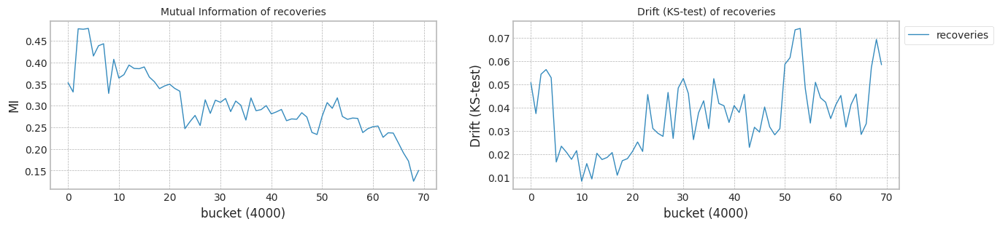

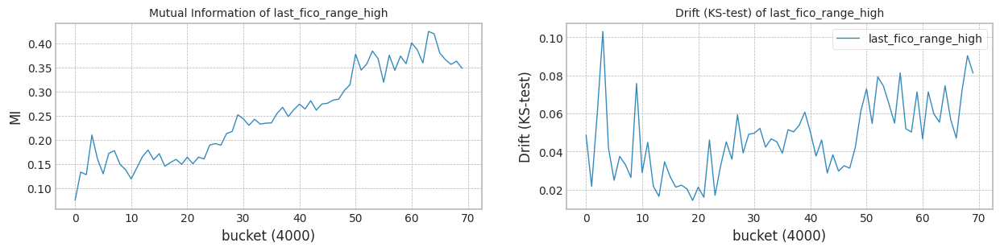

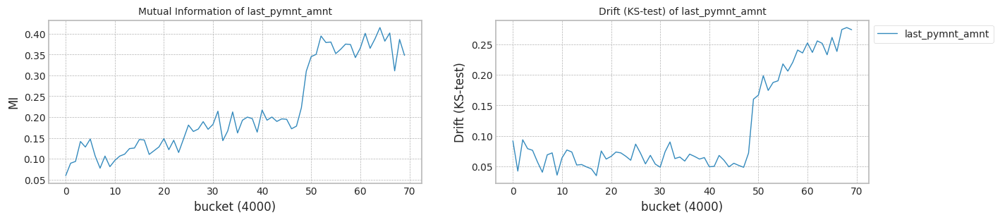

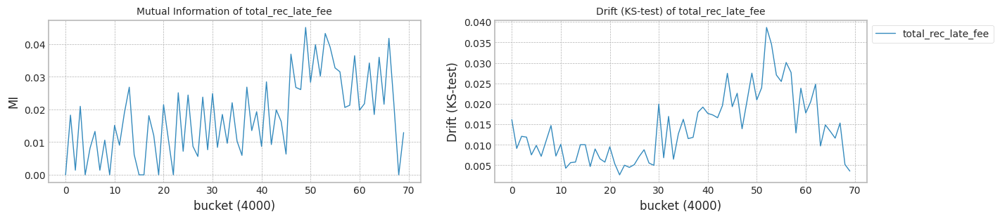

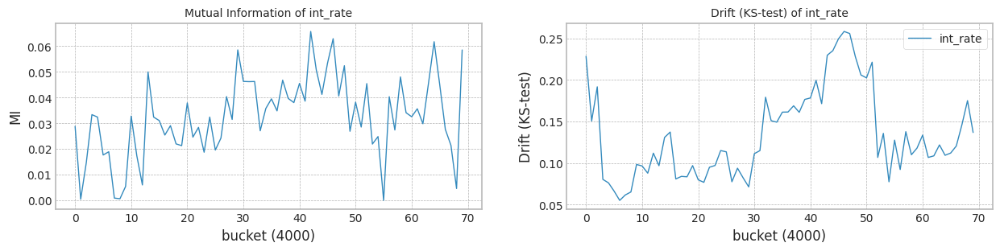

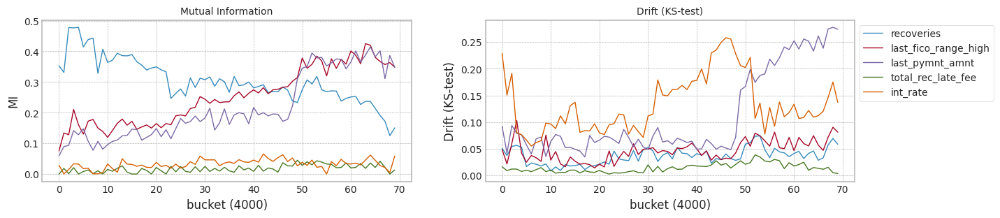

In [192]:
top_columns = list(mi_scores[0:5].index)
top_columns

train_size = X3[X3['b'] < 46].shape[0] # 2010년 1월에서 39개월 (약 3년6개월간의 data)
print('train_size',train_size)
test_size = 4000

X1,Y1 = check_mi_drift(X3[top_columns+['b']], Y3, train_size, test_size)

trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 606.97it/s]


Test f1 score: 0.9315611184474939
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9115340040966659
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 219.42it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.56it/s]


mean of drift:
recoveries              0.840451
last_fico_range_high    0.128217
last_pymnt_amnt         0.457818
total_rec_late_fee      0.917750
int_rate                0.150396
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model mean        : 0.9115340040966659
Drift tolerant model mean: 0.8863519677174436
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 625.73it/s]


Test f1 score: 0.9149169407201282
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.52it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8886184249459659
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 224.44it/s]


Test f1 score: 0.9736448933245683
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.51it/s]


mean of drift:
recoveries              0.860433
last_fico_range_high    0.223364
last_pymnt_amnt         0.446794
total_rec_late_fee      0.966117
int_rate                0.147731
dtype: float64
Mean F1 for all data: 0.9604644642048572
Normal model mean        : 0.9000762145213159
Drift tolerant model mean: 0.9234082159611504
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 618.48it/s]


Test f1 score: 0.9479673842904911
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.49it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9373019960239893
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 226.52it/s]


Test f1 score: 0.973641742872512
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.55it/s]


mean of drift:
recoveries              0.861302
last_fico_range_high    0.083409
last_pymnt_amnt         0.090895
total_rec_late_fee      0.920139
int_rate                0.145768
dtype: float64
Mean F1 for all data: 0.9604239121608069
Normal model mean        : 0.9124848083555404
Drift tolerant model mean: 0.935746781361036
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 625.04it/s]


Test f1 score: 0.929940685979541
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.53it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9092146159188006
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 233.78it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.56it/s]


mean of drift:
recoveries              0.830983
last_fico_range_high    0.222932
last_pymnt_amnt         0.448123
total_rec_late_fee      0.966117
int_rate                0.144408
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model mean        : 0.9116672602463554
Drift tolerant model mean: 0.9233980779501378
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.08it/s]


Test f1 score: 0.9436553860541235
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.52it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9315481678177596
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.04it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.58it/s]


mean of drift:
recoveries              0.879456
last_fico_range_high    0.119182
last_pymnt_amnt         0.441091
total_rec_late_fee      0.913224
int_rate                0.148940
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model mean        : 0.9156434417606363
Drift tolerant model mean: 0.9159888559035989
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 615.52it/s]


Test f1 score: 0.9365424160801692
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.54it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9198724335082643
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.44it/s]


Test f1 score: 0.9725647072872198
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.55it/s]


mean of drift:
recoveries              0.860864
last_fico_range_high    0.237924
last_pymnt_amnt         0.449531
total_rec_late_fee      0.926217
int_rate                0.147054
dtype: float64
Mean F1 for all data: 0.9591975034401207
Normal model mean        : 0.9163482737185743
Drift tolerant model mean: 0.9231902971596858
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 622.54it/s]


Test f1 score: 0.9139202872128572
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.53it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8864040052053528
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.86it/s]


Test f1 score: 0.9726726995788909
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.52it/s]


mean of drift:
recoveries              0.825208
last_fico_range_high    0.174943
last_pymnt_amnt         0.449577
total_rec_late_fee      0.923617
int_rate                0.144617
dtype: float64
Mean F1 for all data: 0.9604930902019272
Normal model mean        : 0.9120705210738284
Drift tolerant model mean: 0.9285192675942918
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 629.77it/s]


Test f1 score: 0.9305260742355573
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.49it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9097677221480565
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.09it/s]


Test f1 score: 0.9735677550532233
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.51it/s]


mean of drift:
recoveries              0.860535
last_fico_range_high    0.139947
last_pymnt_amnt         0.449743
total_rec_late_fee      0.919188
int_rate                0.137579
dtype: float64
Mean F1 for all data: 0.9606608334733943
Normal model mean        : 0.911782671208107
Drift tolerant model mean: 0.9325369633291796
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 638.48it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.54it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8863519677174436
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.64it/s]


Test f1 score: 0.9736189537211317
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.57it/s]


mean of drift:
recoveries              0.839111
last_fico_range_high    0.060544
last_pymnt_amnt         0.103739
total_rec_late_fee      0.966093
int_rate                0.149057
dtype: float64
Mean F1 for all data: 0.9654304387817234
Normal model mean        : 0.9089570374869221
Drift tolerant model mean: 0.9361917939350177
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 621.38it/s]


Test f1 score: 0.9341893136803316
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.51it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9161468347742108
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.23it/s]


Test f1 score: 0.9732070850383822
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.51it/s]


mean of drift:
recoveries              0.860581
last_fico_range_high    0.138025
last_pymnt_amnt         0.444056
total_rec_late_fee      0.966117
int_rate                0.148598
dtype: float64
Mean F1 for all data: 0.9602635874965585
Normal model mean        : 0.909676017215651
Drift tolerant model mean: 0.9385989732911719
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 611.57it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.44it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8863519677174436
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 222.45it/s]


Test f1 score: 0.9739879208276027
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.49it/s]


mean of drift:
recoveries              0.860292
last_fico_range_high    0.129171
last_pymnt_amnt         0.458960
total_rec_late_fee      0.909664
int_rate                0.147134
dtype: float64
Mean F1 for all data: 0.9604364899892375
Normal model mean        : 0.9075556490794502
Drift tolerant model mean: 0.9405842020819052
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 607.48it/s]


Test f1 score: 0.9384727272727272
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.40it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9232970825838207
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 220.78it/s]


Test f1 score: 0.9729002957961098
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.36it/s]


mean of drift:
recoveries              0.860891
last_fico_range_high    0.180483
last_pymnt_amnt         0.447907
total_rec_late_fee      0.911521
int_rate                0.149872
dtype: float64
Mean F1 for all data: 0.960473382598024
Normal model mean        : 0.9088674352048144
Drift tolerant model mean: 0.9422416337915819
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 607.29it/s]


Test f1 score: 0.9384512799698489
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.39it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9236456501804697
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 218.36it/s]


Test f1 score: 0.973121490861307
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.42it/s]


mean of drift:
recoveries              0.860881
last_fico_range_high    0.202207
last_pymnt_amnt         0.451482
total_rec_late_fee      0.918500
int_rate                0.150396
dtype: float64
Mean F1 for all data: 0.9602176176759198
Normal model mean        : 0.9100042209721726
Drift tolerant model mean: 0.9436244017826847
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 609.42it/s]


Test f1 score: 0.917968970380818
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.38it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8931200994189447
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 218.19it/s]


Test f1 score: 0.9732377538829151
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.860688
last_fico_range_high    0.145709
last_pymnt_amnt         0.443608
total_rec_late_fee      0.966117
int_rate                0.147731
dtype: float64
Mean F1 for all data: 0.9603815404524894
Normal model mean        : 0.9087982122897991
Drift tolerant model mean: 0.9448213402590994
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 617.39it/s]


Test f1 score: 0.9172563502579572
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.47it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8923747009005883
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 225.97it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.50it/s]


mean of drift:
recoveries              0.860919
last_fico_range_high    0.151991
last_pymnt_amnt         0.463274
total_rec_late_fee      0.913779
int_rate                0.143854
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model mean        : 0.9077033115305183
Drift tolerant model mean: 0.9409233820896556
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 609.22it/s]


Test f1 score: 0.9429746521599627
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.50it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9299428898111048
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.28it/s]


Test f1 score: 0.9732118859190683
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.55it/s]


mean of drift:
recoveries              0.823196
last_fico_range_high    0.101076
last_pymnt_amnt         0.447048
total_rec_late_fee      0.966117
int_rate                0.145657
dtype: float64
Mean F1 for all data: 0.9602619431729166
Normal model mean        : 0.9090932851730551
Drift tolerant model mean: 0.9421320421573594
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 631.11it/s]


Test f1 score: 0.9375380776929995
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.49it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9221737411901783
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.80it/s]


Test f1 score: 0.9734122005138317
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.52it/s]


mean of drift:
recoveries              0.843463
last_fico_range_high    0.147201
last_pymnt_amnt         0.453009
total_rec_late_fee      0.919512
int_rate                0.145728
dtype: float64
Mean F1 for all data: 0.9605796575942279
Normal model mean        : 0.9098627237622976
Drift tolerant model mean: 0.9432171960065868
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.42it/s]


Test f1 score: 0.9355006351772721
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.51it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9174538788626201
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.03it/s]


Test f1 score: 0.9659650163059591
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.53it/s]


mean of drift:
recoveries              0.860433
last_fico_range_high    0.123480
last_pymnt_amnt         0.445066
total_rec_late_fee      0.915112
int_rate                0.149277
dtype: float64
Mean F1 for all data: 0.9414921448800284
Normal model mean        : 0.9102844546012044
Drift tolerant model mean: 0.9431213598328893
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 628.54it/s]


Test f1 score: 0.9221040691904154
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8986969130456073
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 226.29it/s]


Test f1 score: 0.9728277097641088
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.48it/s]


mean of drift:
recoveries              0.861000
last_fico_range_high    0.168927
last_pymnt_amnt         0.456075
total_rec_late_fee      0.966117
int_rate                0.148485
dtype: float64
Mean F1 for all data: 0.959918115268845
Normal model mean        : 0.9096745839930152
Drift tolerant model mean: 0.9440053995926764
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 623.08it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.47it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8863519677174436
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 225.99it/s]


Test f1 score: 0.9730262568330497
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.50it/s]


mean of drift:
recoveries              0.874689
last_fico_range_high    0.144018
last_pymnt_amnt         0.457303
total_rec_late_fee      0.966117
int_rate                0.147042
dtype: float64
Mean F1 for all data: 0.9651820363489622
Normal model mean        : 0.9085084531792367
Drift tolerant model mean: 0.9450642314304908


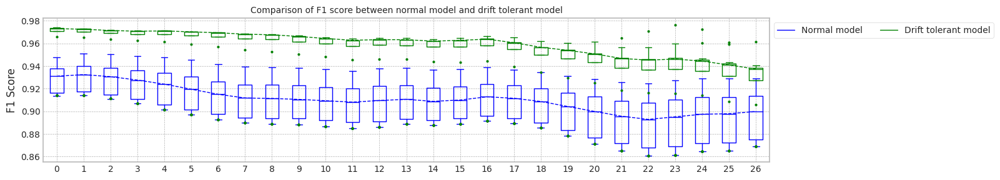

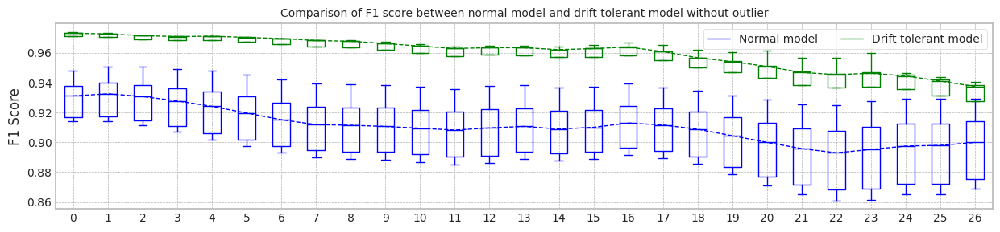

max_mean_trial= 8


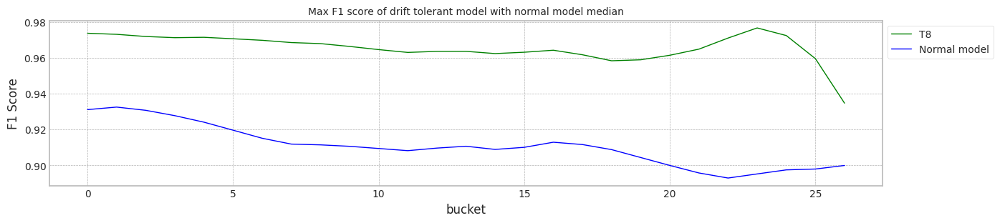

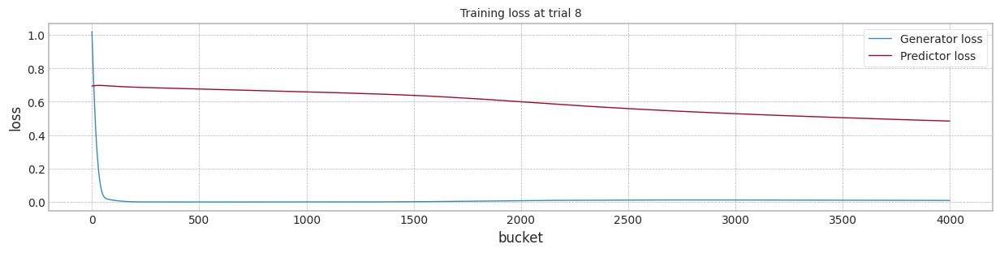

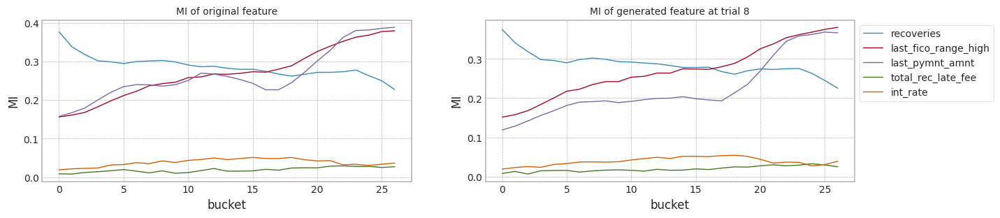

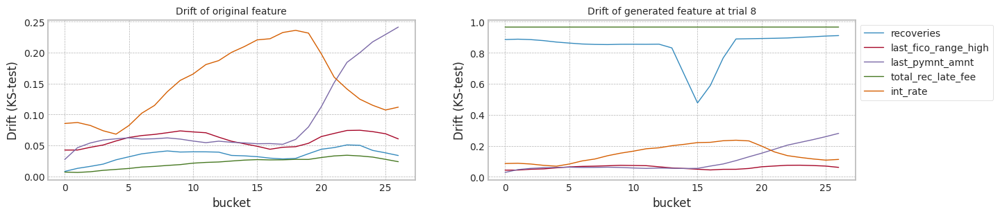

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.931561,0.931561,0.911534,0.901259
1,1.0,0.914917,0.914917,0.888618,0.871554
2,2.0,0.947967,0.947967,0.937302,0.929225
3,3.0,0.929941,0.929941,0.909215,0.897891
4,4.0,0.943655,0.943655,0.931548,0.924324
5,5.0,0.936542,0.936542,0.919872,0.910125
6,6.0,0.913920,0.913920,0.886404,0.869075
7,7.0,0.930526,0.930526,0.909768,0.898559
8,8.0,0.913981,0.913981,0.886352,0.868803
9,9.0,0.934189,0.934189,0.916147,0.906747


,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.913981,0.913981,0.886352,0.868803
1,1.0,0.973645,0.973645,0.960464,0.937904
2,2.0,0.973642,0.973642,0.960424,0.937431
3,3.0,0.913981,0.913981,0.886352,0.868803
4,4.0,0.913981,0.913981,0.886352,0.868803
5,5.0,0.972565,0.972565,0.959198,0.935161
6,6.0,0.972673,0.972673,0.960493,0.940510
7,7.0,0.973568,0.973568,0.960661,0.938433
8,8.0,0.973619,0.973619,0.965430,0.934651
9,9.0,0.973207,0.973207,0.960264,0.937752


In [193]:
_,_,_,_,_,_ = drift_tolerant(X1, Y1,train_size, test_size,avaible_range = 600,trial_count=20)

trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 589.86it/s]


Test f1 score: 0.9315611184474939
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9115340040966659
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 219.86it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.52it/s]


mean of drift:
recoveries              0.840451
last_fico_range_high    0.128217
last_pymnt_amnt         0.457818
total_rec_late_fee      0.917750
int_rate                0.150396
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model mean        : 0.9115340040966659
Drift tolerant model mean: 0.8863519677174436
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 614.70it/s]


Test f1 score: 0.9149169407201282
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.51it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8886184249459659
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 223.04it/s]


Test f1 score: 0.9736448933245683
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.49it/s]


mean of drift:
recoveries              0.860433
last_fico_range_high    0.223364
last_pymnt_amnt         0.446794
total_rec_late_fee      0.966117
int_rate                0.147731
dtype: float64
Mean F1 for all data: 0.9604644642048572
Normal model mean        : 0.9000762145213159
Drift tolerant model mean: 0.9234082159611504
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 603.52it/s]


Test f1 score: 0.9479673842904911
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9373019960239893
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 224.38it/s]


Test f1 score: 0.973641742872512
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.52it/s]


mean of drift:
recoveries              0.861302
last_fico_range_high    0.083409
last_pymnt_amnt         0.090895
total_rec_late_fee      0.920139
int_rate                0.145768
dtype: float64
Mean F1 for all data: 0.9604239121608069
Normal model mean        : 0.9124848083555404
Drift tolerant model mean: 0.935746781361036
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 622.74it/s]


Test f1 score: 0.929940685979541
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.50it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9092146159188006
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.04it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.55it/s]


mean of drift:
recoveries              0.830983
last_fico_range_high    0.222932
last_pymnt_amnt         0.448123
total_rec_late_fee      0.966117
int_rate                0.144408
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model mean        : 0.9116672602463554
Drift tolerant model mean: 0.9233980779501378
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 615.36it/s]


Test f1 score: 0.9436553860541235
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.48it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9315481678177596
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.72it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.53it/s]


mean of drift:
recoveries              0.879456
last_fico_range_high    0.119182
last_pymnt_amnt         0.441091
total_rec_late_fee      0.913224
int_rate                0.148940
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model mean        : 0.9156434417606363
Drift tolerant model mean: 0.9159888559035989
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 622.41it/s]


Test f1 score: 0.9365424160801692
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.48it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9198724335082643
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.90it/s]


Test f1 score: 0.9725647072872198
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.54it/s]


mean of drift:
recoveries              0.860864
last_fico_range_high    0.237924
last_pymnt_amnt         0.449531
total_rec_late_fee      0.926217
int_rate                0.147054
dtype: float64
Mean F1 for all data: 0.9591975034401207
Normal model mean        : 0.9163482737185743
Drift tolerant model mean: 0.9231902971596858
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 622.02it/s]


Test f1 score: 0.9139202872128572
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.44it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8864040052053528
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.73it/s]


Test f1 score: 0.9726726995788909
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.50it/s]


mean of drift:
recoveries              0.825208
last_fico_range_high    0.174943
last_pymnt_amnt         0.449577
total_rec_late_fee      0.923617
int_rate                0.144617
dtype: float64
Mean F1 for all data: 0.9604930902019272
Normal model mean        : 0.9120705210738284
Drift tolerant model mean: 0.9285192675942918
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 625.48it/s]


Test f1 score: 0.9305260742355573
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.50it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9097677221480565
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.72it/s]


Test f1 score: 0.9735677550532233
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.53it/s]


mean of drift:
recoveries              0.860535
last_fico_range_high    0.139947
last_pymnt_amnt         0.449743
total_rec_late_fee      0.919188
int_rate                0.137579
dtype: float64
Mean F1 for all data: 0.9606608334733943
Normal model mean        : 0.911782671208107
Drift tolerant model mean: 0.9325369633291796
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 620.93it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.48it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8863519677174436
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 222.83it/s]


Test f1 score: 0.9736189537211317
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.49it/s]


mean of drift:
recoveries              0.839111
last_fico_range_high    0.060544
last_pymnt_amnt         0.103739
total_rec_late_fee      0.966093
int_rate                0.149057
dtype: float64
Mean F1 for all data: 0.9654304387817234
Normal model mean        : 0.9089570374869221
Drift tolerant model mean: 0.9361917939350177
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 615.66it/s]


Test f1 score: 0.9341893136803316
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.48it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9161468347742108
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.96it/s]


Test f1 score: 0.9732070850383822
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.51it/s]


mean of drift:
recoveries              0.860581
last_fico_range_high    0.138025
last_pymnt_amnt         0.444056
total_rec_late_fee      0.966117
int_rate                0.148598
dtype: float64
Mean F1 for all data: 0.9602635874965585
Normal model mean        : 0.909676017215651
Drift tolerant model mean: 0.9385989732911719
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 611.32it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.49it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8863519677174436
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 226.89it/s]


Test f1 score: 0.9739879208276027
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.52it/s]


mean of drift:
recoveries              0.860292
last_fico_range_high    0.129171
last_pymnt_amnt         0.458960
total_rec_late_fee      0.909664
int_rate                0.147134
dtype: float64
Mean F1 for all data: 0.9604364899892375
Normal model mean        : 0.9075556490794502
Drift tolerant model mean: 0.9405842020819052
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 628.98it/s]


Test f1 score: 0.9384727272727272
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.50it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9232970825838207
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.43it/s]


Test f1 score: 0.9729002957961098
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.52it/s]


mean of drift:
recoveries              0.860891
last_fico_range_high    0.180483
last_pymnt_amnt         0.447907
total_rec_late_fee      0.911521
int_rate                0.149872
dtype: float64
Mean F1 for all data: 0.960473382598024
Normal model mean        : 0.9088674352048144
Drift tolerant model mean: 0.9422416337915819
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 616.64it/s]


Test f1 score: 0.9384512799698489
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9236456501804697
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.37it/s]


Test f1 score: 0.973121490861307
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.54it/s]


mean of drift:
recoveries              0.860881
last_fico_range_high    0.202207
last_pymnt_amnt         0.451482
total_rec_late_fee      0.918500
int_rate                0.150396
dtype: float64
Mean F1 for all data: 0.9602176176759198
Normal model mean        : 0.9100042209721726
Drift tolerant model mean: 0.9436244017826847
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 625.74it/s]


Test f1 score: 0.917968970380818
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.49it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8931200994189447
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.53it/s]


Test f1 score: 0.9732377538829151
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.860688
last_fico_range_high    0.145709
last_pymnt_amnt         0.443608
total_rec_late_fee      0.966117
int_rate                0.147731
dtype: float64
Mean F1 for all data: 0.9603815404524894
Normal model mean        : 0.9087982122897991
Drift tolerant model mean: 0.9448213402590994
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 612.50it/s]


Test f1 score: 0.9172563502579572
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.43it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8923747009005883
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 224.35it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.40it/s]


mean of drift:
recoveries              0.860919
last_fico_range_high    0.151991
last_pymnt_amnt         0.463274
total_rec_late_fee      0.913779
int_rate                0.143854
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model mean        : 0.9077033115305183
Drift tolerant model mean: 0.9409233820896556
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 593.41it/s]


Test f1 score: 0.9429746521599627
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.33it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9299428898111048
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 223.76it/s]


Test f1 score: 0.9732118859190683
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.48it/s]


mean of drift:
recoveries              0.823196
last_fico_range_high    0.101076
last_pymnt_amnt         0.447048
total_rec_late_fee      0.966117
int_rate                0.145657
dtype: float64
Mean F1 for all data: 0.9602619431729166
Normal model mean        : 0.9090932851730551
Drift tolerant model mean: 0.9421320421573594
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 615.21it/s]


Test f1 score: 0.9375380776929995
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9221737411901783
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.70it/s]


Test f1 score: 0.9734122005138317
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.53it/s]


mean of drift:
recoveries              0.843463
last_fico_range_high    0.147201
last_pymnt_amnt         0.453009
total_rec_late_fee      0.919512
int_rate                0.145728
dtype: float64
Mean F1 for all data: 0.9605796575942279
Normal model mean        : 0.9098627237622976
Drift tolerant model mean: 0.9432171960065868
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 617.78it/s]


Test f1 score: 0.9355006351772721
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.49it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9174538788626201
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.17it/s]


Test f1 score: 0.9659650163059591
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.50it/s]


mean of drift:
recoveries              0.860433
last_fico_range_high    0.123480
last_pymnt_amnt         0.445066
total_rec_late_fee      0.915112
int_rate                0.149277
dtype: float64
Mean F1 for all data: 0.9414921448800284
Normal model mean        : 0.9102844546012044
Drift tolerant model mean: 0.9431213598328893
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 622.26it/s]


Test f1 score: 0.9221040691904154
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.50it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8986969130456073
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.07it/s]


Test f1 score: 0.9728277097641088
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.52it/s]


mean of drift:
recoveries              0.861000
last_fico_range_high    0.168927
last_pymnt_amnt         0.456075
total_rec_late_fee      0.966117
int_rate                0.148485
dtype: float64
Mean F1 for all data: 0.959918115268845
Normal model mean        : 0.9096745839930152
Drift tolerant model mean: 0.9440053995926764
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 625.59it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8863519677174436
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 225.50it/s]


Test f1 score: 0.9730262568330497
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.47it/s]


mean of drift:
recoveries              0.874689
last_fico_range_high    0.144018
last_pymnt_amnt         0.457303
total_rec_late_fee      0.966117
int_rate                0.147042
dtype: float64
Mean F1 for all data: 0.9651820363489622
Normal model mean        : 0.9085084531792367
Drift tolerant model mean: 0.9450642314304908
######################### Trial 0 for Normal model ###########################
retrain_interval: 14
######################### Trial 0 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.32it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9237450906016877
SEA mean: 0.9237450906016877
######################### Trial 0 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:12<00:00,  2.23it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.937848459594231
DTEL mean: 0.937848459594231
######################### Trial 1 for Normal model ###########################
retrain_interval: 14
######################### Trial 1 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.33it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8962202735362129
SEA mean: 0.9099826820689503
######################### Trial 1 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:12<00:00,  2.23it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9243954137211746
DTEL mean: 0.9311219366577028
######################### Trial 2 for Normal model ###########################
retrain_interval: 14
######################### Trial 2 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.35it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9254278703035818
SEA mean: 0.9151310781471608
######################### Trial 2 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.28it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9529199786644547
DTEL mean: 0.9383879506599534
######################### Trial 3 for Normal model ###########################
retrain_interval: 14
######################### Trial 3 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.38it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9076519982934858
SEA mean: 0.913261308183742
######################### Trial 3 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.29it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9390088575472646
DTEL mean: 0.9385431773817812
######################### Trial 4 for Normal model ###########################
retrain_interval: 14
######################### Trial 4 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.37it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9303230796289179
SEA mean: 0.9166736624727772
######################### Trial 4 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.27it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.950670031103206
DTEL mean: 0.9409685481260661
######################### Trial 5 for Normal model ###########################
retrain_interval: 14
######################### Trial 5 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.35it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9295991624116745
SEA mean: 0.9188279124625934
######################### Trial 5 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.27it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9436112068772721
DTEL mean: 0.9414089912512672
######################### Trial 6 for Normal model ###########################
retrain_interval: 14
######################### Trial 6 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.37it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9028432965860199
SEA mean: 0.9165443959087972
######################### Trial 6 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:12<00:00,  2.24it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9231319192760971
DTEL mean: 0.9387979809690999
######################### Trial 7 for Normal model ###########################
retrain_interval: 14
######################### Trial 7 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.35it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.915765649116897
SEA mean: 0.9164470525598096
######################### Trial 7 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:12<00:00,  2.23it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9392325455124265
DTEL mean: 0.9388523015370158
######################### Trial 8 for Normal model ###########################
retrain_interval: 14
######################### Trial 8 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.33it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9056698737560225
SEA mean: 0.9152495882482776
######################### Trial 8 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.31it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9311511663920046
DTEL mean: 0.9379966198542368
######################### Trial 9 for Normal model ###########################
retrain_interval: 14
######################### Trial 9 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9269987757382799
SEA mean: 0.9164245069972778
######################### Trial 9 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.32it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9403974978390373
DTEL mean: 0.9382367076527167
######################### Trial 10 for Normal model ###########################
retrain_interval: 14
######################### Trial 10 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.42it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9027563222532848
SEA mean: 0.915181944747824
######################### Trial 10 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.31it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9081191385367303
DTEL mean: 0.9354987468239906
######################### Trial 11 for Normal model ###########################
retrain_interval: 14
######################### Trial 11 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.44it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9208672485340125
SEA mean: 0.9156557200633397
######################### Trial 11 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.29it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9454762096283909
DTEL mean: 0.9363302020576906
######################### Trial 12 for Normal model ###########################
retrain_interval: 14
######################### Trial 12 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.38it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9284014821485443
SEA mean: 0.9166361633006631
######################### Trial 12 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.30it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9460445882718881
DTEL mean: 0.9370774625357059
######################### Trial 13 for Normal model ###########################
retrain_interval: 14
######################### Trial 13 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9080361233456261
SEA mean: 0.9160218747324462
######################### Trial 13 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.33it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9259754436958628
DTEL mean: 0.9362844611900029
######################### Trial 14 for Normal model ###########################
retrain_interval: 14
######################### Trial 14 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.43it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9080045487031975
SEA mean: 0.9154873863304963
######################### Trial 14 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.33it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9292120976045607
DTEL mean: 0.9358129702843067
######################### Trial 15 for Normal model ###########################
retrain_interval: 14
######################### Trial 15 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9343347481042701
SEA mean: 0.9166653464413572
######################### Trial 15 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.32it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9506633320976374
DTEL mean: 0.9367411178976399
######################### Trial 16 for Normal model ###########################
retrain_interval: 14
######################### Trial 16 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.43it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9263997235193159
SEA mean: 0.9172379568577077
######################### Trial 16 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.34it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9452295734524472
DTEL mean: 0.9372404388126286
######################### Trial 17 for Normal model ###########################
retrain_interval: 14
######################### Trial 17 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.43it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9099033037577691
SEA mean: 0.9168304761299334
######################### Trial 17 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.34it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.940646699028541
DTEL mean: 0.9374296754912904
######################### Trial 18 for Normal model ###########################
retrain_interval: 14
######################### Trial 18 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.44it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9043509298077483
SEA mean: 0.91617365790245
######################### Trial 18 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.31it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9302473082688267
DTEL mean: 0.9370516561637923
######################### Trial 19 for Normal model ###########################
retrain_interval: 14
######################### Trial 19 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.42it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9092002861390723
SEA mean: 0.9158249893142811
######################### Trial 19 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.32it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9221769977657576
DTEL mean: 0.9363079232438904


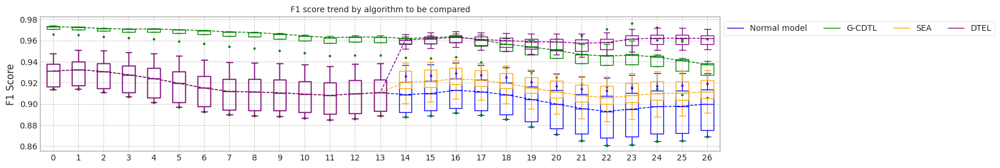

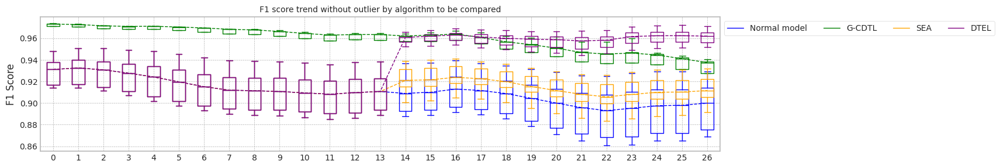

max_mean_trial= 17


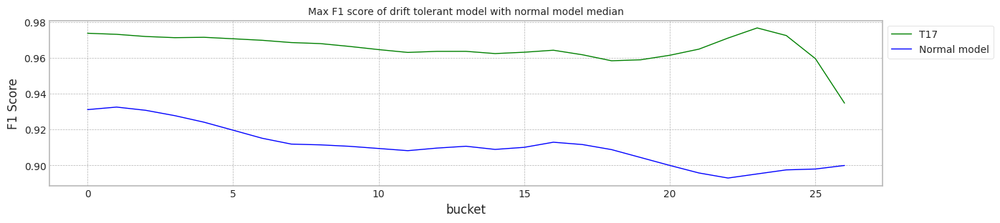

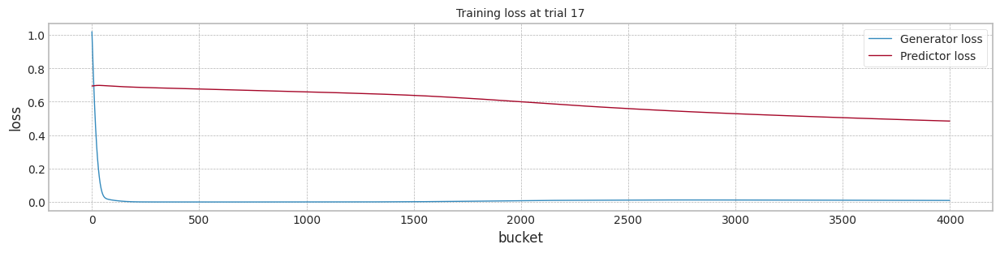

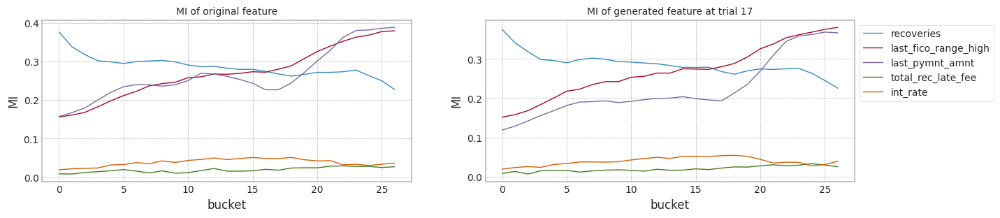

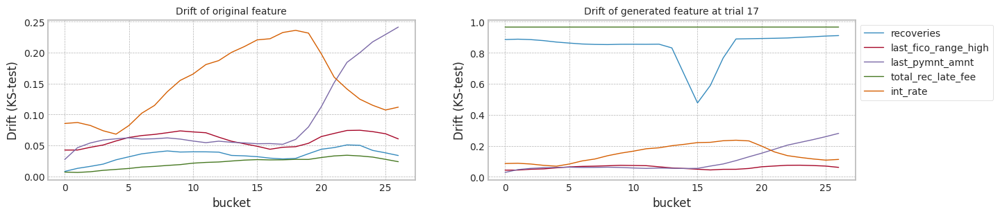

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.931561,0.932992,0.911534,0.901259
1,1.0,0.914917,0.915411,0.888618,0.871554
2,2.0,0.947967,0.950835,0.937302,0.929225
3,3.0,0.929941,0.931322,0.909215,0.897891
4,4.0,0.943655,0.946107,0.931548,0.924324
5,5.0,0.936542,0.938706,0.919872,0.910125
6,6.0,0.913920,0.914225,0.886404,0.869075
7,7.0,0.930526,0.931928,0.909768,0.898559
8,8.0,0.913981,0.914286,0.886352,0.868803
9,9.0,0.934189,0.936073,0.916147,0.906747


,Trial,test_f1,init_f1,mean_f1,last_f1
0,1.0,0.913981,0.914286,0.886352,0.868803
1,3.0,0.973645,0.972992,0.960464,0.937904
2,5.0,0.973642,0.972931,0.960424,0.937431
3,7.0,0.913981,0.914286,0.886352,0.868803
4,9.0,0.913981,0.914286,0.886352,0.868803
5,11.0,0.972565,0.972151,0.959198,0.935161
6,13.0,0.972673,0.972228,0.960493,0.940510
7,15.0,0.973568,0.972920,0.960661,0.938433
8,17.0,0.973619,0.973025,0.965430,0.934651
9,19.0,0.973207,0.972787,0.960264,0.937752


,Trial,test_f1,init_f1,mean_f1,last_f1
0,1.0,0.931561,0.932992,0.923745,0.927634
1,3.0,0.914917,0.915411,0.896220,0.891559
2,5.0,0.947967,0.950835,0.925428,0.904190
3,7.0,0.929941,0.931322,0.907652,0.894621
4,9.0,0.943655,0.946107,0.930323,0.920850
5,11.0,0.936542,0.938706,0.929599,0.931372
6,13.0,0.913920,0.914225,0.902843,0.906193
7,15.0,0.930526,0.931928,0.915766,0.910661
8,17.0,0.913981,0.914286,0.905670,0.912603
9,19.0,0.934189,0.936073,0.926999,0.930200


,Trial,test_f1,init_f1,mean_f1,last_f1
0,1.0,0.931561,0.932992,0.937848,0.959856
1,3.0,0.914917,0.915411,0.924395,0.954840
2,5.0,0.947967,0.950835,0.952920,0.964061
3,7.0,0.929941,0.931322,0.939009,0.964868
4,9.0,0.943655,0.946107,0.950670,0.967934
5,11.0,0.936542,0.938706,0.943611,0.963358
6,13.0,0.913920,0.914225,0.923132,0.954052
7,15.0,0.930526,0.931928,0.939233,0.964927
8,17.0,0.913981,0.914286,0.931151,0.970941
9,19.0,0.934189,0.936073,0.940397,0.960405


In [194]:
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 600,trial_count=20)

train_size 19361
Dataset has buckets!
MI Analysis MI Max 0.28501, Min 0.00000, Mean 0.09182, Std 0.11850
Dataset structure X_train, (19361, 10) X_test, (19361, 10) X_live (123968, 10)
bucket range in live set 26~96
Truncate 0 rows from live_set (123968, 10)
Search MI & Drift...for X_live_set (70,)


100%|██████████| 70/70 [00:05<00:00, 12.26it/s]


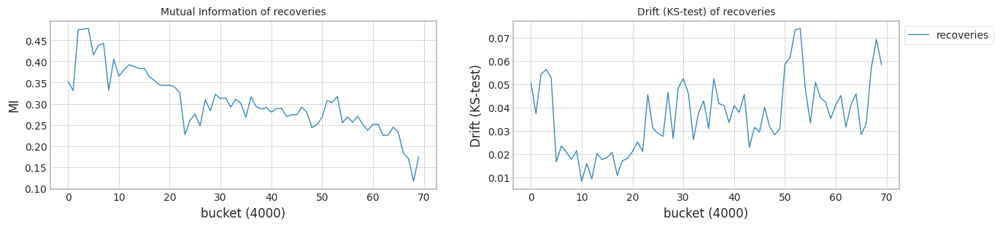

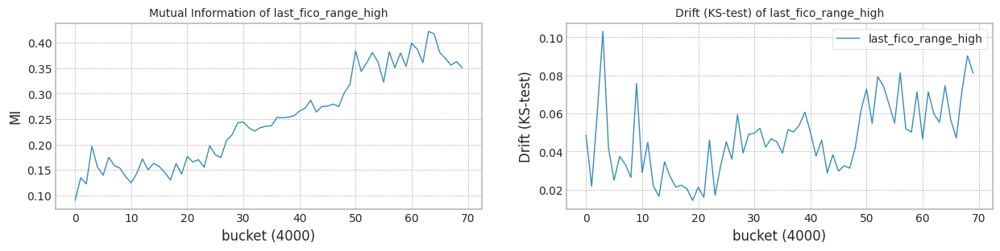

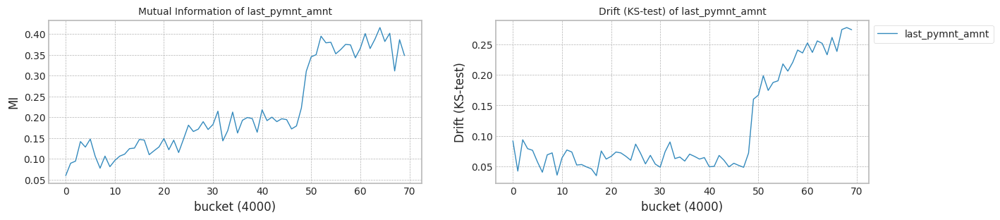

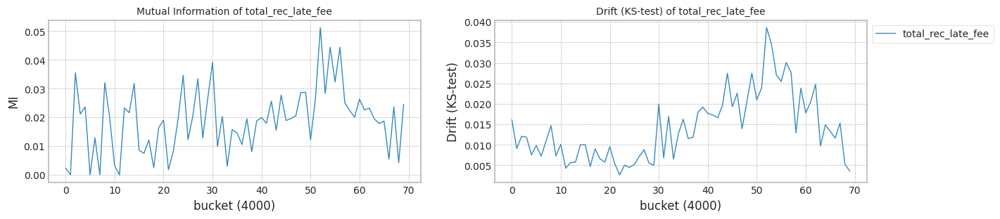

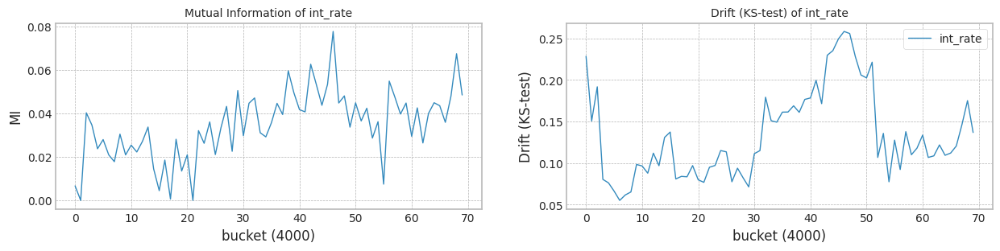

...

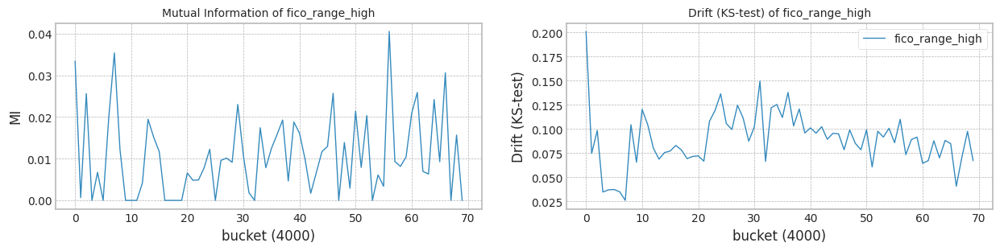

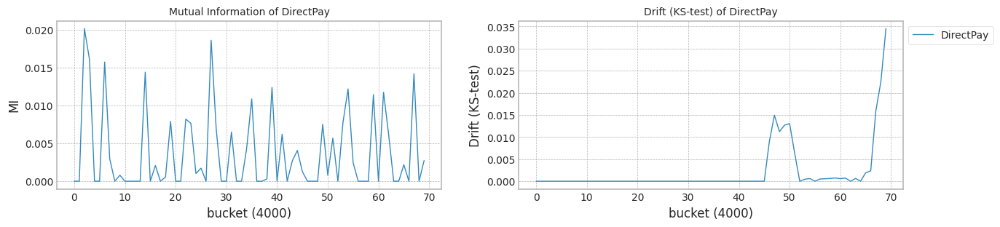

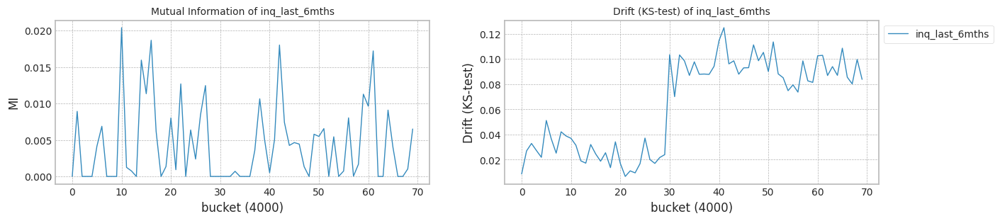

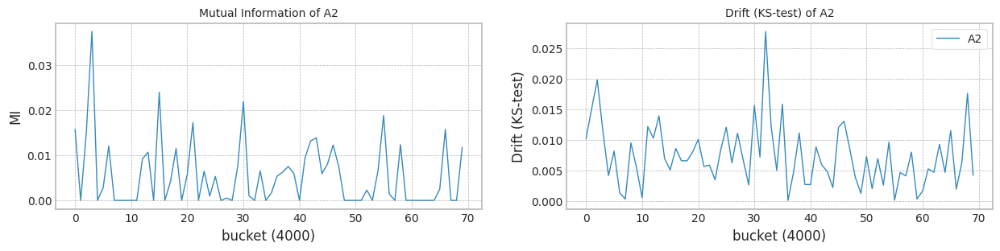

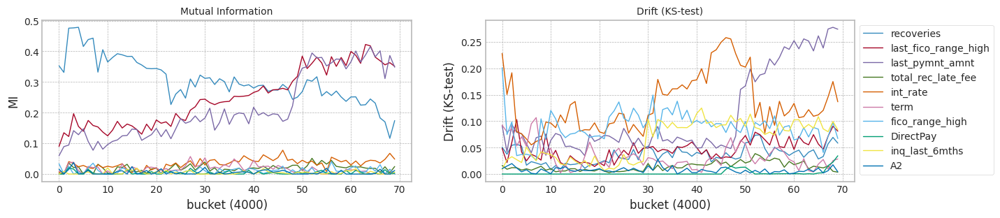

In [195]:
top_columns = list(mi_scores[0:10].index)
top_columns

train_size = X3[X3['b'] < 46].shape[0] # 2010년 1월에서 39개월 (약 3년6개월간의 data)
print('train_size',train_size)
test_size = 4000

X1,Y1 = check_mi_drift(X3[top_columns+['b']], Y3, train_size, test_size)

trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 588.10it/s]


Test f1 score: 0.9591493451880332
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.30it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9652732326634791
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 136.84it/s]


Test f1 score: 0.9798406566875906
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.30it/s]


mean of drift:
recoveries              0.904355
last_fico_range_high    0.205796
last_pymnt_amnt         0.304509
total_rec_late_fee      0.917394
int_rate                0.139934
term                    0.755281
fico_range_high         0.110950
DirectPay               1.000000
inq_last_6mths          0.506327
A2                      0.930852
dtype: float64
Mean F1 for all data: 0.9727874131675023
Normal model mean        : 0.9652732326634791
Drift tolerant model mean: 0.9727874131675023
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 606.84it/s]


Test f1 score: 0.9570027508671213
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.30it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9599139088650943
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 136.08it/s]


Test f1 score: 0.9805339601036582
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


mean of drift:
recoveries              0.876466
last_fico_range_high    0.095817
last_pymnt_amnt         0.317584
total_rec_late_fee      0.911600
int_rate                0.145636
term                    0.728892
fico_range_high         0.094072
DirectPay               1.000000
inq_last_6mths          0.501973
A2                      0.927131
dtype: float64
Mean F1 for all data: 0.973827610688149
Normal model mean        : 0.9625935707642868
Drift tolerant model mean: 0.9733075119278256
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 605.26it/s]


Test f1 score: 0.9514494461465944
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.30it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9429407095465321
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 135.53it/s]


Test f1 score: 0.9817720907774021
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


mean of drift:
recoveries              0.774505
last_fico_range_high    0.099168
last_pymnt_amnt         0.314328
total_rec_late_fee      0.918563
int_rate                0.145594
term                    0.728892
fico_range_high         0.100775
DirectPay               0.954559
inq_last_6mths          0.552810
A2                      0.911192
dtype: float64
Mean F1 for all data: 0.9691768898087365
Normal model mean        : 0.9560426170250352
Drift tolerant model mean: 0.9719306378881293
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 605.51it/s]


Test f1 score: 0.9585585585585586
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.28it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9651544234710577
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 135.04it/s]


Test f1 score: 0.9796250037620007
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.30it/s]


mean of drift:
recoveries              0.850274
last_fico_range_high    0.225111
last_pymnt_amnt         0.312241
total_rec_late_fee      0.966117
int_rate                0.139920
term                    0.755281
fico_range_high         0.094172
DirectPay               0.998586
inq_last_6mths          0.506327
A2                      0.974588
dtype: float64
Mean F1 for all data: 0.9692761957662908
Normal model mean        : 0.9583205686365409
Drift tolerant model mean: 0.9712670273576696
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 603.85it/s]


Test f1 score: 0.9582102908277405
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.29it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.959177872909874
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.69it/s]


Test f1 score: 0.9801571768389992
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.32it/s]


mean of drift:
recoveries              0.870446
last_fico_range_high    0.098874
last_pymnt_amnt         0.431790
total_rec_late_fee      0.966117
int_rate                0.148502
term                    0.755281
fico_range_high         0.160355
DirectPay               0.966425
inq_last_6mths          0.506327
A2                      0.974217
dtype: float64
Mean F1 for all data: 0.9770987438687776
Normal model mean        : 0.9584920294912076
Drift tolerant model mean: 0.9724333706598912
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 615.43it/s]


Test f1 score: 0.9551618742395918
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.30it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9505252223162556
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.82it/s]


Test f1 score: 0.9789141224244247
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.30it/s]


mean of drift:
recoveries              0.798373
last_fico_range_high    0.191659
last_pymnt_amnt         0.468607
total_rec_late_fee      0.919001
int_rate                0.135180
term                    0.755281
fico_range_high         0.153782
DirectPay               1.000000
inq_last_6mths          0.506327
A2                      0.885526
dtype: float64
Mean F1 for all data: 0.9644202360876629
Normal model mean        : 0.9571642282953823
Drift tolerant model mean: 0.9710978482311865
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 607.30it/s]


Test f1 score: 0.9551226765799257
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.29it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9551528700777276
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.03it/s]


Test f1 score: 0.9800561204477567
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


mean of drift:
recoveries              0.893803
last_fico_range_high    0.364379
last_pymnt_amnt         0.345467
total_rec_late_fee      0.939952
int_rate                0.148747
term                    0.755281
fico_range_high         0.147404
DirectPay               1.000000
inq_last_6mths          0.506327
A2                      0.974588
dtype: float64
Mean F1 for all data: 0.9333690342116375
Normal model mean        : 0.9568768914071458
Drift tolerant model mean: 0.9657080176569652
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 606.63it/s]


Test f1 score: 0.9602352870562108
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.30it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9651562838377787
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.99it/s]


Test f1 score: 0.9788129226145755
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


mean of drift:
recoveries              0.859636
last_fico_range_high    0.204967
last_pymnt_amnt         0.358992
total_rec_late_fee      0.897310
int_rate                0.154348
term                    0.755281
fico_range_high         0.108186
DirectPay               0.997955
inq_last_6mths          0.506327
A2                      0.974588
dtype: float64
Mean F1 for all data: 0.9671586017076952
Normal model mean        : 0.9579118154609749
Drift tolerant model mean: 0.9658893406633065
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 618.30it/s]


Test f1 score: 0.9569306337606326
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.29it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9616199343115045
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.91it/s]


Test f1 score: 0.9799025212106625
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


mean of drift:
recoveries              0.788353
last_fico_range_high    0.135238
last_pymnt_amnt         0.301226
total_rec_late_fee      0.912143
int_rate                0.150212
term                    0.755281
fico_range_high         0.169841
DirectPay               0.952841
inq_last_6mths          0.506327
A2                      0.878224
dtype: float64
Mean F1 for all data: 0.96231497452356
Normal model mean        : 0.9583238286665894
Drift tolerant model mean: 0.9654921888700012
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 603.26it/s]


Test f1 score: 0.9568358208955223
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.29it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.956961253855341
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.83it/s]


Test f1 score: 0.9801783347391252
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.30it/s]


mean of drift:
recoveries              0.848850
last_fico_range_high    0.212193
last_pymnt_amnt         0.383069
total_rec_late_fee      0.930349
int_rate                0.145087
term                    0.682703
fico_range_high         0.094524
DirectPay               0.956533
inq_last_6mths          0.482784
A2                      0.884550
dtype: float64
Mean F1 for all data: 0.9723138143328806
Normal model mean        : 0.9581875711854646
Drift tolerant model mean: 0.9661743514162892
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 610.56it/s]


Test f1 score: 0.9568515034787543
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.27it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9581258822291838
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.61it/s]


Test f1 score: 0.9781153372759749
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.30it/s]


mean of drift:
recoveries              0.831176
last_fico_range_high    0.103744
last_pymnt_amnt         0.451421
total_rec_late_fee      0.881880
int_rate                0.149283
term                    0.760435
fico_range_high         0.169248
DirectPay               0.997955
inq_last_6mths          0.489904
A2                      0.928715
dtype: float64
Mean F1 for all data: 0.9632343383159262
Normal model mean        : 0.95818196309853
Drift tolerant model mean: 0.9659070774980744
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 602.51it/s]


Test f1 score: 0.9572068039391227
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.29it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9580125372589416
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.64it/s]


Test f1 score: 0.9795390262983691
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.30it/s]


mean of drift:
recoveries              0.866220
last_fico_range_high    0.210121
last_pymnt_amnt         0.322680
total_rec_late_fee      0.929291
int_rate                0.151471
term                    0.755281
fico_range_high         0.139794
DirectPay               0.954489
inq_last_6mths          0.506327
A2                      0.974588
dtype: float64
Mean F1 for all data: 0.9682886901389262
Normal model mean        : 0.9581678442785643
Drift tolerant model mean: 0.9661055452181454
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 603.75it/s]


Test f1 score: 0.9569853822190272
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.29it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9610843668161125
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.59it/s]


Test f1 score: 0.9792933245049058
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


mean of drift:
recoveries              0.858075
last_fico_range_high    0.110055
last_pymnt_amnt         0.321509
total_rec_late_fee      0.915156
int_rate                0.143257
term                    0.755281
fico_range_high         0.095888
DirectPay               0.997955
inq_last_6mths          0.506327
A2                      0.922331
dtype: float64
Mean F1 for all data: 0.9707540818557087
Normal model mean        : 0.958392192166068
Drift tolerant model mean: 0.9664631249594964
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 598.05it/s]


Test f1 score: 0.9512730725859101
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.29it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9485234918588645
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:30<00:00, 133.30it/s]


Test f1 score: 0.9786683515359389
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


mean of drift:
recoveries              0.826677
last_fico_range_high    0.097169
last_pymnt_amnt         0.321463
total_rec_late_fee      0.911076
int_rate                0.146052
term                    0.755281
fico_range_high         0.169401
DirectPay               0.997955
inq_last_6mths          0.506327
A2                      0.886595
dtype: float64
Mean F1 for all data: 0.9672082675692947
Normal model mean        : 0.9576872850012678
Drift tolerant model mean: 0.9665163494316248
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 599.46it/s]


Test f1 score: 0.958810480244619
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.28it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9629100609199057
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.09it/s]


Test f1 score: 0.9791378584741177
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


mean of drift:
recoveries              0.874978
last_fico_range_high    0.111035
last_pymnt_amnt         0.317257
total_rec_late_fee      0.918022
int_rate                0.152192
term                    0.755281
fico_range_high         0.165189
DirectPay               0.953783
inq_last_6mths          0.506327
A2                      0.974588
dtype: float64
Mean F1 for all data: 0.9692165225284783
Normal model mean        : 0.9580354700625103
Drift tolerant model mean: 0.9666963609714151
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 608.33it/s]


Test f1 score: 0.9551918433056078
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.27it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9551167494336071
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.39it/s]


Test f1 score: 0.979532867806405
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


mean of drift:
recoveries              0.879877
last_fico_range_high    0.196412
last_pymnt_amnt         0.441493
total_rec_late_fee      0.938326
int_rate                0.148303
term                    0.755281
fico_range_high         0.099817
DirectPay               0.953582
inq_last_6mths          0.506327
A2                      0.974588
dtype: float64
Mean F1 for all data: 0.9751985237668044
Normal model mean        : 0.9578530500232038
Drift tolerant model mean: 0.9672277461461269
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 594.19it/s]


Test f1 score: 0.9551733357098298
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.28it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9512851194699601
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.33it/s]


Test f1 score: 0.9805681920886933
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


mean of drift:
recoveries              0.892085
last_fico_range_high    0.124927
last_pymnt_amnt         0.310538
total_rec_late_fee      0.964687
int_rate                0.141766
term                    0.755281
fico_range_high         0.153296
DirectPay               0.989657
inq_last_6mths          0.506327
A2                      0.912436
dtype: float64
Mean F1 for all data: 0.9745689915537775
Normal model mean        : 0.9574667011671306
Drift tolerant model mean: 0.9676595841112828
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 607.10it/s]


Test f1 score: 0.9591029023746702
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.28it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9642192336150485
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.68it/s]


Test f1 score: 0.9796041152758559
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.30it/s]


mean of drift:
recoveries              0.853728
last_fico_range_high    0.204361
last_pymnt_amnt         0.328933
total_rec_late_fee      0.928212
int_rate                0.147025
term                    0.755281
fico_range_high         0.136095
DirectPay               0.907881
inq_last_6mths          0.506327
A2                      0.974588
dtype: float64
Mean F1 for all data: 0.9672717215568731
Normal model mean        : 0.9578418418586815
Drift tolerant model mean: 0.9676380361915934
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 589.22it/s]


Test f1 score: 0.9580017288145697
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.28it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9568679323878553
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.17it/s]


Test f1 score: 0.9823628895868568
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


mean of drift:
recoveries              0.869855
last_fico_range_high    0.149606
last_pymnt_amnt         0.333792
total_rec_late_fee      0.915284
int_rate                0.150055
term                    0.737037
fico_range_high         0.100341
DirectPay               0.987357
inq_last_6mths          0.529740
A2                      0.931502
dtype: float64
Mean F1 for all data: 0.9718038205415687
Normal model mean        : 0.9577905834654801
Drift tolerant model mean: 0.9678572879994869
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 612.11it/s]


Test f1 score: 0.9487814952498969
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.29it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9417037594265394
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.67it/s]


Test f1 score: 0.9788986413370204
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.32it/s]


mean of drift:
recoveries              0.854123
last_fico_range_high    0.219768
last_pymnt_amnt         0.468657
total_rec_late_fee      0.911016
int_rate                0.152292
term                    0.755281
fico_range_high         0.169480
DirectPay               1.000000
inq_last_6mths          0.506327
A2                      0.960432
dtype: float64
Mean F1 for all data: 0.9755011136493439
Normal model mean        : 0.956986242263533
Drift tolerant model mean: 0.9682394792819797


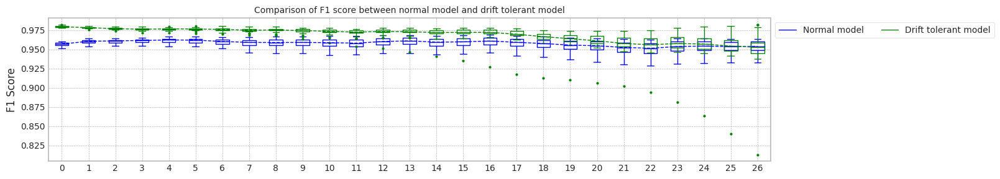

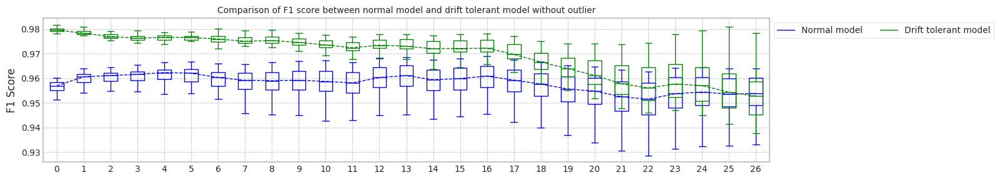

max_mean_trial= 4


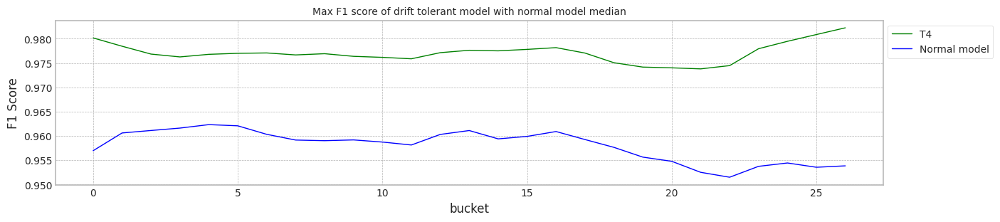

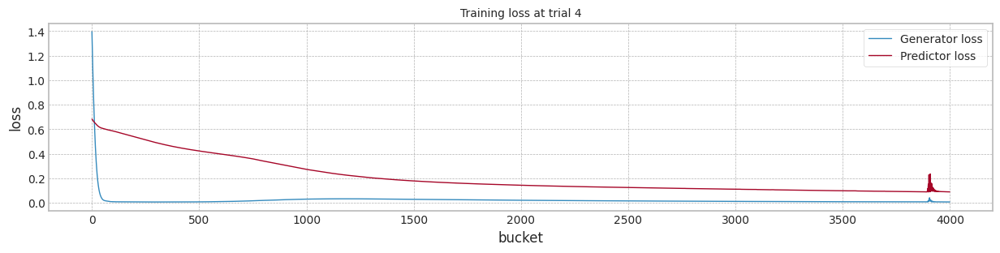

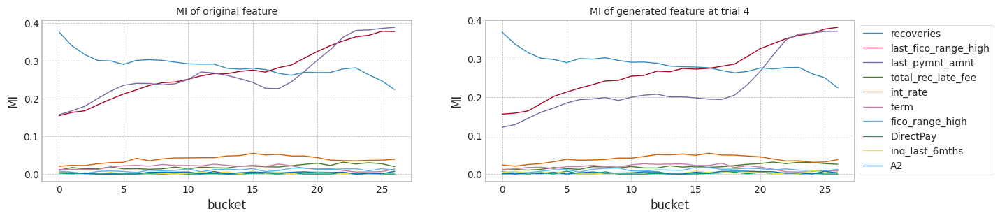

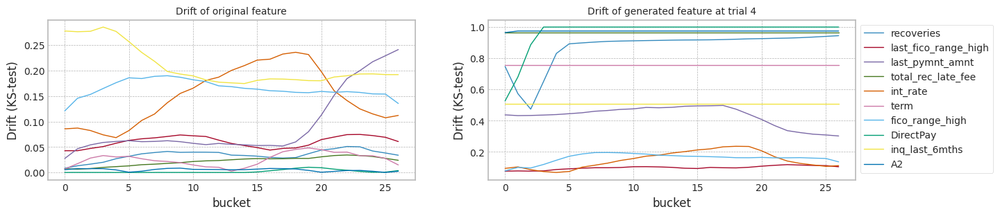

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.959149,0.959149,0.965273,0.963275
1,1.0,0.957003,0.957003,0.959914,0.957251
2,2.0,0.951449,0.951449,0.942941,0.933161
3,3.0,0.958559,0.958559,0.965154,0.963867
4,4.0,0.958210,0.958210,0.959178,0.953540
5,5.0,0.955162,0.955162,0.950525,0.944047
6,6.0,0.955123,0.955123,0.955153,0.950330
7,7.0,0.960235,0.960235,0.965156,0.960768
8,8.0,0.956931,0.956931,0.961620,0.959972
9,9.0,0.956836,0.956836,0.956961,0.953044


,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.979841,0.979841,0.972787,0.957734
1,1.0,0.980534,0.980534,0.973828,0.961313
2,2.0,0.981772,0.981772,0.969177,0.951185
3,3.0,0.979625,0.979625,0.969276,0.953299
4,4.0,0.980157,0.980157,0.977099,0.982236
5,5.0,0.978914,0.978914,0.964420,0.939823
6,6.0,0.980056,0.980056,0.933369,0.813001
7,7.0,0.978813,0.978813,0.967159,0.945514
8,8.0,0.979903,0.979903,0.962315,0.937660
9,9.0,0.980178,0.980178,0.972314,0.956059


In [196]:
_,_,_,_,_,_ = drift_tolerant(X1, Y1,train_size, test_size,avaible_range = 400,trial_count=20)

trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 596.19it/s]


Test f1 score: 0.9591493451880332
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.28it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9652732326634791
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.07it/s]


Test f1 score: 0.9798406566875906
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


mean of drift:
recoveries              0.904355
last_fico_range_high    0.205796
last_pymnt_amnt         0.304509
total_rec_late_fee      0.917394
int_rate                0.139934
term                    0.755281
fico_range_high         0.110950
DirectPay               1.000000
inq_last_6mths          0.506327
A2                      0.930852
dtype: float64
Mean F1 for all data: 0.9727874131675023
Normal model mean        : 0.9652732326634791
Drift tolerant model mean: 0.9727874131675023
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 593.89it/s]


Test f1 score: 0.9570027508671213
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.27it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9599139088650943
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.26it/s]


Test f1 score: 0.9805339601036582
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


mean of drift:
recoveries              0.876466
last_fico_range_high    0.095817
last_pymnt_amnt         0.317584
total_rec_late_fee      0.911600
int_rate                0.145636
term                    0.728892
fico_range_high         0.094072
DirectPay               1.000000
inq_last_6mths          0.501973
A2                      0.927131
dtype: float64
Mean F1 for all data: 0.973827610688149
Normal model mean        : 0.9625935707642868
Drift tolerant model mean: 0.9733075119278256
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 594.34it/s]


Test f1 score: 0.9514494461465944
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.27it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9429407095465321
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.43it/s]


Test f1 score: 0.9817720907774021
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.30it/s]


mean of drift:
recoveries              0.774505
last_fico_range_high    0.099168
last_pymnt_amnt         0.314328
total_rec_late_fee      0.918563
int_rate                0.145594
term                    0.728892
fico_range_high         0.100775
DirectPay               0.954559
inq_last_6mths          0.552810
A2                      0.911192
dtype: float64
Mean F1 for all data: 0.9691768898087365
Normal model mean        : 0.9560426170250352
Drift tolerant model mean: 0.9719306378881293
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 587.25it/s]


Test f1 score: 0.9585585585585586
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.28it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9651544234710577
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.14it/s]


Test f1 score: 0.9796250037620007
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.29it/s]


mean of drift:
recoveries              0.850274
last_fico_range_high    0.225111
last_pymnt_amnt         0.312241
total_rec_late_fee      0.966117
int_rate                0.139920
term                    0.755281
fico_range_high         0.094172
DirectPay               0.998586
inq_last_6mths          0.506327
A2                      0.974588
dtype: float64
Mean F1 for all data: 0.9692761957662908
Normal model mean        : 0.9583205686365409
Drift tolerant model mean: 0.9712670273576696
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 587.03it/s]


Test f1 score: 0.9582102908277405
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.27it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.959177872909874
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.31it/s]


Test f1 score: 0.9801571768389992
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


mean of drift:
recoveries              0.870446
last_fico_range_high    0.098874
last_pymnt_amnt         0.431790
total_rec_late_fee      0.966117
int_rate                0.148502
term                    0.755281
fico_range_high         0.160355
DirectPay               0.966425
inq_last_6mths          0.506327
A2                      0.974217
dtype: float64
Mean F1 for all data: 0.9770987438687776
Normal model mean        : 0.9584920294912076
Drift tolerant model mean: 0.9724333706598912
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 601.84it/s]


Test f1 score: 0.9551618742395918
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.29it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9505252223162556
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.45it/s]


Test f1 score: 0.9789141224244247
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


mean of drift:
recoveries              0.798373
last_fico_range_high    0.191659
last_pymnt_amnt         0.468607
total_rec_late_fee      0.919001
int_rate                0.135180
term                    0.755281
fico_range_high         0.153782
DirectPay               1.000000
inq_last_6mths          0.506327
A2                      0.885526
dtype: float64
Mean F1 for all data: 0.9644202360876629
Normal model mean        : 0.9571642282953823
Drift tolerant model mean: 0.9710978482311865
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 597.63it/s]


Test f1 score: 0.9551226765799257
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.29it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9551528700777276
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.90it/s]


Test f1 score: 0.9800561204477567
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


mean of drift:
recoveries              0.893803
last_fico_range_high    0.364379
last_pymnt_amnt         0.345467
total_rec_late_fee      0.939952
int_rate                0.148747
term                    0.755281
fico_range_high         0.147404
DirectPay               1.000000
inq_last_6mths          0.506327
A2                      0.974588
dtype: float64
Mean F1 for all data: 0.9333690342116375
Normal model mean        : 0.9568768914071458
Drift tolerant model mean: 0.9657080176569652
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 603.77it/s]


Test f1 score: 0.9602352870562108
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.29it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9651562838377787
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.29it/s]


Test f1 score: 0.9788129226145755
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


mean of drift:
recoveries              0.859636
last_fico_range_high    0.204967
last_pymnt_amnt         0.358992
total_rec_late_fee      0.897310
int_rate                0.154348
term                    0.755281
fico_range_high         0.108186
DirectPay               0.997955
inq_last_6mths          0.506327
A2                      0.974588
dtype: float64
Mean F1 for all data: 0.9671586017076952
Normal model mean        : 0.9579118154609749
Drift tolerant model mean: 0.9658893406633065
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 574.02it/s]


Test f1 score: 0.9569306337606326
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.28it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9616199343115045
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.64it/s]


Test f1 score: 0.9799025212106625
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.32it/s]


mean of drift:
recoveries              0.788353
last_fico_range_high    0.135238
last_pymnt_amnt         0.301226
total_rec_late_fee      0.912143
int_rate                0.150212
term                    0.755281
fico_range_high         0.169841
DirectPay               0.952841
inq_last_6mths          0.506327
A2                      0.878224
dtype: float64
Mean F1 for all data: 0.96231497452356
Normal model mean        : 0.9583238286665894
Drift tolerant model mean: 0.9654921888700012
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 607.35it/s]


Test f1 score: 0.9568358208955223
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.28it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.956961253855341
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.72it/s]


Test f1 score: 0.9801783347391252
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


mean of drift:
recoveries              0.848850
last_fico_range_high    0.212193
last_pymnt_amnt         0.383069
total_rec_late_fee      0.930349
int_rate                0.145087
term                    0.682703
fico_range_high         0.094524
DirectPay               0.956533
inq_last_6mths          0.482784
A2                      0.884550
dtype: float64
Mean F1 for all data: 0.9723138143328806
Normal model mean        : 0.9581875711854646
Drift tolerant model mean: 0.9661743514162892
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 598.09it/s]


Test f1 score: 0.9568515034787543
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.29it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9581258822291838
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.33it/s]


Test f1 score: 0.9781153372759749
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


mean of drift:
recoveries              0.831176
last_fico_range_high    0.103744
last_pymnt_amnt         0.451421
total_rec_late_fee      0.881880
int_rate                0.149283
term                    0.760435
fico_range_high         0.169248
DirectPay               0.997955
inq_last_6mths          0.489904
A2                      0.928715
dtype: float64
Mean F1 for all data: 0.9632343383159262
Normal model mean        : 0.95818196309853
Drift tolerant model mean: 0.9659070774980744
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 609.67it/s]


Test f1 score: 0.9572068039391227
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.29it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9580125372589416
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.33it/s]


Test f1 score: 0.9795390262983691
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.32it/s]


mean of drift:
recoveries              0.866220
last_fico_range_high    0.210121
last_pymnt_amnt         0.322680
total_rec_late_fee      0.929291
int_rate                0.151471
term                    0.755281
fico_range_high         0.139794
DirectPay               0.954489
inq_last_6mths          0.506327
A2                      0.974588
dtype: float64
Mean F1 for all data: 0.9682886901389262
Normal model mean        : 0.9581678442785643
Drift tolerant model mean: 0.9661055452181454
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 604.01it/s]


Test f1 score: 0.9569853822190272
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.29it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9610843668161125
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.59it/s]


Test f1 score: 0.9792933245049058
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


mean of drift:
recoveries              0.858075
last_fico_range_high    0.110055
last_pymnt_amnt         0.321509
total_rec_late_fee      0.915156
int_rate                0.143257
term                    0.755281
fico_range_high         0.095888
DirectPay               0.997955
inq_last_6mths          0.506327
A2                      0.922331
dtype: float64
Mean F1 for all data: 0.9707540818557087
Normal model mean        : 0.958392192166068
Drift tolerant model mean: 0.9664631249594964
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 607.39it/s]


Test f1 score: 0.9512730725859101
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.28it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9485234918588645
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.48it/s]


Test f1 score: 0.9786683515359389
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


mean of drift:
recoveries              0.826677
last_fico_range_high    0.097169
last_pymnt_amnt         0.321463
total_rec_late_fee      0.911076
int_rate                0.146052
term                    0.755281
fico_range_high         0.169401
DirectPay               0.997955
inq_last_6mths          0.506327
A2                      0.886595
dtype: float64
Mean F1 for all data: 0.9672082675692947
Normal model mean        : 0.9576872850012678
Drift tolerant model mean: 0.9665163494316248
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 598.31it/s]


Test f1 score: 0.958810480244619
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.30it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9629100609199057
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.38it/s]


Test f1 score: 0.9791378584741177
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


mean of drift:
recoveries              0.874978
last_fico_range_high    0.111035
last_pymnt_amnt         0.317257
total_rec_late_fee      0.918022
int_rate                0.152192
term                    0.755281
fico_range_high         0.165189
DirectPay               0.953783
inq_last_6mths          0.506327
A2                      0.974588
dtype: float64
Mean F1 for all data: 0.9692165225284783
Normal model mean        : 0.9580354700625103
Drift tolerant model mean: 0.9666963609714151
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 613.87it/s]


Test f1 score: 0.9551918433056078
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.28it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9551167494336071
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.58it/s]


Test f1 score: 0.979532867806405
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.29it/s]


mean of drift:
recoveries              0.879877
last_fico_range_high    0.196412
last_pymnt_amnt         0.441493
total_rec_late_fee      0.938326
int_rate                0.148303
term                    0.755281
fico_range_high         0.099817
DirectPay               0.953582
inq_last_6mths          0.506327
A2                      0.974588
dtype: float64
Mean F1 for all data: 0.9751985237668044
Normal model mean        : 0.9578530500232038
Drift tolerant model mean: 0.9672277461461269
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 606.29it/s]


Test f1 score: 0.9551733357098298
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.29it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9512851194699601
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.93it/s]


Test f1 score: 0.9805681920886933
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


mean of drift:
recoveries              0.892085
last_fico_range_high    0.124927
last_pymnt_amnt         0.310538
total_rec_late_fee      0.964687
int_rate                0.141766
term                    0.755281
fico_range_high         0.153296
DirectPay               0.989657
inq_last_6mths          0.506327
A2                      0.912436
dtype: float64
Mean F1 for all data: 0.9745689915537775
Normal model mean        : 0.9574667011671306
Drift tolerant model mean: 0.9676595841112828
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 603.54it/s]


Test f1 score: 0.9591029023746702
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.29it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9642192336150485
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.79it/s]


Test f1 score: 0.9796041152758559
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.30it/s]


mean of drift:
recoveries              0.853728
last_fico_range_high    0.204361
last_pymnt_amnt         0.328933
total_rec_late_fee      0.928212
int_rate                0.147025
term                    0.755281
fico_range_high         0.136095
DirectPay               0.907881
inq_last_6mths          0.506327
A2                      0.974588
dtype: float64
Mean F1 for all data: 0.9672717215568731
Normal model mean        : 0.9578418418586815
Drift tolerant model mean: 0.9676380361915934
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 604.10it/s]


Test f1 score: 0.9580017288145697
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.29it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9568679323878553
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.60it/s]


Test f1 score: 0.9823628895868568
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


mean of drift:
recoveries              0.869855
last_fico_range_high    0.149606
last_pymnt_amnt         0.333792
total_rec_late_fee      0.915284
int_rate                0.150055
term                    0.737037
fico_range_high         0.100341
DirectPay               0.987357
inq_last_6mths          0.529740
A2                      0.931502
dtype: float64
Mean F1 for all data: 0.9718038205415687
Normal model mean        : 0.9577905834654801
Drift tolerant model mean: 0.9678572879994869
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 598.86it/s]


Test f1 score: 0.9487814952498969
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.29it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9417037594265394
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:29<00:00, 134.62it/s]


Test f1 score: 0.9788986413370204
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


mean of drift:
recoveries              0.854123
last_fico_range_high    0.219768
last_pymnt_amnt         0.468657
total_rec_late_fee      0.911016
int_rate                0.152292
term                    0.755281
fico_range_high         0.169480
DirectPay               1.000000
inq_last_6mths          0.506327
A2                      0.960432
dtype: float64
Mean F1 for all data: 0.9755011136493439
Normal model mean        : 0.956986242263533
Drift tolerant model mean: 0.9682394792819797
######################### Trial 0 for Normal model ###########################
retrain_interval: 14
######################### Trial 0 for SEA ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.26it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9670757044057666
SEA mean: 0.9670757044057666
######################### Trial 0 for DTEL ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.24it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9701279171565583
DTEL mean: 0.9701279171565583
######################### Trial 1 for Normal model ###########################
retrain_interval: 14
######################### Trial 1 for SEA ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.26it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9635274731160101
SEA mean: 0.9653015887608883
######################### Trial 1 for DTEL ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.23it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.967873538130061
DTEL mean: 0.9690007276433097
######################### Trial 2 for Normal model ###########################
retrain_interval: 14
######################### Trial 2 for SEA ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.27it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9515195491469397
SEA mean: 0.9607075755562388
######################### Trial 2 for DTEL ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.24it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9608959054534241
DTEL mean: 0.9662991202466812
######################### Trial 3 for Normal model ###########################
retrain_interval: 14
######################### Trial 3 for SEA ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.26it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9658711293065304
SEA mean: 0.9619984639938116
######################### Trial 3 for DTEL ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.23it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9675963563531225
DTEL mean: 0.9666234292732915
######################### Trial 4 for Normal model ###########################
retrain_interval: 14
######################### Trial 4 for SEA ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.26it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9641244651620949
SEA mean: 0.9624236642274683
######################### Trial 4 for DTEL ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.23it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9681902632137037
DTEL mean: 0.966936796061374
######################### Trial 5 for Normal model ###########################
retrain_interval: 14
######################### Trial 5 for SEA ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.26it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9579016075700132
SEA mean: 0.9616699881178925
######################### Trial 5 for DTEL ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.24it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.964391194960389
DTEL mean: 0.9665125292112098
######################### Trial 6 for Normal model ###########################
retrain_interval: 14
######################### Trial 6 for SEA ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.26it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9598347646782993
SEA mean: 0.9614078133408077
######################### Trial 6 for DTEL ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.23it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9657584990601066
DTEL mean: 0.9664048106181949
######################### Trial 7 for Normal model ###########################
retrain_interval: 14
######################### Trial 7 for SEA ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.25it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9664980031214592
SEA mean: 0.9620440870633892
######################### Trial 7 for DTEL ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.24it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.970687460189704
DTEL mean: 0.9669401418146337
######################### Trial 8 for Normal model ###########################
retrain_interval: 14
######################### Trial 8 for SEA ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.26it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.964915006353619
SEA mean: 0.9623630780956369
######################### Trial 8 for DTEL ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.23it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9682475985654699
DTEL mean: 0.967085414786949
######################### Trial 9 for Normal model ###########################
retrain_interval: 14
######################### Trial 9 for SEA ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.26it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9624889318812753
SEA mean: 0.9623756634742007
######################### Trial 9 for DTEL ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.24it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9666843246441427
DTEL mean: 0.9670453057726685
######################### Trial 10 for Normal model ###########################
retrain_interval: 14
######################### Trial 10 for SEA ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.26it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9631030921344292
SEA mean: 0.9624417933524033
######################### Trial 10 for DTEL ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:22<00:00,  1.22it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9666183159569195
DTEL mean: 0.9670064885166912
######################### Trial 11 for Normal model ###########################
retrain_interval: 14
######################### Trial 11 for SEA ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.26it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9606134378009696
SEA mean: 0.9622894303897839
######################### Trial 11 for DTEL ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.24it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9674384062120291
DTEL mean: 0.9670424816579694
######################### Trial 12 for Normal model ###########################
retrain_interval: 14
######################### Trial 12 for SEA ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.26it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9648357147427211
SEA mean: 0.9624852984169329
######################### Trial 12 for DTEL ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.23it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9674056292657822
DTEL mean: 0.9670704160893396
######################### Trial 13 for Normal model ###########################
retrain_interval: 14
######################### Trial 13 for SEA ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.26it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9563294848710612
SEA mean: 0.9620455974493706
######################### Trial 13 for DTEL ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.23it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9621161825325869
DTEL mean: 0.9667165422638572
######################### Trial 14 for Normal model ###########################
retrain_interval: 14
######################### Trial 14 for SEA ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.26it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9635070570868244
SEA mean: 0.9621430280918675
######################### Trial 14 for DTEL ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.23it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.969121861565632
DTEL mean: 0.9668768968839756
######################### Trial 15 for Normal model ###########################
retrain_interval: 14
######################### Trial 15 for SEA ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.26it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9602728787102754
SEA mean: 0.962026143755518
######################### Trial 15 for DTEL ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.23it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9655598320753527
DTEL mean: 0.9667945803334366
######################### Trial 16 for Normal model ###########################
retrain_interval: 14
######################### Trial 16 for SEA ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.26it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9559120834831337
SEA mean: 0.9616664931512602
######################### Trial 16 for DTEL ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.23it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9646378185616151
DTEL mean: 0.9666677119939178
######################### Trial 17 for Normal model ###########################
retrain_interval: 14
######################### Trial 17 for SEA ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.26it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9663781083079025
SEA mean: 0.9619282495488515
######################### Trial 17 for DTEL ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.24it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9693285587996067
DTEL mean: 0.966815536816456
######################### Trial 18 for Normal model ###########################
retrain_interval: 14
######################### Trial 18 for SEA ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.26it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9622398988101059
SEA mean: 0.9619446521415491
######################### Trial 18 for DTEL ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.24it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9664247445602255
DTEL mean: 0.9667949688029701
######################### Trial 19 for Normal model ###########################
retrain_interval: 14
######################### Trial 19 for SEA ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.26it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9516202694954314
SEA mean: 0.9614284330092433
######################### Trial 19 for DTEL ###########################
X_live.shape (123968, 11)
Truncate 15968 rows from live_set (123968, 11)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 11])


100%|██████████| 27/27 [00:21<00:00,  1.24it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
term                    0.025793
fico_range_high         0.164209
DirectPay               0.002045
inq_last_6mths          0.208648
A2                      0.004955
dtype: float64
Mean F1 for all data: 0.9603359636086954
DTEL mean: 0.9664720185432565


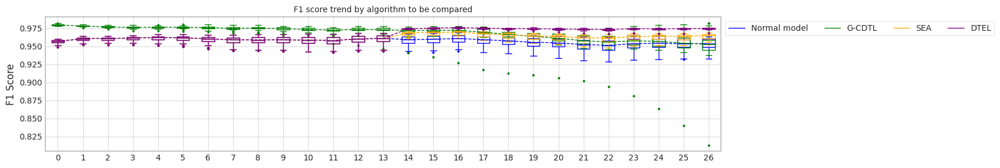

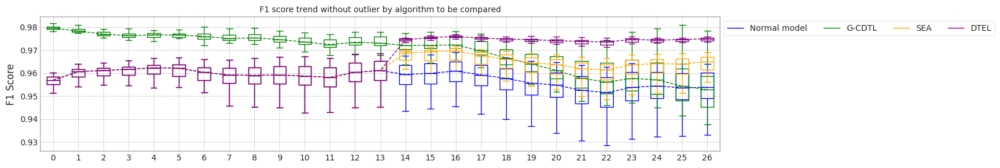

max_mean_trial= 9


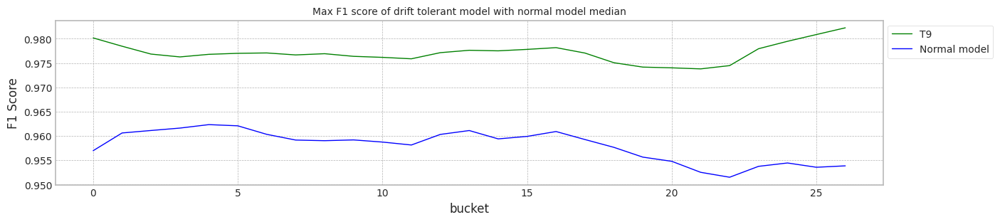

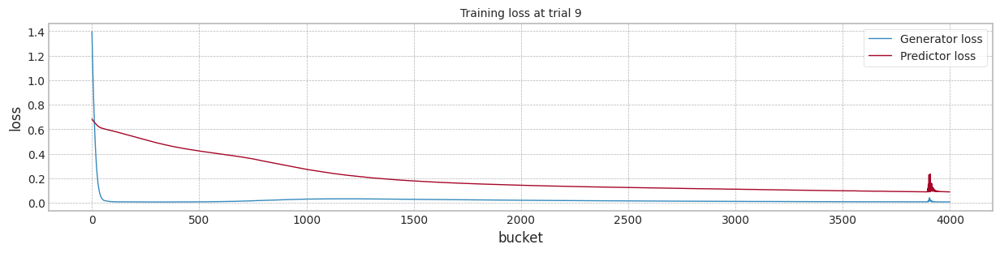

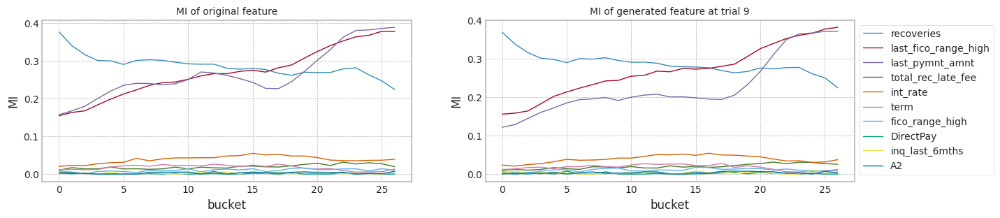

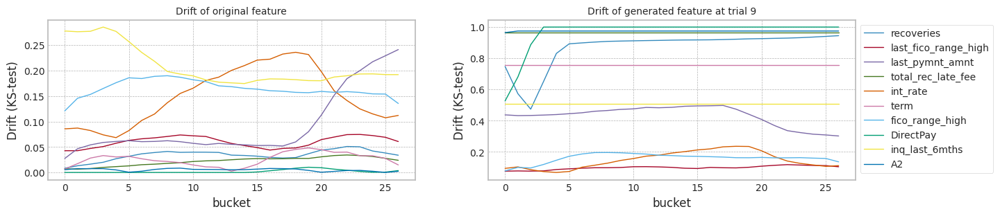

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.959149,0.962542,0.965273,0.963275
1,1.0,0.957003,0.960712,0.959914,0.957251
2,2.0,0.951449,0.955319,0.942941,0.933161
3,3.0,0.958559,0.962221,0.965154,0.963867
4,4.0,0.958210,0.961296,0.959178,0.953540
5,5.0,0.955162,0.958278,0.950525,0.944047
6,6.0,0.955123,0.958269,0.955153,0.950330
7,7.0,0.960235,0.964072,0.965156,0.960768
8,8.0,0.956931,0.960809,0.961620,0.959972
9,9.0,0.956836,0.959923,0.956961,0.953044


,Trial,test_f1,init_f1,mean_f1,last_f1
0,1.0,0.979841,0.979180,0.972787,0.957734
1,3.0,0.980534,0.979217,0.973828,0.961313
2,5.0,0.981772,0.980038,0.969177,0.951185
3,7.0,0.979625,0.978599,0.969276,0.953299
4,9.0,0.980157,0.978448,0.977099,0.982236
5,11.0,0.978914,0.977687,0.964420,0.939823
6,13.0,0.980056,0.979136,0.933369,0.813001
7,15.0,0.978813,0.977819,0.967159,0.945514
8,17.0,0.979903,0.978118,0.962315,0.937660
9,19.0,0.980178,0.979236,0.972314,0.956059


,Trial,test_f1,init_f1,mean_f1,last_f1
0,1.0,0.959149,0.962542,0.967076,0.969027
1,3.0,0.957003,0.960712,0.963527,0.965832
2,5.0,0.951449,0.955319,0.951520,0.952946
3,7.0,0.958559,0.962221,0.965871,0.967074
4,9.0,0.958210,0.961296,0.964124,0.967021
5,11.0,0.955162,0.958278,0.957902,0.960834
6,13.0,0.955123,0.958269,0.959835,0.961776
7,15.0,0.960235,0.964072,0.966498,0.966735
8,17.0,0.956931,0.960809,0.964915,0.967607
9,19.0,0.956836,0.959923,0.962489,0.965528


,Trial,test_f1,init_f1,mean_f1,last_f1
0,1.0,0.959149,0.962542,0.970128,0.975489
1,3.0,0.957003,0.960712,0.967874,0.975394
2,5.0,0.951449,0.955319,0.960896,0.974183
3,7.0,0.958559,0.962221,0.967596,0.968010
4,9.0,0.958210,0.961296,0.968190,0.975423
5,11.0,0.955162,0.958278,0.964391,0.974926
6,13.0,0.955123,0.958269,0.965758,0.974661
7,15.0,0.960235,0.964072,0.970687,0.975745
8,17.0,0.956931,0.960809,0.968248,0.975015
9,19.0,0.956836,0.959923,0.966684,0.975144


In [197]:
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 400,trial_count=20)